In [1]:
import numpy
import scipy.special
import matplotlib.pyplot
%matplotlib inline
from skimage import transform,io
import glob

In [2]:
# neural network class definition
class neuralNetwork:
    
    
    # initialise the neural network
    def __init__(self, inputnodes, hiddennodes, outputnodes, learningrate):
        # set number of nodes in each input, hidden, output layer
        self.inodes = inputnodes
        self.hnodes = hiddennodes
        self.onodes = outputnodes
        
        # link weight matrices, wih and who
        # weights inside the arrays are w_i_j, where link is from node i to node j in the next layer
        # w11 w21
        # w12 w22 etc 
        self.wih = numpy.random.normal(0.0, pow(self.inodes, -0.5), (self.hnodes, self.inodes))
        self.who = numpy.random.normal(0.0, pow(self.hnodes, -0.5), (self.onodes, self.hnodes))

        # learning rate
        self.lr = learningrate
        
        # activation function is the sigmoid function
        self.activation_function = lambda x: scipy.special.expit(x)
        
        pass

    
    # train the neural network
    def train(self, inputs_list, targets_list):
        # convert inputs list to 2d array
        inputs = numpy.array(inputs_list, ndmin=2).T
        targets = numpy.array(targets_list, ndmin=2).T
        
        # calculate signals into hidden layer
        hidden_inputs = numpy.dot(self.wih, inputs)
        # calculate the signals emerging from hidden layer
        hidden_outputs = self.activation_function(hidden_inputs)
        
        # calculate signals into final output layer
        final_inputs = numpy.dot(self.who, hidden_outputs)
        # calculate the signals emerging from final output layer
        final_outputs = self.activation_function(final_inputs)
        
        # output layer error is the (target - actual)
        output_errors = targets - final_outputs
        # hidden layer error is the output_errors, split by weights, recombined at hidden nodes
        hidden_errors = numpy.dot(self.who.T, output_errors) 
        
        # update the weights for the links between the hidden and output layers
        self.who += self.lr * numpy.dot((output_errors * final_outputs * (1.0 - final_outputs)), numpy.transpose(hidden_outputs))
        
        # update the weights for the links between the input and hidden layers
        self.wih += self.lr * numpy.dot((hidden_errors * hidden_outputs * (1.0 - hidden_outputs)), numpy.transpose(inputs))
        
        pass

    
    # query the neural network
    def query(self, inputs_list):
        # convert inputs list to 2d array
        inputs = numpy.array(inputs_list, ndmin=2).T
        
        # calculate signals into hidden layer
        hidden_inputs = numpy.dot(self.wih, inputs)
        # calculate the signals emerging from hidden layer
        hidden_outputs = self.activation_function(hidden_inputs)
        
        # calculate signals into final output layer
        final_inputs = numpy.dot(self.who, hidden_outputs)
        # calculate the signals emerging from final output layer
        final_outputs = self.activation_function(final_inputs)
        
        return final_outputs

In [3]:
# number of input, hidden and output nodes
input_nodes = 784
hidden_nodes = 200
# output_nodes = 10
# summer 12 + winter 12 + other 1
output_nodes = 25

# learning rate
learning_rate = 0.1

# create instance of neural network
n = neuralNetwork(input_nodes,hidden_nodes,output_nodes, learning_rate)

In [4]:
train_dataset = []
for image_file_name in glob.glob('./DATA/TRAIN_large/*/*'):
    # print(image_file_name)
    line = str(image_file_name[19:])
    line = line[:line.find('/')]
    # print(line)
    if line  == "FRONTNANAMEFIT": label = 0
    elif line  == "FRONTTATEFAR": label = 1
    elif line  == "FRONTTATEFITBOTTOM": label = 2
    elif line  == "FRONTTATEFITCENTER": label = 3
    elif line  == "FRONTTATEFITLEFT": label = 4
    elif line  == "FRONTTATEFITRIGHT": label = 5
    elif line  == "FRONTTATEFITTOP": label = 6
    elif line  == "FRONTTATEJUSTCENTER": label = 7
    elif line  == "FRONTTATENEAR": label = 8
    elif line  == "FRONTYOKOFAR": label = 9
    elif line  == "FRONTYOKOFIT": label = 10
    elif line  == "NANAMETATEFIT": label = 11
    elif line  == "WINTERFRONTNANAMEFIT": label = 12
    elif line  == "WINTERFRONTTATEFAR": label = 13
    elif line  == "WINTERFRONTTATEFITBOTTOM": label = 14
    elif line  == "WINTERFRONTTATEFITCENTER": label = 15
    elif line  == "WINTERFRONTTATEFITLEFT": label = 16
    elif line  == "WINTERFRONTTATEFITRIGHT": label = 17
    elif line  == "WINTERFRONTTATEFITTOP": label = 18
    elif line  == "WINTERFRONTTATEJUSTCENTER": label = 19
    elif line  == "WINTERFRONTTATENEAR": label = 20
    elif line  == "WINTERFRONTYOKOFAR": label = 21
    elif line  == "WINTERFRONTYOKOFIT": label = 22
    elif line  == "WINTERNANAMETATEFIT": label = 23
    else: label = 24
    #print(label)
    img = transform.resize(io.imread(image_file_name, as_gray=True), (28, 28), mode='symmetric', preserve_range=True)
    img_data = img.reshape(784)
    img_data = (img_data / 255.0 * 0.99) + 0.01
    # print(numpy.min(img_data))
    # print(numpy.max(img_data))
    record = numpy.append(label,img_data)
    train_dataset.append(record)
    print(str(len(train_dataset) - 1) + ", " + str(label) + ", " + image_file_name)
    pass

0, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/17064023044_57951e7e59_z.jpg.jpg
1, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/14652853751_596e01e105_z.jpg.jpg
2, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/15076410302_7b7040fe75_z.jpg.jpg
3, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/19256341990_faeab156ec_z.jpg.jpg
4, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/10478923783_fe2b80837d_z.jpg.jpg
5, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/28957776_fb7a1c23dd_z.jpg?zz=1.jpg
6, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/7022940545_fe219551ed_z.jpg.jpg
7, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/9113174094_8b34d9864f_z.jpg.jpg
8, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/15092831677_39dee2bde1_z.jpg.jpg
9, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/2150816303_096f975ebb_z.jpg.jpg
10, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/10335971416_810910c7ed_z.jpg.jpg
11, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/4839122054_2eea48bd4e_z.jpg.jpg
12, 

104, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/4709694941_be2b044a71_z.jpg.jpg
105, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/4612887048_0ba8a7cd9c_z.jpg.jpg
106, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/14108138697_c5f63c905c_z.jpg.jpg
107, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/6960839006_426b34d249_z.jpg.jpg
108, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/6802790350_0c39e16a0e_z.jpg.jpg
109, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/303892340_786f569d88_z.jpg?zz=1.jpg
110, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/7716711904_5c95c95693_z.jpg.jpg
111, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/5179838668_6d286e2496_z.jpg.jpg
112, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/14815986759_7e8cabd866_z.jpg.jpg
113, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/3385364239_fd797bc38e_z.jpg?zz=1.jpg
114, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/14703217260_61f1018dbb_z.jpg.jpg
115, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/7503296432_6

207, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/16268136098_30d6516726_z.jpg.jpg
208, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/3245343846_6b62ae11c0_z.jpg?zz=1.jpg
209, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/907943014_a09d9da71a_z.jpg.jpg
210, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/19465502219_5ecdb1b84d_z.jpg.jpg
211, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/5826589656_7b5bcc2ae1_z.jpg.jpg
212, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/5663819456_46c245f662_z.jpg.jpg
213, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/7765874964_8d2e74dd7f_z.jpg.jpg
214, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/16141918481_ed10a937ca_z.jpg.jpg
215, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/9847441755_dbd480ca6d_z.jpg.jpg
216, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/8026938775_8d422d9b58_z.jpg.jpg
217, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/16498956444_1a843af7db_z.jpg.jpg
218, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/19276232410_205c

316, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/7311767076_fcac9da73d_z.jpg.jpg
317, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/4379133376_45f1646e16_z.jpg.jpg
318, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/15834475177_3623bd1c2d_z.jpg.jpg
319, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/18807925352_063985603a_z.jpg.jpg
320, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/3820627650_fe79a289a9_z.jpg.jpg
321, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/108079472_1da3c69551_z.jpg?zz=1.jpg
322, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/3105165657_9ddd4a3210_z.jpg.jpg
323, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/14101963305_46f8019b09_z.jpg.jpg
324, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/12038446584_732d219ec7_z.jpg.jpg
325, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/14540090276_0663c44876_z.jpg.jpg
326, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/14552899533_425c66b28c_z.jpg.jpg
327, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/4482140129_898

427, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/5729382401_b652bae6f2_z.jpg.jpg
428, 24, ./DATA/TRAIN_large/02838_Human_leg_resized/8739630548_3ff3707b38_z.jpg.jpg
429, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/18749638040_2e880ce22d_z.jpg.jpg
430, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/15023903473_ce5308340c_z.jpg.jpg
431, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/16129702312_4456fc3c45_z.jpg.jpg
432, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/8460562526_b927c7f31a_z.jpg.jpg
433, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/3206301537_8aa35c472c_z.jpg.jpg
434, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/2739146951_92ebb9e3c0_z.jpg.jpg
435, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/2187946537_c5e0480f9c_z.jpg.jpg
436, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/15292763106_c93dc69115_z.jpg.jpg
437, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/171179756_8f9f579d7a_z.jpg?zz=1.jpg
438, 24, ./DATA/TRAIN_large/0048

528, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/7875998750_91a3ac9b0c_z.jpg.jpg
529, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/3924331129_dd2def8801_z.jpg.jpg
530, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/15204496751_6d44096c07_z.jpg.jpg
531, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/241105542_a834fe3080_z.jpg.jpg
532, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/15725755932_ae62ec0c5f_z.jpg.jpg
533, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/16891529146_cd8608a5ab_z.jpg.jpg
534, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/19255617508_1bcd6d0318_z.jpg.jpg
535, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/6521980999_3895d758fd_z.jpg.jpg
536, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/2518694155_0c1c48f52b_z.jpg.jpg
537, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/4864808238_26c08a4852_z.jpg.jpg
538, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/6160324609_16002912d0_z.jpg.jpg
539, 24, ./DATA/TRAIN_large/0

632, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/4101877669_bdbb1f96c6_z.jpg.jpg
633, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/2215047236_a2a4310d7f_z.jpg.jpg
634, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/6236395142_d33040b881_z.jpg.jpg
635, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/7840068088_3039c7bf45_z.jpg.jpg
636, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/8296912674_d3f57ecb7d_z.jpg.jpg
637, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/8533412758_f178922bb8_z.jpg.jpg
638, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/7990483987_e05d5e345d_z.jpg.jpg
639, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/19608588120_a2e0657584_z.jpg.jpg
640, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/45995978_153c778e12_z.jpg.jpg
641, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/8294411927_bd871c3116_z.jpg.jpg
642, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/9056517756_b9a350c40e_z.jpg.jpg
643, 24, ./DATA/TRAIN_large/00486

730, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/12759851524_8ab9d267d6_z.jpg.jpg
731, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/6166192263_56f18c7c58_z.jpg.jpg
732, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/5613745786_293989f781_z.jpg.jpg
733, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/16696865139_9d90b0b2a9_z.jpg.jpg
734, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/13775483983_b55055a303_z.jpg.jpg
735, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/12023511133_d36e6f216f_z.jpg.jpg
736, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/2652248241_44c72eccf2_z.jpg.jpg
737, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/190179842_b989449ef8_z.jpg?zz=1.jpg
738, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/5955698859_d80a40e801_z.jpg.jpg
739, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/11174054136_9dc7c51fca_z.jpg.jpg
740, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/13374829254_974fb86a80_z.jpg.jpg
741, 24, ./DATA/TRAIN_

834, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/6060425215_9d438c5db2_z.jpg.jpg
835, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/5826228945_b3f45a546e_z.jpg.jpg
836, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/3801956908_8f5289ba10_z.jpg.jpg
837, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/3877516292_ce64c224b0_z.jpg.jpg
838, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/10116117733_3a317cbfdc_z.jpg.jpg
839, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/8487441749_c536541b2b_z.jpg.jpg
840, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/3175984714_c306b41b42_z.jpg?zz=1.jpg
841, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/6821517523_7a6ea8c767_z.jpg.jpg
842, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/5658780261_2bb72721aa_z.jpg.jpg
843, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/20468267191_14e2d0f31b_z.jpg.jpg
844, 24, ./DATA/TRAIN_large/00486_Bicycle_wheel_resized/8087402044_05e5c51bc2_z.jpg.jpg
845, 24, ./DATA/TRAIN_lar

968, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3055.jpg
969, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_230.jpg
970, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5430.jpg
971, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3041.jpg
972, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1656.jpg
973, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1130.jpg
974, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3727.jpg
975, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4048.jpg
976, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5356.jpg
977, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2439.jpg
978, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_556.jpg
979, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1118.jpg
980, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4060.jpg
981, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2411.jpg
982, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_218.jpg
983, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2377.jpg
984, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5418.jpg


1116, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4920.jpg
1117, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2389.jpg
1118, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3097.jpg
1119, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4713.jpg
1120, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2362.jpg
1121, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2404.jpg
1122, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4075.jpg
1123, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2410.jpg
1124, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4061.jpg
1125, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1119.jpg
1126, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3068.jpg
1127, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4707.jpg
1128, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5419.jpg
1129, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2376.jpg
1130, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_219.jpg
1131, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1657.jpg
1132, 3, ./DATA/TRAIN_large/FRONTTATEFITC

1270, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3320.jpg
1271, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5989.jpg
1272, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1537.jpg
1273, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_179.jpg
1274, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2016.jpg
1275, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5779.jpg
1276, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4467.jpg
1277, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3308.jpg
1278, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1279.jpg
1279, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4301.jpg
1280, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2770.jpg
1281, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4315.jpg
1282, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2764.jpg
1283, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2002.jpg
1284, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4473.jpg
1285, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4498.jpg
1286, 3, ./DATA/TRAIN_large/FRONTTATEFITC

1408, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1325.jpg
1409, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_743.jpg
1410, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5143.jpg
1411, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3532.jpg
1412, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3254.jpg
1413, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5625.jpg
1414, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1443.jpg
1415, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4513.jpg
1416, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2162.jpg
1417, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2604.jpg
1418, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4275.jpg
1419, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2610.jpg
1420, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4261.jpg
1421, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1319.jpg
1422, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3268.jpg
1423, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4507.jpg
1424, 3, ./DATA/TRAIN_large/FRONTTATEFITC

1553, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_408.jpg
1554, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2567.jpg
1555, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_49.jpg
1556, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4102.jpg
1557, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2573.jpg
1558, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2215.jpg
1559, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4664.jpg
1560, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_352.jpg
1561, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4894.jpg
1562, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5552.jpg
1563, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3123.jpg
1564, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1734.jpg
1565, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1052.jpg
1566, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_75.jpg
1567, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3645.jpg
1568, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5234.jpg
1569, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER

1700, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1042.jpg
1701, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5224.jpg
1702, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_424.jpg
1703, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3655.jpg
1704, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5230.jpg
1705, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3899.jpg
1706, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_430.jpg
1707, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3641.jpg
1708, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_71.jpg
1709, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1056.jpg
1710, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1730.jpg
1711, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4648.jpg
1712, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3127.jpg
1713, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4890.jpg
1714, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_356.jpg
1715, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2239.jpg
1716, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTE

1850, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5635.jpg
1851, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3244.jpg
1852, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1453.jpg
1853, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2172.jpg
1854, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4503.jpg
1855, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4265.jpg
1856, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2614.jpg
1857, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4271.jpg
1858, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2600.jpg
1859, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1309.jpg
1860, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5609.jpg
1861, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2166.jpg
1862, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3278.jpg
1863, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4517.jpg
1864, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4098.jpg
1865, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5386.jpg
1866, 3, ./DATA/TRAIN_large/FRONTTATEFIT

2005, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2760.jpg
2006, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4311.jpg
2007, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2774.jpg
2008, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4305.jpg
2009, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4463.jpg
2010, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2012.jpg
2011, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4313.jpg
2012, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2762.jpg
2013, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2004.jpg
2014, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4475.jpg
2015, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2010.jpg
2016, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4461.jpg
2017, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1519.jpg
2018, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4307.jpg
2019, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3468.jpg
2020, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2776.jpg
2021, 3, ./DATA/TRAIN_large/FRONTTATEFIT

2147, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3905.jpg
2148, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1874.jpg
2149, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3093.jpg
2150, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4924.jpg
2151, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1684.jpg
2152, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_584.jpg
2153, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5384.jpg
2154, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_590.jpg
2155, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3939.jpg
2156, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5390.jpg
2157, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1690.jpg
2158, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1848.jpg
2159, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3087.jpg
2160, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2399.jpg
2161, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4930.jpg
2162, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5179.jpg
2163, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

2286, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_546.jpg
2287, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2429.jpg
2288, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3737.jpg
2289, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4058.jpg
2290, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1108.jpg
2291, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2401.jpg
2292, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4070.jpg
2293, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4716.jpg
2294, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3079.jpg
2295, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2367.jpg
2296, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_208.jpg
2297, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5408.jpg
2298, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4702.jpg
2299, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2373.jpg
2300, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2415.jpg
2301, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4064.jpg
2302, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

2433, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2710.jpg
2434, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1219.jpg
2435, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5094.jpg
2436, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_694.jpg
2437, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2923.jpg
2438, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3383.jpg
2439, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1594.jpg
2440, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1580.jpg
2441, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3397.jpg
2442, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2089.jpg
2443, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5080.jpg
2444, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_680.jpg
2445, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2937.jpg
2446, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_858.jpg
2447, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_870.jpg
2448, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5916.jpg
2449, 3, ./DATA/TRAIN_large/FRONTTATEFITCENT

2579, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_938.jpg
2580, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3591.jpg
2581, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5686.jpg
2582, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4598.jpg
2583, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5692.jpg
2584, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2843.jpg
2585, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3585.jpg
2586, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1392.jpg
2587, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_904.jpg
2588, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5862.jpg
2589, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5876.jpg
2590, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_910.jpg
2591, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5877.jpg
2592, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_911.jpg
2593, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_905.jpg
2594, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5863.jpg
2595, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTE

2726, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3625.jpg
2727, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5254.jpg
2728, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_454.jpg
2729, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1032.jpg
2730, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_15.jpg
2731, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5903.jpg
2732, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_865.jpg
2733, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_871.jpg
2734, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5917.jpg
2735, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2088.jpg
2736, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3396.jpg
2737, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1581.jpg
2738, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_859.jpg
2739, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2936.jpg
2740, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_681.jpg
2741, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5081.jpg
2742, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/

2871, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3800.jpg
2872, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4809.jpg
2873, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1971.jpg
2874, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1636.jpg
2875, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4996.jpg
2876, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_250.jpg
2877, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5450.jpg
2878, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3021.jpg
2879, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3747.jpg
2880, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4028.jpg
2881, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5336.jpg
2882, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2459.jpg
2883, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_536.jpg
2884, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1150.jpg
2885, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1144.jpg
2886, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3753.jpg
2887, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

3009, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_735.jpg
3010, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1353.jpg
3011, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1435.jpg
3012, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5653.jpg
3013, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3222.jpg
3014, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3975.jpg
3015, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1804.jpg
3016, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4968.jpg
3017, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1810.jpg
3018, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3961.jpg
3019, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1186.jpg
3020, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3791.jpg
3021, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3949.jpg
3022, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5486.jpg
3023, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4940.jpg
3024, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_286.jpg
3025, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

3158, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5727.jpg
3159, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2048.jpg
3160, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_127.jpg
3161, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1579.jpg
3162, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2070.jpg
3163, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4401.jpg
3164, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4367.jpg
3165, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3408.jpg
3166, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2716.jpg
3167, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_679.jpg
3168, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5079.jpg
3169, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4373.jpg
3170, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2702.jpg
3171, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2064.jpg
3172, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4415.jpg
3173, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5723.jpg
3174, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

3303, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1828.jpg
3304, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5482.jpg
3305, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_282.jpg
3306, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4944.jpg
3307, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3795.jpg
3308, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1182.jpg
3309, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4575.jpg
3310, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2104.jpg
3311, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2662.jpg
3312, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4213.jpg
3313, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5119.jpg
3314, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2676.jpg
3315, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_719.jpg
3316, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3568.jpg
3317, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4207.jpg
3318, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4561.jpg
3319, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

3444, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4776.jpg
3445, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3019.jpg
3446, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2307.jpg
3447, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_268.jpg
3448, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5468.jpg
3449, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3186.jpg
3450, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4831.jpg
3451, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2298.jpg
3452, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1791.jpg
3453, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1949.jpg
3454, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_491.jpg
3455, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5291.jpg
3456, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3838.jpg
3457, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_485.jpg
3458, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5285.jpg
3459, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1785.jpg
3460, 3, ./DATA/TRAIN_large/FRONTTATEFITCEN

3584, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5091.jpg
3585, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2926.jpg
3586, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_849.jpg
3587, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_685.jpg
3588, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5085.jpg
3589, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2932.jpg
3590, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1585.jpg
3591, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3392.jpg
3592, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2503.jpg
3593, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4172.jpg
3594, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4614.jpg
3595, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2265.jpg
3596, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4600.jpg
3597, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2271.jpg
3598, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1778.jpg
3599, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_39.jpg
3600, 3, ./DATA/TRAIN_large/FRONTTATEFITCENT

3741, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1382.jpg
3742, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_914.jpg
3743, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5872.jpg
3744, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5866.jpg
3745, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_900.jpg
3746, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2884.jpg
3747, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3542.jpg
3748, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_733.jpg
3749, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5133.jpg
3750, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1355.jpg
3751, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1433.jpg
3752, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5655.jpg
3753, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3224.jpg
3754, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5641.jpg
3755, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5899.jpg
3756, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3230.jpg
3757, 3, ./DATA/TRAIN_large/FRONTTATEFITCEN

3880, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_848.jpg
3881, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2927.jpg
3882, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5090.jpg
3883, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_690.jpg
3884, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_860.jpg
3885, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5906.jpg
3886, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5912.jpg
3887, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_874.jpg
3888, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5047.jpg
3889, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_647.jpg
3890, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2728.jpg
3891, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3436.jpg
3892, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4359.jpg
3893, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1221.jpg
3894, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1547.jpg
3895, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3350.jpg
3896, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTE

4036, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2447.jpg
4037, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_528.jpg
4038, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1628.jpg
4039, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2321.jpg
4040, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4988.jpg
4041, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4750.jpg
4042, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4963.jpg
4043, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4977.jpg
4044, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1827.jpg
4045, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4787.jpg
4046, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_299.jpg
4047, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5499.jpg
4048, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3956.jpg
4049, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2490.jpg
4050, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1199.jpg
4051, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3942.jpg
4052, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

4175, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3016.jpg
4176, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4779.jpg
4177, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5467.jpg
4178, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2308.jpg
4179, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_267.jpg
4180, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1601.jpg
4181, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1167.jpg
4182, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_501.jpg
4183, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5301.jpg
4184, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3770.jpg
4185, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3837.jpg
4186, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4180.jpg
4187, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1946.jpg
4188, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3189.jpg
4189, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2297.jpg
4190, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2283.jpg
4191, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

4324, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1763.jpg
4325, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_22.jpg
4326, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1005.jpg
4327, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_463.jpg
4328, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5263.jpg
4329, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3612.jpg
4330, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2518.jpg
4331, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_477.jpg
4332, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5277.jpg
4333, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4169.jpg
4334, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3606.jpg
4335, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_36.jpg
4336, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1011.jpg
4337, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1777.jpg
4338, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3160.jpg
4339, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5511.jpg
4340, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER

4469, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_933.jpg
4470, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4593.jpg
4471, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5855.jpg
4472, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2874.jpg
4473, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2860.jpg
4474, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5869.jpg
4475, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2135.jpg
4476, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4544.jpg
4477, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5882.jpg
4478, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4222.jpg
4479, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2653.jpg
4480, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3559.jpg
4481, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4236.jpg
4482, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5128.jpg
4483, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_728.jpg
4484, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2647.jpg
4485, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

4610, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3388.jpg
4611, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5909.jpg
4612, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2900.jpg
4613, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2914.jpg
4614, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4430.jpg
4615, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2041.jpg
4616, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1548.jpg
4617, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_648.jpg
4618, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2727.jpg
4619, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5048.jpg
4620, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4356.jpg
4621, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_890.jpg
4622, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3439.jpg
4623, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2733.jpg
4624, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_884.jpg
4625, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4342.jpg
4626, 3, ./DATA/TRAIN_large/FRONTTATEFITCEN

4765, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_260.jpg
4766, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3011.jpg
4767, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4018.jpg
4768, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3777.jpg
4769, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2469.jpg
4770, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_506.jpg
4771, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5306.jpg
4772, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1160.jpg
4773, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2482.jpg
4774, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3944.jpg
4775, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4795.jpg
4776, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1835.jpg
4777, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1821.jpg
4778, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4781.jpg
4779, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4959.jpg
4780, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2496.jpg
4781, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

4919, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_249.jpg
4920, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5449.jpg
4921, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1968.jpg
4922, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4810.jpg
4923, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3819.jpg
4924, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4804.jpg
4925, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2285.jpg
4926, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1954.jpg
4927, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3825.jpg
4928, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4192.jpg
4929, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_498.jpg
4930, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3831.jpg
4931, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5298.jpg
4932, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4186.jpg
4933, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1798.jpg
4934, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1940.jpg
4935, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

5071, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5259.jpg
5072, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2536.jpg
5073, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_459.jpg
5074, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3628.jpg
5075, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4147.jpg
5076, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_18.jpg
5077, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5271.jpg
5078, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_471.jpg
5079, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3600.jpg
5080, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_30.jpg
5081, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1017.jpg
5082, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1771.jpg
5083, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4609.jpg
5084, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3166.jpg
5085, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_317.jpg
5086, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2278.jpg
5087, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/

5223, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1360.jpg
5224, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2899.jpg
5225, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4230.jpg
5226, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2641.jpg
5227, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1348.jpg
5228, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5648.jpg
5229, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2127.jpg
5230, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3239.jpg
5231, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5890.jpg
5232, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4556.jpg
5233, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2133.jpg
5234, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5884.jpg
5235, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4542.jpg
5236, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4224.jpg
5237, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2655.jpg
5238, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4973.jpg
5239, 3, ./DATA/TRAIN_large/FRONTTATEFIT

5369, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2047.jpg
5370, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_128.jpg
5371, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5728.jpg
5372, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1228.jpg
5373, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2721.jpg
5374, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4350.jpg
5375, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_896.jpg
5376, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1515.jpg
5377, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_173.jpg
5378, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5773.jpg
5379, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3302.jpg
5380, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3464.jpg
5381, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5015.jpg
5382, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_615.jpg
5383, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1273.jpg
5384, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1267.jpg
5385, 3, ./DATA/TRAIN_large/FRONTTATEFITCENT

5515, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4928.jpg
5516, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2381.jpg
5517, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5388.jpg
5518, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3921.jpg
5519, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_588.jpg
5520, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4096.jpg
5521, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1461.jpg
5522, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3276.jpg
5523, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4519.jpg
5524, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5607.jpg
5525, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2168.jpg
5526, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_761.jpg
5527, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5161.jpg
5528, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3510.jpg
5529, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1307.jpg
5530, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1313.jpg
5531, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

5665, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1919.jpg
5666, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4861.jpg
5667, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3868.jpg
5668, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_80.jpg
5669, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_94.jpg
5670, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4875.jpg
5671, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2237.jpg
5672, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_358.jpg
5673, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5558.jpg
5674, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4646.jpg
5675, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3129.jpg
5676, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4120.jpg
5677, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3897.jpg
5678, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2551.jpg
5679, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1058.jpg
5680, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4134.jpg
5681, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTE

5806, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_366.jpg
5807, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2209.jpg
5808, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3103.jpg
5809, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5572.jpg
5810, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_372.jpg
5811, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1714.jpg
5812, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_55.jpg
5813, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1072.jpg
5814, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_414.jpg
5815, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5214.jpg
5816, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3665.jpg
5817, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2553.jpg
5818, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3895.jpg
5819, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4122.jpg
5820, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4644.jpg
5821, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2235.jpg
5822, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTE

5947, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2803.jpg
5948, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4241.jpg
5949, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_987.jpg
5950, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2630.jpg
5951, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1339.jpg
5952, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2156.jpg
5953, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5639.jpg
5954, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4527.jpg
5955, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3248.jpg
5956, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2142.jpg
5957, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4533.jpg
5958, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_993.jpg
5959, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4255.jpg
5960, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2624.jpg
5961, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1305.jpg
5962, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3512.jpg
5963, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

6096, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2988.jpg
6097, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4321.jpg
6098, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1271.jpg
6099, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_617.jpg
6100, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2778.jpg
6101, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5017.jpg
6102, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4309.jpg
6103, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3466.jpg
6104, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3300.jpg
6105, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5771.jpg
6106, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_171.jpg
6107, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1517.jpg
6108, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1503.jpg
6109, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3314.jpg
6110, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5765.jpg
6111, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_165.jpg
6112, 3, ./DATA/TRAIN_large/FRONTTATEFITCEN

6241, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5403.jpg
6242, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_203.jpg
6243, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3072.jpg
6244, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1665.jpg
6245, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1856.jpg
6246, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3099.jpg
6247, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2387.jpg
6248, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3927.jpg
6249, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4090.jpg
6250, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3933.jpg
6251, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4084.jpg
6252, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2393.jpg
6253, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1842.jpg
6254, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4912.jpg
6255, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4906.jpg
6256, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2620.jpg
6257, 3, ./DATA/TRAIN_large/FRONTTATEFITC

6378, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1658.jpg
6379, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1880.jpg
6380, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1894.jpg
6381, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4734.jpg
6382, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2345.jpg
6383, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2423.jpg
6384, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4052.jpg
6385, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_92.jpg
6386, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4873.jpg
6387, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4867.jpg
6388, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_86.jpg
6389, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2580.jpg
6390, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3846.jpg
6391, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1089.jpg
6392, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1937.jpg
6393, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4697.jpg
6394, 3, ./DATA/TRAIN_large/FRONTTATEFITCENT

6527, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5979.jpg
6528, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2970.jpg
6529, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4656.jpg
6530, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3139.jpg
6531, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_348.jpg
6532, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2227.jpg
6533, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5548.jpg
6534, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3887.jpg
6535, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2541.jpg
6536, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4130.jpg
6537, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1048.jpg
6538, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3893.jpg
6539, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2555.jpg
6540, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4124.jpg
6541, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4642.jpg
6542, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2233.jpg
6543, 3, ./DATA/TRAIN_large/FRONTTATEFITC

6665, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4291.jpg
6666, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_957.jpg
6667, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2810.jpg
6668, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5819.jpg
6669, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2804.jpg
6670, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2805.jpg
6671, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2811.jpg
6672, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5818.jpg
6673, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5830.jpg
6674, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3299.jpg
6675, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2187.jpg
6676, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4290.jpg
6677, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_956.jpg
6678, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2839.jpg
6679, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_942.jpg
6680, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4284.jpg
6681, 3, ./DATA/TRAIN_large/FRONTTATEFITCEN

6806, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4657.jpg
6807, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1049.jpg
6808, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4131.jpg
6809, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2540.jpg
6810, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_3886.jpg
6811, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5978.jpg
6812, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2971.jpg
6813, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2965.jpg
6814, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_4482.jpg
6815, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_5944.jpg
6816, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_822.jpg
6817, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2795.jpg
6818, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_1288.jpg
6819, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_836.jpg
6820, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2959.jpg
6821, 3, ./DATA/TRAIN_large/FRONTTATEFITCENTER/aug_2781.jpg
6822, 3, ./DATA/TRAIN_large/FRONTTATEFITCE

6965, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1642.jpg
6966, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_224.jpg
6967, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5424.jpg
6968, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3055.jpg
6969, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_230.jpg
6970, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5430.jpg
6971, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3041.jpg
6972, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1656.jpg
6973, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1130.jpg
6974, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3727.jpg
6975, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4048.jpg
6976, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5356.jpg
6977, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2439.jpg
6978, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_556.jpg
6979, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1118.jpg
6980, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4060.jpg
6981, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2411.jpg
6982, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_218.

7116, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4920.jpg
7117, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2389.jpg
7118, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3097.jpg
7119, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4713.jpg
7120, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2362.jpg
7121, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2404.jpg
7122, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4075.jpg
7123, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2410.jpg
7124, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4061.jpg
7125, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1119.jpg
7126, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3068.jpg
7127, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4707.jpg
7128, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5419.jpg
7129, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2376.jpg
7130, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_219.jpg
7131, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1657.jpg
7132, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3040.jpg
7133, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_54

7264, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4329.jpg
7265, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5037.jpg
7266, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2758.jpg
7267, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_637.jpg
7268, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_151.jpg
7269, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5751.jpg
7270, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3320.jpg
7271, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5989.jpg
7272, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1537.jpg
7273, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_179.jpg
7274, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2016.jpg
7275, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5779.jpg
7276, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4467.jpg
7277, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3308.jpg
7278, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1279.jpg
7279, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4301.jpg
7280, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2770.jpg
7281, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4315

7427, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1494.jpg
7428, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2823.jpg
7429, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_794.jpg
7430, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5194.jpg
7431, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2837.jpg
7432, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_958.jpg
7433, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_780.jpg
7434, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5180.jpg
7435, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1480.jpg
7436, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2189.jpg
7437, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3297.jpg
7438, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5816.jpg
7439, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_970.jpg
7440, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_964.jpg
7441, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5802.jpg
7442, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_965.jpg
7443, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5803.jpg
7444, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5817.jp

7585, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5963.jpg
7586, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_805.jpg
7587, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1293.jpg
7588, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2942.jpg
7589, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3484.jpg
7590, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5793.jpg
7591, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_193.jpg
7592, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5787.jpg
7593, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_187.jpg
7594, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4499.jpg
7595, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_839.jpg
7596, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2956.jpg
7597, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3490.jpg
7598, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1287.jpg
7599, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2765.jpg
7600, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4314.jpg
7601, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4472.jpg
7602, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2003.

7889, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4729.jpg
7890, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3046.jpg
7891, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2358.jpg
7892, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_237.jpg
7893, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5437.jpg
7894, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5351.jpg
7895, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_551.jpg
7896, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3720.jpg
7897, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1137.jpg
7898, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5379.jpg
7899, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_579.jpg
7900, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2416.jpg
7901, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3708.jpg
7902, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4067.jpg
7903, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1679.jpg
7904, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4701.jpg
7905, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2370.jpg
7906, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4715

8040, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_625.jpg
8041, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5025.jpg
8042, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1243.jpg
8043, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2979.jpg
8044, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_816.jpg
8045, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5970.jpg
8046, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5964.jpg
8047, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_802.jpg
8048, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2945.jpg
8049, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3483.jpg
8050, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1294.jpg
8051, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5794.jpg
8052, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_194.jpg
8053, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5958.jpg
8054, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5780.jpg
8055, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_180.jpg
8056, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1280.jpg
8057, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2789.j

8192, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5804.jpg
8193, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5810.jpg
8194, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2819.jpg
8195, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_976.jpg
8196, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4298.jpg
8197, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2831.jpg
8198, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5186.jpg
8199, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_786.jpg
8200, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1486.jpg
8201, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5838.jpg
8202, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3291.jpg
8203, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3285.jpg
8204, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1492.jpg
8205, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2825.jpg
8206, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5192.jpg
8207, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_792.jpg
8208, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1493.jpg
8209, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3284

8344, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2575.jpg
8345, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2213.jpg
8346, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4662.jpg
8347, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5568.jpg
8348, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2207.jpg
8349, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_368.jpg
8350, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3119.jpg
8351, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4676.jpg
8352, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4110.jpg
8353, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2.jpg
8354, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2561.jpg
8355, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1068.jpg
8356, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_181.jpg
8357, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5781.jpg
8358, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5959.jpg
8359, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3496.jpg
8360, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2950.jpg
8361, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2788.j

8503, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4759.jpg
8504, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3036.jpg
8505, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1621.jpg
8506, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1147.jpg
8507, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3750.jpg
8508, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5321.jpg
8509, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3988.jpg
8510, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_521.jpg
8511, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3744.jpg
8512, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5335.jpg
8513, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_535.jpg
8514, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1153.jpg
8515, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1635.jpg
8516, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_253.jpg
8517, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4995.jpg
8518, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5453.jpg
8519, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3022.jpg
8520, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2314

8651, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2467.jpg
8652, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5308.jpg
8653, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4016.jpg
8654, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3779.jpg
8655, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1608.jpg
8656, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4770.jpg
8657, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2301.jpg
8658, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4764.jpg
8659, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2315.jpg
8660, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2473.jpg
8661, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4002.jpg
8662, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1152.jpg
8663, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_534.jpg
8664, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5334.jpg
8665, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3745.jpg
8666, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3023.jpg
8667, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5452.jpg
8668, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_25

8802, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1568.jpg
8803, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3419.jpg
8804, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4376.jpg
8805, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5068.jpg
8806, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2707.jpg
8807, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_668.jpg
8808, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5083.jpg
8809, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_683.jpg
8810, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2934.jpg
8811, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1583.jpg
8812, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3394.jpg
8813, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5929.jpg
8814, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3380.jpg
8815, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1597.jpg
8816, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5097.jpg
8817, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_697.jpg
8818, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4389.jpg
8819, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2920

8956, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2698.jpg
8957, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1391.jpg
8958, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5691.jpg
8959, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5849.jpg
8960, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5685.jpg
8961, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1385.jpg
8962, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2854.jpg
8963, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3592.jpg
8964, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_913.jpg
8965, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5875.jpg
8966, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5861.jpg
8967, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2868.jpg
8968, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_907.jpg
8969, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5860.jpg
8970, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_906.jpg
8971, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2869.jpg
8972, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_912.jpg
8973, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5874.

9120, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5928.jpg
9121, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2921.jpg
9122, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4388.jpg
9123, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_696.jpg
9124, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5096.jpg
9125, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2935.jpg
9126, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_682.jpg
9127, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5082.jpg
9128, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3395.jpg
9129, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1582.jpg
9130, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1569.jpg
9131, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4411.jpg
9132, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2060.jpg
9133, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_669.jpg
9134, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2706.jpg
9135, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5069.jpg
9136, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4377.jpg
9137, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3418

9267, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2312.jpg
9268, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4763.jpg
9269, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4005.jpg
9270, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2474.jpg
9271, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3742.jpg
9272, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_533.jpg
9273, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5333.jpg
9274, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1155.jpg
9275, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1633.jpg
9276, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5455.jpg
9277, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_255.jpg
9278, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4993.jpg
9279, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3024.jpg
9280, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5441.jpg
9281, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4987.jpg
9282, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_241.jpg
9283, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3030.jpg
9284, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1627

9414, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3970.jpg
9415, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3964.jpg
9416, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1815.jpg
9417, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1626.jpg
9418, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3031.jpg
9419, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4986.jpg
9420, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_240.jpg
9421, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5440.jpg
9422, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5326.jpg
9423, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_526.jpg
9424, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2449.jpg
9425, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3757.jpg
9426, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4038.jpg
9427, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1140.jpg
9428, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1154.jpg
9429, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5332.jpg
9430, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_532.jpg
9431, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3743

9570, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_646.jpg
9571, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5046.jpg
9572, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5720.jpg
9573, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_120.jpg
9574, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3351.jpg
9575, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1546.jpg
9576, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5913.jpg
9577, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_875.jpg
9578, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_861.jpg
9579, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5907.jpg
9580, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3386.jpg
9581, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2098.jpg
9582, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1591.jpg
9583, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_691.jpg
9584, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5091.jpg
9585, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2926.jpg
9586, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_849.jpg
9587, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_685.jpg

9719, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_901.jpg
9720, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_915.jpg
9721, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5873.jpg
9722, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5683.jpg
9723, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1383.jpg
9724, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3594.jpg
9725, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2852.jpg
9726, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3580.jpg
9727, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2846.jpg
9728, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_929.jpg
9729, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1397.jpg
9730, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5697.jpg
9731, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4589.jpg
9732, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1396.jpg
9733, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_928.jpg
9734, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2847.jpg
9735, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3581.jpg
9736, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4588.

9875, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3393.jpg
9876, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1584.jpg
9877, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1590.jpg
9878, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2099.jpg
9879, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3387.jpg
9880, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_848.jpg
9881, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2927.jpg
9882, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5090.jpg
9883, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_690.jpg
9884, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_860.jpg
9885, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5906.jpg
9886, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5912.jpg
9887, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_874.jpg
9888, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5047.jpg
9889, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_647.jpg
9890, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2728.jpg
9891, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3436.jpg
9892, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4359.j

10029, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4022.jpg
10030, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3995.jpg
10031, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2453.jpg
10032, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3759.jpg
10033, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4036.jpg
10034, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3981.jpg
10035, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5328.jpg
10036, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2447.jpg
10037, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_528.jpg
10038, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1628.jpg
10039, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2321.jpg
10040, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4988.jpg
10041, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4750.jpg
10042, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4963.jpg
10043, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4977.jpg
10044, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1827.jpg
10045, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4787.jpg
10046, 11, ./DATA/TRAIN_large/NA

10183, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5301.jpg
10184, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3770.jpg
10185, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3837.jpg
10186, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4180.jpg
10187, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1946.jpg
10188, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3189.jpg
10189, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2297.jpg
10190, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2283.jpg
10191, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1952.jpg
10192, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3823.jpg
10193, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4194.jpg
10194, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4802.jpg
10195, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4816.jpg
10196, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4143.jpg
10197, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2532.jpg
10198, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2254.jpg
10199, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4625.jpg
10200, 11, ./DATA/TRAIN_large/N

10338, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3160.jpg
10339, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5511.jpg
10340, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_311.jpg
10341, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1987.jpg
10342, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3148.jpg
10343, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4627.jpg
10344, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5539.jpg
10345, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_339.jpg
10346, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2256.jpg
10347, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2530.jpg
10348, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4141.jpg
10349, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1039.jpg
10350, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2524.jpg
10351, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4155.jpg
10352, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4633.jpg
10353, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2242.jpg
10354, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1993.jpg
10355, 11, ./DATA/TRAIN_large/NAN

10494, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3571.jpg
10495, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5100.jpg
10496, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_700.jpg
10497, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1366.jpg
10498, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1372.jpg
10499, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3565.jpg
10500, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5114.jpg
10501, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_714.jpg
10502, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5672.jpg
10503, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3203.jpg
10504, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1414.jpg
10505, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2492.jpg
10506, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3954.jpg
10507, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4785.jpg
10508, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1825.jpg
10509, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1831.jpg
10510, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4949.jpg
10511, 11, ./DATA/TRAIN_large/NAN

10652, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2737.jpg
10653, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_658.jpg
10654, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5058.jpg
10655, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_894.jpg
10656, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4352.jpg
10657, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2723.jpg
10658, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2045.jpg
10659, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4434.jpg
10660, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1564.jpg
10661, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5702.jpg
10662, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_102.jpg
10663, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3373.jpg
10664, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3415.jpg
10665, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_664.jpg
10666, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5064.jpg
10667, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1202.jpg
10668, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1216.jpg
10669, 11, ./DATA/TRAIN_large/NANAM

10807, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_710.jpg
10808, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3561.jpg
10809, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1376.jpg
10810, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1362.jpg
10811, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5104.jpg
10812, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_704.jpg
10813, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3575.jpg
10814, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3213.jpg
10815, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5662.jpg
10816, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1404.jpg
10817, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5689.jpg
10818, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4597.jpg
10819, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5851.jpg
10820, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2858.jpg
10821, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_937.jpg
10822, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2680.jpg
10823, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1389.jpg
10824, 11, ./DATA/TRAIN_large/NANA

10966, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4145.jpg
10967, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2534.jpg
10968, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2252.jpg
10969, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4623.jpg
10970, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1983.jpg
10971, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2905.jpg
10972, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5918.jpg
10973, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2911.jpg
10974, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4390.jpg
10975, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_856.jpg
10976, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2939.jpg
10977, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2087.jpg
10978, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5930.jpg
10979, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3399.jpg
10980, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2093.jpg
10981, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5924.jpg
10982, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_842.jpg
10983, 11, ./DATA/TRAIN_large/NAN

11114, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2330.jpg
11115, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4999.jpg
11116, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4741.jpg
11117, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1639.jpg
11118, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2324.jpg
11119, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4755.jpg
11120, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4033.jpg
11121, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2442.jpg
11122, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3984.jpg
11123, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3774.jpg
11124, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_505.jpg
11125, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5305.jpg
11126, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1163.jpg
11127, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1605.jpg
11128, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5463.jpg
11129, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_263.jpg
11130, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3012.jpg
11131, 11, ./DATA/TRAIN_large/NAN

11269, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4754.jpg
11270, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2325.jpg
11271, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3985.jpg
11272, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2443.jpg
11273, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4032.jpg
11274, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5338.jpg
11275, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3991.jpg
11276, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_538.jpg
11277, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2457.jpg
11278, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3749.jpg
11279, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4026.jpg
11280, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1638.jpg
11281, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4740.jpg
11282, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4998.jpg
11283, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2331.jpg
11284, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4807.jpg
11285, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4813.jpg
11286, 11, ./DATA/TRAIN_large/NA

11423, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_56.jpg
11424, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1071.jpg
11425, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2578.jpg
11426, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_417.jpg
11427, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5217.jpg
11428, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4109.jpg
11429, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3666.jpg
11430, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3100.jpg
11431, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5571.jpg
11432, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_371.jpg
11433, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1717.jpg
11434, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1703.jpg
11435, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3114.jpg
11436, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5565.jpg
11437, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_365.jpg
11438, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_403.jpg
11439, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5203.jpg
11440, 11, ./DATA/TRAIN_large/NANAMET

11571, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4281.jpg
11572, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_947.jpg
11573, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2828.jpg
11574, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2800.jpg
11575, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5809.jpg
11576, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2814.jpg
11577, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3539.jpg
11578, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4256.jpg
11579, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_990.jpg
11580, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5148.jpg
11581, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_748.jpg
11582, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2627.jpg
11583, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2141.jpg
11584, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4530.jpg
11585, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1448.jpg
11586, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2155.jpg
11587, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4524.jpg
11588, 11, ./DATA/TRAIN_large/NANA

11726, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5996.jpg
11727, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4450.jpg
11728, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2021.jpg
11729, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_628.jpg
11730, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2747.jpg
11731, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5028.jpg
11732, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4336.jpg
11733, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3459.jpg
11734, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_600.jpg
11735, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5000.jpg
11736, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3471.jpg
11737, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1266.jpg
11738, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1500.jpg
11739, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3317.jpg
11740, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4478.jpg
11741, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5766.jpg
11742, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2009.jpg
11743, 11, ./DATA/TRAIN_large/NAN

11888, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1847.jpg
11889, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3936.jpg
11890, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4081.jpg
11891, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3261.jpg
11892, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5610.jpg
11893, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1476.jpg
11894, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1310.jpg
11895, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2619.jpg
11896, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_776.jpg
11897, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5176.jpg
11898, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4268.jpg
11899, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3507.jpg
11900, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_762.jpg
11901, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5162.jpg
11902, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3513.jpg
11903, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1304.jpg
11904, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1462.jpg
11905, 11, ./DATA/TRAIN_large/NAN

12038, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1729.jpg
12039, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_68.jpg
12040, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3658.jpg
12041, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4137.jpg
12042, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5229.jpg
12043, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3880.jpg
12044, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_429.jpg
12045, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2546.jpg
12046, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4123.jpg
12047, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3894.jpg
12048, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2552.jpg
12049, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2234.jpg
12050, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4645.jpg
12051, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1715.jpg
12052, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_373.jpg
12053, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5573.jpg
12054, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3102.jpg
12055, 11, ./DATA/TRAIN_large/NANAM

12201, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2595.jpg
12202, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1088.jpg
12203, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3847.jpg
12204, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2581.jpg
12205, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_388.jpg
12206, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5588.jpg
12207, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4696.jpg
12208, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1936.jpg
12209, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4866.jpg
12210, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_87.jpg
12211, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_93.jpg
12212, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4872.jpg
12213, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2344.jpg
12214, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4735.jpg
12215, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1895.jpg
12216, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4053.jpg
12217, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2422.jpg
12218, 11, ./DATA/TRAIN_large/NANAME

12347, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2392.jpg
12348, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2386.jpg
12349, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3098.jpg
12350, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1857.jpg
12351, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4091.jpg
12352, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3926.jpg
12353, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5364.jpg
12354, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_564.jpg
12355, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3715.jpg
12356, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1102.jpg
12357, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1664.jpg
12358, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3073.jpg
12359, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_202.jpg
12360, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5402.jpg
12361, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4708.jpg
12362, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3067.jpg
12363, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2379.jpg
12364, 11, ./DATA/TRAIN_large/NAN

12509, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1504.jpg
12510, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1262.jpg
12511, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3475.jpg
12512, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_604.jpg
12513, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5004.jpg
12514, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2780.jpg
12515, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2958.jpg
12516, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_837.jpg
12517, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1289.jpg
12518, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5951.jpg
12519, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4497.jpg
12520, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5789.jpg
12521, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_189.jpg
12522, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5945.jpg
12523, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4483.jpg
12524, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2794.jpg
12525, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_823.jpg
12526, 11, ./DATA/TRAIN_large/NANAM

12673, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5830.jpg
12674, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3299.jpg
12675, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2187.jpg
12676, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4290.jpg
12677, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_956.jpg
12678, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2839.jpg
12679, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_942.jpg
12680, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4284.jpg
12681, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5824.jpg
12682, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2193.jpg
12683, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1471.jpg
12684, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5617.jpg
12685, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2178.jpg
12686, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3266.jpg
12687, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4509.jpg
12688, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3500.jpg
12689, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_771.jpg
12690, 11, ./DATA/TRAIN_large/NANA

12827, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3312.jpg
12828, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_163.jpg
12829, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5763.jpg
12830, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5005.jpg
12831, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_605.jpg
12832, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3474.jpg
12833, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1263.jpg
12834, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1277.jpg
12835, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5011.jpg
12836, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_611.jpg
12837, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3460.jpg
12838, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_4469.jpg
12839, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_3306.jpg
12840, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_2018.jpg
12841, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_177.jpg
12842, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_5777.jpg
12843, 11, ./DATA/TRAIN_large/NANAMETATEFIT/aug_1511.jpg
12844, 11, ./DATA/TRAIN_large/NANAM

12966, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_224.jpg
12967, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5424.jpg
12968, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3055.jpg
12969, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_230.jpg
12970, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5430.jpg
12971, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3041.jpg
12972, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1656.jpg
12973, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1130.jpg
12974, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3727.jpg
12975, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4048.jpg
12976, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5356.jpg
12977, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2439.jpg
12978, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_556.jpg
12979, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1118.jpg
12980, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4060.jpg
12981, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2411.jpg
12982, 13, 

13100, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1327.jpg
13101, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1870.jpg
13102, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4908.jpg
13103, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3901.jpg
13104, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3915.jpg
13105, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1864.jpg
13106, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4934.jpg
13107, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3083.jpg
13108, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1694.jpg
13109, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_594.jpg
13110, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5394.jpg
13111, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_580.jpg
13112, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5380.jpg
13113, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3929.jpg
13114, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1858.jpg
13115, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1680.jpg
13116, 13,

13242, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1521.jpg
13243, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1535.jpg
13244, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3322.jpg
13245, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5753.jpg
13246, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_153.jpg
13247, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_635.jpg
13248, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5035.jpg
13249, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2982.jpg
13250, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3444.jpg
13251, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1253.jpg
13252, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1523.jpg
13253, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_145.jpg
13254, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5745.jpg
13255, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3334.jpg
13256, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3452.jpg
13257, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2994.jpg
13258, 13, 

13378, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2360.jpg
13379, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4711.jpg
13380, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2374.jpg
13381, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4705.jpg
13382, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4063.jpg
13383, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2412.jpg
13384, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5396.jpg
13385, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_596.jpg
13386, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4088.jpg
13387, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1696.jpg
13388, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3081.jpg
13389, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4936.jpg
13390, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3095.jpg
13391, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4922.jpg
13392, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1682.jpg
13393, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5382.jpg
13394, 13

13516, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_226.jpg
13517, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1640.jpg
13518, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1898.jpg
13519, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1126.jpg
13520, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_540.jpg
13521, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5340.jpg
13522, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3731.jpg
13523, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_554.jpg
13524, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5354.jpg
13525, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3725.jpg
13526, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1132.jpg
13527, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1654.jpg
13528, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3043.jpg
13529, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5432.jpg
13530, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_232.jpg
13531, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1913.jpg
13532, 13, .

13655, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5998.jpg
13656, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5754.jpg
13657, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_154.jpg
13658, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3325.jpg
13659, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1532.jpg
13660, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1254.jpg
13661, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2985.jpg
13662, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3443.jpg
13663, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_632.jpg
13664, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5032.jpg
13665, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_801.jpg
13666, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5967.jpg
13667, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5973.jpg
13668, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_815.jpg
13669, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1283.jpg
13670, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2952.jpg
13671, 13, .

13791, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3523.jpg
13792, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1334.jpg
13793, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1452.jpg
13794, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3245.jpg
13795, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5634.jpg
13796, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3251.jpg
13797, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5620.jpg
13798, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1446.jpg
13799, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1320.jpg
13800, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5146.jpg
13801, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2629.jpg
13802, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_746.jpg
13803, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3537.jpg
13804, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4258.jpg
13805, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_975.jpg
13806, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5813.jpg
13807, 13,

13931, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5557.jpg
13932, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2238.jpg
13933, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4891.jpg
13934, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_357.jpg
13935, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3126.jpg
13936, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4649.jpg
13937, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1731.jpg
13938, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1725.jpg
13939, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5543.jpg
13940, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_343.jpg
13941, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4885.jpg
13942, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3132.jpg
13943, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3654.jpg
13944, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_425.jpg
13945, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5225.jpg
13946, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1043.jpg
13947, 13, 

14069, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2574.jpg
14070, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4105.jpg
14071, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4663.jpg
14072, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2212.jpg
14073, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1733.jpg
14074, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3124.jpg
14075, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_355.jpg
14076, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4893.jpg
14077, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5555.jpg
14078, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5233.jpg
14079, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_433.jpg
14080, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3642.jpg
14081, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_72.jpg
14082, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1055.jpg
14083, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_66.jpg
14084, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1041.jpg
14085, 13, ./D

14202, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3291.jpg
14203, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3285.jpg
14204, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1492.jpg
14205, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2825.jpg
14206, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5192.jpg
14207, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_792.jpg
14208, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1493.jpg
14209, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3284.jpg
14210, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_793.jpg
14211, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5193.jpg
14212, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2824.jpg
14213, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_787.jpg
14214, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5187.jpg
14215, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2830.jpg
14216, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4299.jpg
14217, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3290.jpg
14218, 13, 

14337, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1732.jpg
14338, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1054.jpg
14339, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_73.jpg
14340, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3643.jpg
14341, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_432.jpg
14342, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5232.jpg
14343, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4104.jpg
14344, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2575.jpg
14345, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2213.jpg
14346, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4662.jpg
14347, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5568.jpg
14348, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2207.jpg
14349, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_368.jpg
14350, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3119.jpg
14351, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4676.jpg
14352, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4110.jpg
14353, 13, .

14475, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_469.jpg
14476, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5269.jpg
14477, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4177.jpg
14478, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3618.jpg
14479, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_28.jpg
14480, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2512.jpg
14481, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4163.jpg
14482, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4605.jpg
14483, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2274.jpg
14484, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1796.jpg
14485, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4836.jpg
14486, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3181.jpg
14487, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4188.jpg
14488, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_496.jpg
14489, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5296.jpg
14490, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_482.jpg
14491, 13, ./

14611, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1378.jpg
14612, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2117.jpg
14613, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5678.jpg
14614, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4566.jpg
14615, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3209.jpg
14616, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1436.jpg
14617, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5650.jpg
14618, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5888.jpg
14619, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3221.jpg
14620, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3547.jpg
14621, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4228.jpg
14622, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2881.jpg
14623, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5136.jpg
14624, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_736.jpg
14625, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2659.jpg
14626, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1350.jpg
14627, 13

14744, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5095.jpg
14745, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1595.jpg
14746, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3382.jpg
14747, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3369.jpg
14748, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4406.jpg
14749, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5718.jpg
14750, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2077.jpg
14751, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_118.jpg
14752, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1218.jpg
14753, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2711.jpg
14754, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4360.jpg
14755, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2705.jpg
14756, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4374.jpg
14757, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4412.jpg
14758, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2063.jpg
14759, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1542.jpg
14760, 13

14880, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4028.jpg
14881, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5336.jpg
14882, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2459.jpg
14883, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_536.jpg
14884, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1150.jpg
14885, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1144.jpg
14886, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3753.jpg
14887, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5322.jpg
14888, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_522.jpg
14889, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_244.jpg
14890, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4982.jpg
14891, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5444.jpg
14892, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3035.jpg
14893, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1622.jpg
14894, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2303.jpg
14895, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4772.jpg
14896, 13, 

15020, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3791.jpg
15021, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3949.jpg
15022, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5486.jpg
15023, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4940.jpg
15024, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_286.jpg
15025, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4798.jpg
15026, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1838.jpg
15027, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5492.jpg
15028, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_292.jpg
15029, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4954.jpg
15030, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3785.jpg
15031, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1192.jpg
15032, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1179.jpg
15033, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2470.jpg
15034, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4001.jpg
15035, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3008.jpg
15036, 13,

15154, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1227.jpg
15155, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1541.jpg
15156, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3356.jpg
15157, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4439.jpg
15158, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5727.jpg
15159, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2048.jpg
15160, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_127.jpg
15161, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1579.jpg
15162, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2070.jpg
15163, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4401.jpg
15164, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4367.jpg
15165, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3408.jpg
15166, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2716.jpg
15167, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_679.jpg
15168, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5079.jpg
15169, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4373.jpg
15170, 13,

15288, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2448.jpg
15289, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_527.jpg
15290, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5327.jpg
15291, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3965.jpg
15292, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1814.jpg
15293, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4978.jpg
15294, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1800.jpg
15295, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3971.jpg
15296, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1196.jpg
15297, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3959.jpg
15298, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3781.jpg
15299, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4788.jpg
15300, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5496.jpg
15301, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4950.jpg
15302, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_296.jpg
15303, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1828.jpg
15304, 13,

15424, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2449.jpg
15425, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3757.jpg
15426, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4038.jpg
15427, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1140.jpg
15428, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1154.jpg
15429, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5332.jpg
15430, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_532.jpg
15431, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3743.jpg
15432, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3025.jpg
15433, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_254.jpg
15434, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4992.jpg
15435, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5454.jpg
15436, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1632.jpg
15437, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4762.jpg
15438, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2313.jpg
15439, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2475.jpg
15440, 13,

15562, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3423.jpg
15563, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_652.jpg
15564, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5052.jpg
15565, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1234.jpg
15566, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1220.jpg
15567, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4358.jpg
15568, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3437.jpg
15569, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2729.jpg
15570, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_646.jpg
15571, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5046.jpg
15572, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5720.jpg
15573, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_120.jpg
15574, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3351.jpg
15575, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1546.jpg
15576, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5913.jpg
15577, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_875.jpg
15578, 13, .

15696, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3219.jpg
15697, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2107.jpg
15698, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5668.jpg
15699, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1426.jpg
15700, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3231.jpg
15701, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5898.jpg
15702, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5640.jpg
15703, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5126.jpg
15704, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2649.jpg
15705, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_726.jpg
15706, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3557.jpg
15707, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2891.jpg
15708, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4238.jpg
15709, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1340.jpg
15710, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1354.jpg
15711, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5132.jpg
15712, 13

15834, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1792.jpg
15835, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1962.jpg
15836, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3813.jpg
15837, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3807.jpg
15838, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1976.jpg
15839, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5523.jpg
15840, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_323.jpg
15841, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3152.jpg
15842, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1745.jpg
15843, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1023.jpg
15844, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3634.jpg
15845, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_445.jpg
15846, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5245.jpg
15847, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3620.jpg
15848, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_451.jpg
15849, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5251.jpg
15850, 13, 

15967, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_312.jpg
15968, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_474.jpg
15969, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5274.jpg
15970, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3605.jpg
15971, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_35.jpg
15972, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1012.jpg
15973, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_21.jpg
15974, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1006.jpg
15975, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_460.jpg
15976, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5260.jpg
15977, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3611.jpg
15978, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3177.jpg
15979, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4618.jpg
15980, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5506.jpg
15981, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_306.jpg
15982, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2269.jpg
15983, 13, ./DAT

16104, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4584.jpg
16105, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5842.jpg
16106, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2863.jpg
16107, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_918.jpg
16108, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2877.jpg
16109, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2122.jpg
16110, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4553.jpg
16111, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5895.jpg
16112, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4235.jpg
16113, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2644.jpg
16114, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1359.jpg
16115, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2888.jpg
16116, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4221.jpg
16117, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2650.jpg
16118, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2136.jpg
16119, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5659.jpg
16120, 13

16240, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5936.jpg
16241, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_878.jpg
16242, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2917.jpg
16243, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2903.jpg
16244, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3348.jpg
16245, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4427.jpg
16246, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5739.jpg
16247, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2056.jpg
16248, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_139.jpg
16249, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2730.jpg
16250, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4341.jpg
16251, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_887.jpg
16252, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1239.jpg
16253, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2724.jpg
16254, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_893.jpg
16255, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4355.jpg
16256, 13, .

16376, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3766.jpg
16377, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4009.jpg
16378, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5317.jpg
16379, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2478.jpg
16380, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_517.jpg
16381, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3772.jpg
16382, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5303.jpg
16383, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_503.jpg
16384, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1165.jpg
16385, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1603.jpg
16386, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_265.jpg
16387, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5465.jpg
16388, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3014.jpg
16389, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2322.jpg
16390, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4753.jpg
16391, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4035.jpg
16392, 13, 

16509, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1831.jpg
16510, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4949.jpg
16511, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4791.jpg
16512, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3798.jpg
16513, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2486.jpg
16514, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3940.jpg
16515, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3968.jpg
16516, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1819.jpg
16517, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4961.jpg
16518, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4975.jpg
16519, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2451.jpg
16520, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3997.jpg
16521, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4020.jpg
16522, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1158.jpg
16523, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3029.jpg
16524, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4746.jpg
16525, 1

16643, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2069.jpg
16644, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_106.jpg
16645, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1560.jpg
16646, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2051.jpg
16647, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4420.jpg
16648, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1558.jpg
16649, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4346.jpg
16650, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_880.jpg
16651, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3429.jpg
16652, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2737.jpg
16653, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_658.jpg
16654, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5058.jpg
16655, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_894.jpg
16656, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4352.jpg
16657, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2723.jpg
16658, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2045.jpg
16659, 13, .

16780, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2496.jpg
16781, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3950.jpg
16782, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3788.jpg
16783, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3978.jpg
16784, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1809.jpg
16785, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4971.jpg
16786, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4965.jpg
16787, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4554.jpg
16788, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5892.jpg
16789, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2125.jpg
16790, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2643.jpg
16791, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4232.jpg
16792, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5138.jpg
16793, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2657.jpg
16794, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_738.jpg
16795, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3549.jpg
16796, 13

16916, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4757.jpg
16917, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3038.jpg
16918, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2326.jpg
16919, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_249.jpg
16920, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5449.jpg
16921, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1968.jpg
16922, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4810.jpg
16923, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3819.jpg
16924, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4804.jpg
16925, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2285.jpg
16926, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1954.jpg
16927, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3825.jpg
16928, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4192.jpg
16929, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_498.jpg
16930, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3831.jpg
16931, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5298.jpg
16932, 13,

17050, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_854.jpg
17051, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4392.jpg
17052, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_698.jpg
17053, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5098.jpg
17054, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4386.jpg
17055, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_840.jpg
17056, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1598.jpg
17057, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5926.jpg
17058, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2091.jpg
17059, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2907.jpg
17060, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_868.jpg
17061, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2913.jpg
17062, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2522.jpg
17063, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4153.jpg
17064, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4635.jpg
17065, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2244.jpg
17066, 13, .

17187, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_920.jpg
17188, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2697.jpg
17189, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_934.jpg
17190, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2683.jpg
17191, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4594.jpg
17192, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5852.jpg
17193, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2873.jpg
17194, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2867.jpg
17195, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_908.jpg
17196, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_909.jpg
17197, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2866.jpg
17198, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2872.jpg
17199, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2682.jpg
17200, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_935.jpg
17201, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5853.jpg
17202, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4595.jpg
17203, 13, ./

17322, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_458.jpg
17323, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2537.jpg
17324, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5258.jpg
17325, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4152.jpg
17326, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2523.jpg
17327, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1994.jpg
17328, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2245.jpg
17329, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4634.jpg
17330, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2912.jpg
17331, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_869.jpg
17332, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2906.jpg
17333, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4387.jpg
17334, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_841.jpg
17335, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5099.jpg
17336, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_699.jpg
17337, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2090.jpg
17338, 13, .

17463, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3699.jpg
17464, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2587.jpg
17465, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3841.jpg
17466, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4848.jpg
17467, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4690.jpg
17468, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1930.jpg
17469, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1924.jpg
17470, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4684.jpg
17471, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2593.jpg
17472, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3855.jpg
17473, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1105.jpg
17474, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3712.jpg
17475, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5363.jpg
17476, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_563.jpg
17477, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_205.jpg
17478, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5405.jpg
17479, 13,

17602, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1460.jpg
17603, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1306.jpg
17604, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3511.jpg
17605, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5160.jpg
17606, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_760.jpg
17607, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2380.jpg
17608, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4929.jpg
17609, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1851.jpg
17610, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1689.jpg
17611, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4097.jpg
17612, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_589.jpg
17613, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3920.jpg
17614, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5389.jpg
17615, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4083.jpg
17616, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3934.jpg
17617, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1845.jpg
17618, 13,

17737, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1266.jpg
17738, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1500.jpg
17739, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3317.jpg
17740, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4478.jpg
17741, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5766.jpg
17742, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2009.jpg
17743, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_166.jpg
17744, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3303.jpg
17745, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5772.jpg
17746, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_172.jpg
17747, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1514.jpg
17748, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1272.jpg
17749, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_614.jpg
17750, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5014.jpg
17751, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3465.jpg
17752, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_164.jpg
17753, 13, .

17875, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1884.jpg
17876, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2355.jpg
17877, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4724.jpg
17878, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4042.jpg
17879, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2433.jpg
17880, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4917.jpg
17881, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4903.jpg
17882, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3922.jpg
17883, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4095.jpg
17884, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1853.jpg
17885, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2382.jpg
17886, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3088.jpg
17887, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2396.jpg
17888, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1847.jpg
17889, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3936.jpg
17890, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4081.jpg
17891, 1

18015, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3704.jpg
18016, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3062.jpg
18017, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5413.jpg
18018, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_213.jpg
18019, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1675.jpg
18020, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1932.jpg
18021, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4692.jpg
18022, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3843.jpg
18023, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2585.jpg
18024, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1098.jpg
18025, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3857.jpg
18026, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2591.jpg
18027, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4686.jpg
18028, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_398.jpg
18029, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5598.jpg
18030, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1926.jpg
18031, 13,

18149, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2797.jpg
18150, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_820.jpg
18151, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3489.jpg
18152, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5946.jpg
18153, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4480.jpg
18154, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5952.jpg
18155, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4494.jpg
18156, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2783.jpg
18157, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_834.jpg
18158, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2973.jpg
18159, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2967.jpg
18160, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_808.jpg
18161, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4641.jpg
18162, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2230.jpg
18163, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4899.jpg
18164, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1739.jpg
18165, 13, 

18283, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4279.jpg
18284, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1301.jpg
18285, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_954.jpg
18286, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4292.jpg
18287, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2185.jpg
18288, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5832.jpg
18289, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1498.jpg
18290, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2191.jpg
18291, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5826.jpg
18292, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4286.jpg
18293, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_940.jpg
18294, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5198.jpg
18295, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_798.jpg
18296, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2807.jpg
18297, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_968.jpg
18298, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2813.jpg
18299, 13, .

18423, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3885.jpg
18424, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2225.jpg
18425, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4654.jpg
18426, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1738.jpg
18427, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4898.jpg
18428, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2231.jpg
18429, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4640.jpg
18430, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4126.jpg
18431, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3649.jpg
18432, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_438.jpg
18433, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2557.jpg
18434, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5238.jpg
18435, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3891.jpg
18436, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_79.jpg
18437, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_809.jpg
18438, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2966.jpg
18439, 13, .

18556, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4118.jpg
18557, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_47.jpg
18558, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1060.jpg
18559, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1706.jpg
18560, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3111.jpg
18561, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_360.jpg
18562, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5560.jpg
18563, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4695.jpg
18564, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1935.jpg
18565, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3844.jpg
18566, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2582.jpg
18567, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3688.jpg
18568, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3850.jpg
18569, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2596.jpg
18570, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1921.jpg
18571, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4859.jpg
18572, 13, 

18693, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3514.jpg
18694, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_765.jpg
18695, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5165.jpg
18696, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5603.jpg
18697, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3272.jpg
18698, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1465.jpg
18699, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2144.jpg
18700, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4535.jpg
18701, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_995.jpg
18702, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4253.jpg
18703, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2622.jpg
18704, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4247.jpg
18705, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_981.jpg
18706, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3528.jpg
18707, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_759.jpg
18708, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2636.jpg
18709, 13, .

18828, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_163.jpg
18829, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5763.jpg
18830, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5005.jpg
18831, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_605.jpg
18832, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3474.jpg
18833, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1263.jpg
18834, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1277.jpg
18835, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5011.jpg
18836, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_611.jpg
18837, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3460.jpg
18838, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_4469.jpg
18839, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_3306.jpg
18840, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_2018.jpg
18841, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_177.jpg
18842, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_5777.jpg
18843, 13, ./DATA/TRAIN_large/WINTERFRONTTATEFAR/aug_1511.jpg
18844, 13, .

18941, 24, ./DATA/TRAIN_large/00479_Boy_resized/8512888_d52c526f71_o.jpg.jpg
18942, 24, ./DATA/TRAIN_large/00479_Boy_resized/4452204032_0075d10eba_z.jpg.jpg
18943, 24, ./DATA/TRAIN_large/00479_Boy_resized/6610888795_dc0cb0039e_z.jpg.jpg
18944, 24, ./DATA/TRAIN_large/00479_Boy_resized/7338570896_328be88b6c_z.jpg.jpg
18945, 24, ./DATA/TRAIN_large/00479_Boy_resized/3860743004_13bd6fffcc_o.jpg.jpg
18946, 24, ./DATA/TRAIN_large/00479_Boy_resized/5406735497_8a18f97180_z.jpg.jpg
18947, 24, ./DATA/TRAIN_large/00479_Boy_resized/15426569747_7e2a3607d3_z.jpg.jpg
18948, 24, ./DATA/TRAIN_large/00479_Boy_resized/7193597366_e1327e8cb5_z.jpg.jpg
18949, 24, ./DATA/TRAIN_large/00479_Boy_resized/7733324342_6d803e3852_z.jpg.jpg
18950, 24, ./DATA/TRAIN_large/00479_Boy_resized/3409648031_a34c61403c_z.jpg.jpg
18951, 24, ./DATA/TRAIN_large/00479_Boy_resized/5516610527_4e0db6c055_z.jpg.jpg
18952, 24, ./DATA/TRAIN_large/00479_Boy_resized/8760449379_7979353350_z.jpg.jpg
18953, 24, ./DATA/TRAIN_large/00479_Boy_re

19052, 24, ./DATA/TRAIN_large/00479_Boy_resized/6804251359_c8c65b36c7_z.jpg.jpg
19053, 24, ./DATA/TRAIN_large/00479_Boy_resized/4596007660_8f9d7e9a94_z.jpg.jpg
19054, 24, ./DATA/TRAIN_large/00479_Boy_resized/3241964579_7b60c55dab_z.jpg.jpg
19055, 24, ./DATA/TRAIN_large/00479_Boy_resized/4366292936_43b75421b6_z.jpg?zz=1.jpg
19056, 24, ./DATA/TRAIN_large/00479_Boy_resized/4845357575_a0e897a677_z.jpg.jpg
19057, 24, ./DATA/TRAIN_large/00479_Boy_resized/8085232011_ca8a5bd6de_z.jpg.jpg
19058, 24, ./DATA/TRAIN_large/00479_Boy_resized/8084667523_ea615ddcb4_z.jpg.jpg
19059, 24, ./DATA/TRAIN_large/00479_Boy_resized/15996698405_2364017e71_z.jpg.jpg
19060, 24, ./DATA/TRAIN_large/00479_Boy_resized/7045042235_3091905d06_z.jpg.jpg
19061, 24, ./DATA/TRAIN_large/00479_Boy_resized/14934909336_ae5ced3553_z.jpg.jpg
19062, 24, ./DATA/TRAIN_large/00479_Boy_resized/5297495553_a5ff45b917_z.jpg.jpg
19063, 24, ./DATA/TRAIN_large/00479_Boy_resized/246519444_0fa17b7cb6_z.jpg?zz=1.jpg
19064, 24, ./DATA/TRAIN_large

19166, 24, ./DATA/TRAIN_large/00479_Boy_resized/13382469833_d9360ba1db_z.jpg.jpg
19167, 24, ./DATA/TRAIN_large/00479_Boy_resized/5178520336_aa4cbbec85_z.jpg.jpg
19168, 24, ./DATA/TRAIN_large/00479_Boy_resized/5477720843_f5e17855cd_z.jpg.jpg
19169, 24, ./DATA/TRAIN_large/00479_Boy_resized/8265481879_2ea721764f_z.jpg.jpg
19170, 24, ./DATA/TRAIN_large/00479_Boy_resized/2218105918_98b27c0f3d_z.jpg?zz=1.jpg
19171, 24, ./DATA/TRAIN_large/00479_Boy_resized/5238560177_8aab5a5a1c_z.jpg.jpg
19172, 24, ./DATA/TRAIN_large/00479_Boy_resized/6222260761_1eac54906b_z.jpg.jpg
19173, 24, ./DATA/TRAIN_large/00479_Boy_resized/12737432593_6038814b36_z.jpg.jpg
19174, 24, ./DATA/TRAIN_large/00479_Boy_resized/3239829063_d3345b53cd_z.jpg?zz=1.jpg
19175, 24, ./DATA/TRAIN_large/00479_Boy_resized/864951071_5be4dfb75e_z.jpg.jpg
19176, 24, ./DATA/TRAIN_large/00479_Boy_resized/5606571811_aec97dde15_z.jpg.jpg
19177, 24, ./DATA/TRAIN_large/00479_Boy_resized/3195964296_25a895b6be_z.jpg.jpg
19178, 24, ./DATA/TRAIN_large

19280, 24, ./DATA/TRAIN_large/00479_Boy_resized/6052879008_0d7bf94319_z.jpg.jpg
19281, 24, ./DATA/TRAIN_large/00479_Boy_resized/4641299669_b2da03cd63_z.jpg.jpg
19282, 24, ./DATA/TRAIN_large/00479_Boy_resized/16016300676_e2c92de901_z.jpg.jpg
19283, 24, ./DATA/TRAIN_large/00479_Boy_resized/567188870_1dd158def8_z.jpg.jpg
19284, 24, ./DATA/TRAIN_large/00479_Boy_resized/6848542481_78af2a6601_z.jpg.jpg
19285, 24, ./DATA/TRAIN_large/00479_Boy_resized/10673949593_277baea9b0_z.jpg.jpg
19286, 24, ./DATA/TRAIN_large/00479_Boy_resized/8606176179_eaaa216bbd_z.jpg.jpg
19287, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_152.jpg
19288, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5752.jpg
19289, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3323.jpg
19290, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1534.jpg
19291, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1252.jpg
19292, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3445.jpg
19293, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2983.jpg
19294,

19416, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2363.jpg
19417, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4712.jpg
19418, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4074.jpg
19419, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2405.jpg
19420, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3928.jpg
19421, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5381.jpg
19422, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_581.jpg
19423, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3096.jpg
19424, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2388.jpg
19425, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4921.jpg
19426, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1681.jpg
19427, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1859.jpg
19428, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1695.jpg
19429, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3082.jpg
19430, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4935.jpg
19431, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5395.jpg
19432, 22

19556, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4707.jpg
19557, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5419.jpg
19558, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2376.jpg
19559, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_219.jpg
19560, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1657.jpg
19561, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3040.jpg
19562, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5431.jpg
19563, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_231.jpg
19564, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_557.jpg
19565, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2438.jpg
19566, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5357.jpg
19567, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4049.jpg
19568, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3726.jpg
19569, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1131.jpg
19570, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1125.jpg
19571, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_543.jpg
19572, 22, .

19691, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3446.jpg
19692, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2980.jpg
19693, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4329.jpg
19694, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5037.jpg
19695, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2758.jpg
19696, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_637.jpg
19697, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_151.jpg
19698, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5751.jpg
19699, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3320.jpg
19700, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5989.jpg
19701, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1537.jpg
19702, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_179.jpg
19703, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2016.jpg
19704, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5779.jpg
19705, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4467.jpg
19706, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3308.jpg
19707, 22, 

19829, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3240.jpg
19830, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5631.jpg
19831, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2638.jpg
19832, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_757.jpg
19833, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5157.jpg
19834, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4249.jpg
19835, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3526.jpg
19836, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1331.jpg
19837, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1325.jpg
19838, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_743.jpg
19839, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5143.jpg
19840, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3532.jpg
19841, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3254.jpg
19842, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5625.jpg
19843, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1443.jpg
19844, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4513.jpg
19845, 22,

19970, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1085.jpg
19971, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3692.jpg
19972, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_385.jpg
19973, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4843.jpg
19974, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5585.jpg
19975, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1708.jpg
19976, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2201.jpg
19977, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4670.jpg
19978, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4.jpg
19979, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3679.jpg
19980, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4116.jpg
19981, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5208.jpg
19982, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_408.jpg
19983, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2567.jpg
19984, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_49.jpg
19985, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4102.jpg
19986, 22, ./DA

20107, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_829.jpg
20108, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3480.jpg
20109, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1297.jpg
20110, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1718.jpg
20111, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4660.jpg
20112, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2211.jpg
20113, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5218.jpg
20114, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2577.jpg
20115, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_418.jpg
20116, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3669.jpg
20117, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4106.jpg
20118, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_59.jpg
20119, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2563.jpg
20120, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4112.jpg
20121, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4674.jpg
20122, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2205.jpg
20123, 22, .

20256, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5190.jpg
20257, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_948.jpg
20258, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2827.jpg
20259, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1490.jpg
20260, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3287.jpg
20261, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2199.jpg
20262, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5806.jpg
20263, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_960.jpg
20264, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_974.jpg
20265, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5812.jpg
20266, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1447.jpg
20267, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5621.jpg
20268, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3250.jpg
20269, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4259.jpg
20270, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3536.jpg
20271, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_747.jpg
20272, 22, .

20394, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1296.jpg
20395, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3481.jpg
20396, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_828.jpg
20397, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2947.jpg
20398, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3495.jpg
20399, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2953.jpg
20400, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1282.jpg
20401, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_182.jpg
20402, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5782.jpg
20403, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5972.jpg
20404, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_814.jpg
20405, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_800.jpg
20406, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5966.jpg
20407, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1533.jpg
20408, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3324.jpg
20409, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_155.jpg
20410, 22, ./

20527, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3871.jpg
20528, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4878.jpg
20529, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1900.jpg
20530, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4850.jpg
20531, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_396.jpg
20532, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5596.jpg
20533, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4688.jpg
20534, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1928.jpg
20535, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1096.jpg
20536, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3681.jpg
20537, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3859.jpg
20538, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3695.jpg
20539, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1082.jpg
20540, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_382.jpg
20541, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4844.jpg
20542, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5582.jpg
20543, 22,

20660, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_988.jpg
20661, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3521.jpg
20662, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_750.jpg
20663, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5150.jpg
20664, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3535.jpg
20665, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_744.jpg
20666, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5144.jpg
20667, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1322.jpg
20668, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1444.jpg
20669, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5622.jpg
20670, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3253.jpg
20671, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2165.jpg
20672, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4514.jpg
20673, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4272.jpg
20674, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2603.jpg
20675, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4266.jpg
20676, 22, 

20797, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5965.jpg
20798, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_803.jpg
20799, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_817.jpg
20800, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2978.jpg
20801, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5971.jpg
20802, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3333.jpg
20803, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_142.jpg
20804, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5742.jpg
20805, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1524.jpg
20806, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1242.jpg
20807, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5024.jpg
20808, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_624.jpg
20809, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3455.jpg
20810, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2993.jpg
20811, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5030.jpg
20812, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_630.jpg
20813, 22, ./

20938, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3988.jpg
20939, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_521.jpg
20940, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3744.jpg
20941, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5335.jpg
20942, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_535.jpg
20943, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1153.jpg
20944, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1635.jpg
20945, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_253.jpg
20946, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4995.jpg
20947, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5453.jpg
20948, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3022.jpg
20949, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2314.jpg
20950, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4765.jpg
20951, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4003.jpg
20952, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2472.jpg
20953, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3778.jpg
20954, 22, 

21081, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5308.jpg
21082, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4016.jpg
21083, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3779.jpg
21084, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1608.jpg
21085, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4770.jpg
21086, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2301.jpg
21087, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4764.jpg
21088, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2315.jpg
21089, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2473.jpg
21090, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4002.jpg
21091, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1152.jpg
21092, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_534.jpg
21093, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5334.jpg
21094, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3745.jpg
21095, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3023.jpg
21096, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5452.jpg
21097, 22

21215, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3357.jpg
21216, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1540.jpg
21217, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1554.jpg
21218, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_132.jpg
21219, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5732.jpg
21220, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3343.jpg
21221, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3425.jpg
21222, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5054.jpg
21223, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_654.jpg
21224, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1232.jpg
21225, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4362.jpg
21226, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2713.jpg
21227, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2075.jpg
21228, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4404.jpg
21229, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2061.jpg
21230, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4410.jpg
21231, 22,

21353, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1352.jpg
21354, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_734.jpg
21355, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5134.jpg
21356, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2883.jpg
21357, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3545.jpg
21358, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3223.jpg
21359, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5652.jpg
21360, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1434.jpg
21361, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1420.jpg
21362, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3237.jpg
21363, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4558.jpg
21364, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5646.jpg
21365, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2129.jpg
21366, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_720.jpg
21367, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5120.jpg
21368, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2897.jpg
21369, 22,

21493, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3801.jpg
21494, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1970.jpg
21495, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4808.jpg
21496, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1964.jpg
21497, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3815.jpg
21498, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5294.jpg
21499, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_494.jpg
21500, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3183.jpg
21501, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4834.jpg
21502, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1794.jpg
21503, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1780.jpg
21504, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1958.jpg
21505, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3197.jpg
21506, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4820.jpg
21507, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2289.jpg
21508, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5280.jpg
21509, 22

21642, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_6000.jpg
21643, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4617.jpg
21644, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3178.jpg
21645, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_309.jpg
21646, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2266.jpg
21647, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5509.jpg
21648, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2500.jpg
21649, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4171.jpg
21650, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1009.jpg
21651, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5247.jpg
21652, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2528.jpg
21653, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_447.jpg
21654, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3636.jpg
21655, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4159.jpg
21656, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1021.jpg
21657, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1747.jpg
21658, 22,

21779, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2851.jpg
21780, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2689.jpg
21781, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5680.jpg
21782, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5858.jpg
21783, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2688.jpg
21784, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2850.jpg
21785, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3596.jpg
21786, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1381.jpg
21787, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5859.jpg
21788, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5681.jpg
21789, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5695.jpg
21790, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1395.jpg
21791, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2844.jpg
21792, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3582.jpg
21793, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_903.jpg
21794, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5865.jpg
21795, 22

21922, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2501.jpg
21923, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4164.jpg
21924, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2515.jpg
21925, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2273.jpg
21926, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4602.jpg
21927, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2924.jpg
21928, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5093.jpg
21929, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_693.jpg
21930, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1593.jpg
21931, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3384.jpg
21932, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3390.jpg
21933, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5939.jpg
21934, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1587.jpg
21935, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2930.jpg
21936, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4399.jpg
21937, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5087.jpg
21938, 22

22061, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4833.jpg
22062, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3184.jpg
22063, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4827.jpg
22064, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3190.jpg
22065, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1787.jpg
22066, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4199.jpg
22067, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5287.jpg
22068, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_487.jpg
22069, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4006.jpg
22070, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3769.jpg
22071, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2477.jpg
22072, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_518.jpg
22073, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5318.jpg
22074, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1618.jpg
22075, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2311.jpg
22076, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4760.jpg
22077, 22,

22194, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1369.jpg
22195, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4211.jpg
22196, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2660.jpg
22197, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5669.jpg
22198, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2106.jpg
22199, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3218.jpg
22200, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4577.jpg
22201, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2112.jpg
22202, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4563.jpg
22203, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4205.jpg
22204, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2674.jpg
22205, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_294.jpg
22206, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4952.jpg
22207, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5494.jpg
22208, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3783.jpg
22209, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1194.jpg
22210, 22

22328, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_135.jpg
22329, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5735.jpg
22330, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1553.jpg
22331, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1235.jpg
22332, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5053.jpg
22333, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_653.jpg
22334, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3422.jpg
22335, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2714.jpg
22336, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4365.jpg
22337, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4403.jpg
22338, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2072.jpg
22339, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4417.jpg
22340, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3378.jpg
22341, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2066.jpg
22342, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_109.jpg
22343, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5709.jpg
22344, 22, 

22469, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4988.jpg
22470, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4750.jpg
22471, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4963.jpg
22472, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4977.jpg
22473, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1827.jpg
22474, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4787.jpg
22475, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_299.jpg
22476, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5499.jpg
22477, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3956.jpg
22478, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2490.jpg
22479, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1199.jpg
22480, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3942.jpg
22481, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2484.jpg
22482, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4793.jpg
22483, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1833.jpg
22484, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1364.jpg
22485, 22

22605, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4779.jpg
22606, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5467.jpg
22607, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2308.jpg
22608, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_267.jpg
22609, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1601.jpg
22610, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1167.jpg
22611, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_501.jpg
22612, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5301.jpg
22613, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3770.jpg
22614, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3837.jpg
22615, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4180.jpg
22616, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1946.jpg
22617, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3189.jpg
22618, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2297.jpg
22619, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2283.jpg
22620, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1952.jpg
22621, 22,

22744, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5920.jpg
22745, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2097.jpg
22746, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5934.jpg
22747, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2083.jpg
22748, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_852.jpg
22749, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4394.jpg
22750, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3174.jpg
22751, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5505.jpg
22752, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_305.jpg
22753, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1763.jpg
22754, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_22.jpg
22755, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1005.jpg
22756, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_463.jpg
22757, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5263.jpg
22758, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3612.jpg
22759, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2518.jpg
22760, 22, ./

22890, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4587.jpg
22891, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5841.jpg
22892, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5699.jpg
22893, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2690.jpg
22894, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_927.jpg
22895, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2848.jpg
22896, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1399.jpg
22897, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2684.jpg
22898, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_933.jpg
22899, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4593.jpg
22900, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5855.jpg
22901, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2874.jpg
22902, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2860.jpg
22903, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5869.jpg
22904, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2135.jpg
22905, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4544.jpg
22906, 22,

23031, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5935.jpg
23032, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_853.jpg
23033, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4395.jpg
23034, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4381.jpg
23035, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_847.jpg
23036, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2928.jpg
23037, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2096.jpg
23038, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5921.jpg
23039, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3388.jpg
23040, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5909.jpg
23041, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2900.jpg
23042, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2914.jpg
23043, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4430.jpg
23044, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2041.jpg
23045, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1548.jpg
23046, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_648.jpg
23047, 22, 

23167, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4811.jpg
23168, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1969.jpg
23169, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3818.jpg
23170, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4030.jpg
23171, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2441.jpg
23172, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3987.jpg
23173, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1148.jpg
23174, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5448.jpg
23175, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_248.jpg
23176, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2327.jpg
23177, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3039.jpg
23178, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4756.jpg
23179, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2333.jpg
23180, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4742.jpg
23181, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4024.jpg
23182, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2455.jpg
23183, 22

23300, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5893.jpg
23301, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4555.jpg
23302, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4233.jpg
23303, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2642.jpg
23304, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4964.jpg
23305, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3979.jpg
23306, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4970.jpg
23307, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1808.jpg
23308, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4958.jpg
23309, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4780.jpg
23310, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1820.jpg
23311, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3789.jpg
23312, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3951.jpg
23313, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2497.jpg
23314, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3945.jpg
23315, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2483.jpg
23316, 2

23439, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5059.jpg
23440, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_659.jpg
23441, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2736.jpg
23442, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3428.jpg
23443, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4347.jpg
23444, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_881.jpg
23445, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5729.jpg
23446, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_129.jpg
23447, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2046.jpg
23448, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3358.jpg
23449, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4437.jpg
23450, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4351.jpg
23451, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_897.jpg
23452, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2720.jpg
23453, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1229.jpg
23454, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_883.jpg
23455, 22, ./

23579, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2481.jpg
23580, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3947.jpg
23581, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4966.jpg
23582, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4972.jpg
23583, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4543.jpg
23584, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5885.jpg
23585, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2132.jpg
23586, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2654.jpg
23587, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4225.jpg
23588, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1349.jpg
23589, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2640.jpg
23590, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4231.jpg
23591, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2898.jpg
23592, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4557.jpg
23593, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5891.jpg
23594, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3238.jpg
23595, 2

23718, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4185.jpg
23719, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3826.jpg
23720, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4191.jpg
23721, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3198.jpg
23722, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2286.jpg
23723, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1957.jpg
23724, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1764.jpg
23725, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5502.jpg
23726, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_302.jpg
23727, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3173.jpg
23728, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3615.jpg
23729, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_464.jpg
23730, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5264.jpg
23731, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1002.jpg
23732, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_25.jpg
23733, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1016.jpg
23734, 22, .

23853, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1071.jpg
23854, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2578.jpg
23855, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_417.jpg
23856, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5217.jpg
23857, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4109.jpg
23858, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3666.jpg
23859, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3100.jpg
23860, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5571.jpg
23861, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_371.jpg
23862, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1717.jpg
23863, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1703.jpg
23864, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3114.jpg
23865, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5565.jpg
23866, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_365.jpg
23867, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_403.jpg
23868, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5203.jpg
23869, 22, .

23989, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_952.jpg
23990, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4294.jpg
23991, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2183.jpg
23992, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5834.jpg
23993, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_953.jpg
23994, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4295.jpg
23995, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5835.jpg
23996, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2182.jpg
23997, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5821.jpg
23998, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3288.jpg
23999, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2196.jpg
24000, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4281.jpg
24001, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_947.jpg
24002, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2828.jpg
24003, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2800.jpg
24004, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5809.jpg
24005, 22, 

24133, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3101.jpg
24134, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_827.jpg
24135, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2948.jpg
24136, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2790.jpg
24137, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1299.jpg
24138, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5799.jpg
24139, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_199.jpg
24140, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5941.jpg
24141, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4487.jpg
24142, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5955.jpg
24143, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4493.jpg
24144, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_833.jpg
24145, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2784.jpg
24146, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2974.jpg
24147, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5969.jpg
24148, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2960.jpg
24149, 22, 

24271, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_399.jpg
24272, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4687.jpg
24273, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4693.jpg
24274, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1933.jpg
24275, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2584.jpg
24276, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3842.jpg
24277, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3705.jpg
24278, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5374.jpg
24279, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_574.jpg
24280, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1112.jpg
24281, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1674.jpg
24282, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_212.jpg
24283, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5412.jpg
24284, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3063.jpg
24285, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_206.jpg
24286, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2369.jpg
24287, 22, .

24418, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2354.jpg
24419, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1885.jpg
24420, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2432.jpg
24421, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4043.jpg
24422, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_549.jpg
24423, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2426.jpg
24424, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5349.jpg
24425, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4057.jpg
24426, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3738.jpg
24427, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1649.jpg
24428, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1891.jpg
24429, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4731.jpg
24430, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2340.jpg
24431, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1661.jpg
24432, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3076.jpg
24433, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4719.jpg
24434, 22

24553, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5991.jpg
24554, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3338.jpg
24555, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4457.jpg
24556, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1249.jpg
24557, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4331.jpg
24558, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2998.jpg
24559, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2740.jpg
24560, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1261.jpg
24561, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4319.jpg
24562, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3476.jpg
24563, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2768.jpg
24564, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_607.jpg
24565, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5007.jpg
24566, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5761.jpg
24567, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_161.jpg
24568, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3310.jpg
24569, 22,

24696, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_983.jpg
24697, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4245.jpg
24698, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1315.jpg
24699, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5173.jpg
24700, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_773.jpg
24701, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3502.jpg
24702, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3264.jpg
24703, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5615.jpg
24704, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1473.jpg
24705, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1467.jpg
24706, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3270.jpg
24707, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5601.jpg
24708, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5167.jpg
24709, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2608.jpg
24710, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_767.jpg
24711, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3516.jpg
24712, 22, 

24830, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_410.jpg
24831, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5210.jpg
24832, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1076.jpg
24833, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_51.jpg
24834, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1710.jpg
24835, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5576.jpg
24836, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2219.jpg
24837, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_376.jpg
24838, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3107.jpg
24839, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4668.jpg
24840, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5562.jpg
24841, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_362.jpg
24842, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3113.jpg
24843, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1704.jpg
24844, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1062.jpg
24845, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_45.jpg
24846, 22, ./DA

24968, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2555.jpg
24969, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4124.jpg
24970, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4642.jpg
24971, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2233.jpg
24972, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3105.jpg
24973, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_374.jpg
24974, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5574.jpg
24975, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1712.jpg
24976, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_53.jpg
24977, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1074.jpg
24978, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5212.jpg
24979, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_412.jpg
24980, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3663.jpg
24981, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5206.jpg
24982, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2569.jpg
24983, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_406.jpg
24984, 22, ./

25104, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2187.jpg
25105, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4290.jpg
25106, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_956.jpg
25107, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2839.jpg
25108, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_942.jpg
25109, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4284.jpg
25110, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5824.jpg
25111, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2193.jpg
25112, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1471.jpg
25113, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5617.jpg
25114, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_2178.jpg
25115, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3266.jpg
25116, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4509.jpg
25117, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3500.jpg
25118, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_771.jpg
25119, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5171.jpg
25120, 22, 

25253, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4496.jpg
25254, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5950.jpg
25255, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1505.jpg
25256, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3312.jpg
25257, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_163.jpg
25258, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5763.jpg
25259, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5005.jpg
25260, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_605.jpg
25261, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3474.jpg
25262, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1263.jpg
25263, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_1277.jpg
25264, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_5011.jpg
25265, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_611.jpg
25266, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3460.jpg
25267, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_4469.jpg
25268, 22, ./DATA/TRAIN_large/WINTERFRONTYOKOFIT/aug_3306.jpg
25269, 22, 

25366, 24, ./DATA/TRAIN_large/01318_Desk_resized/5733869404_d765376e6b_z.jpg.jpg
25367, 24, ./DATA/TRAIN_large/01318_Desk_resized/8019090243_c20756ff68_z.jpg.jpg
25368, 24, ./DATA/TRAIN_large/01318_Desk_resized/13905987989_4d0401eb9f_z.jpg.jpg
25369, 24, ./DATA/TRAIN_large/01318_Desk_resized/3773698707_db9d3d0342_z.jpg?zz=1.jpg
25370, 24, ./DATA/TRAIN_large/01318_Desk_resized/4628589027_ec919a1b2c_z.jpg.jpg
25371, 24, ./DATA/TRAIN_large/01318_Desk_resized/2214201888_157f23b544_z.jpg.jpg
25372, 24, ./DATA/TRAIN_large/01318_Desk_resized/8935114671_496095fec3_z.jpg.jpg
25373, 24, ./DATA/TRAIN_large/01318_Desk_resized/16523714274_7bc482ff29_z.jpg.jpg
25374, 24, ./DATA/TRAIN_large/01318_Desk_resized/14112496387_32e79cb491_z.jpg.jpg
25375, 24, ./DATA/TRAIN_large/01318_Desk_resized/11675658264_62b2992a64_z.jpg.jpg
25376, 24, ./DATA/TRAIN_large/01318_Desk_resized/3473606890_9d8c4aab9a_z.jpg.jpg
25377, 24, ./DATA/TRAIN_large/01318_Desk_resized/6319584053_84af1641a9_z.jpg.jpg
25378, 24, ./DATA/T

25479, 24, ./DATA/TRAIN_large/01318_Desk_resized/4408630203_db4bc9754a_z.jpg.jpg
25480, 24, ./DATA/TRAIN_large/01318_Desk_resized/6544088855_09a34ffeea_z.jpg.jpg
25481, 24, ./DATA/TRAIN_large/01318_Desk_resized/4606291430_e7094fb884_z.jpg.jpg
25482, 24, ./DATA/TRAIN_large/01318_Desk_resized/14064573425_0a2fb72cef_z.jpg.jpg
25483, 24, ./DATA/TRAIN_large/01318_Desk_resized/16589589817_96eef3f801_z.jpg.jpg
25484, 24, ./DATA/TRAIN_large/01318_Desk_resized/8958430253_e77e61b75a_z.jpg.jpg
25485, 24, ./DATA/TRAIN_large/01318_Desk_resized/14130063993_bb0f11ae53_z.jpg.jpg
25486, 24, ./DATA/TRAIN_large/01318_Desk_resized/258829878_2d4eda5126_z.jpg.jpg
25487, 24, ./DATA/TRAIN_large/01318_Desk_resized/16872462788_0bef2565d5_z.jpg.jpg
25488, 24, ./DATA/TRAIN_large/01318_Desk_resized/3389104513_f7f94e5843_z.jpg.jpg
25489, 24, ./DATA/TRAIN_large/01318_Desk_resized/16898784248_ffcf4d38f7_z.jpg.jpg
25490, 24, ./DATA/TRAIN_large/01318_Desk_resized/14428672400_9b172e9e4c_z.jpg.jpg
25491, 24, ./DATA/TRAIN

25590, 24, ./DATA/TRAIN_large/01318_Desk_resized/5265235187_55371687d3_z.jpg.jpg
25591, 24, ./DATA/TRAIN_large/01318_Desk_resized/1442598676_41a68c5a6e_z.jpg.jpg
25592, 24, ./DATA/TRAIN_large/01318_Desk_resized/2062893691_41c90e3d6c_z.jpg.jpg
25593, 24, ./DATA/TRAIN_large/01318_Desk_resized/5332379886_c32b1d20dc_z.jpg.jpg
25594, 24, ./DATA/TRAIN_large/01318_Desk_resized/1027999815_0707fce3a9_z.jpg.jpg
25595, 24, ./DATA/TRAIN_large/01318_Desk_resized/5767124130_dd72ab6cae_z.jpg.jpg
25596, 24, ./DATA/TRAIN_large/01318_Desk_resized/6984345013_bf7e962b7c_z.jpg.jpg
25597, 24, ./DATA/TRAIN_large/01318_Desk_resized/4162377790_db0f5f0a0d_z.jpg.jpg
25598, 24, ./DATA/TRAIN_large/01318_Desk_resized/5908854931_1213c6a211_z.jpg.jpg
25599, 24, ./DATA/TRAIN_large/01318_Desk_resized/5436370647_e77b3d7923_z.jpg.jpg
25600, 24, ./DATA/TRAIN_large/01318_Desk_resized/16628986510_61437cde67_z.jpg.jpg
25601, 24, ./DATA/TRAIN_large/01318_Desk_resized/8807703_34caf6d564_z.jpg?zz=1.jpg
25602, 24, ./DATA/TRAIN_l

25692, 24, ./DATA/TRAIN_large/01318_Desk_resized/15877081875_fdeb3c8413_z.jpg.jpg
25693, 24, ./DATA/TRAIN_large/01318_Desk_resized/14047251653_4f62b083fa_z.jpg.jpg
25694, 24, ./DATA/TRAIN_large/01318_Desk_resized/3636683540_a3c4caed39_o.jpg.jpg
25695, 24, ./DATA/TRAIN_large/01318_Desk_resized/4276879132_6a9ed86eee_z.jpg?zz=1.jpg
25696, 24, ./DATA/TRAIN_large/01318_Desk_resized/2627719043_914ec42a4f_z.jpg.jpg
25697, 24, ./DATA/TRAIN_large/01318_Desk_resized/13457811145_ff714e65b8_z.jpg.jpg
25698, 24, ./DATA/TRAIN_large/01318_Desk_resized/8637428130_dfa2c2806e_z.jpg.jpg
25699, 24, ./DATA/TRAIN_large/01318_Desk_resized/2712237520_6d6ed2b2af_z.jpg.jpg
25700, 24, ./DATA/TRAIN_large/01318_Desk_resized/10575810354_f37f2d8c28_z.jpg.jpg
25701, 24, ./DATA/TRAIN_large/01318_Desk_resized/16497800855_05a0be4484_z.jpg.jpg
25702, 24, ./DATA/TRAIN_large/01318_Desk_resized/5012845739_7fa7136889_z.jpg.jpg
25703, 24, ./DATA/TRAIN_large/01318_Desk_resized/6948901958_498a376e9f_z.jpg.jpg
25704, 24, ./DATA/

25821, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_542.jpg
25822, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1124.jpg
25823, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1642.jpg
25824, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_224.jpg
25825, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5424.jpg
25826, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3055.jpg
25827, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_230.jpg
25828, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5430.jpg
25829, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3041.jpg
25830, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1656.jpg
25831, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1130.jpg
25832, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3727.jpg
25833, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4048.jpg
25834, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5356.jpg
25835, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2439.jpg
25836, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_556.

25958, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1327.jpg
25959, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1870.jpg
25960, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4908.jpg
25961, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3901.jpg
25962, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3915.jpg
25963, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1864.jpg
25964, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4934.jpg
25965, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3083.jpg
25966, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1694.jpg
25967, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_594.jpg
25968, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5394.jpg
25969, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_580.jpg
25970, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5380.jpg
25971, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3929.jpg
25972, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1858.jpg
25973, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_168

26095, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3336.jpg
26096, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4459.jpg
26097, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5747.jpg
26098, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2028.jpg
26099, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_147.jpg
26100, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1521.jpg
26101, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1535.jpg
26102, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3322.jpg
26103, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5753.jpg
26104, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_153.jpg
26105, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_635.jpg
26106, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5035.jpg
26107, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2982.jpg
26108, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3444.jpg
26109, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1253.jpg
26110, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1523

26237, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4711.jpg
26238, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2374.jpg
26239, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4705.jpg
26240, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4063.jpg
26241, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2412.jpg
26242, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5396.jpg
26243, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_596.jpg
26244, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4088.jpg
26245, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1696.jpg
26246, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3081.jpg
26247, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4936.jpg
26248, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3095.jpg
26249, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4922.jpg
26250, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1682.jpg
26251, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5382.jpg
26252, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_58

26370, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3057.jpg
26371, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4738.jpg
26372, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5426.jpg
26373, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2349.jpg
26374, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_226.jpg
26375, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1640.jpg
26376, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1898.jpg
26377, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1126.jpg
26378, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_540.jpg
26379, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5340.jpg
26380, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3731.jpg
26381, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_554.jpg
26382, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5354.jpg
26383, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3725.jpg
26384, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1132.jpg
26385, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1654

26501, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1268.jpg
26502, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2991.jpg
26503, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4338.jpg
26504, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3457.jpg
26505, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2749.jpg
26506, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_626.jpg
26507, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5026.jpg
26508, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1240.jpg
26509, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1526.jpg
26510, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5740.jpg
26511, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_140.jpg
26512, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3331.jpg
26513, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5998.jpg
26514, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5754.jpg
26515, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_154.jpg
26516, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3325

26646, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4264.jpg
26647, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5152.jpg
26648, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_752.jpg
26649, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3523.jpg
26650, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1334.jpg
26651, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1452.jpg
26652, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3245.jpg
26653, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5634.jpg
26654, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3251.jpg
26655, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5620.jpg
26656, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1446.jpg
26657, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1320.jpg
26658, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5146.jpg
26659, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2629.jpg
26660, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_746.jpg
26661, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_353

26784, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_70.jpg
26785, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3640.jpg
26786, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_431.jpg
26787, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3898.jpg
26788, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5231.jpg
26789, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5557.jpg
26790, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2238.jpg
26791, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4891.jpg
26792, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_357.jpg
26793, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3126.jpg
26794, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4649.jpg
26795, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1731.jpg
26796, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1725.jpg
26797, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5543.jpg
26798, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_343.jpg
26799, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4885.j

26921, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2206.jpg
26922, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5569.jpg
26923, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1069.jpg
26924, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2560.jpg
26925, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3.jpg
26926, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4111.jpg
26927, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2574.jpg
26928, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4105.jpg
26929, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4663.jpg
26930, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2212.jpg
26931, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1733.jpg
26932, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3124.jpg
26933, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_355.jpg
26934, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4893.jpg
26935, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5555.jpg
26936, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5233.

27062, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1492.jpg
27063, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2825.jpg
27064, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5192.jpg
27065, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_792.jpg
27066, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1493.jpg
27067, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3284.jpg
27068, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_793.jpg
27069, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5193.jpg
27070, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2824.jpg
27071, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_787.jpg
27072, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5187.jpg
27073, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2830.jpg
27074, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4299.jpg
27075, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3290.jpg
27076, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5839.jpg
27077, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1487

27204, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4662.jpg
27205, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5568.jpg
27206, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2207.jpg
27207, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_368.jpg
27208, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3119.jpg
27209, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4676.jpg
27210, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4110.jpg
27211, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2.jpg
27212, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2561.jpg
27213, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1068.jpg
27214, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_181.jpg
27215, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5781.jpg
27216, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5959.jpg
27217, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3496.jpg
27218, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2950.jpg
27219, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2788.j

27338, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2512.jpg
27339, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4163.jpg
27340, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4605.jpg
27341, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2274.jpg
27342, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1796.jpg
27343, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4836.jpg
27344, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3181.jpg
27345, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4188.jpg
27346, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_496.jpg
27347, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5296.jpg
27348, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_482.jpg
27349, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5282.jpg
27350, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4822.jpg
27351, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3195.jpg
27352, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1782.jpg
27353, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_197

27470, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2117.jpg
27471, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5678.jpg
27472, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4566.jpg
27473, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3209.jpg
27474, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1436.jpg
27475, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5650.jpg
27476, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5888.jpg
27477, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3221.jpg
27478, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3547.jpg
27479, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4228.jpg
27480, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2881.jpg
27481, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5136.jpg
27482, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_736.jpg
27483, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2659.jpg
27484, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1350.jpg
27485, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_13

27605, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3369.jpg
27606, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4406.jpg
27607, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5718.jpg
27608, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2077.jpg
27609, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_118.jpg
27610, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1218.jpg
27611, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2711.jpg
27612, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4360.jpg
27613, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2705.jpg
27614, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4374.jpg
27615, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4412.jpg
27616, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2063.jpg
27617, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1542.jpg
27618, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3355.jpg
27619, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5724.jpg
27620, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_12

27752, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2303.jpg
27753, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4772.jpg
27754, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4014.jpg
27755, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2465.jpg
27756, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4000.jpg
27757, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2471.jpg
27758, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1178.jpg
27759, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_278.jpg
27760, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2317.jpg
27761, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5478.jpg
27762, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4766.jpg
27763, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3009.jpg
27764, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_293.jpg
27765, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4955.jpg
27766, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5493.jpg
27767, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_119

27886, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_292.jpg
27887, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4954.jpg
27888, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3785.jpg
27889, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1192.jpg
27890, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1179.jpg
27891, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2470.jpg
27892, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4001.jpg
27893, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3008.jpg
27894, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4767.jpg
27895, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5479.jpg
27896, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2316.jpg
27897, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_279.jpg
27898, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4773.jpg
27899, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2302.jpg
27900, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2464.jpg
27901, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_401

28020, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2070.jpg
28021, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4401.jpg
28022, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4367.jpg
28023, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3408.jpg
28024, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2716.jpg
28025, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_679.jpg
28026, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5079.jpg
28027, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4373.jpg
28028, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2702.jpg
28029, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2064.jpg
28030, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4415.jpg
28031, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5723.jpg
28032, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_123.jpg
28033, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3352.jpg
28034, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1545.jpg
28035, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_122

28153, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3971.jpg
28154, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1196.jpg
28155, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3959.jpg
28156, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3781.jpg
28157, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4788.jpg
28158, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5496.jpg
28159, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4950.jpg
28160, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_296.jpg
28161, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1828.jpg
28162, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5482.jpg
28163, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_282.jpg
28164, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4944.jpg
28165, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3795.jpg
28166, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1182.jpg
28167, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4575.jpg
28168, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_210

28285, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1140.jpg
28286, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1154.jpg
28287, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5332.jpg
28288, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_532.jpg
28289, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3743.jpg
28290, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3025.jpg
28291, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_254.jpg
28292, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4992.jpg
28293, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5454.jpg
28294, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1632.jpg
28295, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4762.jpg
28296, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2313.jpg
28297, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2475.jpg
28298, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4004.jpg
28299, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2461.jpg
28300, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_401

28420, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3423.jpg
28421, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_652.jpg
28422, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5052.jpg
28423, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1234.jpg
28424, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1220.jpg
28425, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4358.jpg
28426, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3437.jpg
28427, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2729.jpg
28428, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_646.jpg
28429, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5046.jpg
28430, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5720.jpg
28431, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_120.jpg
28432, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3351.jpg
28433, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1546.jpg
28434, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5913.jpg
28435, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_875.

28559, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5898.jpg
28560, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5640.jpg
28561, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5126.jpg
28562, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2649.jpg
28563, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_726.jpg
28564, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3557.jpg
28565, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2891.jpg
28566, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4238.jpg
28567, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1340.jpg
28568, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1354.jpg
28569, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5132.jpg
28570, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_732.jpg
28571, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3543.jpg
28572, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2885.jpg
28573, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3225.jpg
28574, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_565

28699, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3152.jpg
28700, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1745.jpg
28701, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1023.jpg
28702, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3634.jpg
28703, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_445.jpg
28704, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5245.jpg
28705, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3620.jpg
28706, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_451.jpg
28707, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5251.jpg
28708, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1037.jpg
28709, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_10.jpg
28710, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1989.jpg
28711, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1751.jpg
28712, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5537.jpg
28713, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2258.jpg
28714, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_337.j

28843, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2241.jpg
28844, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1748.jpg
28845, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1990.jpg
28846, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2527.jpg
28847, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_448.jpg
28848, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5248.jpg
28849, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4156.jpg
28850, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3639.jpg
28851, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2533.jpg
28852, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4142.jpg
28853, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1984.jpg
28854, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4624.jpg
28855, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2255.jpg
28856, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4817.jpg
28857, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4803.jpg
28858, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_19

28986, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4209.jpg
28987, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5117.jpg
28988, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_717.jpg
28989, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2678.jpg
28990, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3572.jpg
28991, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5103.jpg
28992, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_703.jpg
28993, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1365.jpg
28994, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1403.jpg
28995, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5665.jpg
28996, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3214.jpg
28997, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2485.jpg
28998, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3943.jpg
28999, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1832.jpg
29000, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4792.jpg
29001, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_549

29124, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_677.jpg
29125, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2718.jpg
29126, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5077.jpg
29127, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4369.jpg
29128, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3406.jpg
29129, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1211.jpg
29130, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1577.jpg
29131, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3360.jpg
29132, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5711.jpg
29133, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_111.jpg
29134, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3410.jpg
29135, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5061.jpg
29136, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_661.jpg
29137, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1207.jpg
29138, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1561.jpg
29139, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_107.

29270, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3799.jpg
29271, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3955.jpg
29272, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2493.jpg
29273, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1824.jpg
29274, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4784.jpg
29275, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_715.jpg
29276, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5115.jpg
29277, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3564.jpg
29278, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1373.jpg
29279, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1415.jpg
29280, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3202.jpg
29281, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5673.jpg
29282, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3216.jpg
29283, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4579.jpg
29284, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5667.jpg
29285, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_21

29410, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5289.jpg
29411, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_489.jpg
29412, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4197.jpg
29413, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2280.jpg
29414, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4829.jpg
29415, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1789.jpg
29416, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1951.jpg
29417, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1945.jpg
29418, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2294.jpg
29419, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3834.jpg
29420, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4183.jpg
29421, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4815.jpg
29422, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4801.jpg
29423, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1979.jpg
29424, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3808.jpg
29425, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_41

29554, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4636.jpg
29555, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3159.jpg
29556, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_328.jpg
29557, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2247.jpg
29558, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5528.jpg
29559, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1996.jpg
29560, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1028.jpg
29561, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2521.jpg
29562, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4150.jpg
29563, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_27.jpg
29564, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1000.jpg
29565, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5266.jpg
29566, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2509.jpg
29567, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_466.jpg
29568, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3617.jpg
29569, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4178.

29686, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2864.jpg
29687, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2870.jpg
29688, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5879.jpg
29689, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2871.jpg
29690, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5878.jpg
29691, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2865.jpg
29692, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2695.jpg
29693, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_922.jpg
29694, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5844.jpg
29695, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4582.jpg
29696, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5850.jpg
29697, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4596.jpg
29698, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5688.jpg
29699, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1388.jpg
29700, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2681.jpg
29701, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_93

29833, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_856.jpg
29834, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2939.jpg
29835, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2087.jpg
29836, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5930.jpg
29837, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3399.jpg
29838, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2093.jpg
29839, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5924.jpg
29840, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_842.jpg
29841, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4384.jpg
29842, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5071.jpg
29843, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_671.jpg
29844, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3400.jpg
29845, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1217.jpg
29846, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1571.jpg
29847, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4409.jpg
29848, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3366

29975, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1639.jpg
29976, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2324.jpg
29977, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4755.jpg
29978, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4033.jpg
29979, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2442.jpg
29980, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3984.jpg
29981, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3774.jpg
29982, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_505.jpg
29983, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5305.jpg
29984, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1163.jpg
29985, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1605.jpg
29986, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5463.jpg
29987, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_263.jpg
29988, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3012.jpg
29989, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5477.jpg
29990, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_277

30119, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1162.jpg
30120, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5304.jpg
30121, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_504.jpg
30122, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3775.jpg
30123, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3013.jpg
30124, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_262.jpg
30125, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5462.jpg
30126, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1604.jpg
30127, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4754.jpg
30128, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2325.jpg
30129, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3985.jpg
30130, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2443.jpg
30131, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4032.jpg
30132, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5338.jpg
30133, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3991.jpg
30134, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_538

30262, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2752.jpg
30263, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2034.jpg
30264, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4445.jpg
30265, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5983.jpg
30266, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5968.jpg
30267, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2961.jpg
30268, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2975.jpg
30269, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4492.jpg
30270, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5954.jpg
30271, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2785.jpg
30272, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_832.jpg
30273, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1298.jpg
30274, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2791.jpg
30275, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2949.jpg
30276, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_826.jpg
30277, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_448

30395, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4525.jpg
30396, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2154.jpg
30397, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2632.jpg
30398, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_985.jpg
30399, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4243.jpg
30400, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2626.jpg
30401, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_749.jpg
30402, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5149.jpg
30403, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4257.jpg
30404, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_991.jpg
30405, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3538.jpg
30406, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1449.jpg
30407, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4531.jpg
30408, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2140.jpg
30409, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2815.jpg
30410, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2801

30532, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4646.jpg
30533, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3129.jpg
30534, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4120.jpg
30535, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3897.jpg
30536, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2551.jpg
30537, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1058.jpg
30538, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4134.jpg
30539, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3883.jpg
30540, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2545.jpg
30541, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2223.jpg
30542, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4652.jpg
30543, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_364.jpg
30544, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5564.jpg
30545, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3115.jpg
30546, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1702.jpg
30547, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_10

30663, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5566.jpg
30664, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_366.jpg
30665, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2209.jpg
30666, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3103.jpg
30667, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5572.jpg
30668, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_372.jpg
30669, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1714.jpg
30670, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_55.jpg
30671, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1072.jpg
30672, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_414.jpg
30673, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5214.jpg
30674, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3665.jpg
30675, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2553.jpg
30676, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3895.jpg
30677, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4122.jpg
30678, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4644.j

30806, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4241.jpg
30807, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_987.jpg
30808, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2630.jpg
30809, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1339.jpg
30810, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2156.jpg
30811, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5639.jpg
30812, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4527.jpg
30813, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3248.jpg
30814, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2142.jpg
30815, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4533.jpg
30816, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_993.jpg
30817, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4255.jpg
30818, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2624.jpg
30819, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1305.jpg
30820, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3512.jpg
30821, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_516

30940, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2977.jpg
30941, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2744.jpg
30942, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4335.jpg
30943, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5995.jpg
30944, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4453.jpg
30945, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2022.jpg
30946, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3328.jpg
30947, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5981.jpg
30948, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4447.jpg
30949, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5759.jpg
30950, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2036.jpg
30951, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_159.jpg
30952, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1259.jpg
30953, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2750.jpg
30954, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2988.jpg
30955, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_43

31077, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3728.jpg
31078, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2436.jpg
31079, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_559.jpg
31080, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5359.jpg
31081, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1881.jpg
31082, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1659.jpg
31083, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2350.jpg
31084, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4721.jpg
31085, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1671.jpg
31086, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5417.jpg
31087, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_217.jpg
31088, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2378.jpg
31089, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3066.jpg
31090, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4709.jpg
31091, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3700.jpg
31092, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_571

31221, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2379.jpg
31222, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_216.jpg
31223, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5416.jpg
31224, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1670.jpg
31225, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1116.jpg
31226, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5370.jpg
31227, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_570.jpg
31228, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3701.jpg
31229, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5358.jpg
31230, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_558.jpg
31231, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2437.jpg
31232, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3729.jpg
31233, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4046.jpg
31234, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4720.jpg
31235, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2351.jpg
31236, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1658

31367, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1504.jpg
31368, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1262.jpg
31369, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3475.jpg
31370, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_604.jpg
31371, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5004.jpg
31372, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2780.jpg
31373, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2958.jpg
31374, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_837.jpg
31375, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1289.jpg
31376, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5951.jpg
31377, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4497.jpg
31378, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5789.jpg
31379, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_189.jpg
31380, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5945.jpg
31381, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4483.jpg
31382, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2794

31513, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_770.jpg
31514, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3501.jpg
31515, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_943.jpg
31516, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4285.jpg
31517, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2192.jpg
31518, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5825.jpg
31519, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2186.jpg
31520, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3298.jpg
31521, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5831.jpg
31522, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2838.jpg
31523, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4291.jpg
31524, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_957.jpg
31525, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2810.jpg
31526, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5819.jpg
31527, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2804.jpg
31528, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2805

31654, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_52.jpg
31655, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4125.jpg
31656, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2554.jpg
31657, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3892.jpg
31658, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2232.jpg
31659, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4643.jpg
31660, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5549.jpg
31661, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2226.jpg
31662, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_349.jpg
31663, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3138.jpg
31664, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4657.jpg
31665, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_1049.jpg
31666, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_4131.jpg
31667, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_2540.jpg
31668, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_3886.jpg
31669, 20, ./DATA/TRAIN_large/WINTERFRONTTATENEAR/aug_5978

31783, 24, ./DATA/TRAIN_large/02648_Fruit_resized/15036508281_0fbf1a8884_z.jpg.jpg
31784, 24, ./DATA/TRAIN_large/02648_Fruit_resized/14670564241_a3996a15c9_z.jpg.jpg
31785, 24, ./DATA/TRAIN_large/02648_Fruit_resized/6274880825_e23f8dea4f_z.jpg.jpg
31786, 24, ./DATA/TRAIN_large/02648_Fruit_resized/6781742879_8c679f0007_z.jpg.jpg
31787, 24, ./DATA/TRAIN_large/02648_Fruit_resized/11109577093_829cb926c4_z.jpg.jpg
31788, 24, ./DATA/TRAIN_large/02648_Fruit_resized/5304306553_38ae581a1c_z.jpg.jpg
31789, 24, ./DATA/TRAIN_large/02648_Fruit_resized/14495484212_e0bd7d4c9b_z.jpg.jpg
31790, 24, ./DATA/TRAIN_large/02648_Fruit_resized/3455827840_82a65511cf_z.jpg?zz=1.jpg
31791, 24, ./DATA/TRAIN_large/02648_Fruit_resized/20564523_8b79cf55c9_o.jpg.jpg
31792, 24, ./DATA/TRAIN_large/02648_Fruit_resized/14279588036_906d1ba584_z.jpg.jpg
31793, 24, ./DATA/TRAIN_large/02648_Fruit_resized/15844525406_7d52bfdfe5_z.jpg.jpg
31794, 24, ./DATA/TRAIN_large/02648_Fruit_resized/192930482_77bd119d20_z.jpg.jpg
31795, 2

31885, 24, ./DATA/TRAIN_large/02648_Fruit_resized/8331808553_eb3dfb6cd4_z.jpg.jpg
31886, 24, ./DATA/TRAIN_large/02648_Fruit_resized/8949004920_0145c73252_z.jpg.jpg
31887, 24, ./DATA/TRAIN_large/02648_Fruit_resized/18560006088_4d3743287e_z.jpg.jpg
31888, 24, ./DATA/TRAIN_large/02648_Fruit_resized/5883829379_9181768348_z.jpg.jpg
31889, 24, ./DATA/TRAIN_large/02648_Fruit_resized/2866644799_35f5e4e750_z.jpg.jpg
31890, 24, ./DATA/TRAIN_large/02648_Fruit_resized/4474826359_72bc9a9089_z.jpg.jpg
31891, 24, ./DATA/TRAIN_large/02648_Fruit_resized/5644366566_342c114971_z.jpg.jpg
31892, 24, ./DATA/TRAIN_large/02648_Fruit_resized/16018041203_7a9167787f_z.jpg.jpg
31893, 24, ./DATA/TRAIN_large/02648_Fruit_resized/17825601125_f5522991ea_z.jpg.jpg
31894, 24, ./DATA/TRAIN_large/02648_Fruit_resized/3785828672_78051ff269_z.jpg.jpg
31895, 24, ./DATA/TRAIN_large/02648_Fruit_resized/2072037744_69ecac6899_z.jpg.jpg
31896, 24, ./DATA/TRAIN_large/02648_Fruit_resized/6428148503_b64b0b7c24_z.jpg.jpg
31897, 24, ./

31997, 24, ./DATA/TRAIN_large/02648_Fruit_resized/641159241_a1e4cd003b_z.jpg.jpg
31998, 24, ./DATA/TRAIN_large/02648_Fruit_resized/5298230014_5d06b40913_z.jpg.jpg
31999, 24, ./DATA/TRAIN_large/02648_Fruit_resized/8562149509_1d819b4b60_z.jpg.jpg
32000, 24, ./DATA/TRAIN_large/02648_Fruit_resized/3898496189_93dd9acced_z.jpg.jpg
32001, 24, ./DATA/TRAIN_large/02648_Fruit_resized/7772686302_89790bb271_z.jpg.jpg
32002, 24, ./DATA/TRAIN_large/02648_Fruit_resized/3337409864_0f6c0e267c_z.jpg.jpg
32003, 24, ./DATA/TRAIN_large/02648_Fruit_resized/6318780269_e61c5c363a_z.jpg.jpg
32004, 24, ./DATA/TRAIN_large/02648_Fruit_resized/4811372199_5578ea8da3_z.jpg.jpg
32005, 24, ./DATA/TRAIN_large/02648_Fruit_resized/2806587962_da5a635bdb_z.jpg.jpg
32006, 24, ./DATA/TRAIN_large/02648_Fruit_resized/4986424804_d54af267f2_z.jpg.jpg
32007, 24, ./DATA/TRAIN_large/02648_Fruit_resized/5499456759_844842cd33_z.jpg.jpg
32008, 24, ./DATA/TRAIN_large/02648_Fruit_resized/5147214531_654e973969_z.jpg.jpg
32009, 24, ./DATA

32106, 24, ./DATA/TRAIN_large/02648_Fruit_resized/14410878219_bcd509f6ed_z.jpg.jpg
32107, 24, ./DATA/TRAIN_large/02648_Fruit_resized/2308188301_0a7f2cfba5_z.jpg.jpg
32108, 24, ./DATA/TRAIN_large/02648_Fruit_resized/5577028031_7cd6dfece5_z.jpg.jpg
32109, 24, ./DATA/TRAIN_large/02648_Fruit_resized/8458251436_8af78442d6_z.jpg.jpg
32110, 24, ./DATA/TRAIN_large/02648_Fruit_resized/164019368_4ee0a5948f_z.jpg.jpg
32111, 24, ./DATA/TRAIN_large/02648_Fruit_resized/4847894547_17a355e7be_z.jpg.jpg
32112, 24, ./DATA/TRAIN_large/02648_Fruit_resized/3046249875_f8265215d8_z.jpg.jpg
32113, 24, ./DATA/TRAIN_large/02648_Fruit_resized/1116244123_48a8a18381_z.jpg.jpg
32114, 24, ./DATA/TRAIN_large/02648_Fruit_resized/3428924774_39fba6ece8_z.jpg.jpg
32115, 24, ./DATA/TRAIN_large/02648_Fruit_resized/3079018339_c118d05cae_o.jpg.jpg
32116, 24, ./DATA/TRAIN_large/02648_Fruit_resized/4593842272_b375f1b3ba_z.jpg.jpg
32117, 24, ./DATA/TRAIN_large/02648_Fruit_resized/374177778_6ec3c4f434_z.jpg.jpg
32118, 24, ./DATA

32214, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/17335166636_131f513b87_z.jpg.jpg
32215, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/5379274176_8a9f85c40b_z.jpg.jpg
32216, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/13970286162_7ac443c9e2_z.jpg.jpg
32217, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/5384761934_8d156fd98a_z.jpg.jpg
32218, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/68313357_3c412b69b1_z.jpg?zz=1.jpg
32219, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/6613155893_363f5fddc4_z.jpg.jpg
32220, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/3668901492_290dd020bc_z.jpg.jpg
32221, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/3009968179_a2c82b9012_o.jpg.jpg
32222, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/7092236123_6e6419158e_z.jpg.jpg
32223, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/18731518663_d1aefd055e_z.jpg.jpg
32224, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/14198479911_95a5801708_z.jpg.jpg
32225, 24, ./DATA/TRAIN_large/06052_Human_arm_r

32322, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/131989299_fb4827fb27_z.jpg?zz=1.jpg
32323, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/14152966087_e47d290fcc_z.jpg.jpg
32324, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/10070153406_bf10b40eae_z.jpg.jpg
32325, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/5399880323_6e86d073d0_z.jpg.jpg
32326, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/5832270771_5478af97f0_z.jpg.jpg
32327, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/15113482397_a640d8a55f_z.jpg.jpg
32328, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/3517717134_56284e475f_z.jpg.jpg
32329, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/7390456820_e6befb93d8_z.jpg.jpg
32330, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/5457192057_6bff11c2b8_z.jpg.jpg
32331, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/3732517963_6636a55203_z.jpg.jpg
32332, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/15043091965_6fba00042d_z.jpg.jpg
32333, 24, ./DATA/TRAIN_large/06052_Human_arm_

32421, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/9633289015_465ba6b472_z.jpg.jpg
32422, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/15686995236_0f2ac563db_z.jpg.jpg
32423, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/21850731389_c00ccf5e45_z.jpg.jpg
32424, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/15690687705_07c7d57dfd_z.jpg.jpg
32425, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/7175172137_6f61fdbd23_z.jpg.jpg
32426, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/9267387095_d141e36bd8_z.jpg.jpg
32427, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/5154600693_6fd6540175_z.jpg.jpg
32428, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/11252609093_0f20aa608e_z.jpg.jpg
32429, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/3804234375_455e1c760f_z.jpg.jpg
32430, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/15588594880_c8e8875226_z.jpg.jpg
32431, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/8101147868_d7ff38c9e2_z.jpg.jpg
32432, 24, ./DATA/TRAIN_large/06052_Human_arm_res

32521, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/15326021518_0b5d95b6dc_z.jpg.jpg
32522, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/6505050001_62dc2c63fc_z.jpg.jpg
32523, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/395737746_9bbf7f25be_z.jpg.jpg
32524, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/262742471_dd248a0cd5_z.jpg.jpg
32525, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/1967362309_611983b6dc_z.jpg.jpg
32526, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/6016144141_d8ba38af36_z.jpg.jpg
32527, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/7034303151_1cd365998f_z.jpg.jpg
32528, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/14286724886_e0e19460f8_z.jpg.jpg
32529, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/3218858219_8c6a00ef01_z.jpg.jpg
32530, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/4644080608_7b2781f276_z.jpg.jpg
32531, 24, ./DATA/TRAIN_large/06052_Human_arm_resized/15907761216_d330a05e1c_z.jpg.jpg
32532, 24, ./DATA/TRAIN_large/06052_Human_arm_resized

32647, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_6.jpg
32648, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4672.jpg
32649, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2203.jpg
32650, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3109.jpg
32651, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4666.jpg
32652, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5578.jpg
32653, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_378.jpg
32654, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2217.jpg
32655, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2571.jpg
32656, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4100.jpg
32657, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1078.jpg
32658, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1093.jpg
32659, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3684.jpg
32660, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5593.jpg
32661, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_393.jpg
32662, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4855.jpg
32663, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1939.jpg
32664, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5587.j

32801, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3524.jpg
32802, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5155.jpg
32803, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_755.jpg
32804, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5633.jpg
32805, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3242.jpg
32806, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1455.jpg
32807, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1441.jpg
32808, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2148.jpg
32809, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5627.jpg
32810, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4539.jpg
32811, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3256.jpg
32812, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3530.jpg
32813, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_999.jpg
32814, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5141.jpg
32815, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_741.jpg
32816, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1327.jpg
32817, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1870.jpg
32818, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4908

32953, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3336.jpg
32954, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4459.jpg
32955, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5747.jpg
32956, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2028.jpg
32957, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_147.jpg
32958, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1521.jpg
32959, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1535.jpg
32960, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3322.jpg
32961, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5753.jpg
32962, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_153.jpg
32963, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_635.jpg
32964, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5035.jpg
32965, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2982.jpg
32966, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3444.jpg
32967, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1253.jpg
32968, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1523.jpg
32969, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_145.jpg
32970, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5745.

33103, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1696.jpg
33104, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3081.jpg
33105, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4936.jpg
33106, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3095.jpg
33107, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4922.jpg
33108, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1682.jpg
33109, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5382.jpg
33110, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_582.jpg
33111, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3903.jpg
33112, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1872.jpg
33113, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1866.jpg
33114, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3917.jpg
33115, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1457.jpg
33116, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3240.jpg
33117, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5631.jpg
33118, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2638.jpg
33119, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_757.jpg
33120, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_515

33260, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4843.jpg
33261, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5585.jpg
33262, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1708.jpg
33263, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2201.jpg
33264, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4670.jpg
33265, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4.jpg
33266, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3679.jpg
33267, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4116.jpg
33268, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5208.jpg
33269, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_408.jpg
33270, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2567.jpg
33271, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_49.jpg
33272, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4102.jpg
33273, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2573.jpg
33274, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2215.jpg
33275, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4664.jpg
33276, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_352.jpg
33277, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4894.jpg

33420, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5230.jpg
33421, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3899.jpg
33422, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_430.jpg
33423, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3641.jpg
33424, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_71.jpg
33425, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1056.jpg
33426, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1730.jpg
33427, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4648.jpg
33428, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3127.jpg
33429, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4890.jpg
33430, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_356.jpg
33431, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2239.jpg
33432, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5556.jpg
33433, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1903.jpg
33434, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3872.jpg
33435, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3866.jpg
33436, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1917.jpg
33437, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4847.

33571, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4265.jpg
33572, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2614.jpg
33573, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4271.jpg
33574, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2600.jpg
33575, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1309.jpg
33576, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5609.jpg
33577, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2166.jpg
33578, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3278.jpg
33579, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4517.jpg
33580, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4098.jpg
33581, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5386.jpg
33582, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_586.jpg
33583, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1686.jpg
33584, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4926.jpg
33585, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3091.jpg
33586, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4932.jpg
33587, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3085.jpg
33588, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_16

33723, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2774.jpg
33724, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4305.jpg
33725, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4463.jpg
33726, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2012.jpg
33727, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4313.jpg
33728, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2762.jpg
33729, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2004.jpg
33730, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4475.jpg
33731, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2010.jpg
33732, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4461.jpg
33733, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1519.jpg
33734, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4307.jpg
33735, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3468.jpg
33736, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2776.jpg
33737, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_619.jpg
33738, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5019.jpg
33739, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1257.jpg
33740, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_29

33876, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2399.jpg
33877, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4930.jpg
33878, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5179.jpg
33879, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2616.jpg
33880, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_779.jpg
33881, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3508.jpg
33882, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4267.jpg
33883, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1479.jpg
33884, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4501.jpg
33885, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2170.jpg
33886, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4515.jpg
33887, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2164.jpg
33888, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2602.jpg
33889, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4273.jpg
33890, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1323.jpg
33891, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5145.jpg
33892, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_745.jpg
33893, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_353

34023, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1929.jpg
34024, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4689.jpg
34025, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5597.jpg
34026, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4851.jpg
34027, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_397.jpg
34028, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3858.jpg
34029, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3680.jpg
34030, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1097.jpg
34031, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3870.jpg
34032, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_98.jpg
34033, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1901.jpg
34034, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4879.jpg
34035, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1915.jpg
34036, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3864.jpg
34037, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4138.jpg
34038, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3657.jpg
34039, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_426.jpg
34040, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2549.

34176, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_441.jpg
34177, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5241.jpg
34178, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3630.jpg
34179, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1027.jpg
34180, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1741.jpg
34181, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1999.jpg
34182, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3156.jpg
34183, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4639.jpg
34184, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5527.jpg
34185, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_327.jpg
34186, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2248.jpg
34187, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1769.jpg
34188, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4611.jpg
34189, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2260.jpg
34190, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2506.jpg
34191, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_469.jpg
34192, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5269.jpg
34193, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4177

34333, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5650.jpg
34334, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5888.jpg
34335, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3221.jpg
34336, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3547.jpg
34337, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4228.jpg
34338, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2881.jpg
34339, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5136.jpg
34340, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_736.jpg
34341, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2659.jpg
34342, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1350.jpg
34343, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1344.jpg
34344, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3553.jpg
34345, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2895.jpg
34346, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5122.jpg
34347, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_722.jpg
34348, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5644.jpg
34349, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3235.jpg
34350, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_142

34486, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5056.jpg
34487, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4348.jpg
34488, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3427.jpg
34489, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3341.jpg
34490, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5730.jpg
34491, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_130.jpg
34492, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1556.jpg
34493, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1226.jpg
34494, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3431.jpg
34495, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_898.jpg
34496, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5040.jpg
34497, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_640.jpg
34498, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_126.jpg
34499, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2049.jpg
34500, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5726.jpg
34501, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4438.jpg
34502, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3357.jpg
34503, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1540.

34643, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2883.jpg
34644, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3545.jpg
34645, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3223.jpg
34646, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5652.jpg
34647, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1434.jpg
34648, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1420.jpg
34649, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3237.jpg
34650, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4558.jpg
34651, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5646.jpg
34652, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2129.jpg
34653, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_720.jpg
34654, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5120.jpg
34655, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2897.jpg
34656, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3551.jpg
34657, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1346.jpg
34658, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2667.jpg
34659, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_708.jpg
34660, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_510

34803, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_319.jpg
34804, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5519.jpg
34805, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4607.jpg
34806, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3168.jpg
34807, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4161.jpg
34808, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2510.jpg
34809, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1019.jpg
34810, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3626.jpg
34811, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4149.jpg
34812, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5257.jpg
34813, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_457.jpg
34814, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2538.jpg
34815, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1031.jpg
34816, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_16.jpg
34817, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1757.jpg
34818, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_331.jpg
34819, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5531.jpg
34820, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3140.j

34950, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5535.jpg
34951, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1753.jpg
34952, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_12.jpg
34953, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1035.jpg
34954, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5253.jpg
34955, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_453.jpg
34956, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3622.jpg
34957, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3811.jpg
34958, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1960.jpg
34959, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4818.jpg
34960, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1974.jpg
34961, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3805.jpg
34962, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5284.jpg
34963, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_484.jpg
34964, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4824.jpg
34965, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3193.jpg
34966, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1784.jpg
34967, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1948.

35105, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_718.jpg
35106, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2677.jpg
35107, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5118.jpg
35108, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1418.jpg
35109, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2111.jpg
35110, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4560.jpg
35111, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2105.jpg
35112, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4574.jpg
35113, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4212.jpg
35114, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2663.jpg
35115, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_283.jpg
35116, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4945.jpg
35117, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5483.jpg
35118, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1183.jpg
35119, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3794.jpg
35120, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3780.jpg
35121, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3958.jpg
35122, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_119

35263, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_108.jpg
35264, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2067.jpg
35265, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3379.jpg
35266, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4416.jpg
35267, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1208.jpg
35268, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4370.jpg
35269, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2701.jpg
35270, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4364.jpg
35271, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2715.jpg
35272, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2073.jpg
35273, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4402.jpg
35274, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1552.jpg
35275, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5734.jpg
35276, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_134.jpg
35277, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3345.jpg
35278, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3423.jpg
35279, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_652.jpg
35280, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5052

35423, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2891.jpg
35424, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4238.jpg
35425, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1340.jpg
35426, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1354.jpg
35427, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5132.jpg
35428, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_732.jpg
35429, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3543.jpg
35430, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2885.jpg
35431, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3225.jpg
35432, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5654.jpg
35433, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1432.jpg
35434, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5867.jpg
35435, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_901.jpg
35436, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_915.jpg
35437, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5873.jpg
35438, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5683.jpg
35439, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1383.jpg
35440, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3594

35575, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1779.jpg
35576, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2270.jpg
35577, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4601.jpg
35578, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4167.jpg
35579, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3608.jpg
35580, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_479.jpg
35581, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2516.jpg
35582, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5279.jpg
35583, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_38.jpg
35584, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4173.jpg
35585, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2502.jpg
35586, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2264.jpg
35587, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4615.jpg
35588, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2933.jpg
35589, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5084.jpg
35590, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_684.jpg
35591, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3393.jpg
35592, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1584.

35725, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1600.jpg
35726, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_266.jpg
35727, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2309.jpg
35728, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5466.jpg
35729, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4778.jpg
35730, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3017.jpg
35731, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3771.jpg
35732, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5300.jpg
35733, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_500.jpg
35734, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1166.jpg
35735, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1172.jpg
35736, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3765.jpg
35737, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5314.jpg
35738, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_514.jpg
35739, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_272.jpg
35740, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5472.jpg
35741, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3003.jpg
35742, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1614.

35879, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2334.jpg
35880, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2452.jpg
35881, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3994.jpg
35882, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4023.jpg
35883, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_515.jpg
35884, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5315.jpg
35885, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3764.jpg
35886, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1173.jpg
35887, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1615.jpg
35888, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3002.jpg
35889, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5473.jpg
35890, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_273.jpg
35891, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3016.jpg
35892, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4779.jpg
35893, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5467.jpg
35894, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2308.jpg
35895, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_267.jpg
35896, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1601

36029, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_846.jpg
36030, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3389.jpg
36031, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5920.jpg
36032, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2097.jpg
36033, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5934.jpg
36034, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2083.jpg
36035, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_852.jpg
36036, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4394.jpg
36037, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3174.jpg
36038, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5505.jpg
36039, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_305.jpg
36040, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1763.jpg
36041, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_22.jpg
36042, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1005.jpg
36043, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_463.jpg
36044, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5263.jpg
36045, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3612.jpg
36046, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2518.jp

36190, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5869.jpg
36191, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2135.jpg
36192, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4544.jpg
36193, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5882.jpg
36194, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4222.jpg
36195, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2653.jpg
36196, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3559.jpg
36197, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4236.jpg
36198, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5128.jpg
36199, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_728.jpg
36200, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2647.jpg
36201, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1428.jpg
36202, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2121.jpg
36203, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4550.jpg
36204, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5896.jpg
36205, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1400.jpg
36206, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2109.jpg
36207, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_56

36343, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2055.jpg
36344, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1574.jpg
36345, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3363.jpg
36346, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5712.jpg
36347, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_112.jpg
36348, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_674.jpg
36349, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5074.jpg
36350, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3405.jpg
36351, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1212.jpg
36352, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1206.jpg
36353, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_660.jpg
36354, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5060.jpg
36355, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3411.jpg
36356, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3377.jpg
36357, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4418.jpg
36358, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5706.jpg
36359, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2069.jpg
36360, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_106.

36495, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4959.jpg
36496, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2496.jpg
36497, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3950.jpg
36498, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3788.jpg
36499, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3978.jpg
36500, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1809.jpg
36501, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4971.jpg
36502, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4965.jpg
36503, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4554.jpg
36504, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5892.jpg
36505, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2125.jpg
36506, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2643.jpg
36507, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4232.jpg
36508, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5138.jpg
36509, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2657.jpg
36510, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_738.jpg
36511, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3549.jpg
36512, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_42

36648, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4186.jpg
36649, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1798.jpg
36650, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1940.jpg
36651, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2291.jpg
36652, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4838.jpg
36653, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5515.jpg
36654, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_315.jpg
36655, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3164.jpg
36656, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1773.jpg
36657, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1015.jpg
36658, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_32.jpg
36659, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3602.jpg
36660, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_473.jpg
36661, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5273.jpg
36662, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4179.jpg
36663, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3616.jpg
36664, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_467.jpg
36665, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2508.j

36800, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3166.jpg
36801, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_317.jpg
36802, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2278.jpg
36803, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5517.jpg
36804, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3172.jpg
36805, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_303.jpg
36806, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5503.jpg
36807, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1765.jpg
36808, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_24.jpg
36809, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1003.jpg
36810, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5265.jpg
36811, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_465.jpg
36812, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3614.jpg
36813, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4190.jpg
36814, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3827.jpg
36815, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1956.jpg
36816, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2287.jpg
36817, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3199.j

36960, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3946.jpg
36961, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2480.jpg
36962, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1189.jpg
36963, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3952.jpg
36964, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2494.jpg
36965, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4783.jpg
36966, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1823.jpg
36967, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1610.jpg
36968, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4768.jpg
36969, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3007.jpg
36970, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2319.jpg
36971, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_276.jpg
36972, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5476.jpg
36973, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5310.jpg
36974, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_510.jpg
36975, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3761.jpg
36976, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1176.jpg
36977, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_116

37122, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4445.jpg
37123, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5983.jpg
37124, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5968.jpg
37125, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2961.jpg
37126, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2975.jpg
37127, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4492.jpg
37128, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5954.jpg
37129, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2785.jpg
37130, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_832.jpg
37131, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1298.jpg
37132, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2791.jpg
37133, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2949.jpg
37134, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_826.jpg
37135, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4486.jpg
37136, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5940.jpg
37137, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_198.jpg
37138, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5798.jpg
37139, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_56.j

37276, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_952.jpg
37277, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4294.jpg
37278, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2183.jpg
37279, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5834.jpg
37280, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_953.jpg
37281, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4295.jpg
37282, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5835.jpg
37283, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2182.jpg
37284, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5821.jpg
37285, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3288.jpg
37286, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2196.jpg
37287, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4281.jpg
37288, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_947.jpg
37289, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2828.jpg
37290, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2800.jpg
37291, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5809.jpg
37292, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2814.jpg
37293, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3539

37437, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4322.jpg
37438, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5982.jpg
37439, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4444.jpg
37440, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2035.jpg
37441, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1528.jpg
37442, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5996.jpg
37443, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4450.jpg
37444, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2021.jpg
37445, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_628.jpg
37446, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2747.jpg
37447, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5028.jpg
37448, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4336.jpg
37449, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3459.jpg
37450, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_600.jpg
37451, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5000.jpg
37452, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3471.jpg
37453, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1266.jpg
37454, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_150

37600, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1853.jpg
37601, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2382.jpg
37602, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3088.jpg
37603, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2396.jpg
37604, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1847.jpg
37605, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3936.jpg
37606, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4081.jpg
37607, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3261.jpg
37608, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5610.jpg
37609, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1476.jpg
37610, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1310.jpg
37611, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2619.jpg
37612, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_776.jpg
37613, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5176.jpg
37614, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4268.jpg
37615, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3507.jpg
37616, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_762.jpg
37617, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_516

37756, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3658.jpg
37757, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4137.jpg
37758, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5229.jpg
37759, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3880.jpg
37760, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_429.jpg
37761, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2546.jpg
37762, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4123.jpg
37763, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3894.jpg
37764, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2552.jpg
37765, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2234.jpg
37766, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4645.jpg
37767, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1715.jpg
37768, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_373.jpg
37769, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5573.jpg
37770, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3102.jpg
37771, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3664.jpg
37772, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5215.jpg
37773, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_415

37908, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4669.jpg
37909, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3106.jpg
37910, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_377.jpg
37911, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2218.jpg
37912, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5577.jpg
37913, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1711.jpg
37914, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1922.jpg
37915, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4682.jpg
37916, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3853.jpg
37917, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2595.jpg
37918, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1088.jpg
37919, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3847.jpg
37920, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2581.jpg
37921, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_388.jpg
37922, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5588.jpg
37923, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4696.jpg
37924, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1936.jpg
37925, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_486

38070, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_564.jpg
38071, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3715.jpg
38072, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1102.jpg
38073, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1664.jpg
38074, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3073.jpg
38075, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_202.jpg
38076, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5402.jpg
38077, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4708.jpg
38078, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3067.jpg
38079, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2379.jpg
38080, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_216.jpg
38081, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5416.jpg
38082, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1670.jpg
38083, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1116.jpg
38084, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5370.jpg
38085, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_570.jpg
38086, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3701.jpg
38087, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5358.

38226, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1262.jpg
38227, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3475.jpg
38228, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_604.jpg
38229, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5004.jpg
38230, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2780.jpg
38231, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2958.jpg
38232, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_837.jpg
38233, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1289.jpg
38234, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5951.jpg
38235, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4497.jpg
38236, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5789.jpg
38237, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_189.jpg
38238, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5945.jpg
38239, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4483.jpg
38240, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2794.jpg
38241, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_823.jpg
38242, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2964.jpg
38243, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5979.

38384, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5819.jpg
38385, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2804.jpg
38386, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2805.jpg
38387, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2811.jpg
38388, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5818.jpg
38389, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5830.jpg
38390, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3299.jpg
38391, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2187.jpg
38392, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4290.jpg
38393, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_956.jpg
38394, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2839.jpg
38395, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_942.jpg
38396, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4284.jpg
38397, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5824.jpg
38398, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_2193.jpg
38399, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1471.jpg
38400, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5617.jpg
38401, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_217

38538, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_188.jpg
38539, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5788.jpg
38540, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4496.jpg
38541, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5950.jpg
38542, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1505.jpg
38543, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3312.jpg
38544, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_163.jpg
38545, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5763.jpg
38546, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5005.jpg
38547, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_605.jpg
38548, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3474.jpg
38549, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1263.jpg
38550, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_1277.jpg
38551, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_5011.jpg
38552, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_611.jpg
38553, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3460.jpg
38554, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_4469.jpg
38555, 8, ./DATA/TRAIN_large/FRONTTATENEAR/aug_3306.

38676, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3874.jpg
38677, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3733.jpg
38678, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5342.jpg
38679, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_542.jpg
38680, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1124.jpg
38681, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1642.jpg
38682, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_224.jpg
38683, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5424.jpg
38684, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3055.jpg
38685, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_230.jpg
38686, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5430.jpg
38687, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3041.jpg
38688, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1656.jpg
38689, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1130.jpg
38690, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3727.jpg
38691, 18, ./DATA/TRAIN_larg

38814, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5141.jpg
38815, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_741.jpg
38816, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1327.jpg
38817, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1870.jpg
38818, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4908.jpg
38819, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3901.jpg
38820, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3915.jpg
38821, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1864.jpg
38822, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4934.jpg
38823, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3083.jpg
38824, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1694.jpg
38825, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_594.jpg
38826, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5394.jpg
38827, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_580.jpg
38828, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5380.jpg
38829, 18, ./DATA/TRAIN_larg

38947, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3478.jpg
38948, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1247.jpg
38949, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_621.jpg
38950, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5021.jpg
38951, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2996.jpg
38952, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3450.jpg
38953, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3336.jpg
38954, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4459.jpg
38955, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5747.jpg
38956, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2028.jpg
38957, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_147.jpg
38958, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1521.jpg
38959, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1535.jpg
38960, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3322.jpg
38961, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5753.jpg
38962, 18, ./DATA/TRAIN_lar

39090, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5369.jpg
39091, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2406.jpg
39092, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_569.jpg
39093, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1669.jpg
39094, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2360.jpg
39095, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4711.jpg
39096, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2374.jpg
39097, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4705.jpg
39098, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4063.jpg
39099, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2412.jpg
39100, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5396.jpg
39101, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_596.jpg
39102, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4088.jpg
39103, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1696.jpg
39104, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3081.jpg
39105, 18, ./DATA/TRAIN_lar

39218, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2413.jpg
39219, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4062.jpg
39220, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_568.jpg
39221, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2407.jpg
39222, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5368.jpg
39223, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4076.jpg
39224, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3719.jpg
39225, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4710.jpg
39226, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2361.jpg
39227, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1668.jpg
39228, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3057.jpg
39229, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4738.jpg
39230, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5426.jpg
39231, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2349.jpg
39232, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_226.jpg
39233, 18, ./DATA/TRAIN_lar

39350, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2013.jpg
39351, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4462.jpg
39352, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5768.jpg
39353, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_168.jpg
39354, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2007.jpg
39355, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3319.jpg
39356, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4476.jpg
39357, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4310.jpg
39358, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2761.jpg
39359, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1268.jpg
39360, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2991.jpg
39361, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4338.jpg
39362, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3457.jpg
39363, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2749.jpg
39364, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_626.jpg
39365, 18, ./DATA/TRAIN_lar

39483, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1693.jpg
39484, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3084.jpg
39485, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4933.jpg
39486, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_593.jpg
39487, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5393.jpg
39488, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_587.jpg
39489, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5387.jpg
39490, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4099.jpg
39491, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3090.jpg
39492, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4927.jpg
39493, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1687.jpg
39494, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1308.jpg
39495, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2601.jpg
39496, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4270.jpg
39497, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4516.jpg
39498, 18, ./DATA/TRAIN_lar

39618, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4067.jpg
39619, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1679.jpg
39620, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4701.jpg
39621, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2370.jpg
39622, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4715.jpg
39623, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2364.jpg
39624, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2402.jpg
39625, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4073.jpg
39626, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3683.jpg
39627, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1094.jpg
39628, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5594.jpg
39629, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_394.jpg
39630, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4852.jpg
39631, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5580.jpg
39632, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4846.jpg
39633, 18, ./DATA/TRAIN_la

39755, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3454.jpg
39756, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_625.jpg
39757, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5025.jpg
39758, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1243.jpg
39759, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2979.jpg
39760, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_816.jpg
39761, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5970.jpg
39762, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5964.jpg
39763, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_802.jpg
39764, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2945.jpg
39765, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3483.jpg
39766, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1294.jpg
39767, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5794.jpg
39768, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_194.jpg
39769, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5958.jpg
39770, 18, ./DATA/TRAIN_large

39894, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3252.jpg
39895, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5623.jpg
39896, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1445.jpg
39897, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1451.jpg
39898, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4529.jpg
39899, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3246.jpg
39900, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2158.jpg
39901, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5637.jpg
39902, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5151.jpg
39903, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_751.jpg
39904, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3520.jpg
39905, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_989.jpg
39906, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1337.jpg
39907, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_962.jpg
39908, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5804.jpg
39909, 18, ./DATA/TRAIN_larg

40028, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3858.jpg
40029, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3680.jpg
40030, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1097.jpg
40031, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3870.jpg
40032, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_98.jpg
40033, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1901.jpg
40034, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4879.jpg
40035, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1915.jpg
40036, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3864.jpg
40037, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4138.jpg
40038, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3657.jpg
40039, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_426.jpg
40040, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2549.jpg
40041, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5226.jpg
40042, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1040.jpg
40043, 18, ./DATA/TRAIN_larg

40162, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_858.jpg
40163, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_870.jpg
40164, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5916.jpg
40165, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5902.jpg
40166, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_864.jpg
40167, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3142.jpg
40168, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5533.jpg
40169, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_333.jpg
40170, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1755.jpg
40171, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_14.jpg
40172, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1033.jpg
40173, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_455.jpg
40174, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5255.jpg
40175, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3624.jpg
40176, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_441.jpg
40177, 18, ./DATA/TRAIN_large/WIN

40289, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4573.jpg
40290, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2102.jpg
40291, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2664.jpg
40292, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4215.jpg
40293, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1386.jpg
40294, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2857.jpg
40295, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_938.jpg
40296, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3591.jpg
40297, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5686.jpg
40298, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4598.jpg
40299, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5692.jpg
40300, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2843.jpg
40301, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3585.jpg
40302, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1392.jpg
40303, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_904.jpg
40304, 18, ./DATA/TRAIN_lar

40420, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1768.jpg
40421, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_29.jpg
40422, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3619.jpg
40423, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4176.jpg
40424, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5268.jpg
40425, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_468.jpg
40426, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2507.jpg
40427, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1026.jpg
40428, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3631.jpg
40429, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5240.jpg
40430, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_440.jpg
40431, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2249.jpg
40432, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_326.jpg
40433, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5526.jpg
40434, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4638.jpg
40435, 18, ./DATA/TRAIN_large/

40556, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3141.jpg
40557, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5530.jpg
40558, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_330.jpg
40559, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1756.jpg
40560, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3169.jpg
40561, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4606.jpg
40562, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5518.jpg
40563, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_318.jpg
40564, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2277.jpg
40565, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1018.jpg
40566, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2511.jpg
40567, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4160.jpg
40568, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2505.jpg
40569, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4174.jpg
40570, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4612.jpg
40571, 18, ./DATA/TRAIN_lar

40689, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5874.jpg
40690, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5684.jpg
40691, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3593.jpg
40692, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2855.jpg
40693, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1384.jpg
40694, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1390.jpg
40695, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2699.jpg
40696, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3587.jpg
40697, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2841.jpg
40698, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5848.jpg
40699, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5690.jpg
40700, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2114.jpg
40701, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4565.jpg
40702, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4203.jpg
40703, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2672.jpg
40704, 18, ./DATA/TRAIN_l

40820, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3140.jpg
40821, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_325.jpg
40822, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5525.jpg
40823, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3154.jpg
40824, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1743.jpg
40825, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1025.jpg
40826, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3632.jpg
40827, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5243.jpg
40828, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_443.jpg
40829, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5914.jpg
40830, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_872.jpg
40831, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_866.jpg
40832, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2909.jpg
40833, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5900.jpg
40834, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1596.jpg
40835, 18, ./DATA/TRAIN_large

40954, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5253.jpg
40955, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_453.jpg
40956, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3622.jpg
40957, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3811.jpg
40958, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1960.jpg
40959, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4818.jpg
40960, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1974.jpg
40961, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3805.jpg
40962, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5284.jpg
40963, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_484.jpg
40964, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4824.jpg
40965, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3193.jpg
40966, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1784.jpg
40967, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1948.jpg
40968, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1790.jpg
40969, 18, ./DATA/TRAIN_lar

41088, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_724.jpg
41089, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5124.jpg
41090, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5642.jpg
41091, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3233.jpg
41092, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1424.jpg
41093, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1430.jpg
41094, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5656.jpg
41095, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2139.jpg
41096, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3227.jpg
41097, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4548.jpg
41098, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2887.jpg
41099, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3541.jpg
41100, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_730.jpg
41101, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5130.jpg
41102, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1356.jpg
41103, 18, ./DATA/TRAIN_lar

41224, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5087.jpg
41225, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_687.jpg
41226, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_877.jpg
41227, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2918.jpg
41228, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5911.jpg
41229, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5905.jpg
41230, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_863.jpg
41231, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1236.jpg
41232, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5050.jpg
41233, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_650.jpg
41234, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3421.jpg
41235, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_888.jpg
41236, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4428.jpg
41237, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3347.jpg
41238, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2059.jpg
41239, 18, ./DATA/TRAIN_large/

41363, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4760.jpg
41364, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2305.jpg
41365, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4774.jpg
41366, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4012.jpg
41367, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2463.jpg
41368, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1142.jpg
41369, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3755.jpg
41370, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_524.jpg
41371, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5324.jpg
41372, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5442.jpg
41373, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_242.jpg
41374, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4984.jpg
41375, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3033.jpg
41376, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1624.jpg
41377, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1630.jpg
41378, 18, ./DATA/TRAIN_lar

41500, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4946.jpg
41501, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_280.jpg
41502, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5480.jpg
41503, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1816.jpg
41504, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3967.jpg
41505, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3973.jpg
41506, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1802.jpg
41507, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4749.jpg
41508, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3026.jpg
41509, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2338.jpg
41510, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4991.jpg
41511, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_257.jpg
41512, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5457.jpg
41513, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1631.jpg
41514, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1157.jpg
41515, 18, ./DATA/TRAIN_lar

41643, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1576.jpg
41644, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1562.jpg
41645, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_104.jpg
41646, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5704.jpg
41647, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3375.jpg
41648, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3413.jpg
41649, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5062.jpg
41650, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_662.jpg
41651, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1204.jpg
41652, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_892.jpg
41653, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4354.jpg
41654, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2725.jpg
41655, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2043.jpg
41656, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4432.jpg
41657, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_138.jpg
41658, 18, ./DATA/TRAIN_large

41779, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3201.jpg
41780, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5670.jpg
41781, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2679.jpg
41782, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_716.jpg
41783, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5116.jpg
41784, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4208.jpg
41785, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3567.jpg
41786, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1370.jpg
41787, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2651.jpg
41788, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4220.jpg
41789, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2889.jpg
41790, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1358.jpg
41791, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5880.jpg
41792, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3229.jpg
41793, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4546.jpg
41794, 18, ./DATA/TRAIN_la

41914, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2254.jpg
41915, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4625.jpg
41916, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1985.jpg
41917, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1991.jpg
41918, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1749.jpg
41919, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2240.jpg
41920, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4631.jpg
41921, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3638.jpg
41922, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4157.jpg
41923, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5249.jpg
41924, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_449.jpg
41925, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2526.jpg
41926, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3610.jpg
41927, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5261.jpg
41928, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_461.jpg
41929, 18, ./DATA/TRAIN_lar

42044, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5263.jpg
42045, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3612.jpg
42046, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2518.jpg
42047, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_477.jpg
42048, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5277.jpg
42049, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4169.jpg
42050, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3606.jpg
42051, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_36.jpg
42052, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1011.jpg
42053, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1777.jpg
42054, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3160.jpg
42055, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5511.jpg
42056, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_311.jpg
42057, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1987.jpg
42058, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3148.jpg
42059, 18, ./DATA/TRAIN_large

42176, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2691.jpg
42177, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4587.jpg
42178, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5841.jpg
42179, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5699.jpg
42180, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2690.jpg
42181, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_927.jpg
42182, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2848.jpg
42183, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1399.jpg
42184, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2684.jpg
42185, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_933.jpg
42186, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4593.jpg
42187, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5855.jpg
42188, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2874.jpg
42189, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2860.jpg
42190, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5869.jpg
42191, 18, ./DATA/TRAIN_lar

42304, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_310.jpg
42305, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5510.jpg
42306, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3161.jpg
42307, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1776.jpg
42308, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1762.jpg
42309, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_304.jpg
42310, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5504.jpg
42311, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3175.jpg
42312, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3613.jpg
42313, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5262.jpg
42314, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_462.jpg
42315, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1004.jpg
42316, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_23.jpg
42317, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2082.jpg
42318, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5935.jpg
42319, 18, ./DATA/TRAIN_large/

42440, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1014.jpg
42441, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4187.jpg
42442, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5299.jpg
42443, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3830.jpg
42444, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_499.jpg
42445, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4839.jpg
42446, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2290.jpg
42447, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1941.jpg
42448, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1799.jpg
42449, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1955.jpg
42450, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2284.jpg
42451, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4193.jpg
42452, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3824.jpg
42453, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4805.jpg
42454, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4811.jpg
42455, 18, ./DATA/TRAIN_la

42577, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4227.jpg
42578, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3548.jpg
42579, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_739.jpg
42580, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2656.jpg
42581, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5139.jpg
42582, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2130.jpg
42583, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5887.jpg
42584, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4541.jpg
42585, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1439.jpg
42586, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2124.jpg
42587, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5893.jpg
42588, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4555.jpg
42589, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4233.jpg
42590, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2642.jpg
42591, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4964.jpg
42592, 18, ./DATA/TRAIN_la

42713, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1565.jpg
42714, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1203.jpg
42715, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5065.jpg
42716, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_665.jpg
42717, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3414.jpg
42718, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2722.jpg
42719, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_895.jpg
42720, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4353.jpg
42721, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4435.jpg
42722, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2044.jpg
42723, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1559.jpg
42724, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4421.jpg
42725, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2050.jpg
42726, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5059.jpg
42727, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_659.jpg
42728, 18, ./DATA/TRAIN_larg

42848, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_277.jpg
42849, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2318.jpg
42850, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3006.jpg
42851, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4769.jpg
42852, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1611.jpg
42853, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1177.jpg
42854, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3760.jpg
42855, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_511.jpg
42856, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5311.jpg
42857, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2495.jpg
42858, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3953.jpg
42859, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1822.jpg
42860, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4782.jpg
42861, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4796.jpg
42862, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5488.jpg
42863, 18, ./DATA/TRAIN_lar

42982, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_262.jpg
42983, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5462.jpg
42984, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1604.jpg
42985, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4754.jpg
42986, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2325.jpg
42987, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3985.jpg
42988, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2443.jpg
42989, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4032.jpg
42990, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5338.jpg
42991, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3991.jpg
42992, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_538.jpg
42993, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2457.jpg
42994, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3749.jpg
42995, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4026.jpg
42996, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1638.jpg
42997, 18, ./DATA/TRAIN_lar

43109, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1501.jpg
43110, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2020.jpg
43111, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4451.jpg
43112, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5997.jpg
43113, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1529.jpg
43114, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3458.jpg
43115, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4337.jpg
43116, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5029.jpg
43117, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2746.jpg
43118, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_629.jpg
43119, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4323.jpg
43120, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2752.jpg
43121, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2034.jpg
43122, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4445.jpg
43123, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5983.jpg
43124, 18, ./DATA/TRAIN_la

43243, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5161.jpg
43244, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3510.jpg
43245, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1307.jpg
43246, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1313.jpg
43247, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_775.jpg
43248, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5175.jpg
43249, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3504.jpg
43250, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3262.jpg
43251, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5613.jpg
43252, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1475.jpg
43253, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4525.jpg
43254, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2154.jpg
43255, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2632.jpg
43256, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_985.jpg
43257, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4243.jpg
43258, 18, ./DATA/TRAIN_lar

43382, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4861.jpg
43383, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3868.jpg
43384, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_80.jpg
43385, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_94.jpg
43386, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4875.jpg
43387, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2237.jpg
43388, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_358.jpg
43389, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5558.jpg
43390, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4646.jpg
43391, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3129.jpg
43392, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4120.jpg
43393, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3897.jpg
43394, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2551.jpg
43395, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1058.jpg
43396, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4134.jpg
43397, 18, ./DATA/TRAIN_large/

43515, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3671.jpg
43516, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_41.jpg
43517, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1066.jpg
43518, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1700.jpg
43519, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3117.jpg
43520, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4678.jpg
43521, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5566.jpg
43522, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_366.jpg
43523, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2209.jpg
43524, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3103.jpg
43525, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5572.jpg
43526, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_372.jpg
43527, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1714.jpg
43528, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_55.jpg
43529, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1072.jpg
43530, 18, ./DATA/TRAIN_large/W

43643, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_951.jpg
43644, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_789.jpg
43645, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5189.jpg
43646, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_945.jpg
43647, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4283.jpg
43648, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2194.jpg
43649, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5823.jpg
43650, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_944.jpg
43651, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4282.jpg
43652, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5822.jpg
43653, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2195.jpg
43654, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1488.jpg
43655, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5836.jpg
43656, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2181.jpg
43657, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5188.jpg
43658, 18, ./DATA/TRAIN_large

43772, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5215.jpg
43773, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_415.jpg
43774, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1073.jpg
43775, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_54.jpg
43776, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1067.jpg
43777, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_40.jpg
43778, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3670.jpg
43779, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5201.jpg
43780, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_401.jpg
43781, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2208.jpg
43782, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_367.jpg
43783, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5567.jpg
43784, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4679.jpg
43785, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3116.jpg
43786, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1701.jpg
43787, 18, ./DATA/TRAIN_large/WI

43906, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_411.jpg
43907, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3660.jpg
43908, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4669.jpg
43909, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3106.jpg
43910, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_377.jpg
43911, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2218.jpg
43912, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5577.jpg
43913, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1711.jpg
43914, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1922.jpg
43915, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4682.jpg
43916, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3853.jpg
43917, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2595.jpg
43918, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1088.jpg
43919, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3847.jpg
43920, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2581.jpg
43921, 18, ./DATA/TRAIN_lar

44041, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1314.jpg
44042, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1472.jpg
44043, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5614.jpg
44044, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3265.jpg
44045, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2153.jpg
44046, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4522.jpg
44047, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_982.jpg
44048, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4244.jpg
44049, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2635.jpg
44050, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1328.jpg
44051, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4250.jpg
44052, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_996.jpg
44053, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2621.jpg
44054, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5628.jpg
44055, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2147.jpg
44056, 18, ./DATA/TRAIN_lar

44180, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3311.jpg
44181, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_160.jpg
44182, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5760.jpg
44183, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4456.jpg
44184, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3339.jpg
44185, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5990.jpg
44186, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2027.jpg
44187, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_148.jpg
44188, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5748.jpg
44189, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2741.jpg
44190, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2999.jpg
44191, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4330.jpg
44192, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1248.jpg
44193, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2755.jpg
44194, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4324.jpg
44195, 18, ./DATA/TRAIN_lar

44317, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_566.jpg
44318, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5366.jpg
44319, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3703.jpg
44320, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_572.jpg
44321, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5372.jpg
44322, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1114.jpg
44323, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1672.jpg
44324, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5414.jpg
44325, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_214.jpg
44326, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3065.jpg
44327, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4939.jpg
44328, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2390.jpg
44329, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1699.jpg
44330, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1841.jpg
44331, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_599.jpg
44332, 18, ./DATA/TRAIN_large

44448, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3702.jpg
44449, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3064.jpg
44450, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_215.jpg
44451, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5415.jpg
44452, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1673.jpg
44453, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1667.jpg
44454, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3070.jpg
44455, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_201.jpg
44456, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5401.jpg
44457, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_5367.jpg
44458, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_567.jpg
44459, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_2408.jpg
44460, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_3716.jpg
44461, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_4079.jpg
44462, 18, ./DATA/TRAIN_large/WINTERFRONTTATEFITTOP/aug_1101.jpg
44463, 18, ./DATA/TRAIN_larg

44585, 24, ./DATA/TRAIN_large/00109_Toy_resized/4160275570_1241a80e3f_z.jpg.jpg
44586, 24, ./DATA/TRAIN_large/00109_Toy_resized/8178026669_6ae6994901_z.jpg.jpg
44587, 24, ./DATA/TRAIN_large/00109_Toy_resized/5647748087_a5719b7f74_z.jpg.jpg
44588, 24, ./DATA/TRAIN_large/00109_Toy_resized/2431896040_502aab1695_z.jpg.jpg
44589, 24, ./DATA/TRAIN_large/00109_Toy_resized/286588728_cdd7b7816f_z.jpg?zz=1.jpg
44590, 24, ./DATA/TRAIN_large/00109_Toy_resized/6211323314_36e0a3d7ea_z.jpg.jpg
44591, 24, ./DATA/TRAIN_large/00109_Toy_resized/11961182923_7259881042_z.jpg.jpg
44592, 24, ./DATA/TRAIN_large/00109_Toy_resized/5032746085_65f2be3796_z.jpg.jpg
44593, 24, ./DATA/TRAIN_large/00109_Toy_resized/6846465314_843a7d20a8_z.jpg.jpg
44594, 24, ./DATA/TRAIN_large/00109_Toy_resized/2905851992_a6b7731d66_z.jpg.jpg
44595, 24, ./DATA/TRAIN_large/00109_Toy_resized/15288465717_f7b092fcdb_z.jpg.jpg
44596, 24, ./DATA/TRAIN_large/00109_Toy_resized/4878881936_11711c17e7_z.jpg.jpg
44597, 24, ./DATA/TRAIN_large/0010

44687, 24, ./DATA/TRAIN_large/00109_Toy_resized/8086078178_1f94300fd6_z.jpg.jpg
44688, 24, ./DATA/TRAIN_large/00109_Toy_resized/4521905497_6df6f34d71_z.jpg.jpg
44689, 24, ./DATA/TRAIN_large/00109_Toy_resized/10532416184_5f60f3146f_z.jpg.jpg
44690, 24, ./DATA/TRAIN_large/00109_Toy_resized/10228890836_9881b497e9_z.jpg.jpg
44691, 24, ./DATA/TRAIN_large/00109_Toy_resized/8396171544_23cd7ff2f5_z.jpg.jpg
44692, 24, ./DATA/TRAIN_large/00109_Toy_resized/5172372322_d5094c92af_z.jpg.jpg
44693, 24, ./DATA/TRAIN_large/00109_Toy_resized/14982978896_7040c3fb85_z.jpg.jpg
44694, 24, ./DATA/TRAIN_large/00109_Toy_resized/19468652451_dca2839e48_z.jpg.jpg
44695, 24, ./DATA/TRAIN_large/00109_Toy_resized/14654341129_69613f020c_z.jpg.jpg
44696, 24, ./DATA/TRAIN_large/00109_Toy_resized/7235565666_cca14fc9ef_z.jpg.jpg
44697, 24, ./DATA/TRAIN_large/00109_Toy_resized/12388007103_d5df5d8d25_z.jpg.jpg
44698, 24, ./DATA/TRAIN_large/00109_Toy_resized/5505148552_56d7b669d8_z.jpg.jpg
44699, 24, ./DATA/TRAIN_large/0010

44797, 24, ./DATA/TRAIN_large/00109_Toy_resized/3335867707_17300deea5_z.jpg?zz=1.jpg
44798, 24, ./DATA/TRAIN_large/00109_Toy_resized/9348726809_43eb545212_z.jpg.jpg
44799, 24, ./DATA/TRAIN_large/00109_Toy_resized/8430378521_cf2824e3ee_z.jpg.jpg
44800, 24, ./DATA/TRAIN_large/00109_Toy_resized/13286943005_9ec2ef8470_z.jpg.jpg
44801, 24, ./DATA/TRAIN_large/00109_Toy_resized/4023967868_af30085d1e_z.jpg.jpg
44802, 24, ./DATA/TRAIN_large/00109_Toy_resized/225440516_2998dd4f7c_z.jpg.jpg
44803, 24, ./DATA/TRAIN_large/00109_Toy_resized/16037177400_64c17786b5_z.jpg.jpg
44804, 24, ./DATA/TRAIN_large/00109_Toy_resized/4370295223_114ce187ae_z.jpg.jpg
44805, 24, ./DATA/TRAIN_large/00109_Toy_resized/8347380942_ec6347f25d_z.jpg.jpg
44806, 24, ./DATA/TRAIN_large/00109_Toy_resized/2436484825_08855420c4_z.jpg?zz=1.jpg
44807, 24, ./DATA/TRAIN_large/00109_Toy_resized/108044776_4667b59c45_o.jpg.jpg
44808, 24, ./DATA/TRAIN_large/00109_Toy_resized/15210247719_21203245a1_z.jpg.jpg
44809, 24, ./DATA/TRAIN_large

44909, 24, ./DATA/TRAIN_large/00109_Toy_resized/16222945276_718906e4f0_z.jpg.jpg
44910, 24, ./DATA/TRAIN_large/00109_Toy_resized/5822830979_91ff2f8e35_z.jpg.jpg
44911, 24, ./DATA/TRAIN_large/00109_Toy_resized/10991295315_acdfb16e76_z.jpg.jpg
44912, 24, ./DATA/TRAIN_large/00109_Toy_resized/16340722661_7f42301361_z.jpg.jpg
44913, 24, ./DATA/TRAIN_large/00109_Toy_resized/4901158074_cf896bb260_z.jpg.jpg
44914, 24, ./DATA/TRAIN_large/00109_Toy_resized/2161319200_fdd02a4f80_z.jpg.jpg
44915, 24, ./DATA/TRAIN_large/00109_Toy_resized/5494790537_de2b3c4bb3_z.jpg.jpg
44916, 24, ./DATA/TRAIN_large/00109_Toy_resized/8557190589_7765557668_z.jpg.jpg
44917, 24, ./DATA/TRAIN_large/00109_Toy_resized/5574546777_da56cd86c1_z.jpg.jpg
44918, 24, ./DATA/TRAIN_large/00109_Toy_resized/11493148574_24f4e1b467_z.jpg.jpg
44919, 24, ./DATA/TRAIN_large/00109_Toy_resized/9090246919_f49d3c5885_z.jpg.jpg
44920, 24, ./DATA/TRAIN_large/00109_Toy_resized/16545486891_5842e951cd_z.jpg.jpg
44921, 24, ./DATA/TRAIN_large/00109

45015, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_620.jpg
45016, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1246.jpg
45017, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1520.jpg
45018, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_146.jpg
45019, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2029.jpg
45020, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5746.jpg
45021, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4458.jpg
45022, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3337.jpg
45023, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1508.jpg
45024, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2001.jpg
45025, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4470.jpg
45026, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3479.jpg
45027, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4316.jpg
45028, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5008.jpg
45029, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2767.jpg
45030, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_608

45151, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4909.jpg
45152, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1871.jpg
45153, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3900.jpg
45154, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3257.jpg
45155, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4538.jpg
45156, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5626.jpg
45157, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2149.jpg
45158, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1440.jpg
45159, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1326.jpg
45160, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_740.jpg
45161, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5140.jpg
45162, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_998.jpg
45163, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3531.jpg
45164, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_754.jpg
45165, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5154.jpg
45166, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3525

45293, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1643.jpg
45294, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1904.jpg
45295, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3875.jpg
45296, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_89.jpg
45297, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3861.jpg
45298, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4868.jpg
45299, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1910.jpg
45300, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4698.jpg
45301, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4840.jpg
45302, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_386.jpg
45303, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5586.jpg
45304, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1938.jpg
45305, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1086.jpg
45306, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3849.jpg
45307, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3691.jpg
45308, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3685

45432, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5786.jpg
45433, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1286.jpg
45434, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3491.jpg
45435, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2957.jpg
45436, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_838.jpg
45437, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3485.jpg
45438, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2943.jpg
45439, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1292.jpg
45440, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_192.jpg
45441, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5792.jpg
45442, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5962.jpg
45443, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_804.jpg
45444, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_810.jpg
45445, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5976.jpg
45446, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_60.jpg
45447, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1047.jp

45569, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5619.jpg
45570, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2176.jpg
45571, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3283.jpg
45572, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1494.jpg
45573, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2823.jpg
45574, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_794.jpg
45575, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5194.jpg
45576, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2837.jpg
45577, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_958.jpg
45578, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_780.jpg
45579, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5180.jpg
45580, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1480.jpg
45581, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2189.jpg
45582, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3297.jpg
45583, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5816.jpg
45584, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_970.

45705, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_352.jpg
45706, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4894.jpg
45707, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5552.jpg
45708, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3123.jpg
45709, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1734.jpg
45710, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1052.jpg
45711, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_75.jpg
45712, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3645.jpg
45713, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5234.jpg
45714, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_434.jpg
45715, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3651.jpg
45716, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3889.jpg
45717, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5220.jpg
45718, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_420.jpg
45719, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1046.jpg
45720, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_61.jpg

45849, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5230.jpg
45850, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3899.jpg
45851, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_430.jpg
45852, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3641.jpg
45853, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_71.jpg
45854, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1056.jpg
45855, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1730.jpg
45856, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4648.jpg
45857, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3127.jpg
45858, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4890.jpg
45859, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_356.jpg
45860, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2239.jpg
45861, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5556.jpg
45862, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1903.jpg
45863, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3872.jpg
45864, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3866.

45993, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_753.jpg
45994, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5153.jpg
45995, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5635.jpg
45996, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3244.jpg
45997, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1453.jpg
45998, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2172.jpg
45999, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4503.jpg
46000, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4265.jpg
46001, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2614.jpg
46002, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4271.jpg
46003, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2600.jpg
46004, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1309.jpg
46005, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5609.jpg
46006, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2166.jpg
46007, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3278.jpg
46008, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_45

46139, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5999.jpg
46140, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3330.jpg
46141, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_141.jpg
46142, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5741.jpg
46143, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1527.jpg
46144, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4477.jpg
46145, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3318.jpg
46146, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2006.jpg
46147, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_169.jpg
46148, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5769.jpg
46149, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1269.jpg
46150, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2760.jpg
46151, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4311.jpg
46152, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2774.jpg
46153, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4305.jpg
46154, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_446

46271, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1647.jpg
46272, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5421.jpg
46273, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_221.jpg
46274, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3050.jpg
46275, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4059.jpg
46276, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3736.jpg
46277, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2428.jpg
46278, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_547.jpg
46279, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5347.jpg
46280, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1121.jpg
46281, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1135.jpg
46282, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3722.jpg
46283, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_553.jpg
46284, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5353.jpg
46285, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5435.jpg
46286, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_235.

46402, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4931.jpg
46403, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2398.jpg
46404, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3086.jpg
46405, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1849.jpg
46406, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1691.jpg
46407, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1685.jpg
46408, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4925.jpg
46409, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3092.jpg
46410, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5385.jpg
46411, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_585.jpg
46412, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3904.jpg
46413, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1875.jpg
46414, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4919.jpg
46415, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1861.jpg
46416, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3910.jpg
46417, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_53

46545, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4306.jpg
46546, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2763.jpg
46547, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4312.jpg
46548, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4474.jpg
46549, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2005.jpg
46550, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3426.jpg
46551, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4349.jpg
46552, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5057.jpg
46553, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2738.jpg
46554, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_657.jpg
46555, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1231.jpg
46556, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1557.jpg
46557, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_131.jpg
46558, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5731.jpg
46559, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3340.jpg
46560, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_125

46679, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5484.jpg
46680, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3793.jpg
46681, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1184.jpg
46682, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1190.jpg
46683, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2499.jpg
46684, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3787.jpg
46685, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4956.jpg
46686, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_290.jpg
46687, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5490.jpg
46688, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1806.jpg
46689, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3977.jpg
46690, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3963.jpg
46691, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1812.jpg
46692, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_723.jpg
46693, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5123.jpg
46694, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_289

46815, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1634.jpg
46816, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1620.jpg
46817, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3037.jpg
46818, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4758.jpg
46819, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5446.jpg
46820, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2329.jpg
46821, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4980.jpg
46822, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_246.jpg
46823, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_520.jpg
46824, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3989.jpg
46825, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5320.jpg
46826, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3751.jpg
46827, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1146.jpg
46828, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3816.jpg
46829, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1967.jpg
46830, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_197

46952, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_668.jpg
46953, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5083.jpg
46954, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_683.jpg
46955, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2934.jpg
46956, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1583.jpg
46957, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3394.jpg
46958, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5929.jpg
46959, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3380.jpg
46960, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1597.jpg
46961, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5097.jpg
46962, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_697.jpg
46963, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4389.jpg
46964, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2920.jpg
46965, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2908.jpg
46966, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_867.jpg
46967, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5901.

47086, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1346.jpg
47087, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2667.jpg
47088, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_708.jpg
47089, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5108.jpg
47090, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4216.jpg
47091, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3579.jpg
47092, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1408.jpg
47093, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4570.jpg
47094, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2101.jpg
47095, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4564.jpg
47096, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2115.jpg
47097, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2673.jpg
47098, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4202.jpg
47099, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2840.jpg
47100, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3586.jpg
47101, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_26

47231, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2276.jpg
47232, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_319.jpg
47233, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5519.jpg
47234, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4607.jpg
47235, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3168.jpg
47236, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4161.jpg
47237, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2510.jpg
47238, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1019.jpg
47239, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3626.jpg
47240, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4149.jpg
47241, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5257.jpg
47242, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_457.jpg
47243, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2538.jpg
47244, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1031.jpg
47245, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_16.jpg
47246, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1757.

47370, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3636.jpg
47371, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4159.jpg
47372, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1021.jpg
47373, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1747.jpg
47374, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3150.jpg
47375, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_321.jpg
47376, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5521.jpg
47377, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3144.jpg
47378, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_335.jpg
47379, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5535.jpg
47380, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1753.jpg
47381, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_12.jpg
47382, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1035.jpg
47383, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5253.jpg
47384, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_453.jpg
47385, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3622.j

47511, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5871.jpg
47512, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_917.jpg
47513, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2878.jpg
47514, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1342.jpg
47515, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2893.jpg
47516, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3555.jpg
47517, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_724.jpg
47518, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5124.jpg
47519, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5642.jpg
47520, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3233.jpg
47521, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1424.jpg
47522, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1430.jpg
47523, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5656.jpg
47524, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2139.jpg
47525, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3227.jpg
47526, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_454

47647, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3384.jpg
47648, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3390.jpg
47649, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5939.jpg
47650, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1587.jpg
47651, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2930.jpg
47652, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4399.jpg
47653, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5087.jpg
47654, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_687.jpg
47655, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_877.jpg
47656, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2918.jpg
47657, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5911.jpg
47658, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5905.jpg
47659, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_863.jpg
47660, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1236.jpg
47661, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5050.jpg
47662, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_650.

47781, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1787.jpg
47782, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4199.jpg
47783, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5287.jpg
47784, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_487.jpg
47785, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4006.jpg
47786, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3769.jpg
47787, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2477.jpg
47788, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_518.jpg
47789, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5318.jpg
47790, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1618.jpg
47791, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2311.jpg
47792, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4760.jpg
47793, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2305.jpg
47794, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4774.jpg
47795, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4012.jpg
47796, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_246

47913, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5669.jpg
47914, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2106.jpg
47915, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3218.jpg
47916, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4577.jpg
47917, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2112.jpg
47918, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4563.jpg
47919, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4205.jpg
47920, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2674.jpg
47921, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_294.jpg
47922, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4952.jpg
47923, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5494.jpg
47924, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3783.jpg
47925, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1194.jpg
47926, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1180.jpg
47927, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3797.jpg
47928, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_24

48046, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1553.jpg
48047, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1235.jpg
48048, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5053.jpg
48049, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_653.jpg
48050, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3422.jpg
48051, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2714.jpg
48052, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4365.jpg
48053, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4403.jpg
48054, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2072.jpg
48055, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4417.jpg
48056, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3378.jpg
48057, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2066.jpg
48058, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_109.jpg
48059, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5709.jpg
48060, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2700.jpg
48061, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_437

48178, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4036.jpg
48179, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3981.jpg
48180, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5328.jpg
48181, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2447.jpg
48182, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_528.jpg
48183, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1628.jpg
48184, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2321.jpg
48185, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4988.jpg
48186, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4750.jpg
48187, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4963.jpg
48188, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4977.jpg
48189, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1827.jpg
48190, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4787.jpg
48191, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_299.jpg
48192, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5499.jpg
48193, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_395

48316, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1615.jpg
48317, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3002.jpg
48318, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5473.jpg
48319, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_273.jpg
48320, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3016.jpg
48321, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4779.jpg
48322, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5467.jpg
48323, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2308.jpg
48324, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_267.jpg
48325, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1601.jpg
48326, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1167.jpg
48327, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_501.jpg
48328, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5301.jpg
48329, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3770.jpg
48330, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3837.jpg
48331, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4180

48451, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2726.jpg
48452, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_649.jpg
48453, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2915.jpg
48454, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5908.jpg
48455, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2901.jpg
48456, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2929.jpg
48457, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4380.jpg
48458, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_846.jpg
48459, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3389.jpg
48460, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5920.jpg
48461, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2097.jpg
48462, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5934.jpg
48463, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2083.jpg
48464, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_852.jpg
48465, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4394.jpg
48466, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3174

48594, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2875.jpg
48595, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_932.jpg
48596, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2685.jpg
48597, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5854.jpg
48598, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4592.jpg
48599, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5698.jpg
48600, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5840.jpg
48601, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4586.jpg
48602, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1398.jpg
48603, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2849.jpg
48604, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_926.jpg
48605, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2691.jpg
48606, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4587.jpg
48607, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5841.jpg
48608, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5699.jpg
48609, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_269

48727, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_37.jpg
48728, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3607.jpg
48729, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4168.jpg
48730, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5276.jpg
48731, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_476.jpg
48732, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2519.jpg
48733, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_310.jpg
48734, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5510.jpg
48735, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3161.jpg
48736, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1776.jpg
48737, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1762.jpg
48738, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_304.jpg
48739, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5504.jpg
48740, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3175.jpg
48741, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3613.jpg
48742, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5262.j

48865, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5272.jpg
48866, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_472.jpg
48867, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3603.jpg
48868, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_33.jpg
48869, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1014.jpg
48870, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4187.jpg
48871, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5299.jpg
48872, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3830.jpg
48873, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_499.jpg
48874, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4839.jpg
48875, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2290.jpg
48876, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1941.jpg
48877, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1799.jpg
48878, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1955.jpg
48879, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2284.jpg
48880, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4193.

48998, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2118.jpg
48999, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3206.jpg
49000, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4569.jpg
49001, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1411.jpg
49002, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1377.jpg
49003, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3560.jpg
49004, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_711.jpg
49005, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5111.jpg
49006, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4227.jpg
49007, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3548.jpg
49008, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_739.jpg
49009, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2656.jpg
49010, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5139.jpg
49011, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2130.jpg
49012, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5887.jpg
49013, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_454

49134, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4409.jpg
49135, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3366.jpg
49136, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2078.jpg
49137, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_117.jpg
49138, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5717.jpg
49139, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3372.jpg
49140, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_103.jpg
49141, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5703.jpg
49142, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1565.jpg
49143, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1203.jpg
49144, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5065.jpg
49145, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_665.jpg
49146, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3414.jpg
49147, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2722.jpg
49148, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_895.jpg
49149, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4353.

49272, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1605.jpg
49273, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5463.jpg
49274, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_263.jpg
49275, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3012.jpg
49276, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5477.jpg
49277, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_277.jpg
49278, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2318.jpg
49279, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3006.jpg
49280, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4769.jpg
49281, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1611.jpg
49282, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1177.jpg
49283, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3760.jpg
49284, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_511.jpg
49285, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5311.jpg
49286, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2495.jpg
49287, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3953

49405, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1176.jpg
49406, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1162.jpg
49407, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5304.jpg
49408, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_504.jpg
49409, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3775.jpg
49410, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3013.jpg
49411, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_262.jpg
49412, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5462.jpg
49413, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1604.jpg
49414, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4754.jpg
49415, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2325.jpg
49416, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3985.jpg
49417, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2443.jpg
49418, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4032.jpg
49419, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5338.jpg
49420, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_399

49545, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5029.jpg
49546, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2746.jpg
49547, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_629.jpg
49548, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4323.jpg
49549, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2752.jpg
49550, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2034.jpg
49551, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4445.jpg
49552, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5983.jpg
49553, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5968.jpg
49554, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2961.jpg
49555, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2975.jpg
49556, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4492.jpg
49557, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5954.jpg
49558, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2785.jpg
49559, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_832.jpg
49560, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_129

49683, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2154.jpg
49684, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2632.jpg
49685, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_985.jpg
49686, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4243.jpg
49687, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2626.jpg
49688, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_749.jpg
49689, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5149.jpg
49690, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4257.jpg
49691, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_991.jpg
49692, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3538.jpg
49693, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1449.jpg
49694, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4531.jpg
49695, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2140.jpg
49696, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2815.jpg
49697, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2801.jpg
49698, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5808

49821, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4120.jpg
49822, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3897.jpg
49823, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2551.jpg
49824, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1058.jpg
49825, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4134.jpg
49826, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3883.jpg
49827, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2545.jpg
49828, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2223.jpg
49829, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4652.jpg
49830, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_364.jpg
49831, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5564.jpg
49832, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3115.jpg
49833, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1702.jpg
49834, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1064.jpg
49835, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_43.jpg
49836, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3673

49953, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3103.jpg
49954, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5572.jpg
49955, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_372.jpg
49956, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1714.jpg
49957, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_55.jpg
49958, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1072.jpg
49959, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_414.jpg
49960, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5214.jpg
49961, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3665.jpg
49962, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2553.jpg
49963, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3895.jpg
49964, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4122.jpg
49965, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4644.jpg
49966, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2235.jpg
49967, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1728.jpg
49968, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4650.

50091, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2817.jpg
50092, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2803.jpg
50093, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4241.jpg
50094, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_987.jpg
50095, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2630.jpg
50096, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1339.jpg
50097, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2156.jpg
50098, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5639.jpg
50099, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4527.jpg
50100, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3248.jpg
50101, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2142.jpg
50102, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4533.jpg
50103, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_993.jpg
50104, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4255.jpg
50105, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2624.jpg
50106, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_130

50234, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5981.jpg
50235, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4447.jpg
50236, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5759.jpg
50237, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2036.jpg
50238, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_159.jpg
50239, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1259.jpg
50240, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2750.jpg
50241, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2988.jpg
50242, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4321.jpg
50243, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1271.jpg
50244, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_617.jpg
50245, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2778.jpg
50246, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5017.jpg
50247, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4309.jpg
50248, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3466.jpg
50249, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_330

50366, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_559.jpg
50367, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5359.jpg
50368, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1881.jpg
50369, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1659.jpg
50370, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2350.jpg
50371, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4721.jpg
50372, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1671.jpg
50373, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5417.jpg
50374, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_217.jpg
50375, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2378.jpg
50376, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3066.jpg
50377, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4709.jpg
50378, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3700.jpg
50379, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_571.jpg
50380, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5371.jpg
50381, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1117

50501, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1102.jpg
50502, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1664.jpg
50503, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3073.jpg
50504, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_202.jpg
50505, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5402.jpg
50506, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4708.jpg
50507, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3067.jpg
50508, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2379.jpg
50509, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_216.jpg
50510, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5416.jpg
50511, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1670.jpg
50512, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1116.jpg
50513, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5370.jpg
50514, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_570.jpg
50515, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3701.jpg
50516, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5358

50634, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5986.jpg
50635, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4440.jpg
50636, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4326.jpg
50637, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3449.jpg
50638, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2757.jpg
50639, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_638.jpg
50640, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5038.jpg
50641, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3461.jpg
50642, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_610.jpg
50643, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5010.jpg
50644, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1276.jpg
50645, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1510.jpg
50646, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5776.jpg
50647, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_176.jpg
50648, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2019.jpg
50649, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3307

50773, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2637.jpg
50774, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_758.jpg
50775, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3529.jpg
50776, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4246.jpg
50777, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_980.jpg
50778, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4520.jpg
50779, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2151.jpg
50780, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1458.jpg
50781, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4534.jpg
50782, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2145.jpg
50783, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2623.jpg
50784, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_994.jpg
50785, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4252.jpg
50786, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5164.jpg
50787, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_764.jpg
50788, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3515.

50914, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3689.jpg
50915, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4680.jpg
50916, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4858.jpg
50917, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1920.jpg
50918, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1934.jpg
50919, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4694.jpg
50920, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2583.jpg
50921, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3845.jpg
50922, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_1061.jpg
50923, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_46.jpg
50924, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_4119.jpg
50925, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_3676.jpg
50926, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_407.jpg
50927, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_2568.jpg
50928, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5207.jpg
50929, 23, ./DATA/TRAIN_large/WINTERNANAMETATEFIT/aug_5561

51038, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/308811142_ccb5389799_z.jpg.jpg
51039, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/1798628553_26596a5b77_z.jpg.jpg
51040, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/5089513615_eb6fda67ef_z.jpg.jpg
51041, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/16758978594_1037d3b3b2_z.jpg.jpg
51042, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/5876855197_029f9dc313_z.jpg.jpg
51043, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/3369297138_599efd79b5_z.jpg?zz=1.jpg
51044, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/16053307362_6f3e653478_z.jpg.jpg
51045, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/8728595773_68d6428554_z.jpg.jpg
51046, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/13901577673_50126d8bfc_z.jpg.jpg
51047, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/5140455427_9bf033e0c5_z.jpg.jpg
51048, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/8332413076_43e85bbfa7_z.jpg.jpg
51049, 24, ./DATA/TRAIN_large/00160_Human_eye_r

51135, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/14204918397_dfd3c9fbe0_z.jpg.jpg
51136, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/7121560437_b290503577_z.jpg.jpg
51137, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/8887270780_f5aa49da7d_z.jpg.jpg
51138, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/15531583933_9159207f28_z.jpg.jpg
51139, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/400162198_aeb1fba540_z.jpg.jpg
51140, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/15797990835_6d5ed49925_z.jpg.jpg
51141, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/3865652534_1ca7fbd4f7_z.jpg?zz=1.jpg
51142, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/5291057979_7f08402235_z.jpg.jpg
51143, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/15526093407_5ee83c5284_z.jpg.jpg
51144, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/2581907058_5ae2a6f594_z.jpg?zz=1.jpg
51145, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/14107496187_6aa07bdeff_z.jpg.jpg
51146, 24, ./DATA/TRAIN_large/00160_Huma

51239, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/5678466312_353d30bc40_z.jpg.jpg
51240, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/844746687_fa94cfc207_z.jpg.jpg
51241, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/9462168223_3ff2d94141_z.jpg.jpg
51242, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/3870779911_d0d173d605_o.jpg.jpg
51243, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/5865567990_2b78a6241d_z.jpg.jpg
51244, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/3581383091_9be70f4948_z.jpg.jpg
51245, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/12890761753_d962405d06_z.jpg.jpg
51246, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/4618006883_f1738dfde8_z.jpg.jpg
51247, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/7266999504_e6c65fa952_z.jpg.jpg
51248, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/4701929491_9d05110f79_z.jpg.jpg
51249, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/14774379989_c7771a078e_z.jpg.jpg
51250, 24, ./DATA/TRAIN_large/00160_Human_eye_resized

51336, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/11055568066_d792188f27_z.jpg.jpg
51337, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/6038685991_8ae9053fe2_z.jpg.jpg
51338, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/18741793983_c09f812268_z.jpg.jpg
51339, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/358642122_e97969a194_z.jpg.jpg
51340, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/9660781818_16757494e7_z.jpg.jpg
51341, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/5128288580_a2af1bcdfe_z.jpg.jpg
51342, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/7888498602_5f0cbcf3a2_z.jpg.jpg
51343, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/6989852049_1bed46fd7d_z.jpg.jpg
51344, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/14977186453_ec585f9c7b_z.jpg.jpg
51345, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/5158784311_a5a4c13955_z.jpg.jpg
51346, 24, ./DATA/TRAIN_large/00160_Human_eye_resized/1005127307_de9dceb98e_z.jpg?zz=1.jpg
51347, 24, ./DATA/TRAIN_large/00160_Human_eye_r

51438, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/912232_f804e1c082_z.jpg?zz=1.jpg
51439, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/14314090159_1015a1757c_z.jpg.jpg
51440, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/1501531953_dbb7bedc16_z.jpg.jpg
51441, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/942091829_f8249f5c1a_z.jpg.jpg
51442, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/14459248541_83a405df2c_z.jpg.jpg
51443, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/369770677_e5e2f2f534_z.jpg?zz=1.jpg
51444, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/8724591143_3d348011b2_z.jpg.jpg
51445, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/4045597002_9c6cded14e_z.jpg.jpg
51446, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/55106606_83d5ca61d2_z.jpg?zz=1.jpg
51447, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/5077364740_c5e799ffb5_z.jpg.jpg
51448, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/5588916255_f5a48d050d_z.jpg.jpg
51449, 24, ./DATA/TRAIN_large/0389

51538, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/3455362032_cfa1e68168_z.jpg?zz=1.jpg
51539, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/215913808_a8a5f3c8e8_z.jpg?zz=1.jpg
51540, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/15075435566_1950112c66_z.jpg.jpg
51541, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/3322388160_063571039d_z.jpg.jpg
51542, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/6891432635_7de08a3f8c_z.jpg.jpg
51543, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/7159855762_75be515f2e_z.jpg.jpg
51544, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/15578458606_3493423f61_z.jpg.jpg
51545, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/18439690366_10a1ef3327_z.jpg.jpg
51546, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/16106508237_f3ccf5ea3d_z.jpg.jpg
51547, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/17151661525_30fd0d1fe7_z.jpg.jpg
51548, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/5366371545_570de0ef8c_z.jpg.jpg
51549, 24, ./DATA/TRAIN_large

51638, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/14897133661_2c5bfc930f_z.jpg.jpg
51639, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/4471866824_e808bb3d51_z.jpg.jpg
51640, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/4857014375_d2615a933a_z.jpg.jpg
51641, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/5231046568_dd644a4f65_z.jpg.jpg
51642, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/9667974255_956fe272a7_z.jpg.jpg
51643, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/164327797_8c5ca7e6e5_z.jpg.jpg
51644, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/7189780334_3f6f20aed7_z.jpg.jpg
51645, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/464265819_e3ffed1bd9_z.jpg?zz=1.jpg
51646, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/14988001778_9d2c25019b_z.jpg.jpg
51647, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/15699650377_96fb5aa8c7_z.jpg.jpg
51648, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/12540090874_799658e0c9_z.jpg.jpg
51649, 24, ./DATA/TRAIN_large/03890_

51741, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/13701207745_35d73597e4_z.jpg.jpg
51742, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/14166788279_bc676c5107_z.jpg.jpg
51743, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/7529266106_ef028056ce_z.jpg.jpg
51744, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/3923576641_e31ebf8697_z.jpg.jpg
51745, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/9064586969_e0451cb204_z.jpg.jpg
51746, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/4128055088_89be3298a1_z.jpg.jpg
51747, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/9498574562_8608cecfd0_z.jpg.jpg
51748, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/5401221549_e641b41294_z.jpg.jpg
51749, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/12084346066_1c7628c0f2_z.jpg.jpg
51750, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/5107848553_0aa2a5c874_z.jpg.jpg
51751, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/5598152052_ced2fd42f2_z.jpg.jpg
51752, 24, ./DATA/TRAIN_large/03890_Moto

51841, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/7708173594_e7820c50bd_z.jpg.jpg
51842, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/518745575_27f5cfbfd6_z.jpg?zz=1.jpg
51843, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/4559793740_0d79db8606_z.jpg.jpg
51844, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/14321766516_caf2b86524_z.jpg.jpg
51845, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/6068929784_616c3ed023_z.jpg.jpg
51846, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/5117085095_01c0ffc7cb_z.jpg.jpg
51847, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/16973756472_1e0cfb773c_z.jpg.jpg
51848, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/6782344727_30fd04602c_z.jpg.jpg
51849, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/9196473509_b411c4bf77_z.jpg.jpg
51850, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/7880551492_9de7dc985e_z.jpg.jpg
51851, 24, ./DATA/TRAIN_large/03890_Motorcycle_resized/19260549582_eeeefcfb3a_z.jpg.jpg
51852, 24, ./DATA/TRAIN_large/03890_

51939, 24, ./DATA/TRAIN_large/02227_Human_body_resized/13955700499_5db70f6d11_z.jpg.jpg
51940, 24, ./DATA/TRAIN_large/02227_Human_body_resized/3820268099_ababbc2e34_z.jpg.jpg
51941, 24, ./DATA/TRAIN_large/02227_Human_body_resized/20427963270_031dceba40_z.jpg.jpg
51942, 24, ./DATA/TRAIN_large/02227_Human_body_resized/5099258909_1c8f8fa9a2_z.jpg.jpg
51943, 24, ./DATA/TRAIN_large/02227_Human_body_resized/5005788777_b83f0030fc_z.jpg.jpg
51944, 24, ./DATA/TRAIN_large/02227_Human_body_resized/7986156926_1e80f2931b_z.jpg.jpg
51945, 24, ./DATA/TRAIN_large/02227_Human_body_resized/4879815566_bff69a2d1c_z.jpg.jpg
51946, 24, ./DATA/TRAIN_large/02227_Human_body_resized/8205857182_f3efeecca7_z.jpg.jpg
51947, 24, ./DATA/TRAIN_large/02227_Human_body_resized/6511410019_1f24a0e297_z.jpg.jpg
51948, 24, ./DATA/TRAIN_large/02227_Human_body_resized/5029732375_1992f25987_o.jpg.jpg
51949, 24, ./DATA/TRAIN_large/02227_Human_body_resized/4959814104_2835dbcb34_z.jpg.jpg
51950, 24, ./DATA/TRAIN_large/02227_Human

52033, 24, ./DATA/TRAIN_large/02227_Human_body_resized/11856620923_957bf2f934_z.jpg.jpg
52034, 24, ./DATA/TRAIN_large/02227_Human_body_resized/9321337979_26cea3e08e_z.jpg.jpg
52035, 24, ./DATA/TRAIN_large/02227_Human_body_resized/2727500558_ac87f7d0a2_z.jpg?zz=1.jpg
52036, 24, ./DATA/TRAIN_large/02227_Human_body_resized/3488735196_7954ff94c4_z.jpg.jpg
52037, 24, ./DATA/TRAIN_large/02227_Human_body_resized/8027781685_76875037ef_z.jpg.jpg
52038, 24, ./DATA/TRAIN_large/02227_Human_body_resized/5458501204_59ec0f3b86_z.jpg.jpg
52039, 24, ./DATA/TRAIN_large/02227_Human_body_resized/83758575_cf80b023ab_z.jpg?zz=1.jpg
52040, 24, ./DATA/TRAIN_large/02227_Human_body_resized/13975462538_f13851a4be_z.jpg.jpg
52041, 24, ./DATA/TRAIN_large/02227_Human_body_resized/8727661601_8defaf5f3d_z.jpg.jpg
52042, 24, ./DATA/TRAIN_large/02227_Human_body_resized/9401129720_ba349e9524_z.jpg.jpg
52043, 24, ./DATA/TRAIN_large/02227_Human_body_resized/17407489735_9e5d0122e9_z.jpg.jpg
52044, 24, ./DATA/TRAIN_large/02

52130, 24, ./DATA/TRAIN_large/02227_Human_body_resized/10001794843_da949913c1_z.jpg.jpg
52131, 24, ./DATA/TRAIN_large/02227_Human_body_resized/14872508613_2d8a79bea5_z.jpg.jpg
52132, 24, ./DATA/TRAIN_large/02227_Human_body_resized/4545020751_d8f12357d9_z.jpg.jpg
52133, 24, ./DATA/TRAIN_large/02227_Human_body_resized/4695800899_0cd3c958a5_z.jpg.jpg
52134, 24, ./DATA/TRAIN_large/02227_Human_body_resized/3416621401_7621db0cc1_z.jpg?zz=1.jpg
52135, 24, ./DATA/TRAIN_large/02227_Human_body_resized/276400957_ac07be953d_z.jpg.jpg
52136, 24, ./DATA/TRAIN_large/02227_Human_body_resized/1565157_5681091d2f_o.jpg.jpg
52137, 24, ./DATA/TRAIN_large/02227_Human_body_resized/17095230696_c87542d101_z.jpg.jpg
52138, 24, ./DATA/TRAIN_large/02227_Human_body_resized/1750206981_bede3b0c6a_z.jpg?zz=1.jpg
52139, 24, ./DATA/TRAIN_large/02227_Human_body_resized/3695175003_c6fb440dff_z.jpg.jpg
52140, 24, ./DATA/TRAIN_large/02227_Human_body_resized/6363037789_335c7c0ec6_z.jpg.jpg
52141, 24, ./DATA/TRAIN_large/0222

52234, 24, ./DATA/TRAIN_large/02227_Human_body_resized/3743253061_4736aa6920_z.jpg.jpg
52235, 24, ./DATA/TRAIN_large/02227_Human_body_resized/1317561945_d86cfed9e7_z.jpg?zz=1.jpg
52236, 24, ./DATA/TRAIN_large/02227_Human_body_resized/7995821137_6ac4b946ac_z.jpg.jpg
52237, 24, ./DATA/TRAIN_large/02227_Human_body_resized/493605284_f01130ff7c_z.jpg.jpg
52238, 24, ./DATA/TRAIN_large/02227_Human_body_resized/3069358354_5b19e8b367_z.jpg.jpg
52239, 24, ./DATA/TRAIN_large/02227_Human_body_resized/15759572485_32a3cf91e9_z.jpg.jpg
52240, 24, ./DATA/TRAIN_large/02227_Human_body_resized/3942100037_57f03d57d4_z.jpg.jpg
52241, 24, ./DATA/TRAIN_large/02227_Human_body_resized/4954600382_1c23140005_z.jpg.jpg
52242, 24, ./DATA/TRAIN_large/02227_Human_body_resized/5638960934_ff5b84a02f_z.jpg.jpg
52243, 24, ./DATA/TRAIN_large/02227_Human_body_resized/4755062549_182f6e2744_z.jpg.jpg
52244, 24, ./DATA/TRAIN_large/02227_Human_body_resized/78810537_e7bf7ea457_z.jpg.jpg
52245, 24, ./DATA/TRAIN_large/02227_Huma

52359, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5222.jpg
52360, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3653.jpg
52361, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2565.jpg
52362, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4114.jpg
52363, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_6.jpg
52364, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4672.jpg
52365, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2203.jpg
52366, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3109.jpg
52367, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4666.jpg
52368, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5578.jpg
52369, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_378.jpg
52370, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2217.jpg
52371, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2571.jpg
52372, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4100.jpg
52373, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1078.jpg
52374, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1093.jpg
52375, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3684.jpg
52376, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5593.

52516, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1333.jpg
52517, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3524.jpg
52518, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5155.jpg
52519, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_755.jpg
52520, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5633.jpg
52521, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3242.jpg
52522, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1455.jpg
52523, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1441.jpg
52524, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2148.jpg
52525, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5627.jpg
52526, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4539.jpg
52527, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3256.jpg
52528, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3530.jpg
52529, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_999.jpg
52530, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5141.jpg
52531, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_741.jpg
52532, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1327.jpg
52533, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1870

52664, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1247.jpg
52665, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_621.jpg
52666, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5021.jpg
52667, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2996.jpg
52668, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3450.jpg
52669, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3336.jpg
52670, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4459.jpg
52671, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5747.jpg
52672, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2028.jpg
52673, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_147.jpg
52674, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1521.jpg
52675, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1535.jpg
52676, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3322.jpg
52677, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5753.jpg
52678, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_153.jpg
52679, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_635.jpg
52680, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5035.jpg
52681, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2982.

52820, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3081.jpg
52821, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4936.jpg
52822, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3095.jpg
52823, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4922.jpg
52824, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1682.jpg
52825, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5382.jpg
52826, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_582.jpg
52827, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3903.jpg
52828, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1872.jpg
52829, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1866.jpg
52830, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3917.jpg
52831, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1457.jpg
52832, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3240.jpg
52833, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5631.jpg
52834, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2638.jpg
52835, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_757.jpg
52836, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5157.jpg
52837, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_424

52975, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_385.jpg
52976, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4843.jpg
52977, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5585.jpg
52978, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1708.jpg
52979, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2201.jpg
52980, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4670.jpg
52981, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4.jpg
52982, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3679.jpg
52983, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4116.jpg
52984, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5208.jpg
52985, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_408.jpg
52986, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2567.jpg
52987, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_49.jpg
52988, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4102.jpg
52989, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2573.jpg
52990, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2215.jpg
52991, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4664.jpg
52992, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_352.jpg


53133, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5224.jpg
53134, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_424.jpg
53135, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3655.jpg
53136, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5230.jpg
53137, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3899.jpg
53138, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_430.jpg
53139, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3641.jpg
53140, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_71.jpg
53141, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1056.jpg
53142, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1730.jpg
53143, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4648.jpg
53144, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3127.jpg
53145, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4890.jpg
53146, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_356.jpg
53147, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2239.jpg
53148, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5556.jpg
53149, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1903.jpg
53150, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3872.j

53290, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2600.jpg
53291, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1309.jpg
53292, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5609.jpg
53293, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2166.jpg
53294, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3278.jpg
53295, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4517.jpg
53296, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4098.jpg
53297, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5386.jpg
53298, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_586.jpg
53299, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1686.jpg
53300, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4926.jpg
53301, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3091.jpg
53302, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4932.jpg
53303, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3085.jpg
53304, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1692.jpg
53305, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5392.jpg
53306, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_592.jpg
53307, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_391

53450, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4307.jpg
53451, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3468.jpg
53452, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2776.jpg
53453, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_619.jpg
53454, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5019.jpg
53455, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1257.jpg
53456, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2986.jpg
53457, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3440.jpg
53458, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_631.jpg
53459, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5031.jpg
53460, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5757.jpg
53461, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_157.jpg
53462, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2038.jpg
53463, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3326.jpg
53464, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4449.jpg
53465, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1531.jpg
53466, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1525.jpg
53467, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5743

53600, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4501.jpg
53601, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2170.jpg
53602, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4515.jpg
53603, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2164.jpg
53604, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2602.jpg
53605, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4273.jpg
53606, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1323.jpg
53607, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5145.jpg
53608, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_745.jpg
53609, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3534.jpg
53610, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3252.jpg
53611, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5623.jpg
53612, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1445.jpg
53613, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1451.jpg
53614, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4529.jpg
53615, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3246.jpg
53616, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2158.jpg
53617, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_56

53762, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4886.jpg
53763, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_340.jpg
53764, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3131.jpg
53765, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5554.jpg
53766, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_354.jpg
53767, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4892.jpg
53768, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3125.jpg
53769, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1732.jpg
53770, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1054.jpg
53771, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_73.jpg
53772, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3643.jpg
53773, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_432.jpg
53774, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5232.jpg
53775, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4104.jpg
53776, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2575.jpg
53777, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2213.jpg
53778, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4662.jpg
53779, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5568.j

53915, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2274.jpg
53916, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1796.jpg
53917, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4836.jpg
53918, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3181.jpg
53919, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4188.jpg
53920, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_496.jpg
53921, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5296.jpg
53922, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_482.jpg
53923, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5282.jpg
53924, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4822.jpg
53925, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3195.jpg
53926, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1782.jpg
53927, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1972.jpg
53928, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3803.jpg
53929, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3817.jpg
53930, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1966.jpg
53931, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4981.jpg
53932, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_247

54070, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3976.jpg
54071, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3786.jpg
54072, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2498.jpg
54073, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1191.jpg
54074, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5491.jpg
54075, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4957.jpg
54076, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_291.jpg
54077, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5485.jpg
54078, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_285.jpg
54079, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4943.jpg
54080, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1185.jpg
54081, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3792.jpg
54082, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_508.jpg
54083, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2467.jpg
54084, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5308.jpg
54085, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4016.jpg
54086, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3779.jpg
54087, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1608

54221, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_132.jpg
54222, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5732.jpg
54223, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3343.jpg
54224, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3425.jpg
54225, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5054.jpg
54226, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_654.jpg
54227, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1232.jpg
54228, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4362.jpg
54229, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2713.jpg
54230, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2075.jpg
54231, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4404.jpg
54232, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2061.jpg
54233, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4410.jpg
54234, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1568.jpg
54235, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3419.jpg
54236, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4376.jpg
54237, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5068.jpg
54238, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_270

54381, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2101.jpg
54382, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4564.jpg
54383, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2115.jpg
54384, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2673.jpg
54385, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4202.jpg
54386, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2840.jpg
54387, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3586.jpg
54388, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2698.jpg
54389, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1391.jpg
54390, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5691.jpg
54391, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5849.jpg
54392, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5685.jpg
54393, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1385.jpg
54394, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2854.jpg
54395, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3592.jpg
54396, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_913.jpg
54397, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5875.jpg
54398, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_58

54530, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2538.jpg
54531, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1031.jpg
54532, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_16.jpg
54533, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1757.jpg
54534, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_331.jpg
54535, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5531.jpg
54536, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3140.jpg
54537, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_325.jpg
54538, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5525.jpg
54539, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3154.jpg
54540, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1743.jpg
54541, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1025.jpg
54542, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3632.jpg
54543, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5243.jpg
54544, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_443.jpg
54545, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5914.jpg
54546, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_872.jpg
54547, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_866.jpg

54685, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2299.jpg
54686, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4830.jpg
54687, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3187.jpg
54688, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3839.jpg
54689, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5290.jpg
54690, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_490.jpg
54691, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1169.jpg
54692, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4011.jpg
54693, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2460.jpg
54694, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5469.jpg
54695, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_269.jpg
54696, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2306.jpg
54697, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3018.jpg
54698, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4777.jpg
54699, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2312.jpg
54700, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4763.jpg
54701, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4005.jpg
54702, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_247

54837, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3958.jpg
54838, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1197.jpg
54839, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1829.jpg
54840, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4951.jpg
54841, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_297.jpg
54842, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5497.jpg
54843, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4789.jpg
54844, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1801.jpg
54845, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4979.jpg
54846, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3970.jpg
54847, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3964.jpg
54848, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1815.jpg
54849, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1626.jpg
54850, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3031.jpg
54851, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4986.jpg
54852, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_240.jpg
54853, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5440.jpg
54854, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_532

54999, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4358.jpg
55000, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3437.jpg
55001, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2729.jpg
55002, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_646.jpg
55003, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5046.jpg
55004, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5720.jpg
55005, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_120.jpg
55006, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3351.jpg
55007, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1546.jpg
55008, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5913.jpg
55009, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_875.jpg
55010, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_861.jpg
55011, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5907.jpg
55012, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3386.jpg
55013, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2098.jpg
55014, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1591.jpg
55015, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_691.jpg
55016, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5091.j

55162, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5697.jpg
55163, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4589.jpg
55164, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1396.jpg
55165, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_928.jpg
55166, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2847.jpg
55167, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3581.jpg
55168, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4588.jpg
55169, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5696.jpg
55170, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5682.jpg
55171, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2853.jpg
55172, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3595.jpg
55173, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1382.jpg
55174, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_914.jpg
55175, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5872.jpg
55176, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5866.jpg
55177, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_900.jpg
55178, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2884.jpg
55179, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3542

55317, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5906.jpg
55318, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5912.jpg
55319, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_874.jpg
55320, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5047.jpg
55321, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_647.jpg
55322, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2728.jpg
55323, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3436.jpg
55324, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4359.jpg
55325, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1221.jpg
55326, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1547.jpg
55327, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3350.jpg
55328, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_121.jpg
55329, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5721.jpg
55330, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3344.jpg
55331, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_135.jpg
55332, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5735.jpg
55333, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1553.jpg
55334, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1235.

55468, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2447.jpg
55469, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_528.jpg
55470, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1628.jpg
55471, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2321.jpg
55472, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4988.jpg
55473, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4750.jpg
55474, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4963.jpg
55475, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4977.jpg
55476, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1827.jpg
55477, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4787.jpg
55478, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_299.jpg
55479, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5499.jpg
55480, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3956.jpg
55481, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2490.jpg
55482, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1199.jpg
55483, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3942.jpg
55484, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2484.jpg
55485, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_479

55622, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2283.jpg
55623, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1952.jpg
55624, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3823.jpg
55625, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4194.jpg
55626, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4802.jpg
55627, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4816.jpg
55628, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4143.jpg
55629, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2532.jpg
55630, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2254.jpg
55631, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4625.jpg
55632, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1985.jpg
55633, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1991.jpg
55634, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1749.jpg
55635, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2240.jpg
55636, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4631.jpg
55637, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3638.jpg
55638, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4157.jpg
55639, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5

55784, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4633.jpg
55785, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2242.jpg
55786, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1993.jpg
55787, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1978.jpg
55788, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4800.jpg
55789, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3809.jpg
55790, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4814.jpg
55791, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2295.jpg
55792, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1944.jpg
55793, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4182.jpg
55794, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3835.jpg
55795, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4196.jpg
55796, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_488.jpg
55797, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5288.jpg
55798, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3821.jpg
55799, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1950.jpg
55800, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1788.jpg
55801, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_48

55937, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2492.jpg
55938, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3954.jpg
55939, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4785.jpg
55940, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1825.jpg
55941, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1831.jpg
55942, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4949.jpg
55943, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4791.jpg
55944, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3798.jpg
55945, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2486.jpg
55946, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3940.jpg
55947, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3968.jpg
55948, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1819.jpg
55949, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4961.jpg
55950, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4975.jpg
55951, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2451.jpg
55952, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3997.jpg
55953, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4020.jpg
55954, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1

56095, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3373.jpg
56096, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3415.jpg
56097, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_664.jpg
56098, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5064.jpg
56099, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1202.jpg
56100, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1216.jpg
56101, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3401.jpg
56102, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_670.jpg
56103, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5070.jpg
56104, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5716.jpg
56105, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_116.jpg
56106, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2079.jpg
56107, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3367.jpg
56108, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4408.jpg
56109, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1570.jpg
56110, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5925.jpg
56111, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2092.jpg
56112, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_843.

56258, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4583.jpg
56259, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5845.jpg
56260, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2864.jpg
56261, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2870.jpg
56262, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5879.jpg
56263, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2871.jpg
56264, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5878.jpg
56265, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2865.jpg
56266, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2695.jpg
56267, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_922.jpg
56268, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5844.jpg
56269, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4582.jpg
56270, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5850.jpg
56271, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4596.jpg
56272, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5688.jpg
56273, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1388.jpg
56274, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2681.jpg
56275, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_93

56409, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2087.jpg
56410, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5930.jpg
56411, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3399.jpg
56412, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2093.jpg
56413, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5924.jpg
56414, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_842.jpg
56415, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4384.jpg
56416, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5071.jpg
56417, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_671.jpg
56418, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3400.jpg
56419, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1217.jpg
56420, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1571.jpg
56421, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4409.jpg
56422, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3366.jpg
56423, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2078.jpg
56424, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_117.jpg
56425, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5717.jpg
56426, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3372

56568, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1611.jpg
56569, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1177.jpg
56570, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3760.jpg
56571, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_511.jpg
56572, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5311.jpg
56573, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2495.jpg
56574, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3953.jpg
56575, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1822.jpg
56576, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4782.jpg
56577, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4796.jpg
56578, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5488.jpg
56579, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_288.jpg
56580, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1836.jpg
56581, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1188.jpg
56582, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2481.jpg
56583, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3947.jpg
56584, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4966.jpg
56585, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_497

56717, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4813.jpg
56718, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1943.jpg
56719, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2292.jpg
56720, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3832.jpg
56721, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4185.jpg
56722, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3826.jpg
56723, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4191.jpg
56724, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3198.jpg
56725, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2286.jpg
56726, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1957.jpg
56727, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1764.jpg
56728, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5502.jpg
56729, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_302.jpg
56730, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3173.jpg
56731, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3615.jpg
56732, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_464.jpg
56733, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5264.jpg
56734, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_100

56872, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3672.jpg
56873, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_42.jpg
56874, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1065.jpg
56875, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2544.jpg
56876, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3882.jpg
56877, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4135.jpg
56878, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4653.jpg
56879, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2222.jpg
56880, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3128.jpg
56881, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4647.jpg
56882, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5559.jpg
56883, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_359.jpg
56884, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2236.jpg
56885, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1059.jpg
56886, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2550.jpg
56887, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3896.jpg
56888, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4121.jpg
56889, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_95.j

57030, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2169.jpg
57031, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5606.jpg
57032, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4518.jpg
57033, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3277.jpg
57034, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1460.jpg
57035, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1306.jpg
57036, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3511.jpg
57037, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5160.jpg
57038, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_760.jpg
57039, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2380.jpg
57040, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4929.jpg
57041, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1851.jpg
57042, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1689.jpg
57043, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4097.jpg
57044, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_589.jpg
57045, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3920.jpg
57046, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5389.jpg
57047, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_408

57186, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3315.jpg
57187, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1502.jpg
57188, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1264.jpg
57189, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3473.jpg
57190, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5002.jpg
57191, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_602.jpg
57192, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3467.jpg
57193, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4308.jpg
57194, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5016.jpg
57195, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2779.jpg
57196, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_616.jpg
57197, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1270.jpg
57198, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1516.jpg
57199, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_170.jpg
57200, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5770.jpg
57201, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3301.jpg
57202, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_158.jpg
57203, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2037.

57335, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1304.jpg
57336, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1462.jpg
57337, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3275.jpg
57338, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5604.jpg
57339, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4532.jpg
57340, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2143.jpg
57341, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2625.jpg
57342, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_992.jpg
57343, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4254.jpg
57344, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1338.jpg
57345, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2631.jpg
57346, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4240.jpg
57347, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_986.jpg
57348, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3249.jpg
57349, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4526.jpg
57350, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5638.jpg
57351, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2157.jpg
57352, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_280

57486, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3102.jpg
57487, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3664.jpg
57488, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5215.jpg
57489, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_415.jpg
57490, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1073.jpg
57491, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_54.jpg
57492, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1067.jpg
57493, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_40.jpg
57494, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3670.jpg
57495, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5201.jpg
57496, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_401.jpg
57497, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2208.jpg
57498, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_367.jpg
57499, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5567.jpg
57500, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4679.jpg
57501, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3116.jpg
57502, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1701.jpg
57503, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_830.jpg


57646, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4735.jpg
57647, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1895.jpg
57648, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4053.jpg
57649, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2422.jpg
57650, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4047.jpg
57651, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3728.jpg
57652, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2436.jpg
57653, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_559.jpg
57654, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5359.jpg
57655, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1881.jpg
57656, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1659.jpg
57657, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2350.jpg
57658, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4721.jpg
57659, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1671.jpg
57660, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5417.jpg
57661, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_217.jpg
57662, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2378.jpg
57663, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_306

57800, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5370.jpg
57801, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_570.jpg
57802, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3701.jpg
57803, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5358.jpg
57804, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_558.jpg
57805, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2437.jpg
57806, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3729.jpg
57807, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4046.jpg
57808, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4720.jpg
57809, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2351.jpg
57810, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1658.jpg
57811, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1880.jpg
57812, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1894.jpg
57813, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4734.jpg
57814, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2345.jpg
57815, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2423.jpg
57816, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4052.jpg
57817, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_92.

57959, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5979.jpg
57960, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2970.jpg
57961, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4656.jpg
57962, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3139.jpg
57963, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_348.jpg
57964, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2227.jpg
57965, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5548.jpg
57966, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3887.jpg
57967, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2541.jpg
57968, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4130.jpg
57969, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1048.jpg
57970, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3893.jpg
57971, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2555.jpg
57972, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4124.jpg
57973, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4642.jpg
57974, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2233.jpg
57975, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3105.jpg
57976, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_37

58109, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_956.jpg
58110, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2839.jpg
58111, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_942.jpg
58112, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4284.jpg
58113, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5824.jpg
58114, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2193.jpg
58115, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1471.jpg
58116, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5617.jpg
58117, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2178.jpg
58118, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3266.jpg
58119, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4509.jpg
58120, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3500.jpg
58121, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_771.jpg
58122, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5171.jpg
58123, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1317.jpg
58124, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1303.jpg
58125, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3514.jpg
58126, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_765.

58262, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5005.jpg
58263, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_605.jpg
58264, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3474.jpg
58265, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1263.jpg
58266, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1277.jpg
58267, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5011.jpg
58268, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_611.jpg
58269, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3460.jpg
58270, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4469.jpg
58271, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_3306.jpg
58272, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2018.jpg
58273, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_177.jpg
58274, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5777.jpg
58275, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1511.jpg
58276, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_4441.jpg
58277, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_5987.jpg
58278, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_2030.jpg
58279, 10, ./DATA/TRAIN_large/FRONTYOKOFIT/aug_1539

58414, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_218.jpg
58415, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2377.jpg
58416, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5418.jpg
58417, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4706.jpg
58418, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3069.jpg
58419, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2363.jpg
58420, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4712.jpg
58421, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4074.jpg
58422, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2405.jpg
58423, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3928.jpg
58424, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5381.jpg
58425, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_581.jpg
58426, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3096.jpg
58427, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2388.jpg
58428, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4921.jpg
58429, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1681.jpg
58430, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1859.jpg
58431, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1695.jpg
58432, 1, ./

58571, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3726.jpg
58572, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1131.jpg
58573, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1125.jpg
58574, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_543.jpg
58575, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5343.jpg
58576, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3732.jpg
58577, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3054.jpg
58578, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5425.jpg
58579, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_225.jpg
58580, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1643.jpg
58581, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1904.jpg
58582, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3875.jpg
58583, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_89.jpg
58584, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3861.jpg
58585, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4868.jpg
58586, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1910.jpg
58587, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4698.jpg
58588, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4840.jpg
58589, 1, ./DA

58725, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2943.jpg
58726, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1292.jpg
58727, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_192.jpg
58728, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5792.jpg
58729, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5962.jpg
58730, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_804.jpg
58731, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_810.jpg
58732, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5976.jpg
58733, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_60.jpg
58734, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1047.jpg
58735, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_421.jpg
58736, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5221.jpg
58737, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3888.jpg
58738, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3650.jpg
58739, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3136.jpg
58740, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4659.jpg
58741, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5547.jpg
58742, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4881.jpg
58743, 1, ./DATA

58888, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_795.jpg
58889, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2822.jpg
58890, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1318.jpg
58891, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4260.jpg
58892, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2611.jpg
58893, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2177.jpg
58894, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5618.jpg
58895, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4506.jpg
58896, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3269.jpg
58897, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2163.jpg
58898, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4512.jpg
58899, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4274.jpg
58900, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2605.jpg
58901, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3533.jpg
58902, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5142.jpg
58903, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_742.jpg
58904, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1324.jpg
58905, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1442.jpg
58906, 1, ./

59042, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1278.jpg
59043, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_636.jpg
59044, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2759.jpg
59045, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5036.jpg
59046, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4328.jpg
59047, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2981.jpg
59048, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3447.jpg
59049, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1250.jpg
59050, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1536.jpg
59051, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5988.jpg
59052, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3321.jpg
59053, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5750.jpg
59054, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_150.jpg
59055, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3335.jpg
59056, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5744.jpg
59057, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_144.jpg
59058, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1522.jpg
59059, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1244.jpg
59060, 1, ./D

59206, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4099.jpg
59207, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3090.jpg
59208, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4927.jpg
59209, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1687.jpg
59210, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1308.jpg
59211, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2601.jpg
59212, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4270.jpg
59213, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4516.jpg
59214, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3279.jpg
59215, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2167.jpg
59216, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5608.jpg
59217, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4502.jpg
59218, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2173.jpg
59219, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2615.jpg
59220, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4264.jpg
59221, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5152.jpg
59222, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_752.jpg
59223, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3523.jpg
59224, 1, .

59359, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3640.jpg
59360, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_431.jpg
59361, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3898.jpg
59362, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5231.jpg
59363, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5557.jpg
59364, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2238.jpg
59365, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4891.jpg
59366, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_357.jpg
59367, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3126.jpg
59368, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4649.jpg
59369, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1731.jpg
59370, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1725.jpg
59371, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5543.jpg
59372, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_343.jpg
59373, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4885.jpg
59374, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3132.jpg
59375, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3654.jpg
59376, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_425.jpg
59377, 1, ./DA

59509, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5555.jpg
59510, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5233.jpg
59511, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_433.jpg
59512, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3642.jpg
59513, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_72.jpg
59514, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1055.jpg
59515, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_66.jpg
59516, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1041.jpg
59517, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5227.jpg
59518, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2548.jpg
59519, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_427.jpg
59520, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3656.jpg
59521, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4139.jpg
59522, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3130.jpg
59523, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4887.jpg
59524, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_341.jpg
59525, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5541.jpg
59526, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1727.jpg
59527, 1, ./DATA/

59672, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5622.jpg
59673, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3253.jpg
59674, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2165.jpg
59675, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4514.jpg
59676, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4272.jpg
59677, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2603.jpg
59678, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4266.jpg
59679, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3509.jpg
59680, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_778.jpg
59681, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2617.jpg
59682, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5178.jpg
59683, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2171.jpg
59684, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4500.jpg
59685, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1478.jpg
59686, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5391.jpg
59687, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3938.jpg
59688, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_591.jpg
59689, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4931.jpg
59690, 1, ./

59827, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2011.jpg
59828, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5018.jpg
59829, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_618.jpg
59830, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2777.jpg
59831, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3469.jpg
59832, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4306.jpg
59833, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2763.jpg
59834, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4312.jpg
59835, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4474.jpg
59836, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2005.jpg
59837, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3426.jpg
59838, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4349.jpg
59839, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5057.jpg
59840, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2738.jpg
59841, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_657.jpg
59842, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1231.jpg
59843, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1557.jpg
59844, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_131.jpg
59845, 1, ./D

59985, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3234.jpg
59986, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5645.jpg
59987, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3220.jpg
59988, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5889.jpg
59989, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5651.jpg
59990, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1437.jpg
59991, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1351.jpg
59992, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2658.jpg
59993, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_737.jpg
59994, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5137.jpg
59995, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2880.jpg
59996, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4229.jpg
59997, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3546.jpg
59998, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1379.jpg
59999, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2670.jpg
60000, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4201.jpg
60001, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3208.jpg
60002, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4567.jpg
60003, 1, .

60137, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_29.jpg
60138, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3619.jpg
60139, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4176.jpg
60140, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5268.jpg
60141, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_468.jpg
60142, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2507.jpg
60143, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1026.jpg
60144, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3631.jpg
60145, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5240.jpg
60146, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_440.jpg
60147, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2249.jpg
60148, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_326.jpg
60149, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5526.jpg
60150, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4638.jpg
60151, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3157.jpg
60152, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1998.jpg
60153, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1740.jpg
60154, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1754.jpg
60155, 1, ./DAT

60289, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4821.jpg
60290, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3196.jpg
60291, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1959.jpg
60292, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1781.jpg
60293, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_481.jpg
60294, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3828.jpg
60295, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5281.jpg
60296, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_495.jpg
60297, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5295.jpg
60298, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1795.jpg
60299, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4835.jpg
60300, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3182.jpg
60301, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1965.jpg
60302, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3814.jpg
60303, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3800.jpg
60304, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4809.jpg
60305, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1971.jpg
60306, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1636.jpg
60307, 1, ./

60440, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5135.jpg
60441, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_735.jpg
60442, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1353.jpg
60443, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1435.jpg
60444, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5653.jpg
60445, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3222.jpg
60446, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3975.jpg
60447, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1804.jpg
60448, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4968.jpg
60449, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1810.jpg
60450, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3961.jpg
60451, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1186.jpg
60452, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3791.jpg
60453, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3949.jpg
60454, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5486.jpg
60455, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4940.jpg
60456, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_286.jpg
60457, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4798.jpg
60458, 1, ./

60597, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3408.jpg
60598, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2716.jpg
60599, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_679.jpg
60600, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5079.jpg
60601, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4373.jpg
60602, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2702.jpg
60603, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2064.jpg
60604, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4415.jpg
60605, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5723.jpg
60606, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_123.jpg
60607, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3352.jpg
60608, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1545.jpg
60609, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1223.jpg
60610, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3434.jpg
60611, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_645.jpg
60612, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5045.jpg
60613, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_889.jpg
60614, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3420.jpg
60615, 1, ./DA

60755, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2138.jpg
60756, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5657.jpg
60757, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1431.jpg
60758, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1357.jpg
60759, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5131.jpg
60760, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_731.jpg
60761, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3540.jpg
60762, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2886.jpg
60763, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5125.jpg
60764, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_725.jpg
60765, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3554.jpg
60766, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2892.jpg
60767, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1343.jpg
60768, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1425.jpg
60769, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3232.jpg
60770, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5643.jpg
60771, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5870.jpg
60772, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2879.jpg
60773, 1, ./

60918, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5508.jpg
60919, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2267.jpg
60920, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_308.jpg
60921, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3179.jpg
60922, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4616.jpg
60923, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1008.jpg
60924, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4170.jpg
60925, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2501.jpg
60926, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4164.jpg
60927, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2515.jpg
60928, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2273.jpg
60929, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4602.jpg
60930, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2924.jpg
60931, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5093.jpg
60932, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_693.jpg
60933, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1593.jpg
60934, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3384.jpg
60935, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3390.jpg
60936, 1, ./

61076, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5318.jpg
61077, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1618.jpg
61078, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2311.jpg
61079, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4760.jpg
61080, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2305.jpg
61081, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4774.jpg
61082, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4012.jpg
61083, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2463.jpg
61084, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1142.jpg
61085, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3755.jpg
61086, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_524.jpg
61087, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5324.jpg
61088, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5442.jpg
61089, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_242.jpg
61090, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4984.jpg
61091, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3033.jpg
61092, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1624.jpg
61093, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1630.jpg
61094, 1, ./

61237, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3754.jpg
61238, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1143.jpg
61239, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1625.jpg
61240, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3032.jpg
61241, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_243.jpg
61242, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4985.jpg
61243, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5443.jpg
61244, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4775.jpg
61245, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2304.jpg
61246, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2462.jpg
61247, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4013.jpg
61248, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5319.jpg
61249, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_519.jpg
61250, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2476.jpg
61251, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3768.jpg
61252, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4007.jpg
61253, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4761.jpg
61254, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2310.jpg
61255, 1, ./

61393, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2094.jpg
61394, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_845.jpg
61395, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4383.jpg
61396, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1774.jpg
61397, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3163.jpg
61398, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5512.jpg
61399, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_312.jpg
61400, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_474.jpg
61401, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5274.jpg
61402, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3605.jpg
61403, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_35.jpg
61404, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1012.jpg
61405, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_21.jpg
61406, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1006.jpg
61407, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_460.jpg
61408, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5260.jpg
61409, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3611.jpg
61410, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3177.jpg
61411, 1, ./DATA/T

61545, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2644.jpg
61546, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1359.jpg
61547, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2888.jpg
61548, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4221.jpg
61549, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2650.jpg
61550, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2136.jpg
61551, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5659.jpg
61552, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4547.jpg
61553, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3228.jpg
61554, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5881.jpg
61555, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5671.jpg
61556, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3200.jpg
61557, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1417.jpg
61558, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1371.jpg
61559, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3566.jpg
61560, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4209.jpg
61561, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5117.jpg
61562, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_717.jpg
61563, 1, .

61698, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_677.jpg
61699, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2718.jpg
61700, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5077.jpg
61701, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4369.jpg
61702, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3406.jpg
61703, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1211.jpg
61704, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1577.jpg
61705, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3360.jpg
61706, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5711.jpg
61707, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_111.jpg
61708, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3410.jpg
61709, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5061.jpg
61710, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_661.jpg
61711, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1207.jpg
61712, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1561.jpg
61713, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_107.jpg
61714, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2068.jpg
61715, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5707.jpg
61716, 1, ./DA

61858, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5667.jpg
61859, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2108.jpg
61860, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1401.jpg
61861, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1367.jpg
61862, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_701.jpg
61863, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5101.jpg
61864, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3570.jpg
61865, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2646.jpg
61866, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_729.jpg
61867, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5129.jpg
61868, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4237.jpg
61869, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3558.jpg
61870, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5897.jpg
61871, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4551.jpg
61872, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2120.jpg
61873, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1429.jpg
61874, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5883.jpg
61875, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4545.jpg
61876, 1, ./

62010, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1038.jpg
62011, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4140.jpg
62012, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2531.jpg
62013, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1010.jpg
62014, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_37.jpg
62015, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3607.jpg
62016, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4168.jpg
62017, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5276.jpg
62018, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_476.jpg
62019, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2519.jpg
62020, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_310.jpg
62021, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5510.jpg
62022, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3161.jpg
62023, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1776.jpg
62024, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1762.jpg
62025, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_304.jpg
62026, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5504.jpg
62027, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3175.jpg
62028, 1, ./DAT

62161, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4839.jpg
62162, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2290.jpg
62163, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1941.jpg
62164, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1799.jpg
62165, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1955.jpg
62166, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2284.jpg
62167, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4193.jpg
62168, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3824.jpg
62169, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4805.jpg
62170, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4811.jpg
62171, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1969.jpg
62172, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3818.jpg
62173, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4030.jpg
62174, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2441.jpg
62175, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3987.jpg
62176, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1148.jpg
62177, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5448.jpg
62178, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_248.jpg
62179, 1, .

62314, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3789.jpg
62315, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3951.jpg
62316, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2497.jpg
62317, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3945.jpg
62318, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2483.jpg
62319, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1834.jpg
62320, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4794.jpg
62321, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3010.jpg
62322, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_261.jpg
62323, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5461.jpg
62324, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1607.jpg
62325, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1161.jpg
62326, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5307.jpg
62327, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_507.jpg
62328, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2468.jpg
62329, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3776.jpg
62330, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4019.jpg
62331, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5313.jpg
62332, 1, ./

62472, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2708.jpg
62473, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_667.jpg
62474, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5067.jpg
62475, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1201.jpg
62476, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1567.jpg
62477, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5701.jpg
62478, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_101.jpg
62479, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3370.jpg
62480, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5932.jpg
62481, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2085.jpg
62482, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_854.jpg
62483, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4392.jpg
62484, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_698.jpg
62485, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5098.jpg
62486, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4386.jpg
62487, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_840.jpg
62488, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1598.jpg
62489, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5926.jpg
62490, 1, ./DAT

62623, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4594.jpg
62624, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5852.jpg
62625, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2873.jpg
62626, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2867.jpg
62627, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_908.jpg
62628, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_909.jpg
62629, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2866.jpg
62630, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2872.jpg
62631, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2682.jpg
62632, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_935.jpg
62633, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5853.jpg
62634, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4595.jpg
62635, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5847.jpg
62636, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4581.jpg
62637, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2696.jpg
62638, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_921.jpg
62639, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3588.jpg
62640, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1374.jpg
62641, 1, ./DA

62785, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1566.jpg
62786, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1572.jpg
62787, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3365.jpg
62788, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_114.jpg
62789, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5714.jpg
62790, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5072.jpg
62791, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_672.jpg
62792, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3403.jpg
62793, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1214.jpg
62794, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2735.jpg
62795, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_882.jpg
62796, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4344.jpg
62797, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4422.jpg
62798, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2053.jpg
62799, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4436.jpg
62800, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3359.jpg
62801, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2047.jpg
62802, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_128.jpg
62803, 1, ./DA

62943, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2395.jpg
62944, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1844.jpg
62945, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1688.jpg
62946, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1850.jpg
62947, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4928.jpg
62948, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2381.jpg
62949, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5388.jpg
62950, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3921.jpg
62951, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_588.jpg
62952, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4096.jpg
62953, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1461.jpg
62954, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3276.jpg
62955, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4519.jpg
62956, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5607.jpg
62957, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2168.jpg
62958, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_761.jpg
62959, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5161.jpg
62960, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3510.jpg
62961, 1, ./

63100, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_80.jpg
63101, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_94.jpg
63102, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4875.jpg
63103, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2237.jpg
63104, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_358.jpg
63105, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5558.jpg
63106, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4646.jpg
63107, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3129.jpg
63108, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4120.jpg
63109, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3897.jpg
63110, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2551.jpg
63111, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1058.jpg
63112, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4134.jpg
63113, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3883.jpg
63114, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2545.jpg
63115, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2223.jpg
63116, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4652.jpg
63117, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_364.jpg
63118, 1, ./DATA

63252, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4644.jpg
63253, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2235.jpg
63254, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1728.jpg
63255, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4650.jpg
63256, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2221.jpg
63257, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4888.jpg
63258, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2547.jpg
63259, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_428.jpg
63260, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3881.jpg
63261, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5228.jpg
63262, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4136.jpg
63263, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3659.jpg
63264, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_69.jpg
63265, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_82.jpg
63266, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4863.jpg
63267, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4877.jpg
63268, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_96.jpg
63269, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2590.jpg
63270, 1, ./DATA/

63406, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_777.jpg
63407, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2618.jpg
63408, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1311.jpg
63409, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1846.jpg
63410, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2397.jpg
63411, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3089.jpg
63412, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4080.jpg
63413, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3937.jpg
63414, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4094.jpg
63415, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3923.jpg
63416, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2383.jpg
63417, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1852.jpg
63418, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4902.jpg
63419, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4916.jpg
63420, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4725.jpg
63421, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2354.jpg
63422, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1885.jpg
63423, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2432.jpg
63424, 1, .

63562, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2740.jpg
63563, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1261.jpg
63564, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4319.jpg
63565, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3476.jpg
63566, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2768.jpg
63567, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_607.jpg
63568, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5007.jpg
63569, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5761.jpg
63570, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_161.jpg
63571, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3310.jpg
63572, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1507.jpg
63573, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1513.jpg
63574, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5775.jpg
63575, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_175.jpg
63576, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3304.jpg
63577, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3462.jpg
63578, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_613.jpg
63579, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5013.jpg
63580, 1, ./DA

63714, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3516.jpg
63715, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4279.jpg
63716, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1301.jpg
63717, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_954.jpg
63718, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4292.jpg
63719, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2185.jpg
63720, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5832.jpg
63721, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1498.jpg
63722, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2191.jpg
63723, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5826.jpg
63724, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4286.jpg
63725, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_940.jpg
63726, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5198.jpg
63727, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_798.jpg
63728, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2807.jpg
63729, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_968.jpg
63730, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2813.jpg
63731, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2812.jpg
63732, 1, ./DA

63870, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2966.jpg
63871, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2972.jpg
63872, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4495.jpg
63873, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5953.jpg
63874, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_835.jpg
63875, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2782.jpg
63876, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3488.jpg
63877, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_821.jpg
63878, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2796.jpg
63879, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4481.jpg
63880, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5947.jpg
63881, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3305.jpg
63882, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_174.jpg
63883, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5774.jpg
63884, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1512.jpg
63885, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1274.jpg
63886, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5012.jpg
63887, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_612.jpg
63888, 1, ./DA

64023, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4736.jpg
64024, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1896.jpg
64025, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5400.jpg
64026, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_200.jpg
64027, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3071.jpg
64028, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1666.jpg
64029, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1100.jpg
64030, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4078.jpg
64031, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3717.jpg
64032, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2409.jpg
64033, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_566.jpg
64034, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5366.jpg
64035, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3703.jpg
64036, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_572.jpg
64037, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5372.jpg
64038, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1114.jpg
64039, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1672.jpg
64040, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5414.jpg
64041, 1, ./D

64184, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3058.jpg
64185, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2346.jpg
64186, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_229.jpg
64187, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_5429.jpg
64188, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4723.jpg
64189, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2352.jpg
64190, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1883.jpg
64191, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2434.jpg
64192, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4045.jpg
64193, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_85.jpg
64194, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4864.jpg
64195, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_4870.jpg
64196, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_1908.jpg
64197, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_91.jpg
64198, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3879.jpg
64199, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_2597.jpg
64200, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3851.jpg
64201, 1, ./DATA/TRAIN_large/FRONTTATEFAR/aug_3689.jpg
64202, 1, ./DAT

64337, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_807.jpg
64338, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5961.jpg
64339, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2559.jpg
64340, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_436.jpg
64341, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5236.jpg
64342, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4128.jpg
64343, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3647.jpg
64344, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_77.jpg
64345, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1050.jpg
64346, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1736.jpg
64347, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3121.jpg
64348, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5550.jpg
64349, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4896.jpg
64350, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_350.jpg
64351, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3135.jpg
64352, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5544.jpg
64353, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_344.jpg
64354, 6, ./DATA/TRA

64490, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_966.jpg
64491, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2809.jpg
64492, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5196.jpg
64493, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_796.jpg
64494, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2821.jpg
64495, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4288.jpg
64496, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1496.jpg
64497, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3281.jpg
64498, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5828.jpg
64499, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3295.jpg
64500, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1482.jpg
64501, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5182.jpg
64502, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_782.jpg
64503, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2835.jpg
64504, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3518.jpg
64505, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4277.jpg
64506, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5169.jpg
64507, 6, ./DATA/

64642, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1284.jpg
64643, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5784.jpg
64644, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_184.jpg
64645, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5790.jpg
64646, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_190.jpg
64647, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5948.jpg
64648, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1290.jpg
64649, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2941.jpg
64650, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3487.jpg
64651, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2799.jpg
64652, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2772.jpg
64653, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4303.jpg
64654, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4465.jpg
64655, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2014.jpg
64656, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4471.jpg
64657, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2000.jpg
64658, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1509.jpg
64659, 6, ./DATA

64787, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5355.jpg
64788, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_555.jpg
64789, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_233.jpg
64790, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5433.jpg
64791, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3042.jpg
64792, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1655.jpg
64793, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1899.jpg
64794, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1641.jpg
64795, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_227.jpg
64796, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2348.jpg
64797, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5427.jpg
64798, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4739.jpg
64799, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3056.jpg
64800, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3730.jpg
64801, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5341.jpg
64802, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_541.jpg
64803, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1127.jpg
64804, 6, ./DATA/T

64942, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2361.jpg
64943, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1668.jpg
64944, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3057.jpg
64945, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4738.jpg
64946, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5426.jpg
64947, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2349.jpg
64948, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_226.jpg
64949, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1640.jpg
64950, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1898.jpg
64951, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1126.jpg
64952, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_540.jpg
64953, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5340.jpg
64954, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3731.jpg
64955, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_554.jpg
64956, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5354.jpg
64957, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3725.jpg
64958, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1132.jpg
64959, 6, ./DATA/

65092, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1254.jpg
65093, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2985.jpg
65094, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3443.jpg
65095, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_632.jpg
65096, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5032.jpg
65097, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_801.jpg
65098, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5967.jpg
65099, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5973.jpg
65100, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_815.jpg
65101, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1283.jpg
65102, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2952.jpg
65103, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3494.jpg
65104, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5783.jpg
65105, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_183.jpg
65106, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4489.jpg
65107, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5797.jpg
65108, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_197.jpg
65109, 6, ./DATA/TR

65241, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2826.jpg
65242, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_949.jpg
65243, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5191.jpg
65244, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_791.jpg
65245, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2198.jpg
65246, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3286.jpg
65247, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1491.jpg
65248, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1485.jpg
65249, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3292.jpg
65250, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2832.jpg
65251, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5185.jpg
65252, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_785.jpg
65253, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3293.jpg
65254, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1484.jpg
65255, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_784.jpg
65256, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5184.jpg
65257, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2833.jpg
65258, 6, ./DATA/T

65389, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4107.jpg
65390, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3668.jpg
65391, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_419.jpg
65392, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2576.jpg
65393, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5219.jpg
65394, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_196.jpg
65395, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5796.jpg
65396, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4488.jpg
65397, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1296.jpg
65398, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3481.jpg
65399, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_828.jpg
65400, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2947.jpg
65401, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3495.jpg
65402, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2953.jpg
65403, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1282.jpg
65404, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_182.jpg
65405, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5782.jpg
65406, 6, ./DATA/T

65536, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4688.jpg
65537, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1928.jpg
65538, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1096.jpg
65539, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3681.jpg
65540, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3859.jpg
65541, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3695.jpg
65542, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1082.jpg
65543, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_382.jpg
65544, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4844.jpg
65545, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5582.jpg
65546, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2372.jpg
65547, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4703.jpg
65548, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4065.jpg
65549, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2414.jpg
65550, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4071.jpg
65551, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2400.jpg
65552, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1109.jpg
65553, 6, ./DAT

65682, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5178.jpg
65683, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2171.jpg
65684, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4500.jpg
65685, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1478.jpg
65686, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5391.jpg
65687, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3938.jpg
65688, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_591.jpg
65689, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4931.jpg
65690, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2398.jpg
65691, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3086.jpg
65692, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1849.jpg
65693, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1691.jpg
65694, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1685.jpg
65695, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4925.jpg
65696, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3092.jpg
65697, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5385.jpg
65698, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_585.jpg
65699, 6, ./DATA

65830, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2777.jpg
65831, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3469.jpg
65832, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4306.jpg
65833, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2763.jpg
65834, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4312.jpg
65835, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4474.jpg
65836, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2005.jpg
65837, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3426.jpg
65838, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4349.jpg
65839, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5057.jpg
65840, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2738.jpg
65841, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_657.jpg
65842, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1231.jpg
65843, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1557.jpg
65844, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_131.jpg
65845, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5731.jpg
65846, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3340.jpg
65847, 6, ./DATA

65981, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2894.jpg
65982, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3552.jpg
65983, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1345.jpg
65984, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1423.jpg
65985, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3234.jpg
65986, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5645.jpg
65987, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3220.jpg
65988, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5889.jpg
65989, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5651.jpg
65990, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1437.jpg
65991, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1351.jpg
65992, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2658.jpg
65993, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_737.jpg
65994, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5137.jpg
65995, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2880.jpg
65996, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4229.jpg
65997, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3546.jpg
65998, 6, ./DAT

66138, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3619.jpg
66139, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4176.jpg
66140, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5268.jpg
66141, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_468.jpg
66142, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2507.jpg
66143, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1026.jpg
66144, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3631.jpg
66145, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5240.jpg
66146, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_440.jpg
66147, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2249.jpg
66148, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_326.jpg
66149, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5526.jpg
66150, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4638.jpg
66151, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3157.jpg
66152, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1998.jpg
66153, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1740.jpg
66154, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1754.jpg
66155, 6, ./DATA/

66282, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2511.jpg
66283, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4160.jpg
66284, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2505.jpg
66285, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4174.jpg
66286, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4612.jpg
66287, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2263.jpg
66288, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2288.jpg
66289, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4821.jpg
66290, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3196.jpg
66291, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1959.jpg
66292, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1781.jpg
66293, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_481.jpg
66294, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3828.jpg
66295, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5281.jpg
66296, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_495.jpg
66297, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5295.jpg
66298, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1795.jpg
66299, 6, ./DATA

66432, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1421.jpg
66433, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1347.jpg
66434, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3550.jpg
66435, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2896.jpg
66436, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5121.jpg
66437, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_721.jpg
66438, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3544.jpg
66439, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2882.jpg
66440, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5135.jpg
66441, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_735.jpg
66442, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1353.jpg
66443, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1435.jpg
66444, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5653.jpg
66445, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3222.jpg
66446, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3975.jpg
66447, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1804.jpg
66448, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4968.jpg
66449, 6, ./DATA

66585, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3430.jpg
66586, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1227.jpg
66587, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1541.jpg
66588, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3356.jpg
66589, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4439.jpg
66590, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5727.jpg
66591, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2048.jpg
66592, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_127.jpg
66593, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1579.jpg
66594, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2070.jpg
66595, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4401.jpg
66596, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4367.jpg
66597, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3408.jpg
66598, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2716.jpg
66599, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_679.jpg
66600, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5079.jpg
66601, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4373.jpg
66602, 6, ./DATA

66737, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_282.jpg
66738, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4944.jpg
66739, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3795.jpg
66740, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1182.jpg
66741, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4575.jpg
66742, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2104.jpg
66743, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2662.jpg
66744, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4213.jpg
66745, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5119.jpg
66746, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2676.jpg
66747, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_719.jpg
66748, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3568.jpg
66749, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4207.jpg
66750, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4561.jpg
66751, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2110.jpg
66752, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1419.jpg
66753, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4549.jpg
66754, 6, ./DATA

66893, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4825.jpg
66894, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1975.jpg
66895, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3804.jpg
66896, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3810.jpg
66897, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4819.jpg
66898, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1961.jpg
66899, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1752.jpg
66900, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5534.jpg
66901, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_334.jpg
66902, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3145.jpg
66903, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3623.jpg
66904, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_452.jpg
66905, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5252.jpg
66906, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1034.jpg
66907, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_13.jpg
66908, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1020.jpg
66909, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4158.jpg
66910, 6, ./DATA/T

67046, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5536.jpg
67047, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1750.jpg
67048, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1988.jpg
67049, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1744.jpg
67050, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3153.jpg
67051, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_322.jpg
67052, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5522.jpg
67053, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5244.jpg
67054, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_444.jpg
67055, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3635.jpg
67056, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1022.jpg
67057, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3806.jpg
67058, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1977.jpg
67059, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1963.jpg
67060, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3812.jpg
67061, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5293.jpg
67062, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_493.jpg
67063, 6, ./DATA/

67191, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4239.jpg
67192, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2890.jpg
67193, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3556.jpg
67194, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_727.jpg
67195, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2648.jpg
67196, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5127.jpg
67197, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1369.jpg
67198, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4211.jpg
67199, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2660.jpg
67200, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5669.jpg
67201, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2106.jpg
67202, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3218.jpg
67203, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4577.jpg
67204, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2112.jpg
67205, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4563.jpg
67206, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4205.jpg
67207, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2674.jpg
67208, 6, ./DAT

67339, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4365.jpg
67340, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4403.jpg
67341, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2072.jpg
67342, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4417.jpg
67343, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3378.jpg
67344, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2066.jpg
67345, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_109.jpg
67346, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5709.jpg
67347, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2700.jpg
67348, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4371.jpg
67349, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1209.jpg
67350, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1210.jpg
67351, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3407.jpg
67352, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4368.jpg
67353, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5076.jpg
67354, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2719.jpg
67355, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_676.jpg
67356, 6, ./DATA

67492, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5664.jpg
67493, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1402.jpg
67494, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1416.jpg
67495, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3201.jpg
67496, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5670.jpg
67497, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2679.jpg
67498, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_716.jpg
67499, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5116.jpg
67500, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4208.jpg
67501, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3567.jpg
67502, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1370.jpg
67503, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2651.jpg
67504, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4220.jpg
67505, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2889.jpg
67506, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1358.jpg
67507, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5880.jpg
67508, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3229.jpg
67509, 6, ./DAT

67648, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2268.jpg
67649, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_307.jpg
67650, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5507.jpg
67651, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4619.jpg
67652, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3176.jpg
67653, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_313.jpg
67654, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5513.jpg
67655, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3162.jpg
67656, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1775.jpg
67657, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1013.jpg
67658, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_34.jpg
67659, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3604.jpg
67660, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5275.jpg
67661, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_475.jpg
67662, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2095.jpg
67663, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5922.jpg
67664, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_844.jpg
67665, 6, ./DATA/TRA

67802, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2281.jpg
67803, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_271.jpg
67804, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5471.jpg
67805, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3000.jpg
67806, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1617.jpg
67807, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1171.jpg
67808, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3766.jpg
67809, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4009.jpg
67810, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5317.jpg
67811, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2478.jpg
67812, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_517.jpg
67813, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3772.jpg
67814, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5303.jpg
67815, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_503.jpg
67816, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1165.jpg
67817, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1603.jpg
67818, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_265.jpg
67819, 6, ./DATA/T

67947, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3968.jpg
67948, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1819.jpg
67949, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4961.jpg
67950, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4975.jpg
67951, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2451.jpg
67952, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3997.jpg
67953, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4020.jpg
67954, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1158.jpg
67955, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3029.jpg
67956, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4746.jpg
67957, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5458.jpg
67958, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2337.jpg
67959, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_258.jpg
67960, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4752.jpg
67961, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2323.jpg
67962, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2445.jpg
67963, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3983.jpg
67964, 6, ./DAT

68091, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4434.jpg
68092, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1564.jpg
68093, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5702.jpg
68094, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_102.jpg
68095, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3373.jpg
68096, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3415.jpg
68097, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_664.jpg
68098, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5064.jpg
68099, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1202.jpg
68100, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1216.jpg
68101, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3401.jpg
68102, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_670.jpg
68103, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5070.jpg
68104, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5716.jpg
68105, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_116.jpg
68106, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2079.jpg
68107, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3367.jpg
68108, 6, ./DATA/T

68240, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3561.jpg
68241, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1376.jpg
68242, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1362.jpg
68243, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5104.jpg
68244, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_704.jpg
68245, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3575.jpg
68246, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3213.jpg
68247, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5662.jpg
68248, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1404.jpg
68249, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5689.jpg
68250, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4597.jpg
68251, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5851.jpg
68252, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2858.jpg
68253, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_937.jpg
68254, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2680.jpg
68255, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1389.jpg
68256, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_923.jpg
68257, 6, ./DATA/

68395, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4151.jpg
68396, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2520.jpg
68397, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1029.jpg
68398, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4145.jpg
68399, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2534.jpg
68400, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2252.jpg
68401, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4623.jpg
68402, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1983.jpg
68403, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2905.jpg
68404, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5918.jpg
68405, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2911.jpg
68406, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4390.jpg
68407, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_856.jpg
68408, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2939.jpg
68409, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2087.jpg
68410, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5930.jpg
68411, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3399.jpg
68412, 6, ./DAT

68550, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2324.jpg
68551, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4755.jpg
68552, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4033.jpg
68553, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2442.jpg
68554, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3984.jpg
68555, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3774.jpg
68556, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_505.jpg
68557, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5305.jpg
68558, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1163.jpg
68559, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1605.jpg
68560, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5463.jpg
68561, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_263.jpg
68562, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3012.jpg
68563, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5477.jpg
68564, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_277.jpg
68565, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2318.jpg
68566, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3006.jpg
68567, 6, ./DATA/

68695, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_504.jpg
68696, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3775.jpg
68697, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3013.jpg
68698, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_262.jpg
68699, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5462.jpg
68700, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1604.jpg
68701, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4754.jpg
68702, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2325.jpg
68703, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3985.jpg
68704, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2443.jpg
68705, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4032.jpg
68706, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5338.jpg
68707, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3991.jpg
68708, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_538.jpg
68709, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2457.jpg
68710, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3749.jpg
68711, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4026.jpg
68712, 6, ./DATA/

68844, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5954.jpg
68845, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2785.jpg
68846, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_832.jpg
68847, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1298.jpg
68848, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2791.jpg
68849, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2949.jpg
68850, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_826.jpg
68851, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4486.jpg
68852, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5940.jpg
68853, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_198.jpg
68854, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5798.jpg
68855, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_56.jpg
68856, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1071.jpg
68857, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2578.jpg
68858, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_417.jpg
68859, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5217.jpg
68860, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4109.jpg
68861, 6, ./DATA/TRA

69000, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5821.jpg
69001, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3288.jpg
69002, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2196.jpg
69003, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4281.jpg
69004, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_947.jpg
69005, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2828.jpg
69006, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2800.jpg
69007, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5809.jpg
69008, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2814.jpg
69009, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3539.jpg
69010, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4256.jpg
69011, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_990.jpg
69012, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5148.jpg
69013, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_748.jpg
69014, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2627.jpg
69015, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2141.jpg
69016, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4530.jpg
69017, 6, ./DATA/

69148, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2784.jpg
69149, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2974.jpg
69150, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5969.jpg
69151, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2960.jpg
69152, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2753.jpg
69153, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4322.jpg
69154, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5982.jpg
69155, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4444.jpg
69156, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2035.jpg
69157, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1528.jpg
69158, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5996.jpg
69159, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4450.jpg
69160, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2021.jpg
69161, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_628.jpg
69162, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2747.jpg
69163, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5028.jpg
69164, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4336.jpg
69165, 6, ./DAT

69299, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4056.jpg
69300, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5348.jpg
69301, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2427.jpg
69302, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_548.jpg
69303, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2341.jpg
69304, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4730.jpg
69305, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1890.jpg
69306, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1648.jpg
69307, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1884.jpg
69308, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2355.jpg
69309, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4724.jpg
69310, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4042.jpg
69311, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2433.jpg
69312, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4917.jpg
69313, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4903.jpg
69314, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3922.jpg
69315, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4095.jpg
69316, 6, ./DAT

69450, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_213.jpg
69451, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1675.jpg
69452, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1932.jpg
69453, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4692.jpg
69454, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3843.jpg
69455, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2585.jpg
69456, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1098.jpg
69457, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3857.jpg
69458, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2591.jpg
69459, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4686.jpg
69460, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_398.jpg
69461, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5598.jpg
69462, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1926.jpg
69463, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4876.jpg
69464, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_97.jpg
69465, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_83.jpg
69466, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4862.jpg
69467, 6, ./DATA/TRA

69597, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_78.jpg
69598, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3890.jpg
69599, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5239.jpg
69600, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2556.jpg
69601, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_439.jpg
69602, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3648.jpg
69603, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4127.jpg
69604, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3884.jpg
69605, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2542.jpg
69606, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4133.jpg
69607, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4655.jpg
69608, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2224.jpg
69609, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1705.jpg
69610, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3112.jpg
69611, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_363.jpg
69612, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5563.jpg
69613, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5205.jpg
69614, 6, ./DATA/T

69744, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2184.jpg
69745, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5600.jpg
69746, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3271.jpg
69747, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1466.jpg
69748, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1300.jpg
69749, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4278.jpg
69750, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3517.jpg
69751, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_766.jpg
69752, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2609.jpg
69753, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5166.jpg
69754, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3503.jpg
69755, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_772.jpg
69756, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5172.jpg
69757, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1314.jpg
69758, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1472.jpg
69759, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5614.jpg
69760, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3265.jpg
69761, 6, ./DATA

69890, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_606.jpg
69891, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2769.jpg
69892, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3477.jpg
69893, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4318.jpg
69894, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1260.jpg
69895, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1506.jpg
69896, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3311.jpg
69897, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_160.jpg
69898, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5760.jpg
69899, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4456.jpg
69900, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3339.jpg
69901, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5990.jpg
69902, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2027.jpg
69903, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_148.jpg
69904, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5748.jpg
69905, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2741.jpg
69906, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2999.jpg
69907, 6, ./DATA/

70042, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3065.jpg
70043, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4939.jpg
70044, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2390.jpg
70045, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1699.jpg
70046, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1841.jpg
70047, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_599.jpg
70048, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_5399.jpg
70049, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3930.jpg
70050, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4087.jpg
70051, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3924.jpg
70052, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4093.jpg
70053, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1855.jpg
70054, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2384.jpg
70055, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4905.jpg
70056, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3918.jpg
70057, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4911.jpg
70058, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1869.jpg
70059, 6, ./DAT

70198, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3879.jpg
70199, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2597.jpg
70200, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3851.jpg
70201, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3689.jpg
70202, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4680.jpg
70203, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4858.jpg
70204, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1920.jpg
70205, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1934.jpg
70206, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4694.jpg
70207, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2583.jpg
70208, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3845.jpg
70209, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_1061.jpg
70210, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_46.jpg
70211, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_4119.jpg
70212, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_3676.jpg
70213, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_407.jpg
70214, 6, ./DATA/TRAIN_large/FRONTTATEFITTOP/aug_2568.jpg
70215, 6, ./DATA/

70332, 24, ./DATA/TRAIN_large/00661_Person_resized/4989285126_f952edaed5_z.jpg.jpg
70333, 24, ./DATA/TRAIN_large/00661_Person_resized/4915337065_8508e4d64b_z.jpg.jpg
70334, 24, ./DATA/TRAIN_large/00661_Person_resized/8348584093_1f8c1b4105_z.jpg.jpg
70335, 24, ./DATA/TRAIN_large/00661_Person_resized/8116960021_8e8e186171_z.jpg.jpg
70336, 24, ./DATA/TRAIN_large/00661_Person_resized/14226202560_4ffcf7bb3f_z.jpg.jpg
70337, 24, ./DATA/TRAIN_large/00661_Person_resized/14151249390_80cc829de7_z.jpg.jpg
70338, 24, ./DATA/TRAIN_large/00661_Person_resized/4626846380_18dac20668_z.jpg.jpg
70339, 24, ./DATA/TRAIN_large/00661_Person_resized/4658761205_a410a3e572_z.jpg.jpg
70340, 24, ./DATA/TRAIN_large/00661_Person_resized/8471558848_5f4360559f_z.jpg.jpg
70341, 24, ./DATA/TRAIN_large/00661_Person_resized/13572033_20e51d2b6b_z.jpg?zz=1.jpg
70342, 24, ./DATA/TRAIN_large/00661_Person_resized/178565884_f00f4e9c18_o.jpg.jpg
70343, 24, ./DATA/TRAIN_large/00661_Person_resized/8461529226_23b2033213_z.jpg.jpg


70438, 24, ./DATA/TRAIN_large/00661_Person_resized/9513308184_dbf9a5d43b_z.jpg.jpg
70439, 24, ./DATA/TRAIN_large/00661_Person_resized/3406878798_f10e9e3ef4_z.jpg.jpg
70440, 24, ./DATA/TRAIN_large/00661_Person_resized/8241278566_314d01125f_z.jpg.jpg
70441, 24, ./DATA/TRAIN_large/00661_Person_resized/19787069600_aeb0a97b84_z.jpg.jpg
70442, 24, ./DATA/TRAIN_large/00661_Person_resized/7718769118_f86f91dc6b_z.jpg.jpg
70443, 24, ./DATA/TRAIN_large/00661_Person_resized/14973183353_59b4c2ce51_z.jpg.jpg
70444, 24, ./DATA/TRAIN_large/00661_Person_resized/6949084444_bb51431c16_z.jpg.jpg
70445, 24, ./DATA/TRAIN_large/00661_Person_resized/287849508_9d5174931e_z.jpg.jpg
70446, 24, ./DATA/TRAIN_large/00661_Person_resized/6941479379_02a5717ba6_z.jpg.jpg
70447, 24, ./DATA/TRAIN_large/00661_Person_resized/1217240465_00e25f00e1_z.jpg?zz=1.jpg
70448, 24, ./DATA/TRAIN_large/00661_Person_resized/6280276415_7b9af8539a_z.jpg.jpg
70449, 24, ./DATA/TRAIN_large/00661_Person_resized/5326637730_c921c897e0_z.jpg.jp

70545, 24, ./DATA/TRAIN_large/00661_Person_resized/14591605986_8b41c72e08_z.jpg.jpg
70546, 24, ./DATA/TRAIN_large/00661_Person_resized/10720664185_5a943153f9_z.jpg.jpg
70547, 24, ./DATA/TRAIN_large/00661_Person_resized/3920522937_91ffd6377e_z.jpg.jpg
70548, 24, ./DATA/TRAIN_large/00661_Person_resized/17240640089_f8988d0917_z.jpg.jpg
70549, 24, ./DATA/TRAIN_large/00661_Person_resized/8903739087_35111dcdc2_z.jpg.jpg
70550, 24, ./DATA/TRAIN_large/00661_Person_resized/3167418394_d7cc9f2f7c_o.jpg.jpg
70551, 24, ./DATA/TRAIN_large/00661_Person_resized/264402369_7dcf450dda_z.jpg.jpg
70552, 24, ./DATA/TRAIN_large/00661_Person_resized/14151804252_0de2969e42_z.jpg.jpg
70553, 24, ./DATA/TRAIN_large/00661_Person_resized/8403576961_6a07e85789_z.jpg.jpg
70554, 24, ./DATA/TRAIN_large/00661_Person_resized/6892204727_459f310fa0_z.jpg.jpg
70555, 24, ./DATA/TRAIN_large/00661_Person_resized/3958383356_08fa0ba9eb_z.jpg?zz=1.jpg
70556, 24, ./DATA/TRAIN_large/00661_Person_resized/3753587016_7ddd238697_z.jpg.

70644, 24, ./DATA/TRAIN_large/00661_Person_resized/3477715198_188820e350_z.jpg?zz=1.jpg
70645, 24, ./DATA/TRAIN_large/00661_Person_resized/8375200682_905b62df5c_z.jpg.jpg
70646, 24, ./DATA/TRAIN_large/00661_Person_resized/4887156105_3e0fc555f2_z.jpg.jpg
70647, 24, ./DATA/TRAIN_large/00661_Person_resized/5622833094_37f2d8f5eb_z.jpg.jpg
70648, 24, ./DATA/TRAIN_large/00661_Person_resized/8825789574_8d0d64f58e_z.jpg.jpg
70649, 24, ./DATA/TRAIN_large/00661_Person_resized/222915847_b26d19f6a9_z.jpg.jpg
70650, 24, ./DATA/TRAIN_large/00661_Person_resized/15790347659_32d049167e_z.jpg.jpg
70651, 24, ./DATA/TRAIN_large/00661_Person_resized/3986022469_5efdf8c2f9_z.jpg.jpg
70652, 24, ./DATA/TRAIN_large/00661_Person_resized/8576133570_f1fa229453_z.jpg.jpg
70653, 24, ./DATA/TRAIN_large/00661_Person_resized/15186257759_b0427dce0b_z.jpg.jpg
70654, 24, ./DATA/TRAIN_large/00661_Person_resized/17013913871_079763456a_z.jpg.jpg
70655, 24, ./DATA/TRAIN_large/00661_Person_resized/9729431506_74b99fef9b_z.jpg.j

70747, 24, ./DATA/TRAIN_large/01248_Snack_resized/16904803710_7b9df7beb9_z.jpg.jpg
70748, 24, ./DATA/TRAIN_large/01248_Snack_resized/2697303483_877d7b18a3_z.jpg?zz=1.jpg
70749, 24, ./DATA/TRAIN_large/01248_Snack_resized/3604110011_22532ed130_z.jpg.jpg
70750, 24, ./DATA/TRAIN_large/01248_Snack_resized/6279597348_cf37f358ef_z.jpg.jpg
70751, 24, ./DATA/TRAIN_large/01248_Snack_resized/42708995_ae1da1883a_z.jpg?zz=1.jpg
70752, 24, ./DATA/TRAIN_large/01248_Snack_resized/8195735355_a4637886dc_z.jpg.jpg
70753, 24, ./DATA/TRAIN_large/01248_Snack_resized/7180135427_5ff773cd89_z.jpg.jpg
70754, 24, ./DATA/TRAIN_large/01248_Snack_resized/5531795972_11dd5dfe33_z.jpg.jpg
70755, 24, ./DATA/TRAIN_large/01248_Snack_resized/6872398069_6377ba127f_z.jpg.jpg
70756, 24, ./DATA/TRAIN_large/01248_Snack_resized/5882107198_4b15f3d69b_z.jpg.jpg
70757, 24, ./DATA/TRAIN_large/01248_Snack_resized/152883531_5b0ba3d97c_z.jpg?zz=1.jpg
70758, 24, ./DATA/TRAIN_large/01248_Snack_resized/15210509044_939e5997e4_z.jpg.jpg
70

70852, 24, ./DATA/TRAIN_large/01248_Snack_resized/7949899714_9a94153456_z.jpg.jpg
70853, 24, ./DATA/TRAIN_large/01248_Snack_resized/3353843477_73d9114e73_z.jpg?zz=1.jpg
70854, 24, ./DATA/TRAIN_large/01248_Snack_resized/5961365119_769f5fee7f_z.jpg.jpg
70855, 24, ./DATA/TRAIN_large/01248_Snack_resized/4116824097_6e3830a889_z.jpg.jpg
70856, 24, ./DATA/TRAIN_large/01248_Snack_resized/2400412112_60662a1e56_z.jpg?zz=1.jpg
70857, 24, ./DATA/TRAIN_large/01248_Snack_resized/8465992324_965154bba0_z.jpg.jpg
70858, 24, ./DATA/TRAIN_large/01248_Snack_resized/5114561887_9e59f113e7_z.jpg.jpg
70859, 24, ./DATA/TRAIN_large/01248_Snack_resized/7933931070_acaa34d345_z.jpg.jpg
70860, 24, ./DATA/TRAIN_large/01248_Snack_resized/6337771809_d2385f1247_z.jpg.jpg
70861, 24, ./DATA/TRAIN_large/01248_Snack_resized/8059990793_af96344e5c_z.jpg.jpg
70862, 24, ./DATA/TRAIN_large/01248_Snack_resized/7933904372_c5998dc6ae_z.jpg.jpg
70863, 24, ./DATA/TRAIN_large/01248_Snack_resized/190212524_3578f2a801_z.jpg.jpg
70864, 

70959, 24, ./DATA/TRAIN_large/01248_Snack_resized/4848279649_63ef076ae7_z.jpg.jpg
70960, 24, ./DATA/TRAIN_large/01248_Snack_resized/5887322932_210dcda7d9_z.jpg.jpg
70961, 24, ./DATA/TRAIN_large/01248_Snack_resized/223160329_3fc84daec3_z.jpg.jpg
70962, 24, ./DATA/TRAIN_large/01248_Snack_resized/17010278898_30562ecf46_z.jpg.jpg
70963, 24, ./DATA/TRAIN_large/01248_Snack_resized/15254958307_fa1816ebd5_z.jpg.jpg
70964, 24, ./DATA/TRAIN_large/01248_Snack_resized/15129414347_bb885ceef4_z.jpg.jpg
70965, 24, ./DATA/TRAIN_large/01248_Snack_resized/2472871960_c2540a2292_z.jpg.jpg
70966, 24, ./DATA/TRAIN_large/01248_Snack_resized/15129957377_0a63b0ccd3_z.jpg.jpg
70967, 24, ./DATA/TRAIN_large/01248_Snack_resized/10063030544_0e0fef2a8d_z.jpg.jpg
70968, 24, ./DATA/TRAIN_large/01248_Snack_resized/627164319_2682afaa75_z.jpg.jpg
70969, 24, ./DATA/TRAIN_large/01248_Snack_resized/4226302159_ceb45f9734_z.jpg?zz=1.jpg
70970, 24, ./DATA/TRAIN_large/01248_Snack_resized/3299209316_487dd1b4b5_z.jpg?zz=1.jpg
709

71068, 24, ./DATA/TRAIN_large/01248_Snack_resized/15109201393_cf517e88cf_z.jpg.jpg
71069, 24, ./DATA/TRAIN_large/01248_Snack_resized/427645039_2cefa1ed85_z.jpg?zz=1.jpg
71070, 24, ./DATA/TRAIN_large/01248_Snack_resized/3301740251_4eed0e0097_o.jpg.jpg
71071, 24, ./DATA/TRAIN_large/01248_Snack_resized/15643849306_3888445c95_z.jpg.jpg
71072, 24, ./DATA/TRAIN_large/01248_Snack_resized/21429513419_fbd30ac7c6_z.jpg.jpg
71073, 24, ./DATA/TRAIN_large/01248_Snack_resized/16600965680_953e453f68_z.jpg.jpg
71074, 24, ./DATA/TRAIN_large/01248_Snack_resized/12195514624_afbe195542_z.jpg.jpg
71075, 24, ./DATA/TRAIN_large/01248_Snack_resized/15845335580_209abfa80a_z.jpg.jpg
71076, 24, ./DATA/TRAIN_large/01248_Snack_resized/5036445126_c92e4e9547_z.jpg.jpg
71077, 24, ./DATA/TRAIN_large/01248_Snack_resized/8473865218_f46e38454f_z.jpg.jpg
71078, 24, ./DATA/TRAIN_large/01248_Snack_resized/15448909862_9baf6be851_z.jpg.jpg
71079, 24, ./DATA/TRAIN_large/01248_Snack_resized/15881177760_88459c60f9_z.jpg.jpg
7108

71181, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_191.jpg
71182, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5791.jpg
71183, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2798.jpg
71184, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3486.jpg
71185, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2940.jpg
71186, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1291.jpg
71187, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1285.jpg
71188, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3492.jpg
71189, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2954.jpg
71190, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_185.jpg
71191, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5785.jpg
71192, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5975.jpg
71193, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_813.jpg
71194, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2968.jpg
71195, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_807.jpg
71196, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5961.jpg
71197, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2559.jpg
7

71332, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5183.jpg
71333, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4289.jpg
71334, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2820.jpg
71335, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_797.jpg
71336, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5197.jpg
71337, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5829.jpg
71338, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3280.jpg
71339, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1497.jpg
71340, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5801.jpg
71341, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2808.jpg
71342, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_967.jpg
71343, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_973.jpg
71344, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5815.jpg
71345, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_972.jpg
71346, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5814.jpg
71347, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5800.jpg
71348, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_966.jpg
71

71480, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_62.jpg
71481, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1051.jpg
71482, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_76.jpg
71483, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3646.jpg
71484, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4129.jpg
71485, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5237.jpg
71486, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_437.jpg
71487, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2558.jpg
71488, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4897.jpg
71489, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_351.jpg
71490, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5551.jpg
71491, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3120.jpg
71492, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1737.jpg
71493, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_806.jpg
71494, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2969.jpg
71495, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5960.jpg
71496, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5974.jpg
7149

71622, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2566.jpg
71623, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_409.jpg
71624, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5209.jpg
71625, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4117.jpg
71626, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3678.jpg
71627, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5.jpg
71628, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3693.jpg
71629, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1084.jpg
71630, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5584.jpg
71631, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_384.jpg
71632, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4842.jpg
71633, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5590.jpg
71634, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4856.jpg
71635, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_390.jpg
71636, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1090.jpg
71637, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3687.jpg
71638, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2599.jpg
716

71775, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1867.jpg
71776, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3916.jpg
71777, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3902.jpg
71778, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1873.jpg
71779, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1683.jpg
71780, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4923.jpg
71781, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3094.jpg
71782, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_583.jpg
71783, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5383.jpg
71784, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4089.jpg
71785, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_597.jpg
71786, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5397.jpg
71787, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4937.jpg
71788, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3080.jpg
71789, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1697.jpg
71790, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4704.jpg
71791, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2375.jpg

71925, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4462.jpg
71926, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5768.jpg
71927, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_168.jpg
71928, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2007.jpg
71929, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3319.jpg
71930, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4476.jpg
71931, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4310.jpg
71932, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2761.jpg
71933, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1268.jpg
71934, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2991.jpg
71935, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4338.jpg
71936, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3457.jpg
71937, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2749.jpg
71938, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_626.jpg
71939, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5026.jpg
71940, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1240.jpg
71941, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1526.jpg

72076, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2173.jpg
72077, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2615.jpg
72078, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4264.jpg
72079, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5152.jpg
72080, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_752.jpg
72081, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3523.jpg
72082, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1334.jpg
72083, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1452.jpg
72084, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3245.jpg
72085, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5634.jpg
72086, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3251.jpg
72087, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5620.jpg
72088, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1446.jpg
72089, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1320.jpg
72090, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5146.jpg
72091, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2629.jpg
72092, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_746.jpg

72222, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2238.jpg
72223, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4891.jpg
72224, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_357.jpg
72225, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3126.jpg
72226, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4649.jpg
72227, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1731.jpg
72228, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1725.jpg
72229, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5543.jpg
72230, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_343.jpg
72231, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4885.jpg
72232, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3132.jpg
72233, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3654.jpg
72234, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_425.jpg
72235, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5225.jpg
72236, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1043.jpg
72237, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_64.jpg
72238, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4113.jpg
72

72375, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5227.jpg
72376, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2548.jpg
72377, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_427.jpg
72378, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3656.jpg
72379, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4139.jpg
72380, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3130.jpg
72381, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4887.jpg
72382, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_341.jpg
72383, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5541.jpg
72384, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1727.jpg
72385, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1914.jpg
72386, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3865.jpg
72387, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_99.jpg
72388, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3871.jpg
72389, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4878.jpg
72390, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1900.jpg
72391, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4850.jpg
7

72528, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1322.jpg
72529, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1444.jpg
72530, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5622.jpg
72531, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3253.jpg
72532, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2165.jpg
72533, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4514.jpg
72534, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4272.jpg
72535, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2603.jpg
72536, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4266.jpg
72537, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3509.jpg
72538, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_778.jpg
72539, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2617.jpg
72540, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5178.jpg
72541, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2171.jpg
72542, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4500.jpg
72543, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1478.jpg
72544, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5391.jp

72670, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3455.jpg
72671, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2993.jpg
72672, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5030.jpg
72673, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_630.jpg
72674, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3441.jpg
72675, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2987.jpg
72676, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1256.jpg
72677, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1530.jpg
72678, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4448.jpg
72679, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3327.jpg
72680, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2039.jpg
72681, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_156.jpg
72682, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5756.jpg
72683, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1518.jpg
72684, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4460.jpg
72685, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2011.jpg
72686, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5018.jpg

72819, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2300.jpg
72820, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4771.jpg
72821, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1609.jpg
72822, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_284.jpg
72823, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4942.jpg
72824, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5484.jpg
72825, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3793.jpg
72826, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1184.jpg
72827, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1190.jpg
72828, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2499.jpg
72829, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3787.jpg
72830, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4956.jpg
72831, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_290.jpg
72832, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5490.jpg
72833, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1806.jpg
72834, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3977.jpg
72835, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3963.jpg

72959, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4994.jpg
72960, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1634.jpg
72961, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1620.jpg
72962, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3037.jpg
72963, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4758.jpg
72964, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5446.jpg
72965, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2329.jpg
72966, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4980.jpg
72967, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_246.jpg
72968, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_520.jpg
72969, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3989.jpg
72970, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5320.jpg
72971, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3751.jpg
72972, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1146.jpg
72973, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3816.jpg
72974, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1967.jpg
72975, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1973.jpg

73112, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5901.jpg
73113, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5915.jpg
73114, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_873.jpg
73115, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1742.jpg
73116, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3155.jpg
73117, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5524.jpg
73118, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_324.jpg
73119, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_442.jpg
73120, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5242.jpg
73121, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3633.jpg
73122, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1024.jpg
73123, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_17.jpg
73124, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1030.jpg
73125, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2539.jpg
73126, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_456.jpg
73127, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5256.jpg
73128, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4148.jpg
731

73266, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2855.jpg
73267, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1384.jpg
73268, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1390.jpg
73269, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2699.jpg
73270, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3587.jpg
73271, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2841.jpg
73272, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5848.jpg
73273, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5690.jpg
73274, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2114.jpg
73275, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4565.jpg
73276, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4203.jpg
73277, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2672.jpg
73278, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3578.jpg
73279, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4217.jpg
73280, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5109.jpg
73281, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_709.jpg
73282, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2666.jp

73413, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_696.jpg
73414, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5096.jpg
73415, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2935.jpg
73416, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_682.jpg
73417, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5082.jpg
73418, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3395.jpg
73419, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1582.jpg
73420, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1569.jpg
73421, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4411.jpg
73422, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2060.jpg
73423, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_669.jpg
73424, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2706.jpg
73425, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5069.jpg
73426, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4377.jpg
73427, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3418.jpg
73428, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2712.jpg
73429, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4363.jpg


73563, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5333.jpg
73564, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1155.jpg
73565, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1633.jpg
73566, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5455.jpg
73567, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_255.jpg
73568, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4993.jpg
73569, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3024.jpg
73570, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5441.jpg
73571, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4987.jpg
73572, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_241.jpg
73573, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3030.jpg
73574, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1627.jpg
73575, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1141.jpg
73576, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4039.jpg
73577, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3756.jpg
73578, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2448.jpg
73579, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_527.jpg


73703, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4979.jpg
73704, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3970.jpg
73705, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3964.jpg
73706, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1815.jpg
73707, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1626.jpg
73708, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3031.jpg
73709, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4986.jpg
73710, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_240.jpg
73711, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5440.jpg
73712, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5326.jpg
73713, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_526.jpg
73714, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2449.jpg
73715, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3757.jpg
73716, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4038.jpg
73717, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1140.jpg
73718, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1154.jpg
73719, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5332.jpg

73851, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3345.jpg
73852, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3423.jpg
73853, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_652.jpg
73854, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5052.jpg
73855, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1234.jpg
73856, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1220.jpg
73857, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4358.jpg
73858, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3437.jpg
73859, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2729.jpg
73860, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_646.jpg
73861, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5046.jpg
73862, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5720.jpg
73863, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_120.jpg
73864, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3351.jpg
73865, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1546.jpg
73866, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5913.jpg
73867, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_875.jpg
7

73992, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5640.jpg
73993, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5126.jpg
73994, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2649.jpg
73995, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_726.jpg
73996, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3557.jpg
73997, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2891.jpg
73998, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4238.jpg
73999, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1340.jpg
74000, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1354.jpg
74001, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5132.jpg
74002, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_732.jpg
74003, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3543.jpg
74004, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2885.jpg
74005, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3225.jpg
74006, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5654.jpg
74007, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1432.jpg
74008, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5867.jpg

74132, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1745.jpg
74133, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1023.jpg
74134, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3634.jpg
74135, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_445.jpg
74136, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5245.jpg
74137, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3620.jpg
74138, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_451.jpg
74139, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5251.jpg
74140, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1037.jpg
74141, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_10.jpg
74142, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1989.jpg
74143, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1751.jpg
74144, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5537.jpg
74145, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2258.jpg
74146, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_337.jpg
74147, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3146.jpg
74148, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4629.jpg
74

74279, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_448.jpg
74280, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5248.jpg
74281, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4156.jpg
74282, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3639.jpg
74283, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2533.jpg
74284, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4142.jpg
74285, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1984.jpg
74286, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4624.jpg
74287, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2255.jpg
74288, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4817.jpg
74289, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4803.jpg
74290, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1953.jpg
74291, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2282.jpg
74292, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4195.jpg
74293, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3822.jpg
74294, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4181.jpg
74295, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3836.jp

74429, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2485.jpg
74430, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3943.jpg
74431, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1832.jpg
74432, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4792.jpg
74433, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5498.jpg
74434, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_298.jpg
74435, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4786.jpg
74436, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1826.jpg
74437, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1198.jpg
74438, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2491.jpg
74439, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3957.jpg
74440, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4976.jpg
74441, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4962.jpg
74442, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_529.jpg
74443, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2446.jpg
74444, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5329.jpg
74445, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3980.jpg

74578, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3362.jpg
74579, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1575.jpg
74580, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1213.jpg
74581, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3404.jpg
74582, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5075.jpg
74583, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_675.jpg
74584, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_885.jpg
74585, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4343.jpg
74586, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2732.jpg
74587, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2054.jpg
74588, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4425.jpg
74589, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1549.jpg
74590, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2040.jpg
74591, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4431.jpg
74592, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3438.jpg
74593, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4357.jpg
74594, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_891.jpg


74728, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5897.jpg
74729, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4551.jpg
74730, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2120.jpg
74731, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1429.jpg
74732, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5883.jpg
74733, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4545.jpg
74734, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2134.jpg
74735, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2652.jpg
74736, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4223.jpg
74737, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2861.jpg
74738, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5868.jpg
74739, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2875.jpg
74740, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_932.jpg
74741, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2685.jpg
74742, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5854.jpg
74743, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4592.jpg
74744, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5698.jp

74878, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_310.jpg
74879, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5510.jpg
74880, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3161.jpg
74881, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1776.jpg
74882, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1762.jpg
74883, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_304.jpg
74884, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5504.jpg
74885, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3175.jpg
74886, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3613.jpg
74887, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5262.jpg
74888, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_462.jpg
74889, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1004.jpg
74890, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_23.jpg
74891, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2082.jpg
74892, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5935.jpg
74893, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_853.jpg
74894, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4395.jpg
748

75032, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2441.jpg
75033, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3987.jpg
75034, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1148.jpg
75035, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5448.jpg
75036, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_248.jpg
75037, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2327.jpg
75038, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3039.jpg
75039, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4756.jpg
75040, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2333.jpg
75041, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4742.jpg
75042, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4024.jpg
75043, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2455.jpg
75044, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3993.jpg
75045, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1174.jpg
75046, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3763.jpg
75047, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_512.jpg
75048, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5312.jpg

75177, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1834.jpg
75178, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4794.jpg
75179, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3010.jpg
75180, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_261.jpg
75181, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5461.jpg
75182, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1607.jpg
75183, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1161.jpg
75184, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5307.jpg
75185, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_507.jpg
75186, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2468.jpg
75187, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3776.jpg
75188, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4019.jpg
75189, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5313.jpg
75190, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_513.jpg
75191, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3762.jpg
75192, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1175.jpg
75193, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1613.jpg


75322, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3364.jpg
75323, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1573.jpg
75324, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1215.jpg
75325, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3402.jpg
75326, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_673.jpg
75327, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5073.jpg
75328, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4379.jpg
75329, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3416.jpg
75330, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2708.jpg
75331, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_667.jpg
75332, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5067.jpg
75333, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1201.jpg
75334, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1567.jpg
75335, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5701.jpg
75336, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_101.jpg
75337, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3370.jpg
75338, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5932.jpg


75464, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_707.jpg
75465, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3576.jpg
75466, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4219.jpg
75467, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5113.jpg
75468, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_713.jpg
75469, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3562.jpg
75470, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1375.jpg
75471, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1413.jpg
75472, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3204.jpg
75473, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5675.jpg
75474, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4580.jpg
75475, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5846.jpg
75476, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3589.jpg
75477, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_920.jpg
75478, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2697.jpg
75479, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_934.jpg
75480, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2683.jpg
7

75605, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2251.jpg
75606, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4620.jpg
75607, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1980.jpg
75608, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1758.jpg
75609, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_19.jpg
75610, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4146.jpg
75611, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3629.jpg
75612, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_458.jpg
75613, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2537.jpg
75614, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5258.jpg
75615, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4152.jpg
75616, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2523.jpg
75617, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1994.jpg
75618, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2245.jpg
75619, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4634.jpg
75620, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2912.jpg
75621, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_869.jpg
7

75747, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_95.jpg
75748, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4874.jpg
75749, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4860.jpg
75750, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1918.jpg
75751, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_81.jpg
75752, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3869.jpg
75753, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3699.jpg
75754, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2587.jpg
75755, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3841.jpg
75756, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4848.jpg
75757, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4690.jpg
75758, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1930.jpg
75759, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1924.jpg
75760, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4684.jpg
75761, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2593.jpg
75762, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3855.jpg
75763, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1105.jpg
7

75894, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3511.jpg
75895, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5160.jpg
75896, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_760.jpg
75897, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2380.jpg
75898, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4929.jpg
75899, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1851.jpg
75900, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1689.jpg
75901, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4097.jpg
75902, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_589.jpg
75903, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3920.jpg
75904, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5389.jpg
75905, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4083.jpg
75906, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3934.jpg
75907, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1845.jpg
75908, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2394.jpg
75909, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4915.jpg
75910, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3908.jpg

76040, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5014.jpg
76041, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3465.jpg
76042, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_164.jpg
76043, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5764.jpg
76044, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3315.jpg
76045, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1502.jpg
76046, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1264.jpg
76047, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3473.jpg
76048, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5002.jpg
76049, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_602.jpg
76050, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3467.jpg
76051, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4308.jpg
76052, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5016.jpg
76053, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2779.jpg
76054, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_616.jpg
76055, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1270.jpg
76056, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1516.jpg


76186, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_776.jpg
76187, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5176.jpg
76188, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4268.jpg
76189, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3507.jpg
76190, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_762.jpg
76191, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5162.jpg
76192, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3513.jpg
76193, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1304.jpg
76194, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1462.jpg
76195, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3275.jpg
76196, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5604.jpg
76197, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4532.jpg
76198, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2143.jpg
76199, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2625.jpg
76200, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_992.jpg
76201, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4254.jpg
76202, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1338.jpg


76328, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1729.jpg
76329, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_68.jpg
76330, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3658.jpg
76331, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4137.jpg
76332, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5229.jpg
76333, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3880.jpg
76334, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_429.jpg
76335, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2546.jpg
76336, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4123.jpg
76337, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3894.jpg
76338, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2552.jpg
76339, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2234.jpg
76340, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4645.jpg
76341, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1715.jpg
76342, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_373.jpg
76343, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5573.jpg
76344, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3102.jpg
7

76480, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_411.jpg
76481, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3660.jpg
76482, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4669.jpg
76483, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3106.jpg
76484, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_377.jpg
76485, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2218.jpg
76486, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5577.jpg
76487, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1711.jpg
76488, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1922.jpg
76489, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4682.jpg
76490, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3853.jpg
76491, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2595.jpg
76492, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1088.jpg
76493, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3847.jpg
76494, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2581.jpg
76495, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_388.jpg
76496, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5588.jpg


76626, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_996.jpg
76627, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2621.jpg
76628, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5628.jpg
76629, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2147.jpg
76630, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3259.jpg
76631, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4536.jpg
76632, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4907.jpg
76633, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4913.jpg
76634, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4085.jpg
76635, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3932.jpg
76636, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1843.jpg
76637, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2392.jpg
76638, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2386.jpg
76639, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3098.jpg
76640, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1857.jpg
76641, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4091.jpg
76642, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3926.jp

76778, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2031.jpg
76779, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5986.jpg
76780, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4440.jpg
76781, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4326.jpg
76782, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3449.jpg
76783, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2757.jpg
76784, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_638.jpg
76785, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5038.jpg
76786, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3461.jpg
76787, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_610.jpg
76788, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5010.jpg
76789, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1276.jpg
76790, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1510.jpg
76791, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5776.jpg
76792, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_176.jpg
76793, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2019.jpg
76794, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3307.jpg


76920, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3529.jpg
76921, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4246.jpg
76922, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_980.jpg
76923, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4520.jpg
76924, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2151.jpg
76925, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1458.jpg
76926, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4534.jpg
76927, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2145.jpg
76928, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2623.jpg
76929, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_994.jpg
76930, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_4252.jpg
76931, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5164.jpg
76932, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_764.jpg
76933, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3515.jpg
76934, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1302.jpg
76935, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1464.jpg
76936, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3273.jpg


77070, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3676.jpg
77071, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_407.jpg
77072, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_2568.jpg
77073, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5207.jpg
77074, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5561.jpg
77075, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_361.jpg
77076, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3110.jpg
77077, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1707.jpg
77078, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1713.jpg
77079, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5575.jpg
77080, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_375.jpg
77081, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3104.jpg
77082, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_3662.jpg
77083, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_413.jpg
77084, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_5213.jpg
77085, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_1075.jpg
77086, 4, ./DATA/TRAIN_large/FRONTTATEFITLEFT/aug_52.jpg
770

77203, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1050.jpg
77204, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1736.jpg
77205, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3121.jpg
77206, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5550.jpg
77207, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4896.jpg
77208, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_350.jpg
77209, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3135.jpg
77210, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5544.jpg
77211, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_344.jpg
77212, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4882.jpg
77213, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1722.jpg
77214, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_63.jpg
77215, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1044.jpg
77216, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_422.jpg
77217, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTO

77331, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_783.jpg
77332, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5183.jpg
77333, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4289.jpg
77334, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2820.jpg
77335, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_797.jpg
77336, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5197.jpg
77337, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5829.jpg
77338, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3280.jpg
77339, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1497.jpg
77340, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5801.jpg
77341, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2808.jpg
77342, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_967.jpg
77343, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_973.jpg
77344, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5815.jpg
77345, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTT

77457, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5592.jpg
77458, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2216.jpg
77459, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_379.jpg
77460, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5579.jpg
77461, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4667.jpg
77462, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3108.jpg
77463, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1079.jpg
77464, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4101.jpg
77465, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2570.jpg
77466, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_7.jpg
77467, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4115.jpg
77468, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2564.jpg
77469, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2202.jpg
77470, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4673.jpg
77471, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTT

77580, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2957.jpg
77581, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_838.jpg
77582, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3485.jpg
77583, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2943.jpg
77584, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1292.jpg
77585, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_192.jpg
77586, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5792.jpg
77587, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5962.jpg
77588, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_804.jpg
77589, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_810.jpg
77590, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5976.jpg
77591, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_60.jpg
77592, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1047.jpg
77593, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_421.jpg
77594, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/

77709, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2610.jpg
77710, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4261.jpg
77711, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1319.jpg
77712, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3268.jpg
77713, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4507.jpg
77714, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5619.jpg
77715, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2176.jpg
77716, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3283.jpg
77717, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1494.jpg
77718, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2823.jpg
77719, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_794.jpg
77720, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5194.jpg
77721, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2837.jpg
77722, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_958.jpg
77723, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBO

77830, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1091.jpg
77831, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1085.jpg
77832, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3692.jpg
77833, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_385.jpg
77834, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4843.jpg
77835, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5585.jpg
77836, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1708.jpg
77837, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2201.jpg
77838, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4670.jpg
77839, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4.jpg
77840, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3679.jpg
77841, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4116.jpg
77842, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5208.jpg
77843, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_408.jpg
77844, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTO

77954, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5032.jpg
77955, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_801.jpg
77956, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5967.jpg
77957, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5973.jpg
77958, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_815.jpg
77959, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1283.jpg
77960, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2952.jpg
77961, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3494.jpg
77962, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5783.jpg
77963, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_183.jpg
77964, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4489.jpg
77965, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5797.jpg
77966, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_197.jpg
77967, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2946.jpg
77968, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTT

78078, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4264.jpg
78079, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5152.jpg
78080, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_752.jpg
78081, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3523.jpg
78082, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1334.jpg
78083, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1452.jpg
78084, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3245.jpg
78085, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5634.jpg
78086, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3251.jpg
78087, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5620.jpg
78088, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1446.jpg
78089, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1320.jpg
78090, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5146.jpg
78091, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2629.jpg
78092, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

78210, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3697.jpg
78211, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3867.jpg
78212, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1916.jpg
78213, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1902.jpg
78214, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3873.jpg
78215, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1057.jpg
78216, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_70.jpg
78217, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3640.jpg
78218, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_431.jpg
78219, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3898.jpg
78220, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5231.jpg
78221, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5557.jpg
78222, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2238.jpg
78223, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4891.jpg
78224, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

78342, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_194.jpg
78343, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5958.jpg
78344, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5780.jpg
78345, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_180.jpg
78346, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1280.jpg
78347, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2789.jpg
78348, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2951.jpg
78349, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3497.jpg
78350, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4677.jpg
78351, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3118.jpg
78352, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_369.jpg
78353, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2206.jpg
78354, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5569.jpg
78355, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1069.jpg
78356, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

78470, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1445.jpg
78471, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1451.jpg
78472, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4529.jpg
78473, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3246.jpg
78474, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2158.jpg
78475, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5637.jpg
78476, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5151.jpg
78477, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_751.jpg
78478, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3520.jpg
78479, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_989.jpg
78480, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1337.jpg
78481, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_962.jpg
78482, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5804.jpg
78483, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5810.jpg
78484, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

78594, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5583.jpg
78595, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_383.jpg
78596, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4845.jpg
78597, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1929.jpg
78598, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4689.jpg
78599, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5597.jpg
78600, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4851.jpg
78601, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_397.jpg
78602, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3858.jpg
78603, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3680.jpg
78604, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1097.jpg
78605, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3870.jpg
78606, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_98.jpg
78607, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1901.jpg
78608, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTT

78720, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4407.jpg
78721, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3368.jpg
78722, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4361.jpg
78723, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2710.jpg
78724, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1219.jpg
78725, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5094.jpg
78726, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_694.jpg
78727, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2923.jpg
78728, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3383.jpg
78729, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1594.jpg
78730, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1580.jpg
78731, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3397.jpg
78732, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2089.jpg
78733, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5080.jpg
78734, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

78848, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1437.jpg
78849, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1351.jpg
78850, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2658.jpg
78851, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_737.jpg
78852, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5137.jpg
78853, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2880.jpg
78854, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4229.jpg
78855, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3546.jpg
78856, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1379.jpg
78857, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2670.jpg
78858, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4201.jpg
78859, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3208.jpg
78860, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4567.jpg
78861, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5679.jpg
78862, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

78971, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3751.jpg
78972, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1146.jpg
78973, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3816.jpg
78974, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1967.jpg
78975, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1973.jpg
78976, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3802.jpg
78977, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5283.jpg
78978, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_483.jpg
78979, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1783.jpg
78980, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3194.jpg
78981, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4823.jpg
78982, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3180.jpg
78983, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4837.jpg
78984, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1797.jpg
78985, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

79099, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_683.jpg
79100, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2934.jpg
79101, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1583.jpg
79102, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3394.jpg
79103, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5929.jpg
79104, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3380.jpg
79105, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1597.jpg
79106, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5097.jpg
79107, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_697.jpg
79108, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4389.jpg
79109, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2920.jpg
79110, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2908.jpg
79111, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_867.jpg
79112, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5901.jpg
79113, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

79228, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5120.jpg
79229, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2897.jpg
79230, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3551.jpg
79231, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1346.jpg
79232, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2667.jpg
79233, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_708.jpg
79234, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5108.jpg
79235, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4216.jpg
79236, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3579.jpg
79237, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1408.jpg
79238, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4570.jpg
79239, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2101.jpg
79240, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4564.jpg
79241, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2115.jpg
79242, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

79356, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4808.jpg
79357, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1964.jpg
79358, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3815.jpg
79359, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5294.jpg
79360, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_494.jpg
79361, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3183.jpg
79362, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4834.jpg
79363, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1794.jpg
79364, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1780.jpg
79365, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1958.jpg
79366, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3197.jpg
79367, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4820.jpg
79368, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2289.jpg
79369, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5280.jpg
79370, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

79491, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5086.jpg
79492, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4398.jpg
79493, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2931.jpg
79494, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_692.jpg
79495, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5092.jpg
79496, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2925.jpg
79497, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3385.jpg
79498, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1592.jpg
79499, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2514.jpg
79500, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4165.jpg
79501, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4603.jpg
79502, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2272.jpg
79503, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_6000.jpg
79504, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4617.jpg
79505, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

79622, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_725.jpg
79623, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3554.jpg
79624, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2892.jpg
79625, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1343.jpg
79626, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1425.jpg
79627, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3232.jpg
79628, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5643.jpg
79629, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5870.jpg
79630, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2879.jpg
79631, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_916.jpg
79632, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_902.jpg
79633, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5864.jpg
79634, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5694.jpg
79635, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3583.jpg
79636, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

79745, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5291.jpg
79746, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3838.jpg
79747, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_485.jpg
79748, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5285.jpg
79749, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1785.jpg
79750, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3192.jpg
79751, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4825.jpg
79752, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1975.jpg
79753, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3804.jpg
79754, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3810.jpg
79755, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4819.jpg
79756, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1961.jpg
79757, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1752.jpg
79758, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5534.jpg
79759, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

79872, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1591.jpg
79873, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_691.jpg
79874, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5091.jpg
79875, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2926.jpg
79876, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_849.jpg
79877, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_685.jpg
79878, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5085.jpg
79879, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2932.jpg
79880, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1585.jpg
79881, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3392.jpg
79882, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2503.jpg
79883, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4172.jpg
79884, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4614.jpg
79885, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2265.jpg
79886, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

80001, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5132.jpg
80002, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_732.jpg
80003, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3543.jpg
80004, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2885.jpg
80005, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3225.jpg
80006, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5654.jpg
80007, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1432.jpg
80008, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5867.jpg
80009, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_901.jpg
80010, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_915.jpg
80011, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5873.jpg
80012, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5683.jpg
80013, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1383.jpg
80014, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3594.jpg
80015, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

80124, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1792.jpg
80125, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1962.jpg
80126, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3813.jpg
80127, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3807.jpg
80128, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1976.jpg
80129, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5523.jpg
80130, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_323.jpg
80131, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3152.jpg
80132, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1745.jpg
80133, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1023.jpg
80134, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3634.jpg
80135, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_445.jpg
80136, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5245.jpg
80137, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3620.jpg
80138, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBO

80260, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3605.jpg
80261, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_35.jpg
80262, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1012.jpg
80263, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_21.jpg
80264, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1006.jpg
80265, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_460.jpg
80266, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5260.jpg
80267, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3611.jpg
80268, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3177.jpg
80269, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4618.jpg
80270, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5506.jpg
80271, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_306.jpg
80272, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2269.jpg
80273, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1760.jpg
80274, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM

80388, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5856.jpg
80389, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2687.jpg
80390, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3599.jpg
80391, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_930.jpg
80392, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2693.jpg
80393, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_924.jpg
80394, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4584.jpg
80395, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5842.jpg
80396, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2863.jpg
80397, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_918.jpg
80398, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2877.jpg
80399, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2122.jpg
80400, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4553.jpg
80401, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5895.jpg
80402, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

80509, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4619.jpg
80510, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3176.jpg
80511, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_313.jpg
80512, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5513.jpg
80513, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3162.jpg
80514, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1775.jpg
80515, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1013.jpg
80516, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_34.jpg
80517, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3604.jpg
80518, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5275.jpg
80519, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_475.jpg
80520, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2095.jpg
80521, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5922.jpg
80522, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_844.jpg
80523, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTO

80630, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_311.jpg
80631, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1987.jpg
80632, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3148.jpg
80633, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4627.jpg
80634, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5539.jpg
80635, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_339.jpg
80636, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2256.jpg
80637, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2530.jpg
80638, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4141.jpg
80639, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1039.jpg
80640, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2524.jpg
80641, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4155.jpg
80642, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4633.jpg
80643, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2242.jpg
80644, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBO

80751, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4587.jpg
80752, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5841.jpg
80753, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5699.jpg
80754, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2690.jpg
80755, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_927.jpg
80756, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2848.jpg
80757, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1399.jpg
80758, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2684.jpg
80759, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_933.jpg
80760, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4593.jpg
80761, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5855.jpg
80762, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2874.jpg
80763, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2860.jpg
80764, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5869.jpg
80765, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBO

80872, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_37.jpg
80873, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3607.jpg
80874, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4168.jpg
80875, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5276.jpg
80876, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_476.jpg
80877, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2519.jpg
80878, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_310.jpg
80879, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5510.jpg
80880, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3161.jpg
80881, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1776.jpg
80882, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1762.jpg
80883, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_304.jpg
80884, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5504.jpg
80885, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3175.jpg
80886, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTO

80995, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_27.jpg
80996, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1000.jpg
80997, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5266.jpg
80998, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2509.jpg
80999, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_466.jpg
81000, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3617.jpg
81001, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4178.jpg
81002, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3171.jpg
81003, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_300.jpg
81004, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5500.jpg
81005, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1766.jpg
81006, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1772.jpg
81007, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3165.jpg
81008, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_314.jpg
81009, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTO

81125, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_922.jpg
81126, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5844.jpg
81127, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4582.jpg
81128, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5850.jpg
81129, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4596.jpg
81130, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5688.jpg
81131, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1388.jpg
81132, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2681.jpg
81133, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_936.jpg
81134, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2859.jpg
81135, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3574.jpg
81136, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_705.jpg
81137, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5105.jpg
81138, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1363.jpg
81139, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

81258, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2252.jpg
81259, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4623.jpg
81260, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1983.jpg
81261, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2905.jpg
81262, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5918.jpg
81263, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2911.jpg
81264, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4390.jpg
81265, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_856.jpg
81266, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2939.jpg
81267, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2087.jpg
81268, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5930.jpg
81269, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3399.jpg
81270, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2093.jpg
81271, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5924.jpg
81272, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

81389, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1956.jpg
81390, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2287.jpg
81391, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3199.jpg
81392, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2293.jpg
81393, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1942.jpg
81394, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4184.jpg
81395, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3833.jpg
81396, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4812.jpg
81397, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4806.jpg
81398, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4027.jpg
81399, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3748.jpg
81400, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2456.jpg
81401, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_539.jpg
81402, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3990.jpg
81403, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

81520, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3239.jpg
81521, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5890.jpg
81522, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4556.jpg
81523, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2133.jpg
81524, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5884.jpg
81525, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4542.jpg
81526, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4224.jpg
81527, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2655.jpg
81528, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4973.jpg
81529, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4967.jpg
81530, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1837.jpg
81531, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_289.jpg
81532, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5489.jpg
81533, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4797.jpg
81534, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

81646, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_114.jpg
81647, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5714.jpg
81648, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5072.jpg
81649, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_672.jpg
81650, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3403.jpg
81651, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1214.jpg
81652, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2735.jpg
81653, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_882.jpg
81654, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4344.jpg
81655, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4422.jpg
81656, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2053.jpg
81657, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4436.jpg
81658, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3359.jpg
81659, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2047.jpg
81660, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

81771, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1677.jpg
81772, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_211.jpg
81773, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5411.jpg
81774, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3060.jpg
81775, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3706.jpg
81776, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4069.jpg
81777, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5377.jpg
81778, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2418.jpg
81779, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_577.jpg
81780, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1111.jpg
81781, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4041.jpg
81782, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2430.jpg
81783, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1139.jpg
81784, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1887.jpg
81785, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBO

81904, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5389.jpg
81905, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4083.jpg
81906, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3934.jpg
81907, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1845.jpg
81908, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2394.jpg
81909, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4915.jpg
81910, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3908.jpg
81911, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4901.jpg
81912, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1879.jpg
81913, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1892.jpg
81914, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4732.jpg
81915, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2343.jpg
81916, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2425.jpg
81917, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4054.jpg
81918, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

82029, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3317.jpg
82030, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4478.jpg
82031, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5766.jpg
82032, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2009.jpg
82033, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_166.jpg
82034, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3303.jpg
82035, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5772.jpg
82036, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_172.jpg
82037, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1514.jpg
82038, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1272.jpg
82039, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_614.jpg
82040, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5014.jpg
82041, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3465.jpg
82042, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_164.jpg
82043, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTT

82155, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_560.jpg
82156, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3739.jpg
82157, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4056.jpg
82158, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5348.jpg
82159, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2427.jpg
82160, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_548.jpg
82161, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2341.jpg
82162, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4730.jpg
82163, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1890.jpg
82164, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1648.jpg
82165, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1884.jpg
82166, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2355.jpg
82167, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4724.jpg
82168, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4042.jpg
82169, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBO

82282, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4043.jpg
82283, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_549.jpg
82284, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2426.jpg
82285, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5349.jpg
82286, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4057.jpg
82287, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3738.jpg
82288, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1649.jpg
82289, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1891.jpg
82290, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4731.jpg
82291, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2340.jpg
82292, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1661.jpg
82293, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3076.jpg
82294, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4719.jpg
82295, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5407.jpg
82296, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

82414, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5991.jpg
82415, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3338.jpg
82416, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4457.jpg
82417, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1249.jpg
82418, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4331.jpg
82419, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2998.jpg
82420, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2740.jpg
82421, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1261.jpg
82422, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4319.jpg
82423, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3476.jpg
82424, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2768.jpg
82425, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_607.jpg
82426, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5007.jpg
82427, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5761.jpg
82428, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

82539, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4090.jpg
82540, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3933.jpg
82541, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4084.jpg
82542, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2393.jpg
82543, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1842.jpg
82544, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4912.jpg
82545, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4906.jpg
82546, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2620.jpg
82547, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4251.jpg
82548, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_997.jpg
82549, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1329.jpg
82550, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4537.jpg
82551, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3258.jpg
82552, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2146.jpg
82553, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

82660, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3701.jpg
82661, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5358.jpg
82662, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_558.jpg
82663, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2437.jpg
82664, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3729.jpg
82665, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4046.jpg
82666, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4720.jpg
82667, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2351.jpg
82668, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1658.jpg
82669, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1880.jpg
82670, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1894.jpg
82671, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4734.jpg
82672, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2345.jpg
82673, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2423.jpg
82674, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITB

82792, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_176.jpg
82793, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2019.jpg
82794, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3307.jpg
82795, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4468.jpg
82796, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5762.jpg
82797, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_162.jpg
82798, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3313.jpg
82799, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1504.jpg
82800, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1262.jpg
82801, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3475.jpg
82802, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_604.jpg
82803, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5004.jpg
82804, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2780.jpg
82805, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2958.jpg
82806, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOT

82914, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3918.jpg
82915, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4911.jpg
82916, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1869.jpg
82917, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5158.jpg
82918, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2637.jpg
82919, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_758.jpg
82920, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3529.jpg
82921, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4246.jpg
82922, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_980.jpg
82923, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4520.jpg
82924, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2151.jpg
82925, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1458.jpg
82926, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4534.jpg
82927, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2145.jpg
82928, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBO

83045, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_5429.jpg
83046, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4723.jpg
83047, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2352.jpg
83048, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1883.jpg
83049, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2434.jpg
83050, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4045.jpg
83051, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_85.jpg
83052, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4864.jpg
83053, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_4870.jpg
83054, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_1908.jpg
83055, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_91.jpg
83056, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3879.jpg
83057, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_2597.jpg
83058, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTTOM/aug_3851.jpg
83059, 14, ./DATA/TRAIN_large/WINTERFRONTTATEFITBOTT

83165, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/7633513740_71b3c104b8_z.jpg.jpg
83166, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/15406822947_65bce9b048_z.jpg.jpg
83167, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/6719560955_8cc71eb0b6_z.jpg.jpg
83168, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/23992906_252971117b_z.jpg?zz=1.jpg
83169, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/5113211769_f9c33d62d8_z.jpg.jpg
83170, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/4200586560_eb015a846e_z.jpg.jpg
83171, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/16670719959_c29bd0e5fd_z.jpg.jpg
83172, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/4124117971_a1b43f90d2_z.jpg.jpg
83173, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/5975877447_a0be7745c0_z.jpg.jpg
83174, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/9149491716_5540b5f524_z.jpg.jpg
83175, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/84780859_2c9bc7b804_z.jpg?zz=1.jpg
83176, 24, ./DATA/TRAIN_

83258, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/3178190690_20b681ba9d_z.jpg.jpg
83259, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/7245656822_1ecf8acd80_z.jpg.jpg
83260, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/16601680716_d995524c95_z.jpg.jpg
83261, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/3656628454_2203b847ea_o.jpg.jpg
83262, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/7556023038_fa235a3f8a_z.jpg.jpg
83263, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/15138439051_e9148a9625_z.jpg.jpg
83264, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/8706723633_92831cd172_z.jpg.jpg
83265, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/8774165305_1344ac5a20_z.jpg.jpg
83266, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/3341601399_e6e245f6ff_z.jpg.jpg
83267, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/17161976218_a2252256ee_z.jpg.jpg
83268, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/388847128_9392ebcc44_z.jpg.jpg
83269, 24, ./DATA/TRAIN_large/

83357, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/131251406_39d896fe46_o.jpg.jpg
83358, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/16626870800_ddd3db649b_z.jpg.jpg
83359, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/661560669_d647984300_z.jpg.jpg
83360, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/11555737064_62f45f1e8e_z.jpg.jpg
83361, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/2908190162_6e42131fd3_z.jpg.jpg
83362, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/8844991975_f1ed9f6693_z.jpg.jpg
83363, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/16170236452_f73dc35440_z.jpg.jpg
83364, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/9113848595_66dfcfe97b_z.jpg.jpg
83365, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/279379164_ecf2d3e2b7_z.jpg?zz=1.jpg
83366, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/84555607_8a5b3fcb2b_z.jpg?zz=1.jpg
83367, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/4939535755_7ba67508a6_z.jpg.jpg
83368, 24, ./DATA/TRAIN_

83453, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/14078576827_7fc0c89011_z.jpg.jpg
83454, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/11283222585_a323ccc96b_z.jpg.jpg
83455, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/14549134432_1899ebd2ca_z.jpg.jpg
83456, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/6163724056_19b5e6ccd2_z.jpg.jpg
83457, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/6352833132_e49381728c_z.jpg.jpg
83458, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/19314819748_57e0720251_z.jpg.jpg
83459, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/6875514077_663d9a0010_z.jpg.jpg
83460, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/12463837814_a76f6c6b02_z.jpg.jpg
83461, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/8444414256_2235942a3a_z.jpg.jpg
83462, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/6831351426_b28510daea_z.jpg.jpg
83463, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/17775348858_24cee918ac_z.jpg.jpg
83464, 24, ./DATA/TRAIN_la

83547, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/5529796104_dcc3e2045b_z.jpg.jpg
83548, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/5329789246_3bc4b8d58f_z.jpg.jpg
83549, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/159461869_b0e205d054_z.jpg?zz=1.jpg
83550, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/16920395597_e56f21fa20_z.jpg.jpg
83551, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/2198977848_37a81d6417_z.jpg?zz=1.jpg
83552, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/9423115829_f5bc0cb678_z.jpg.jpg
83553, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/5882841706_f82663a392_z.jpg.jpg
83554, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/3495995512_eac848727a_z.jpg.jpg
83555, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/4077679521_6831c21991_z.jpg.jpg
83556, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/3992885264_9c18ce5305_z.jpg.jpg
83557, 24, ./DATA/TRAIN_large/00195_Human_beard_resized/5566172715_ff21fc7ce8_z.jpg.jpg
83558, 24, ./DATA/TRAI

83642, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/5875341232_9956bd8127_z.jpg.jpg
83643, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/6382074851_b4589ac2ab_z.jpg.jpg
83644, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/5264009486_5f4164755f_z.jpg.jpg
83645, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/2824851951_3db9b063c5_z.jpg?zz=1.jpg
83646, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/6149952855_8ff513675d_z.jpg.jpg
83647, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/4743699224_0f76bbe882_z.jpg.jpg
83648, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/878075187_3d8b5718dc_z.jpg.jpg
83649, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/14786647269_ae8d5f6be4_z.jpg.jpg
83650, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/14581328064_1c43bf62d1_z.jpg.jpg
83651, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/6421911787_82d03b8ec3_z.jpg.jpg
83652, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/16106975768_1ebe084901_z.jpg.jpg
83653, 24, ./DATA/TRAIN_large/00318_

83744, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/15424290018_f14c8d98fc_z.jpg.jpg
83745, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/14978410764_161e408241_z.jpg.jpg
83746, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/3676344789_11f792e4ce_z.jpg.jpg
83747, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/4890482436_7380bbeb59_z.jpg.jpg
83748, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/5136401995_f246952724_z.jpg.jpg
83749, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/4473905467_3d347d56de_z.jpg.jpg
83750, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/247812231_6928794f08_z.jpg?zz=1.jpg
83751, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/3476370580_432187a3f1_z.jpg.jpg
83752, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/8138019683_f4f0ed6347_z.jpg.jpg
83753, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/4070709373_e543b2a681_z.jpg?zz=1.jpg
83754, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/3416059953_910b69b75b_z.jpg.jpg
83755, 24, ./DATA/TRAIN_large/00

83848, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/4016061450_8c4a45bbdf_z.jpg.jpg
83849, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/3787383908_907feef838_z.jpg?zz=1.jpg
83850, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/2375168418_6729572691_z.jpg.jpg
83851, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/5772852002_2ce65f88d4_z.jpg.jpg
83852, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/3328025943_f2a59ece67_z.jpg.jpg
83853, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/463281104_532b6dc357_z.jpg?zz=1.jpg
83854, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/8027587417_19135846e2_z.jpg.jpg
83855, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/6995043152_19ffff856b_z.jpg.jpg
83856, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/3221510051_031389c3e5_z.jpg?zz=1.jpg
83857, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/279384548_934c61af10_z.jpg?zz=1.jpg
83858, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/17831125383_5b418bbf95_z.jpg.jpg
83859, 24, ./DATA/TRAIN_

83954, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/3494511483_73fea4bf13_z.jpg.jpg
83955, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/16042564709_10b934ab4d_z.jpg.jpg
83956, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/14675761376_ece6dca42c_z.jpg.jpg
83957, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/4559453720_a1d78f3ef0_z.jpg.jpg
83958, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/19773283351_ca37e16e18_z.jpg.jpg
83959, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/144131789_88a3e05f45_z.jpg.jpg
83960, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/4604933985_48b9b7021c_z.jpg.jpg
83961, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/14861299810_b4521dcb73_z.jpg.jpg
83962, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/4890086066_f9d1c45524_z.jpg.jpg
83963, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/13953796807_2c8afac77f_z.jpg.jpg
83964, 24, ./DATA/TRAIN_large/00318_Sunglasses_resized/396410922_1872d3b2b5_z.jpg?zz=1.jpg
83965, 24, ./DATA/TRAIN_large/00318

84069, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_344.jpg
84070, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4882.jpg
84071, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1722.jpg
84072, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_63.jpg
84073, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1044.jpg
84074, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_422.jpg
84075, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5222.jpg
84076, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3653.jpg
84077, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2565.jpg
84078, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4114.jpg
84079, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_6.jpg
84080, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4672.jpg
84081, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2203.jpg
84082, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3109.jpg
84083, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4666.jpg
84084, 16, ./DATA

84204, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5814.jpg
84205, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5800.jpg
84206, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_966.jpg
84207, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2809.jpg
84208, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5196.jpg
84209, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_796.jpg
84210, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2821.jpg
84211, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4288.jpg
84212, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1496.jpg
84213, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3281.jpg
84214, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5828.jpg
84215, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3295.jpg
84216, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1482.jpg
84217, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5182.jpg
84218, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_782.jpg
84219, 16, ./

84340, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_76.jpg
84341, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3646.jpg
84342, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4129.jpg
84343, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5237.jpg
84344, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_437.jpg
84345, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2558.jpg
84346, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4897.jpg
84347, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_351.jpg
84348, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5551.jpg
84349, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3120.jpg
84350, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1737.jpg
84351, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_806.jpg
84352, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2969.jpg
84353, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5960.jpg
84354, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5974.jpg
84355, 16, ./DA

84467, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_435.jpg
84468, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5235.jpg
84469, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3644.jpg
84470, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_74.jpg
84471, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1053.jpg
84472, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2572.jpg
84473, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4103.jpg
84474, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4665.jpg
84475, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2214.jpg
84476, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4671.jpg
84477, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2200.jpg
84478, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1709.jpg
84479, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_48.jpg
84480, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2566.jpg
84481, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_409.jpg
84482, 16, ./DAT

84610, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5618.jpg
84611, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4506.jpg
84612, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3269.jpg
84613, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2163.jpg
84614, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4512.jpg
84615, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4274.jpg
84616, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2605.jpg
84617, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3533.jpg
84618, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5142.jpg
84619, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_742.jpg
84620, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1324.jpg
84621, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1442.jpg
84622, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5624.jpg
84623, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3255.jpg
84624, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5630.jpg
84625, 16, 

84746, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1287.jpg
84747, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2765.jpg
84748, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4314.jpg
84749, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4472.jpg
84750, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2003.jpg
84751, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3309.jpg
84752, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4466.jpg
84753, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5778.jpg
84754, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2017.jpg
84755, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_178.jpg
84756, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2771.jpg
84757, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4300.jpg
84758, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1278.jpg
84759, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_636.jpg
84760, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2759.jpg
84761, 16, .

84878, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4853.jpg
84879, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5595.jpg
84880, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2365.jpg
84881, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4714.jpg
84882, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4072.jpg
84883, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2403.jpg
84884, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4066.jpg
84885, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3709.jpg
84886, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2417.jpg
84887, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_578.jpg
84888, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5378.jpg
84889, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2371.jpg
84890, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4700.jpg
84891, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1678.jpg
84892, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5436.jpg
84893, 16, 

85011, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4517.jpg
85012, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4098.jpg
85013, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5386.jpg
85014, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_586.jpg
85015, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1686.jpg
85016, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4926.jpg
85017, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3091.jpg
85018, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4932.jpg
85019, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3085.jpg
85020, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1692.jpg
85021, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5392.jpg
85022, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_592.jpg
85023, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3913.jpg
85024, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1862.jpg
85025, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1876.jpg
85026, 16, .

85149, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2006.jpg
85150, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_169.jpg
85151, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5769.jpg
85152, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1269.jpg
85153, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2760.jpg
85154, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4311.jpg
85155, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2774.jpg
85156, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4305.jpg
85157, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4463.jpg
85158, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2012.jpg
85159, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4313.jpg
85160, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2762.jpg
85161, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2004.jpg
85162, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4475.jpg
85163, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2010.jpg
85164, 16, 

85289, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_235.jpg
85290, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3044.jpg
85291, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1653.jpg
85292, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1860.jpg
85293, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4918.jpg
85294, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3911.jpg
85295, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3905.jpg
85296, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1874.jpg
85297, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3093.jpg
85298, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4924.jpg
85299, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1684.jpg
85300, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_584.jpg
85301, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5384.jpg
85302, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_590.jpg
85303, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3939.jpg
85304, 16, ./

85426, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_234.jpg
85427, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5434.jpg
85428, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3051.jpg
85429, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_220.jpg
85430, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5420.jpg
85431, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1646.jpg
85432, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1120.jpg
85433, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5346.jpg
85434, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_546.jpg
85435, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2429.jpg
85436, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3737.jpg
85437, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4058.jpg
85438, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1108.jpg
85439, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2401.jpg
85440, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4070.jpg
85441, 16, ./

85557, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_657.jpg
85558, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1231.jpg
85559, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1557.jpg
85560, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_131.jpg
85561, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5731.jpg
85562, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3340.jpg
85563, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_125.jpg
85564, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5725.jpg
85565, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3354.jpg
85566, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1543.jpg
85567, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1225.jpg
85568, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3432.jpg
85569, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5043.jpg
85570, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_643.jpg
85571, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4375.jpg
85572, 16, ./D

85687, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3787.jpg
85688, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4956.jpg
85689, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_290.jpg
85690, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5490.jpg
85691, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1806.jpg
85692, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3977.jpg
85693, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3963.jpg
85694, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1812.jpg
85695, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_723.jpg
85696, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5123.jpg
85697, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2894.jpg
85698, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3552.jpg
85699, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1345.jpg
85700, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1423.jpg
85701, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3234.jpg
85702, 16, .

85825, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_246.jpg
85826, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_520.jpg
85827, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3989.jpg
85828, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5320.jpg
85829, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3751.jpg
85830, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1146.jpg
85831, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3816.jpg
85832, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1967.jpg
85833, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1973.jpg
85834, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3802.jpg
85835, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5283.jpg
85836, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_483.jpg
85837, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1783.jpg
85838, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3194.jpg
85839, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4823.jpg
85840, 16, ./

85964, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5097.jpg
85965, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_697.jpg
85966, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4389.jpg
85967, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2920.jpg
85968, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2908.jpg
85969, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_867.jpg
85970, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5901.jpg
85971, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5915.jpg
85972, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_873.jpg
85973, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1742.jpg
85974, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3155.jpg
85975, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5524.jpg
85976, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_324.jpg
85977, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_442.jpg
85978, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5242.jpg
85979, 16, ./DA

86097, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2101.jpg
86098, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4564.jpg
86099, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2115.jpg
86100, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2673.jpg
86101, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4202.jpg
86102, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2840.jpg
86103, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3586.jpg
86104, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2698.jpg
86105, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1391.jpg
86106, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5691.jpg
86107, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5849.jpg
86108, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5685.jpg
86109, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1385.jpg
86110, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2854.jpg
86111, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3592.jpg
86112, 16,

86232, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2262.jpg
86233, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4613.jpg
86234, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2276.jpg
86235, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_319.jpg
86236, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5519.jpg
86237, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4607.jpg
86238, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3168.jpg
86239, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4161.jpg
86240, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2510.jpg
86241, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1019.jpg
86242, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3626.jpg
86243, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4149.jpg
86244, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5257.jpg
86245, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_457.jpg
86246, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2538.jpg
86247, 16, .

86363, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3178.jpg
86364, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_309.jpg
86365, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2266.jpg
86366, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5509.jpg
86367, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2500.jpg
86368, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4171.jpg
86369, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1009.jpg
86370, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5247.jpg
86371, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2528.jpg
86372, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_447.jpg
86373, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3636.jpg
86374, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4159.jpg
86375, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1021.jpg
86376, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1747.jpg
86377, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3150.jpg
86378, 16, .

86490, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_902.jpg
86491, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5864.jpg
86492, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5694.jpg
86493, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3583.jpg
86494, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2845.jpg
86495, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1394.jpg
86496, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1380.jpg
86497, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3597.jpg
86498, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2851.jpg
86499, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2689.jpg
86500, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5680.jpg
86501, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5858.jpg
86502, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2688.jpg
86503, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2850.jpg
86504, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3596.jpg
86505, 16, 

86623, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_13.jpg
86624, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1020.jpg
86625, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4158.jpg
86626, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3637.jpg
86627, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_446.jpg
86628, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2529.jpg
86629, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5246.jpg
86630, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5520.jpg
86631, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_320.jpg
86632, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3151.jpg
86633, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1746.jpg
86634, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5508.jpg
86635, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2267.jpg
86636, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_308.jpg
86637, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3179.jpg
86638, 16, ./DA

86753, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_11.jpg
86754, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1036.jpg
86755, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5250.jpg
86756, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_450.jpg
86757, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3621.jpg
86758, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4628.jpg
86759, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3147.jpg
86760, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_336.jpg
86761, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2259.jpg
86762, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5536.jpg
86763, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1750.jpg
86764, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1988.jpg
86765, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1744.jpg
86766, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3153.jpg
86767, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_322.jpg
86768, 16, ./DA

86883, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3581.jpg
86884, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4588.jpg
86885, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5696.jpg
86886, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5682.jpg
86887, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2853.jpg
86888, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3595.jpg
86889, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1382.jpg
86890, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_914.jpg
86891, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5872.jpg
86892, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5866.jpg
86893, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_900.jpg
86894, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2884.jpg
86895, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3542.jpg
86896, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_733.jpg
86897, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5133.jpg
86898, 16, ./

87014, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5279.jpg
87015, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_38.jpg
87016, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4173.jpg
87017, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2502.jpg
87018, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2264.jpg
87019, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4615.jpg
87020, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2933.jpg
87021, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5084.jpg
87022, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_684.jpg
87023, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3393.jpg
87024, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1584.jpg
87025, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1590.jpg
87026, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2099.jpg
87027, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3387.jpg
87028, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_848.jpg
87029, 16, ./D

87139, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4156.jpg
87140, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3639.jpg
87141, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2533.jpg
87142, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4142.jpg
87143, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1984.jpg
87144, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4624.jpg
87145, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2255.jpg
87146, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4817.jpg
87147, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4803.jpg
87148, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1953.jpg
87149, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2282.jpg
87150, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4195.jpg
87151, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3822.jpg
87152, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4181.jpg
87153, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3836.jpg
87154, 16,

87270, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5881.jpg
87271, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5671.jpg
87272, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3200.jpg
87273, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1417.jpg
87274, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1371.jpg
87275, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3566.jpg
87276, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4209.jpg
87277, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5117.jpg
87278, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_717.jpg
87279, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2678.jpg
87280, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3572.jpg
87281, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5103.jpg
87282, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_703.jpg
87283, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1365.jpg
87284, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1403.jpg
87285, 16, .

87399, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_887.jpg
87400, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1239.jpg
87401, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2724.jpg
87402, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_893.jpg
87403, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4355.jpg
87404, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4433.jpg
87405, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2042.jpg
87406, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3374.jpg
87407, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5705.jpg
87408, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_105.jpg
87409, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1563.jpg
87410, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1205.jpg
87411, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_663.jpg
87412, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5063.jpg
87413, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3412.jpg
87414, 16, ./D

87526, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5317.jpg
87527, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2478.jpg
87528, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_517.jpg
87529, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3772.jpg
87530, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5303.jpg
87531, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_503.jpg
87532, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1165.jpg
87533, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1603.jpg
87534, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_265.jpg
87535, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5465.jpg
87536, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3014.jpg
87537, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2322.jpg
87538, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4753.jpg
87539, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4035.jpg
87540, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3982.jpg
87541, 16, ./

87655, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4785.jpg
87656, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1825.jpg
87657, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1831.jpg
87658, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4949.jpg
87659, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4791.jpg
87660, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3798.jpg
87661, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2486.jpg
87662, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3940.jpg
87663, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3968.jpg
87664, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1819.jpg
87665, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4961.jpg
87666, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4975.jpg
87667, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2451.jpg
87668, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3997.jpg
87669, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4020.jpg
87670, 16,

87780, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_674.jpg
87781, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5074.jpg
87782, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3405.jpg
87783, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1212.jpg
87784, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1206.jpg
87785, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_660.jpg
87786, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5060.jpg
87787, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3411.jpg
87788, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3377.jpg
87789, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4418.jpg
87790, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5706.jpg
87791, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2069.jpg
87792, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_106.jpg
87793, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1560.jpg
87794, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2051.jpg
87795, 16, ./

87912, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5460.jpg
87913, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_260.jpg
87914, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3011.jpg
87915, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4018.jpg
87916, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3777.jpg
87917, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2469.jpg
87918, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_506.jpg
87919, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5306.jpg
87920, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1160.jpg
87921, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2482.jpg
87922, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3944.jpg
87923, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4795.jpg
87924, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1835.jpg
87925, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1821.jpg
87926, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4781.jpg
87927, 16, .

88038, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_261.jpg
88039, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5461.jpg
88040, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1607.jpg
88041, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1161.jpg
88042, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5307.jpg
88043, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_507.jpg
88044, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2468.jpg
88045, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3776.jpg
88046, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4019.jpg
88047, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5313.jpg
88048, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_513.jpg
88049, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3762.jpg
88050, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1175.jpg
88051, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1613.jpg
88052, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3004.jpg
88053, 16, ./

88170, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_897.jpg
88171, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2720.jpg
88172, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1229.jpg
88173, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_883.jpg
88174, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4345.jpg
88175, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2734.jpg
88176, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2052.jpg
88177, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4423.jpg
88178, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5715.jpg
88179, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_115.jpg
88180, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3364.jpg
88181, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1573.jpg
88182, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1215.jpg
88183, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3402.jpg
88184, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_673.jpg
88185, 16, ./D

88308, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2640.jpg
88309, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4231.jpg
88310, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2898.jpg
88311, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4557.jpg
88312, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5891.jpg
88313, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3238.jpg
88314, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2126.jpg
88315, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5649.jpg
88316, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3210.jpg
88317, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5661.jpg
88318, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1407.jpg
88319, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1361.jpg
88320, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5107.jpg
88321, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2668.jpg
88322, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_707.jpg
88323, 16, 

88438, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3826.jpg
88439, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4191.jpg
88440, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3198.jpg
88441, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2286.jpg
88442, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1957.jpg
88443, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1764.jpg
88444, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5502.jpg
88445, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_302.jpg
88446, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3173.jpg
88447, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3615.jpg
88448, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_464.jpg
88449, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5264.jpg
88450, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1002.jpg
88451, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_25.jpg
88452, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1016.jpg
88453, 16, ./D

88567, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4486.jpg
88568, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5940.jpg
88569, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_198.jpg
88570, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5798.jpg
88571, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_56.jpg
88572, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1071.jpg
88573, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2578.jpg
88574, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_417.jpg
88575, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5217.jpg
88576, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4109.jpg
88577, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3666.jpg
88578, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3100.jpg
88579, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5571.jpg
88580, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_371.jpg
88581, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1717.jpg
88582, 16, ./DA

88707, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_946.jpg
88708, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_952.jpg
88709, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4294.jpg
88710, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2183.jpg
88711, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5834.jpg
88712, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_953.jpg
88713, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4295.jpg
88714, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5835.jpg
88715, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2182.jpg
88716, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5821.jpg
88717, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3288.jpg
88718, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2196.jpg
88719, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4281.jpg
88720, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_947.jpg
88721, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2828.jpg
88722, 16, ./D

88845, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_416.jpg
88846, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2579.jpg
88847, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1070.jpg
88848, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_57.jpg
88849, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1716.jpg
88850, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_370.jpg
88851, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5570.jpg
88852, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3101.jpg
88853, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_827.jpg
88854, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2948.jpg
88855, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2790.jpg
88856, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1299.jpg
88857, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5799.jpg
88858, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_199.jpg
88859, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5941.jpg
88860, 16, ./DAT

88974, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2547.jpg
88975, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_428.jpg
88976, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3881.jpg
88977, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5228.jpg
88978, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4136.jpg
88979, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3659.jpg
88980, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_69.jpg
88981, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_82.jpg
88982, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4863.jpg
88983, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4877.jpg
88984, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_96.jpg
88985, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2590.jpg
88986, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3856.jpg
88987, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1099.jpg
88988, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1927.jpg
88989, 16, ./DATA

89102, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4527.jpg
89103, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3248.jpg
89104, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2142.jpg
89105, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4533.jpg
89106, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_993.jpg
89107, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4255.jpg
89108, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2624.jpg
89109, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1305.jpg
89110, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3512.jpg
89111, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5163.jpg
89112, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_763.jpg
89113, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5605.jpg
89114, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3274.jpg
89115, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1463.jpg
89116, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1477.jpg
89117, 16, .

89231, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2744.jpg
89232, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4335.jpg
89233, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5995.jpg
89234, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4453.jpg
89235, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2022.jpg
89236, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3328.jpg
89237, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5981.jpg
89238, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4447.jpg
89239, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5759.jpg
89240, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2036.jpg
89241, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_159.jpg
89242, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1259.jpg
89243, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2750.jpg
89244, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2988.jpg
89245, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4321.jpg
89246, 16, 

89366, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4047.jpg
89367, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3728.jpg
89368, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2436.jpg
89369, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_559.jpg
89370, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5359.jpg
89371, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1881.jpg
89372, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1659.jpg
89373, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2350.jpg
89374, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4721.jpg
89375, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1671.jpg
89376, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5417.jpg
89377, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_217.jpg
89378, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2378.jpg
89379, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3066.jpg
89380, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4709.jpg
89381, 16, .

89508, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5402.jpg
89509, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4708.jpg
89510, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3067.jpg
89511, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2379.jpg
89512, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_216.jpg
89513, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5416.jpg
89514, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1670.jpg
89515, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1116.jpg
89516, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5370.jpg
89517, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_570.jpg
89518, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3701.jpg
89519, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5358.jpg
89520, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_558.jpg
89521, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2437.jpg
89522, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3729.jpg
89523, 16, ./

89639, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4326.jpg
89640, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3449.jpg
89641, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2757.jpg
89642, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_638.jpg
89643, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5038.jpg
89644, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3461.jpg
89645, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_610.jpg
89646, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5010.jpg
89647, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1276.jpg
89648, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1510.jpg
89649, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5776.jpg
89650, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_176.jpg
89651, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2019.jpg
89652, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3307.jpg
89653, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4468.jpg
89654, 16, ./

89775, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5158.jpg
89776, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2637.jpg
89777, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_758.jpg
89778, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3529.jpg
89779, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4246.jpg
89780, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_980.jpg
89781, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4520.jpg
89782, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2151.jpg
89783, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1458.jpg
89784, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4534.jpg
89785, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2145.jpg
89786, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2623.jpg
89787, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_994.jpg
89788, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4252.jpg
89789, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_5164.jpg
89790, 16, ./

89912, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1908.jpg
89913, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_91.jpg
89914, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3879.jpg
89915, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2597.jpg
89916, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3851.jpg
89917, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3689.jpg
89918, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4680.jpg
89919, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4858.jpg
89920, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1920.jpg
89921, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1934.jpg
89922, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_4694.jpg
89923, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_2583.jpg
89924, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_3845.jpg
89925, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_1061.jpg
89926, 16, ./DATA/TRAIN_large/WINTERFRONTTATEFITLEFT/aug_46.jpg
89927, 16, ./D

90039, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/3870045893_9c62a0b2cd_z.jpg.jpg
90040, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/3818169236_bc2007a8e6_z.jpg.jpg
90041, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/3252331314_fe8f91f90f_z.jpg?zz=1.jpg
90042, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/16346583558_887764bb6b_z.jpg.jpg
90043, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/6916209317_44daacd57b_z.jpg.jpg
90044, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/15020093273_63a219f6bf_z.jpg.jpg
90045, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/116033928_a3099996b7_z.jpg?zz=1.jpg
90046, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/9607794111_573e4fe587_z.jpg.jpg
90047, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/15582139752_02635376fb_z.jpg.jpg
90048, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/2873123230_9e0932d6cd_z.jpg.jpg
90049, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/3673202567_6bf1959a5a_z.jpg?zz=1.jpg
90050, 24, ./DATA/TRAIN_large/02921_H

90142, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/7163645155_10c1b7744d_z.jpg.jpg
90143, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/8899315860_73fb144bdc_z.jpg.jpg
90144, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/1572125896_c2afc4de3b_z.jpg.jpg
90145, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/20354750819_d63a6e17c6_z.jpg.jpg
90146, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/9493886417_8b199cd258_z.jpg.jpg
90147, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/4341993590_6a6d99ddc5_z.jpg.jpg
90148, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/5352032636_86b52f9d7e_z.jpg.jpg
90149, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/192164169_99679e9ec7_o.jpg.jpg
90150, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/16722310899_f6acac542d_z.jpg.jpg
90151, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/4595097929_8c1f0f0449_z.jpg.jpg
90152, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/3096835887_0782f88870_z.jpg?zz=1.jpg
90153, 24, ./DATA/TRAIN_large/02921_Human_ear_re

90246, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/73825208_44ff6f5ebe_z.jpg.jpg
90247, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/9405316280_aac5cdae89_z.jpg.jpg
90248, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/134637816_6f6bc04bb8_z.jpg?zz=1.jpg
90249, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/4444024869_a89694a287_z.jpg?zz=1.jpg
90250, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/15985741581_8a37054445_z.jpg.jpg
90251, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/10567746513_f7dfd6bc22_z.jpg.jpg
90252, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/5025687813_b190c5746c_z.jpg.jpg
90253, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/4098988958_ce5169a773_z.jpg?zz=1.jpg
90254, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/3226242843_0c8ec2df5b_z.jpg?zz=1.jpg
90255, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/9610168531_231a5860bb_z.jpg.jpg
90256, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/3287965197_494efffde6_z.jpg.jpg
90257, 24, ./DATA/TRAIN_large/02921

90350, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/5379629049_30f89a6c99_z.jpg.jpg
90351, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/8092714583_61944d89fd_z.jpg.jpg
90352, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/2285532426_b2f3a35db4_z.jpg?zz=1.jpg
90353, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/9896392935_22c3819f4f_z.jpg.jpg
90354, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/15152422683_14412b9fa0_z.jpg.jpg
90355, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/175642643_e0252fc8f2_z.jpg.jpg
90356, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/14489871724_9756c5391d_z.jpg.jpg
90357, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/5427406462_9f93fd898c_z.jpg.jpg
90358, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/15558983616_09405f3413_z.jpg.jpg
90359, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/477359303_30d5b8e0ca_o.jpg.jpg
90360, 24, ./DATA/TRAIN_large/02921_Human_ear_resized/4344615840_f34260eac3_z.jpg.jpg
90361, 24, ./DATA/TRAIN_large/02921_Human_ear_re

90453, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4458.jpg
90454, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3337.jpg
90455, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1508.jpg
90456, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2001.jpg
90457, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4470.jpg
90458, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3479.jpg
90459, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4316.jpg
90460, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5008.jpg
90461, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2767.jpg
90462, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_608.jpg
90463, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4302.jpg
90464, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2773.jpg
90465, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2015.jpg
90466, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4464.jpg
90467, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5949.jpg
90468, 12, ./DATA/TRAIN_large/WINTERFRONT

90585, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3900.jpg
90586, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3257.jpg
90587, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4538.jpg
90588, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5626.jpg
90589, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2149.jpg
90590, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1440.jpg
90591, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1326.jpg
90592, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_740.jpg
90593, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5140.jpg
90594, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_998.jpg
90595, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3531.jpg
90596, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_754.jpg
90597, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5154.jpg
90598, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3525.jpg
90599, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1332.jpg
90600, 12, ./DATA/TRAIN_large/WINTERFRONTNA

90717, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1131.jpg
90718, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1125.jpg
90719, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_543.jpg
90720, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5343.jpg
90721, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3732.jpg
90722, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3054.jpg
90723, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5425.jpg
90724, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_225.jpg
90725, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1643.jpg
90726, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1904.jpg
90727, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3875.jpg
90728, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_89.jpg
90729, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3861.jpg
90730, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4868.jpg
90731, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1910.jpg
90732, 12, ./DATA/TRAIN_large/WINTERFRONTNAN

90846, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5751.jpg
90847, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3320.jpg
90848, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5989.jpg
90849, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1537.jpg
90850, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_179.jpg
90851, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2016.jpg
90852, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5779.jpg
90853, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4467.jpg
90854, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3308.jpg
90855, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1279.jpg
90856, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4301.jpg
90857, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2770.jpg
90858, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4315.jpg
90859, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2764.jpg
90860, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2002.jpg
90861, 12, ./DATA/TRAIN_large/WINTERFRONT

90980, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_757.jpg
90981, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5157.jpg
90982, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4249.jpg
90983, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3526.jpg
90984, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1331.jpg
90985, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1325.jpg
90986, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_743.jpg
90987, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5143.jpg
90988, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3532.jpg
90989, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3254.jpg
90990, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5625.jpg
90991, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1443.jpg
90992, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4513.jpg
90993, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2162.jpg
90994, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2604.jpg
90995, 12, ./DATA/TRAIN_large/WINTERFRONTN

91113, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_391.jpg
91114, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5591.jpg
91115, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2598.jpg
91116, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3686.jpg
91117, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1091.jpg
91118, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1085.jpg
91119, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3692.jpg
91120, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_385.jpg
91121, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4843.jpg
91122, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5585.jpg
91123, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1708.jpg
91124, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2201.jpg
91125, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4670.jpg
91126, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4.jpg
91127, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3679.jpg
91128, 12, ./DATA/TRAIN_large/WINTERFRONTNANA

91248, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3494.jpg
91249, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5783.jpg
91250, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_183.jpg
91251, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4489.jpg
91252, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5797.jpg
91253, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_197.jpg
91254, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2946.jpg
91255, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_829.jpg
91256, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3480.jpg
91257, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1297.jpg
91258, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1718.jpg
91259, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4660.jpg
91260, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2211.jpg
91261, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5218.jpg
91262, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2577.jpg
91263, 12, ./DATA/TRAIN_large/WINTERFRONTNA

91377, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5146.jpg
91378, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2629.jpg
91379, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_746.jpg
91380, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3537.jpg
91381, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4258.jpg
91382, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_975.jpg
91383, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5813.jpg
91384, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5807.jpg
91385, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_961.jpg
91386, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2826.jpg
91387, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_949.jpg
91388, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5191.jpg
91389, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_791.jpg
91390, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2198.jpg
91391, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3286.jpg
91392, 12, ./DATA/TRAIN_large/WINTERFRONTNANA

91519, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3132.jpg
91520, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3654.jpg
91521, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_425.jpg
91522, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5225.jpg
91523, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1043.jpg
91524, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_64.jpg
91525, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4113.jpg
91526, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1.jpg
91527, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2562.jpg
91528, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2204.jpg
91529, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4675.jpg
91530, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2210.jpg
91531, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4661.jpg
91532, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1719.jpg
91533, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_58.jpg
91534, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEF

91659, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1055.jpg
91660, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_66.jpg
91661, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1041.jpg
91662, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5227.jpg
91663, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2548.jpg
91664, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_427.jpg
91665, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3656.jpg
91666, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4139.jpg
91667, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3130.jpg
91668, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4887.jpg
91669, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_341.jpg
91670, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5541.jpg
91671, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1727.jpg
91672, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1914.jpg
91673, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3865.jpg
91674, 12, ./DATA/TRAIN_large/WINTERFRONTNAN

91797, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5811.jpg
91798, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_977.jpg
91799, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2818.jpg
91800, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_963.jpg
91801, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5805.jpg
91802, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5636.jpg
91803, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2159.jpg
91804, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3247.jpg
91805, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4528.jpg
91806, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1450.jpg
91807, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1336.jpg
91808, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_988.jpg
91809, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3521.jpg
91810, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_750.jpg
91811, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5150.jpg
91812, 12, ./DATA/TRAIN_large/WINTERFRONTNAN

91929, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4110.jpg
91930, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2.jpg
91931, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2561.jpg
91932, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1068.jpg
91933, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_181.jpg
91934, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5781.jpg
91935, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5959.jpg
91936, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3496.jpg
91937, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2950.jpg
91938, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2788.jpg
91939, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1281.jpg
91940, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1295.jpg
91941, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3482.jpg
91942, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2944.jpg
91943, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_195.jpg
91944, 12, ./DATA/TRAIN_large/WINTERFRONTNANA

92063, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3181.jpg
92064, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4188.jpg
92065, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_496.jpg
92066, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5296.jpg
92067, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_482.jpg
92068, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5282.jpg
92069, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4822.jpg
92070, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3195.jpg
92071, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1782.jpg
92072, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1972.jpg
92073, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3803.jpg
92074, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3817.jpg
92075, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1966.jpg
92076, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4981.jpg
92077, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_247.jpg
92078, 12, ./DATA/TRAIN_large/WINTERFRONTNA

92200, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5136.jpg
92201, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_736.jpg
92202, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2659.jpg
92203, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1350.jpg
92204, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1344.jpg
92205, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3553.jpg
92206, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2895.jpg
92207, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5122.jpg
92208, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_722.jpg
92209, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5644.jpg
92210, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3235.jpg
92211, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1422.jpg
92212, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3962.jpg
92213, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1813.jpg
92214, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1807.jpg
92215, 12, ./DATA/TRAIN_large/WINTERFRONTN

92342, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3433.jpg
92343, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1224.jpg
92344, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1230.jpg
92345, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_656.jpg
92346, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2739.jpg
92347, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5056.jpg
92348, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4348.jpg
92349, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3427.jpg
92350, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3341.jpg
92351, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5730.jpg
92352, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_130.jpg
92353, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1556.jpg
92354, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1226.jpg
92355, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3431.jpg
92356, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_898.jpg
92357, 12, ./DATA/TRAIN_large/WINTERFRONTNA

92473, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4014.jpg
92474, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2465.jpg
92475, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4000.jpg
92476, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2471.jpg
92477, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1178.jpg
92478, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_278.jpg
92479, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2317.jpg
92480, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5478.jpg
92481, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4766.jpg
92482, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3009.jpg
92483, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_293.jpg
92484, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4955.jpg
92485, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5493.jpg
92486, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1193.jpg
92487, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3784.jpg
92488, 12, ./DATA/TRAIN_large/WINTERFRONTN

92611, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4001.jpg
92612, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3008.jpg
92613, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4767.jpg
92614, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5479.jpg
92615, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2316.jpg
92616, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_279.jpg
92617, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4773.jpg
92618, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2302.jpg
92619, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2464.jpg
92620, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4015.jpg
92621, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_523.jpg
92622, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5323.jpg
92623, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3752.jpg
92624, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1145.jpg
92625, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1623.jpg
92626, 12, ./DATA/TRAIN_large/WINTERFRONTN

92745, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5079.jpg
92746, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4373.jpg
92747, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2702.jpg
92748, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2064.jpg
92749, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4415.jpg
92750, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5723.jpg
92751, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_123.jpg
92752, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3352.jpg
92753, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1545.jpg
92754, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1223.jpg
92755, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3434.jpg
92756, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_645.jpg
92757, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5045.jpg
92758, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_889.jpg
92759, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3420.jpg
92760, 12, ./DATA/TRAIN_large/WINTERFRONTNA

92875, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3781.jpg
92876, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4788.jpg
92877, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5496.jpg
92878, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4950.jpg
92879, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_296.jpg
92880, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1828.jpg
92881, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5482.jpg
92882, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_282.jpg
92883, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4944.jpg
92884, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3795.jpg
92885, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1182.jpg
92886, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4575.jpg
92887, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2104.jpg
92888, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2662.jpg
92889, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4213.jpg
92890, 12, ./DATA/TRAIN_large/WINTERFRONTN

93013, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1632.jpg
93014, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4762.jpg
93015, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2313.jpg
93016, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2475.jpg
93017, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4004.jpg
93018, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2461.jpg
93019, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4010.jpg
93020, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1168.jpg
93021, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4776.jpg
93022, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3019.jpg
93023, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2307.jpg
93024, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_268.jpg
93025, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5468.jpg
93026, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3186.jpg
93027, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4831.jpg
93028, 12, ./DATA/TRAIN_large/WINTERFRONT

93150, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_120.jpg
93151, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3351.jpg
93152, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1546.jpg
93153, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5913.jpg
93154, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_875.jpg
93155, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_861.jpg
93156, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5907.jpg
93157, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3386.jpg
93158, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2098.jpg
93159, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1591.jpg
93160, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_691.jpg
93161, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5091.jpg
93162, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2926.jpg
93163, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_849.jpg
93164, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_685.jpg
93165, 12, ./DATA/TRAIN_large/WINTERFRONTNANAM

93282, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_726.jpg
93283, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3557.jpg
93284, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2891.jpg
93285, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4238.jpg
93286, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1340.jpg
93287, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1354.jpg
93288, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5132.jpg
93289, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_732.jpg
93290, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3543.jpg
93291, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2885.jpg
93292, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3225.jpg
93293, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5654.jpg
93294, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1432.jpg
93295, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5867.jpg
93296, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_901.jpg
93297, 12, ./DATA/TRAIN_large/WINTERFRONTNA

93418, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3152.jpg
93419, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1745.jpg
93420, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1023.jpg
93421, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3634.jpg
93422, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_445.jpg
93423, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5245.jpg
93424, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3620.jpg
93425, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_451.jpg
93426, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5251.jpg
93427, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1037.jpg
93428, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_10.jpg
93429, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1989.jpg
93430, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1751.jpg
93431, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5537.jpg
93432, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2258.jpg
93433, 12, ./DATA/TRAIN_large/WINTERFRONTNAN

93551, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1006.jpg
93552, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_460.jpg
93553, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5260.jpg
93554, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3611.jpg
93555, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3177.jpg
93556, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4618.jpg
93557, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5506.jpg
93558, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_306.jpg
93559, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2269.jpg
93560, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1760.jpg
93561, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4630.jpg
93562, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2241.jpg
93563, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1748.jpg
93564, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1990.jpg
93565, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2527.jpg
93566, 12, ./DATA/TRAIN_large/WINTERFRONTN

93683, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2863.jpg
93684, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_918.jpg
93685, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2877.jpg
93686, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2122.jpg
93687, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4553.jpg
93688, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5895.jpg
93689, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4235.jpg
93690, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2644.jpg
93691, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1359.jpg
93692, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2888.jpg
93693, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4221.jpg
93694, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2650.jpg
93695, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2136.jpg
93696, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5659.jpg
93697, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4547.jpg
93698, 12, ./DATA/TRAIN_large/WINTERFRONT

93818, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_878.jpg
93819, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2917.jpg
93820, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2903.jpg
93821, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3348.jpg
93822, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4427.jpg
93823, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5739.jpg
93824, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2056.jpg
93825, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_139.jpg
93826, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2730.jpg
93827, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4341.jpg
93828, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_887.jpg
93829, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1239.jpg
93830, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2724.jpg
93831, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_893.jpg
93832, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4355.jpg
93833, 12, ./DATA/TRAIN_large/WINTERFRONTNAN

93948, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_271.jpg
93949, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5471.jpg
93950, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3000.jpg
93951, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1617.jpg
93952, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1171.jpg
93953, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3766.jpg
93954, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4009.jpg
93955, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5317.jpg
93956, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2478.jpg
93957, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_517.jpg
93958, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3772.jpg
93959, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5303.jpg
93960, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_503.jpg
93961, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1165.jpg
93962, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1603.jpg
93963, 12, ./DATA/TRAIN_large/WINTERFRONTNA

94086, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1831.jpg
94087, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4949.jpg
94088, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4791.jpg
94089, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3798.jpg
94090, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2486.jpg
94091, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3940.jpg
94092, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3968.jpg
94093, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1819.jpg
94094, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4961.jpg
94095, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4975.jpg
94096, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2451.jpg
94097, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3997.jpg
94098, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4020.jpg
94099, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1158.jpg
94100, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3029.jpg
94101, 12, ./DATA/TRAIN_large/WINTERFRON

94221, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_106.jpg
94222, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1560.jpg
94223, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2051.jpg
94224, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4420.jpg
94225, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1558.jpg
94226, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4346.jpg
94227, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_880.jpg
94228, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3429.jpg
94229, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2737.jpg
94230, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_658.jpg
94231, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5058.jpg
94232, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_894.jpg
94233, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4352.jpg
94234, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2723.jpg
94235, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2045.jpg
94236, 12, ./DATA/TRAIN_large/WINTERFRONTNAN

94351, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3944.jpg
94352, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4795.jpg
94353, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1835.jpg
94354, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1821.jpg
94355, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4781.jpg
94356, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4959.jpg
94357, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2496.jpg
94358, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3950.jpg
94359, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3788.jpg
94360, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3978.jpg
94361, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1809.jpg
94362, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4971.jpg
94363, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4965.jpg
94364, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4554.jpg
94365, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5892.jpg
94366, 12, ./DATA/TRAIN_large/WINTERFRON

94483, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5475.jpg
94484, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4743.jpg
94485, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2332.jpg
94486, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3992.jpg
94487, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2454.jpg
94488, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4025.jpg
94489, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1149.jpg
94490, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3986.jpg
94491, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2440.jpg
94492, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4031.jpg
94493, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4757.jpg
94494, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3038.jpg
94495, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2326.jpg
94496, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_249.jpg
94497, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5449.jpg
94498, 12, ./DATA/TRAIN_large/WINTERFRONT

94618, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_667.jpg
94619, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5067.jpg
94620, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1201.jpg
94621, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1567.jpg
94622, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5701.jpg
94623, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_101.jpg
94624, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3370.jpg
94625, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5932.jpg
94626, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2085.jpg
94627, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_854.jpg
94628, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4392.jpg
94629, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_698.jpg
94630, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5098.jpg
94631, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4386.jpg
94632, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_840.jpg
94633, 12, ./DATA/TRAIN_large/WINTERFRONTNANA

94748, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1361.jpg
94749, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5107.jpg
94750, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2668.jpg
94751, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_707.jpg
94752, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3576.jpg
94753, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4219.jpg
94754, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5113.jpg
94755, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_713.jpg
94756, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3562.jpg
94757, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1375.jpg
94758, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1413.jpg
94759, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3204.jpg
94760, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5675.jpg
94761, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4580.jpg
94762, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5846.jpg
94763, 12, ./DATA/TRAIN_large/WINTERFRONTN

94879, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1002.jpg
94880, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_25.jpg
94881, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1016.jpg
94882, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_31.jpg
94883, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3601.jpg
94884, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_470.jpg
94885, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5270.jpg
94886, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5516.jpg
94887, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2279.jpg
94888, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_316.jpg
94889, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3167.jpg
94890, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4608.jpg
94891, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1770.jpg
94892, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2251.jpg
94893, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4620.jpg
94894, 12, ./DATA/TRAIN_large/WINTERFRONTNANAM

95014, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_365.jpg
95015, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_403.jpg
95016, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5203.jpg
95017, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3672.jpg
95018, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_42.jpg
95019, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1065.jpg
95020, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2544.jpg
95021, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3882.jpg
95022, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4135.jpg
95023, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4653.jpg
95024, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2222.jpg
95025, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3128.jpg
95026, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4647.jpg
95027, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5559.jpg
95028, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_359.jpg
95029, 12, ./DATA/TRAIN_large/WINTERFRONTNANA

95144, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2182.jpg
95145, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5821.jpg
95146, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3288.jpg
95147, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2196.jpg
95148, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4281.jpg
95149, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_947.jpg
95150, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2828.jpg
95151, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2800.jpg
95152, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5809.jpg
95153, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2814.jpg
95154, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3539.jpg
95155, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4256.jpg
95156, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_990.jpg
95157, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5148.jpg
95158, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_748.jpg
95159, 12, ./DATA/TRAIN_large/WINTERFRONTNA

95278, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1716.jpg
95279, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_370.jpg
95280, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5570.jpg
95281, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3101.jpg
95282, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_827.jpg
95283, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2948.jpg
95284, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2790.jpg
95285, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1299.jpg
95286, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5799.jpg
95287, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_199.jpg
95288, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5941.jpg
95289, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4487.jpg
95290, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5955.jpg
95291, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4493.jpg
95292, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_833.jpg
95293, 12, ./DATA/TRAIN_large/WINTERFRONTNAN

95422, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1933.jpg
95423, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2584.jpg
95424, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3842.jpg
95425, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3705.jpg
95426, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5374.jpg
95427, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_574.jpg
95428, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1112.jpg
95429, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1674.jpg
95430, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_212.jpg
95431, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5412.jpg
95432, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3063.jpg
95433, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_206.jpg
95434, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2369.jpg
95435, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5406.jpg
95436, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4718.jpg
95437, 12, ./DATA/TRAIN_large/WINTERFRONTNA

95564, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4916.jpg
95565, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4725.jpg
95566, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2354.jpg
95567, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1885.jpg
95568, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2432.jpg
95569, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4043.jpg
95570, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_549.jpg
95571, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2426.jpg
95572, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5349.jpg
95573, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4057.jpg
95574, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3738.jpg
95575, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1649.jpg
95576, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1891.jpg
95577, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4731.jpg
95578, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2340.jpg
95579, 12, ./DATA/TRAIN_large/WINTERFRONT

95695, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2032.jpg
95696, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5985.jpg
95697, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4443.jpg
95698, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5749.jpg
95699, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_149.jpg
95700, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2026.jpg
95701, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5991.jpg
95702, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3338.jpg
95703, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4457.jpg
95704, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1249.jpg
95705, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4331.jpg
95706, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2998.jpg
95707, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2740.jpg
95708, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1261.jpg
95709, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4319.jpg
95710, 12, ./DATA/TRAIN_large/WINTERFRONT

95831, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4912.jpg
95832, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4906.jpg
95833, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2620.jpg
95834, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4251.jpg
95835, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_997.jpg
95836, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1329.jpg
95837, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4537.jpg
95838, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3258.jpg
95839, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2146.jpg
95840, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5629.jpg
95841, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4523.jpg
95842, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2152.jpg
95843, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2634.jpg
95844, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_983.jpg
95845, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4245.jpg
95846, 12, ./DATA/TRAIN_large/WINTERFRONTN

95966, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2580.jpg
95967, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3846.jpg
95968, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1089.jpg
95969, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1937.jpg
95970, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4697.jpg
95971, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5589.jpg
95972, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_389.jpg
95973, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4683.jpg
95974, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1923.jpg
95975, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2594.jpg
95976, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3852.jpg
95977, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3661.jpg
95978, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_410.jpg
95979, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5210.jpg
95980, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1076.jpg
95981, 12, ./DATA/TRAIN_large/WINTERFRONTN

96097, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5789.jpg
96098, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_189.jpg
96099, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5945.jpg
96100, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4483.jpg
96101, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2794.jpg
96102, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_823.jpg
96103, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2964.jpg
96104, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5979.jpg
96105, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2970.jpg
96106, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4656.jpg
96107, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3139.jpg
96108, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_348.jpg
96109, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2227.jpg
96110, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5548.jpg
96111, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3887.jpg
96112, 12, ./DATA/TRAIN_large/WINTERFRONTNA

96230, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1316.jpg
96231, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5170.jpg
96232, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_770.jpg
96233, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3501.jpg
96234, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_943.jpg
96235, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4285.jpg
96236, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2192.jpg
96237, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5825.jpg
96238, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2186.jpg
96239, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3298.jpg
96240, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5831.jpg
96241, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2838.jpg
96242, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4291.jpg
96243, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_957.jpg
96244, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2810.jpg
96245, 12, ./DATA/TRAIN_large/WINTERFRONTNA

96366, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5575.jpg
96367, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_375.jpg
96368, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3104.jpg
96369, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3662.jpg
96370, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_413.jpg
96371, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5213.jpg
96372, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_1075.jpg
96373, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_52.jpg
96374, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4125.jpg
96375, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2554.jpg
96376, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_3892.jpg
96377, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2232.jpg
96378, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_4643.jpg
96379, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_5549.jpg
96380, 12, ./DATA/TRAIN_large/WINTERFRONTNANAMEFIT/aug_2226.jpg
96381, 12, ./DATA/TRAIN_large/WINTERFRONTNAN

96509, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4672.jpg
96510, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2203.jpg
96511, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3109.jpg
96512, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4666.jpg
96513, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5578.jpg
96514, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_378.jpg
96515, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2217.jpg
96516, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2571.jpg
96517, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4100.jpg
96518, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1078.jpg
96519, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1093.jpg
96520, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3684.jpg
96521, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5593.jpg
96522, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_393.jpg
96523, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4855.jpg
96524, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1939.jpg
96525, 7, 

96655, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2160.jpg
96656, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4511.jpg
96657, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2174.jpg
96658, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4505.jpg
96659, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4263.jpg
96660, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2612.jpg
96661, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1333.jpg
96662, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3524.jpg
96663, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5155.jpg
96664, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_755.jpg
96665, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5633.jpg
96666, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3242.jpg
96667, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1455.jpg
96668, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1441.jpg
96669, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2148.jpg
96670, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5627.jpg
96671, 7,

96800, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2014.jpg
96801, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4471.jpg
96802, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2000.jpg
96803, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1509.jpg
96804, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_609.jpg
96805, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2766.jpg
96806, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5009.jpg
96807, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4317.jpg
96808, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3478.jpg
96809, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1247.jpg
96810, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_621.jpg
96811, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5021.jpg
96812, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2996.jpg
96813, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3450.jpg
96814, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3336.jpg
96815, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4459.jpg
96816, 7, 

96942, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5427.jpg
96943, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4739.jpg
96944, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3056.jpg
96945, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3730.jpg
96946, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5341.jpg
96947, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_541.jpg
96948, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1127.jpg
96949, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3718.jpg
96950, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4077.jpg
96951, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5369.jpg
96952, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2406.jpg
96953, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_569.jpg
96954, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1669.jpg
96955, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2360.jpg
96956, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4711.jpg
96957, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2374.jpg
96958, 7, 

97077, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4704.jpg
97078, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2375.jpg
97079, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2413.jpg
97080, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4062.jpg
97081, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_568.jpg
97082, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2407.jpg
97083, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5368.jpg
97084, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4076.jpg
97085, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3719.jpg
97086, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4710.jpg
97087, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2361.jpg
97088, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1668.jpg
97089, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3057.jpg
97090, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4738.jpg
97091, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5426.jpg
97092, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2349.jpg
97093, 7,

97212, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4462.jpg
97213, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5768.jpg
97214, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_168.jpg
97215, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2007.jpg
97216, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3319.jpg
97217, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4476.jpg
97218, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4310.jpg
97219, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2761.jpg
97220, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1268.jpg
97221, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2991.jpg
97222, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4338.jpg
97223, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3457.jpg
97224, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2749.jpg
97225, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_626.jpg
97226, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5026.jpg
97227, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1240.jpg
97228, 7, 

97361, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5608.jpg
97362, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4502.jpg
97363, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2173.jpg
97364, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2615.jpg
97365, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4264.jpg
97366, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5152.jpg
97367, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_752.jpg
97368, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3523.jpg
97369, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1334.jpg
97370, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1452.jpg
97371, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3245.jpg
97372, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5634.jpg
97373, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3251.jpg
97374, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5620.jpg
97375, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1446.jpg
97376, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1320.jpg
97377, 7,

97510, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4891.jpg
97511, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_357.jpg
97512, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3126.jpg
97513, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4649.jpg
97514, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1731.jpg
97515, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1725.jpg
97516, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5543.jpg
97517, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_343.jpg
97518, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4885.jpg
97519, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3132.jpg
97520, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3654.jpg
97521, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_425.jpg
97522, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5225.jpg
97523, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1043.jpg
97524, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_64.jpg
97525, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4113.jpg
97526, 7, ./D

97644, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3.jpg
97645, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4111.jpg
97646, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2574.jpg
97647, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4105.jpg
97648, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4663.jpg
97649, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2212.jpg
97650, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1733.jpg
97651, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3124.jpg
97652, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_355.jpg
97653, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4893.jpg
97654, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5555.jpg
97655, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5233.jpg
97656, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_433.jpg
97657, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3642.jpg
97658, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_72.jpg
97659, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1055.jpg
97660, 7, ./DAT

97793, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4299.jpg
97794, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3290.jpg
97795, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5839.jpg
97796, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1487.jpg
97797, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5811.jpg
97798, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_977.jpg
97799, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2818.jpg
97800, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_963.jpg
97801, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5805.jpg
97802, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5636.jpg
97803, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2159.jpg
97804, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3247.jpg
97805, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4528.jpg
97806, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1450.jpg
97807, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1336.jpg
97808, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_988.jpg
97809, 7, .

97934, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5781.jpg
97935, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5959.jpg
97936, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3496.jpg
97937, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2950.jpg
97938, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2788.jpg
97939, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1281.jpg
97940, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1295.jpg
97941, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3482.jpg
97942, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2944.jpg
97943, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_195.jpg
97944, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5795.jpg
97945, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5965.jpg
97946, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_803.jpg
97947, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_817.jpg
97948, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2978.jpg
97949, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5971.jpg
97950, 7, .

98072, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1972.jpg
98073, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3803.jpg
98074, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3817.jpg
98075, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1966.jpg
98076, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4981.jpg
98077, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_247.jpg
98078, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2328.jpg
98079, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5447.jpg
98080, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4759.jpg
98081, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3036.jpg
98082, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1621.jpg
98083, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1147.jpg
98084, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3750.jpg
98085, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5321.jpg
98086, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3988.jpg
98087, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_521.jpg
98088, 7, 

98219, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5491.jpg
98220, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4957.jpg
98221, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_291.jpg
98222, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5485.jpg
98223, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_285.jpg
98224, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4943.jpg
98225, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1185.jpg
98226, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3792.jpg
98227, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_508.jpg
98228, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2467.jpg
98229, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5308.jpg
98230, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4016.jpg
98231, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3779.jpg
98232, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1608.jpg
98233, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4770.jpg
98234, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2301.jpg
98235, 7, .

98353, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1556.jpg
98354, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1226.jpg
98355, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3431.jpg
98356, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_898.jpg
98357, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5040.jpg
98358, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_640.jpg
98359, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_126.jpg
98360, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2049.jpg
98361, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5726.jpg
98362, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4438.jpg
98363, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3357.jpg
98364, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1540.jpg
98365, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1554.jpg
98366, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_132.jpg
98367, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5732.jpg
98368, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3343.jpg
98369, 7, ./

98493, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4941.jpg
98494, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_287.jpg
98495, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5487.jpg
98496, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1811.jpg
98497, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4969.jpg
98498, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3960.jpg
98499, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3974.jpg
98500, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1805.jpg
98501, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1352.jpg
98502, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_734.jpg
98503, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5134.jpg
98504, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2883.jpg
98505, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3545.jpg
98506, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3223.jpg
98507, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5652.jpg
98508, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1434.jpg
98509, 7, 

98628, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_245.jpg
98629, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4983.jpg
98630, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3020.jpg
98631, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5451.jpg
98632, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4997.jpg
98633, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_251.jpg
98634, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1637.jpg
98635, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1151.jpg
98636, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_537.jpg
98637, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2458.jpg
98638, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5337.jpg
98639, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4029.jpg
98640, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3746.jpg
98641, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3801.jpg
98642, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1970.jpg
98643, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4808.jpg
98644, 7, .

98761, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5051.jpg
98762, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1237.jpg
98763, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1551.jpg
98764, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5737.jpg
98765, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_137.jpg
98766, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2058.jpg
98767, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3346.jpg
98768, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4429.jpg
98769, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5904.jpg
98770, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_862.jpg
98771, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2919.jpg
98772, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_876.jpg
98773, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5910.jpg
98774, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1586.jpg
98775, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5938.jpg
98776, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3391.jpg
98777, 7, .

98900, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2138.jpg
98901, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5657.jpg
98902, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1431.jpg
98903, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1357.jpg
98904, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5131.jpg
98905, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_731.jpg
98906, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3540.jpg
98907, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2886.jpg
98908, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5125.jpg
98909, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_725.jpg
98910, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3554.jpg
98911, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2892.jpg
98912, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1343.jpg
98913, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1425.jpg
98914, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3232.jpg
98915, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5643.jpg
98916, 7, 

99044, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1752.jpg
99045, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5534.jpg
99046, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_334.jpg
99047, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3145.jpg
99048, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3623.jpg
99049, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_452.jpg
99050, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5252.jpg
99051, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1034.jpg
99052, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_13.jpg
99053, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1020.jpg
99054, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4158.jpg
99055, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3637.jpg
99056, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_446.jpg
99057, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2529.jpg
99058, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5246.jpg
99059, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5520.jpg
99060, 7, ./D

99186, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3621.jpg
99187, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4628.jpg
99188, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3147.jpg
99189, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_336.jpg
99190, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2259.jpg
99191, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5536.jpg
99192, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1750.jpg
99193, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1988.jpg
99194, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1744.jpg
99195, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3153.jpg
99196, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_322.jpg
99197, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5522.jpg
99198, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5244.jpg
99199, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_444.jpg
99200, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3635.jpg
99201, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1022.jpg
99202, 7, .

99334, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1427.jpg
99335, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1341.jpg
99336, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4239.jpg
99337, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2890.jpg
99338, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3556.jpg
99339, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_727.jpg
99340, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2648.jpg
99341, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5127.jpg
99342, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1369.jpg
99343, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4211.jpg
99344, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2660.jpg
99345, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5669.jpg
99346, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2106.jpg
99347, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3218.jpg
99348, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4577.jpg
99349, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2112.jpg
99350, 7,

99469, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4359.jpg
99470, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1221.jpg
99471, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1547.jpg
99472, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3350.jpg
99473, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_121.jpg
99474, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5721.jpg
99475, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3344.jpg
99476, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_135.jpg
99477, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5735.jpg
99478, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1553.jpg
99479, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1235.jpg
99480, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5053.jpg
99481, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_653.jpg
99482, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3422.jpg
99483, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2714.jpg
99484, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4365.jpg
99485, 7, .

99602, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3003.jpg
99603, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1614.jpg
99604, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2335.jpg
99605, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4744.jpg
99606, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4022.jpg
99607, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3995.jpg
99608, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2453.jpg
99609, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3759.jpg
99610, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4036.jpg
99611, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3981.jpg
99612, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5328.jpg
99613, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2447.jpg
99614, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_528.jpg
99615, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1628.jpg
99616, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2321.jpg
99617, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4988.jpg
99618, 7,

99747, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1173.jpg
99748, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1615.jpg
99749, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3002.jpg
99750, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5473.jpg
99751, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_273.jpg
99752, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3016.jpg
99753, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4779.jpg
99754, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5467.jpg
99755, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2308.jpg
99756, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_267.jpg
99757, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1601.jpg
99758, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1167.jpg
99759, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_501.jpg
99760, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5301.jpg
99761, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3770.jpg
99762, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3837.jpg
99763, 7, .

99893, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2097.jpg
99894, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5934.jpg
99895, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2083.jpg
99896, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_852.jpg
99897, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4394.jpg
99898, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3174.jpg
99899, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5505.jpg
99900, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_305.jpg
99901, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1763.jpg
99902, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_22.jpg
99903, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1005.jpg
99904, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_463.jpg
99905, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5263.jpg
99906, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3612.jpg
99907, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2518.jpg
99908, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_477.jpg
99909, 7, ./DA

100028, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2685.jpg
100029, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5854.jpg
100030, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4592.jpg
100031, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5698.jpg
100032, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5840.jpg
100033, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4586.jpg
100034, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1398.jpg
100035, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2849.jpg
100036, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_926.jpg
100037, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2691.jpg
100038, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4587.jpg
100039, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5841.jpg
100040, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5699.jpg
100041, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2690.jpg
100042, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_927.jpg
100043, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_284

100164, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2519.jpg
100165, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_310.jpg
100166, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5510.jpg
100167, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3161.jpg
100168, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1776.jpg
100169, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1762.jpg
100170, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_304.jpg
100171, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5504.jpg
100172, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3175.jpg
100173, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3613.jpg
100174, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5262.jpg
100175, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_462.jpg
100176, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1004.jpg
100177, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_23.jpg
100178, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2082.jpg
100179, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5935.j

100303, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5299.jpg
100304, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3830.jpg
100305, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_499.jpg
100306, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4839.jpg
100307, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2290.jpg
100308, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1941.jpg
100309, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1799.jpg
100310, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1955.jpg
100311, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2284.jpg
100312, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4193.jpg
100313, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3824.jpg
100314, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4805.jpg
100315, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4811.jpg
100316, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1969.jpg
100317, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3818.jpg
100318, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_40

100443, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2130.jpg
100444, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5887.jpg
100445, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4541.jpg
100446, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1439.jpg
100447, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2124.jpg
100448, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5893.jpg
100449, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4555.jpg
100450, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4233.jpg
100451, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2642.jpg
100452, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4964.jpg
100453, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3979.jpg
100454, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4970.jpg
100455, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1808.jpg
100456, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4958.jpg
100457, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4780.jpg
100458, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1

100590, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3428.jpg
100591, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4347.jpg
100592, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_881.jpg
100593, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5729.jpg
100594, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_129.jpg
100595, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2046.jpg
100596, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3358.jpg
100597, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4437.jpg
100598, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4351.jpg
100599, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_897.jpg
100600, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2720.jpg
100601, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1229.jpg
100602, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_883.jpg
100603, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4345.jpg
100604, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2734.jpg
100605, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2052.

100728, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3947.jpg
100729, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4966.jpg
100730, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4972.jpg
100731, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4543.jpg
100732, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5885.jpg
100733, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2132.jpg
100734, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2654.jpg
100735, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4225.jpg
100736, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1349.jpg
100737, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2640.jpg
100738, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4231.jpg
100739, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2898.jpg
100740, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4557.jpg
100741, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5891.jpg
100742, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3238.jpg
100743, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2

100864, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2292.jpg
100865, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3832.jpg
100866, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4185.jpg
100867, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3826.jpg
100868, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4191.jpg
100869, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3198.jpg
100870, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2286.jpg
100871, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1957.jpg
100872, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1764.jpg
100873, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5502.jpg
100874, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_302.jpg
100875, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3173.jpg
100876, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3615.jpg
100877, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_464.jpg
100878, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5264.jpg
100879, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_100

100997, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5940.jpg
100998, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_198.jpg
100999, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5798.jpg
101000, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_56.jpg
101001, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1071.jpg
101002, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2578.jpg
101003, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_417.jpg
101004, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5217.jpg
101005, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4109.jpg
101006, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3666.jpg
101007, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3100.jpg
101008, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5571.jpg
101009, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_371.jpg
101010, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1717.jpg
101011, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1703.jpg
101012, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3114.j

101136, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_946.jpg
101137, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_952.jpg
101138, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4294.jpg
101139, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2183.jpg
101140, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5834.jpg
101141, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_953.jpg
101142, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4295.jpg
101143, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5835.jpg
101144, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2182.jpg
101145, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5821.jpg
101146, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3288.jpg
101147, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2196.jpg
101148, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4281.jpg
101149, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_947.jpg
101150, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2828.jpg
101151, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2800.

101274, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_416.jpg
101275, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2579.jpg
101276, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1070.jpg
101277, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_57.jpg
101278, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1716.jpg
101279, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_370.jpg
101280, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5570.jpg
101281, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3101.jpg
101282, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_827.jpg
101283, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2948.jpg
101284, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2790.jpg
101285, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1299.jpg
101286, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5799.jpg
101287, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_199.jpg
101288, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5941.jpg
101289, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4487.jp

101419, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_399.jpg
101420, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4687.jpg
101421, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4693.jpg
101422, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1933.jpg
101423, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2584.jpg
101424, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3842.jpg
101425, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3705.jpg
101426, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5374.jpg
101427, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_574.jpg
101428, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1112.jpg
101429, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1674.jpg
101430, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_212.jpg
101431, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5412.jpg
101432, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3063.jpg
101433, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_206.jpg
101434, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2369.

101563, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4902.jpg
101564, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4916.jpg
101565, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4725.jpg
101566, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2354.jpg
101567, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1885.jpg
101568, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2432.jpg
101569, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4043.jpg
101570, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_549.jpg
101571, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2426.jpg
101572, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5349.jpg
101573, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4057.jpg
101574, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3738.jpg
101575, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1649.jpg
101576, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1891.jpg
101577, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4731.jpg
101578, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_23

101698, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5749.jpg
101699, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_149.jpg
101700, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2026.jpg
101701, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5991.jpg
101702, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3338.jpg
101703, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4457.jpg
101704, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1249.jpg
101705, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4331.jpg
101706, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2998.jpg
101707, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2740.jpg
101708, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1261.jpg
101709, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4319.jpg
101710, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3476.jpg
101711, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2768.jpg
101712, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_607.jpg
101713, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_500

101839, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2146.jpg
101840, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5629.jpg
101841, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4523.jpg
101842, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2152.jpg
101843, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2634.jpg
101844, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_983.jpg
101845, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4245.jpg
101846, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1315.jpg
101847, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5173.jpg
101848, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_773.jpg
101849, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3502.jpg
101850, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3264.jpg
101851, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5615.jpg
101852, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1473.jpg
101853, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1467.jpg
101854, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_327

101970, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4697.jpg
101971, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5589.jpg
101972, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_389.jpg
101973, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4683.jpg
101974, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1923.jpg
101975, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2594.jpg
101976, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3852.jpg
101977, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3661.jpg
101978, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_410.jpg
101979, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5210.jpg
101980, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1076.jpg
101981, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_51.jpg
101982, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1710.jpg
101983, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5576.jpg
101984, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2219.jpg
101985, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_376.j

102108, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_348.jpg
102109, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2227.jpg
102110, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5548.jpg
102111, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3887.jpg
102112, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2541.jpg
102113, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4130.jpg
102114, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1048.jpg
102115, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3893.jpg
102116, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2555.jpg
102117, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4124.jpg
102118, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4642.jpg
102119, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2233.jpg
102120, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3105.jpg
102121, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_374.jpg
102122, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5574.jpg
102123, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_171

102248, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2811.jpg
102249, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5818.jpg
102250, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5830.jpg
102251, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3299.jpg
102252, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2187.jpg
102253, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4290.jpg
102254, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_956.jpg
102255, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2839.jpg
102256, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_942.jpg
102257, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4284.jpg
102258, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5824.jpg
102259, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2193.jpg
102260, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1471.jpg
102261, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5617.jpg
102262, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2178.jpg
102263, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_326

102382, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3138.jpg
102383, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4657.jpg
102384, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1049.jpg
102385, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4131.jpg
102386, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2540.jpg
102387, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_3886.jpg
102388, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5978.jpg
102389, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2971.jpg
102390, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2965.jpg
102391, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_4482.jpg
102392, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_5944.jpg
102393, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_822.jpg
102394, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_2795.jpg
102395, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_1288.jpg
102396, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_836.jpg
102397, 7, ./DATA/TRAIN_large/FRONTTATEJUSTCENTER/aug_295

102494, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/4447600316_763f062b54_z.jpg.jpg
102495, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/6048711647_1ecf5b393b_z.jpg.jpg
102496, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/8915306119_d731353804_z.jpg.jpg
102497, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/6271550_eb7e3ebcf1_z.jpg.jpg
102498, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/2399705270_dddece46c0_z.jpg.jpg
102499, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/5802746696_e09c8feb10_z.jpg.jpg
102500, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/155135918_4416d6a3cb_z.jpg.jpg
102501, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/8359538319_97db25136e_z.jpg.jpg
102502, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/3651183546_c637a9815c_z.jpg.jpg
102503, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resi

102583, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/3563861789_fa88d3860a_z.jpg?zz=1.jpg
102584, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/2892229957_0fc0929f92_z.jpg.jpg
102585, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/2255137406_c6f80cba9e_z.jpg.jpg
102586, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/4767118176_ccef06ebcb_z.jpg.jpg
102587, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/2749693673_c433f13265_z.jpg.jpg
102588, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/2927619554_e076f5d03f_z.jpg?zz=1.jpg
102589, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/14635349584_328cea3af5_z.jpg.jpg
102590, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/8712366526_4fe5e5fac8_z.jpg.jpg
102591, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/4153464409_697c33ee78_z.jpg?zz=1.jpg
102592, 24, ./DATA/TRAIN_large/00784_Vehicle_reg

102669, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/5538993561_6fddb446e8_z.jpg.jpg
102670, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/4893951866_75c732e1a1_z.jpg.jpg
102671, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/5729236029_40524d6c91_z.jpg.jpg
102672, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/8659027330_d841dee680_z.jpg.jpg
102673, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/14470576652_d6c81d320a_z.jpg.jpg
102674, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/5940553595_0f7c7efc8f_z.jpg.jpg
102675, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/15446467635_34283080f3_z.jpg.jpg
102676, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/15118118208_67024586d0_z.jpg.jpg
102677, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/16946768340_7ca829a49b_z.jpg.jpg
102678, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_pl

102755, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/4308572172_6cfd07d5f1_z.jpg.jpg
102756, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/16848758058_ff8c91dded_z.jpg.jpg
102757, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/2641753515_4db09b90dd_z.jpg.jpg
102758, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/19337315253_00266284e7_z.jpg.jpg
102759, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/30931643_f813019b7b_z.jpg?zz=1.jpg
102760, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/5471441257_5a4e9e9456_z.jpg.jpg
102761, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/306992298_00017cd0a6_z.jpg.jpg
102762, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/7687165686_809c24778b_z.jpg.jpg
102763, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/8467865862_607c836f8e_z.jpg.jpg
102764, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_pl

102834, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/5582560786_a7ffc02076_z.jpg.jpg
102835, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/1232738641_d180b7d22f_z.jpg?zz=1.jpg
102836, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/6045224442_3a78499409_z.jpg.jpg
102837, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/8083051224_c1bbde6f38_z.jpg.jpg
102838, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/9017541481_c49ffdbdfe_z.jpg.jpg
102839, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/16001424478_3b6905dca2_z.jpg.jpg
102840, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/4129947020_c017bf88b6_z.jpg.jpg
102841, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/17343343051_0a04f870a9_z.jpg.jpg
102842, 24, ./DATA/TRAIN_large/00784_Vehicle_registration_plate_resized/5184015213_be79a59d5f_z.jpg.jpg
102843, 24, ./DATA/TRAIN_large/00784_Vehicle_registration

102924, 24, ./DATA/TRAIN_large/06008_Camera_resized/11938494823_14973e9e95_z.jpg.jpg
102925, 24, ./DATA/TRAIN_large/06008_Camera_resized/3626181041_17145176c7_z.jpg.jpg
102926, 24, ./DATA/TRAIN_large/06008_Camera_resized/3340192937_6072a6016f_z.jpg.jpg
102927, 24, ./DATA/TRAIN_large/06008_Camera_resized/2783315627_94f68e493d_z.jpg?zz=1.jpg
102928, 24, ./DATA/TRAIN_large/06008_Camera_resized/17153333872_870d23667b_z.jpg.jpg
102929, 24, ./DATA/TRAIN_large/06008_Camera_resized/3157595176_34d8b2654a_z.jpg.jpg
102930, 24, ./DATA/TRAIN_large/06008_Camera_resized/113497711_de22df4c79_z.jpg.jpg
102931, 24, ./DATA/TRAIN_large/06008_Camera_resized/9710603675_1bce1f268c_z.jpg.jpg
102932, 24, ./DATA/TRAIN_large/06008_Camera_resized/231995436_2a9082cd8f_z.jpg.jpg
102933, 24, ./DATA/TRAIN_large/06008_Camera_resized/17839470989_cca93dfaee_z.jpg.jpg
102934, 24, ./DATA/TRAIN_large/06008_Camera_resized/5932417787_c231966993_z.jpg.jpg
102935, 24, ./DATA/TRAIN_large/06008_Camera_resized/12473665474_f2c585

103021, 24, ./DATA/TRAIN_large/06008_Camera_resized/3714548303_4f59327f09_z.jpg.jpg
103022, 24, ./DATA/TRAIN_large/06008_Camera_resized/4598308505_50bee1522b_z.jpg.jpg
103023, 24, ./DATA/TRAIN_large/06008_Camera_resized/16703400299_20ecfb28b0_z.jpg.jpg
103024, 24, ./DATA/TRAIN_large/06008_Camera_resized/15704177507_ddcbb2bd3a_z.jpg.jpg
103025, 24, ./DATA/TRAIN_large/06008_Camera_resized/3255569498_676e5a0d53_z.jpg?zz=1.jpg
103026, 24, ./DATA/TRAIN_large/06008_Camera_resized/2520921073_15cab30842_z.jpg.jpg
103027, 24, ./DATA/TRAIN_large/06008_Camera_resized/10052779655_27c1faaea1_z.jpg.jpg
103028, 24, ./DATA/TRAIN_large/06008_Camera_resized/8386691568_ca4c823f35_z.jpg.jpg
103029, 24, ./DATA/TRAIN_large/06008_Camera_resized/3325717119_32fef5eb24_z.jpg.jpg
103030, 24, ./DATA/TRAIN_large/06008_Camera_resized/9125486348_39e3e10f46_z.jpg.jpg
103031, 24, ./DATA/TRAIN_large/06008_Camera_resized/15039285575_258bec1634_z.jpg.jpg
103032, 24, ./DATA/TRAIN_large/06008_Camera_resized/8445068746_344d

103130, 24, ./DATA/TRAIN_large/06008_Camera_resized/3258720094_70a4dc03eb_z.jpg.jpg
103131, 24, ./DATA/TRAIN_large/06008_Camera_resized/3377743862_8ca9d10523_z.jpg.jpg
103132, 24, ./DATA/TRAIN_large/06008_Camera_resized/1011947888_7946b531b6_z.jpg?zz=1.jpg
103133, 24, ./DATA/TRAIN_large/06008_Camera_resized/5165977170_4d050e2899_z.jpg.jpg
103134, 24, ./DATA/TRAIN_large/06008_Camera_resized/16437751649_1bd7b2486a_z.jpg.jpg
103135, 24, ./DATA/TRAIN_large/06008_Camera_resized/191904230_50c07fb053_z.jpg?zz=1.jpg
103136, 24, ./DATA/TRAIN_large/06008_Camera_resized/3993852257_42122843cd_z.jpg.jpg
103137, 24, ./DATA/TRAIN_large/06008_Camera_resized/5444688611_596fa16e05_z.jpg.jpg
103138, 24, ./DATA/TRAIN_large/06008_Camera_resized/6049873894_e29aaaa5c5_z.jpg.jpg
103139, 24, ./DATA/TRAIN_large/06008_Camera_resized/18877981690_cc0e591fc8_z.jpg.jpg
103140, 24, ./DATA/TRAIN_large/06008_Camera_resized/128675954_a63760562e_z.jpg.jpg
103141, 24, ./DATA/TRAIN_large/06008_Camera_resized/5085595401_700

103230, 24, ./DATA/TRAIN_large/06008_Camera_resized/3509149348_a16a903f53_z.jpg.jpg
103231, 24, ./DATA/TRAIN_large/06008_Camera_resized/9131376321_e22cedd884_z.jpg.jpg
103232, 24, ./DATA/TRAIN_large/06008_Camera_resized/8147458356_e08091ca93_z.jpg.jpg
103233, 24, ./DATA/TRAIN_large/06008_Camera_resized/6932229008_ef22164c7c_z.jpg.jpg
103234, 24, ./DATA/TRAIN_large/06008_Camera_resized/174100659_4acdca6fa7_z.jpg.jpg
103235, 24, ./DATA/TRAIN_large/06008_Camera_resized/4782053673_98558ba62c_z.jpg.jpg
103236, 24, ./DATA/TRAIN_large/06008_Camera_resized/8427565176_9b4dd9488b_z.jpg.jpg
103237, 24, ./DATA/TRAIN_large/06008_Camera_resized/4748654828_47bc7cfdef_z.jpg.jpg
103238, 24, ./DATA/TRAIN_large/06008_Camera_resized/8910625485_97e06e537b_z.jpg.jpg
103239, 24, ./DATA/TRAIN_large/06008_Camera_resized/5533629542_fcae3619fd_o.jpg.jpg
103240, 24, ./DATA/TRAIN_large/06008_Camera_resized/7603960318_4dcda6d4b1_z.jpg.jpg
103241, 24, ./DATA/TRAIN_large/06008_Camera_resized/6628534963_6ac6675395_z.j

103332, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/6022964660_042bf7a67e_z.jpg.jpg
103333, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/14458378943_8d3b400dd4_z.jpg.jpg
103334, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/18810680958_a4e7b28eac_z.jpg.jpg
103335, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/2893174180_66de1b423f_z.jpg.jpg
103336, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/15302076556_0fd15be4c8_z.jpg.jpg
103337, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/14242665223_b2b47217d4_z.jpg.jpg
103338, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/193351239_e9bda8440b_z.jpg?zz=1.jpg
103339, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/5680205471_f784b39e11_z.jpg.jpg
103340, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/2268215088_ff9c03c5fa_z.jpg?zz=1.jpg
103341, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/7764002724_c7d9a1a8bc_z.jpg.jpg
103342, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/13887980198_ba2151d626_z.jpg.jpg
103343, 24, ./DATA

103435, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/19187900236_e2a845c755_z.jpg.jpg
103436, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/14408497963_219c03f6c7_z.jpg.jpg
103437, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/4384017608_3234915cec_z.jpg.jpg
103438, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/19509063984_4a2da6a27c_z.jpg.jpg
103439, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/482553232_9882947e97_o.jpg.jpg
103440, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/7664113842_2e7f894c74_z.jpg.jpg
103441, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/9033365601_ccd83fcc96_z.jpg.jpg
103442, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/6886783897_8487d44fb4_z.jpg.jpg
103443, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/4112177472_e518a050d3_z.jpg.jpg
103444, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/2376269974_01558b511a_z.jpg.jpg
103445, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/6134702899_4bceabaf7b_z.jpg.jpg
103446, 24, ./DATA/TRAIN_large

103539, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/6154233661_952311cfa8_z.jpg.jpg
103540, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/830080163_b2baaf34b5_z.jpg.jpg
103541, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/14571252464_0f4aeb4b8d_z.jpg.jpg
103542, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/2525536276_0e4cf93edb_z.jpg.jpg
103543, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/15357543532_98631b3026_z.jpg.jpg
103544, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/4330269278_e6829f31c2_z.jpg.jpg
103545, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/18451413831_e0cdf962ff_z.jpg.jpg
103546, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/110214442_696a13f5f4_z.jpg.jpg
103547, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/4528752973_0cb11ece6a_z.jpg.jpg
103548, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/12285822704_23e0d5e268_z.jpg.jpg
103549, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/16668240226_4a8c281ecf_z.jpg.jpg
103550, 24, ./DATA/TRAIN_larg

103638, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/7010689097_cbe19f497a_z.jpg.jpg
103639, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/12456639134_d03b6259dd_z.jpg.jpg
103640, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/5101398762_e6ffb1f182_z.jpg.jpg
103641, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/4317494475_49f5c15dae_z.jpg.jpg
103642, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/11419145346_a1ba6e696b_z.jpg.jpg
103643, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/493502239_b446f7e944_z.jpg.jpg
103644, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/3665352079_e556de56c3_z.jpg?zz=1.jpg
103645, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/3133397708_ab8507e36e_z.jpg.jpg
103646, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/8991627630_a642d11c84_z.jpg.jpg
103647, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/5405409376_d2eef4684c_z.jpg.jpg
103648, 24, ./DATA/TRAIN_large/06805_Human_nose_resized/88271763_8fe8e9e594_z.jpg.jpg
103649, 24, ./DATA/TRAIN_lar

103738, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2029.jpg
103739, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5746.jpg
103740, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4458.jpg
103741, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3337.jpg
103742, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1508.jpg
103743, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2001.jpg
103744, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4470.jpg
103745, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3479.jpg
103746, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4316.jpg
103747, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5008.jpg
103748, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2767.jpg
103749, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_608.jpg
103750, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4302.jpg
103751, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2773.jpg
103752, 19, ./DATA/TR

103857, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_581.jpg
103858, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3096.jpg
103859, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2388.jpg
103860, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4921.jpg
103861, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1681.jpg
103862, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1859.jpg
103863, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1695.jpg
103864, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3082.jpg
103865, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4935.jpg
103866, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5395.jpg
103867, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_595.jpg
103868, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3914.jpg
103869, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1865.jpg
103870, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4909.jpg
103871, 19, ./DATA/TRA

103980, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4920.jpg
103981, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2389.jpg
103982, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3097.jpg
103983, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4713.jpg
103984, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2362.jpg
103985, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2404.jpg
103986, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4075.jpg
103987, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2410.jpg
103988, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4061.jpg
103989, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1119.jpg
103990, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3068.jpg
103991, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4707.jpg
103992, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5419.jpg
103993, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2376.jpg
103994, 19, ./DATA/T

104099, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2996.jpg
104100, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3450.jpg
104101, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3336.jpg
104102, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4459.jpg
104103, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5747.jpg
104104, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2028.jpg
104105, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_147.jpg
104106, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1521.jpg
104107, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1535.jpg
104108, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3322.jpg
104109, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5753.jpg
104110, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_153.jpg
104111, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_635.jpg
104112, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5035.jpg
104113, 19, ./DATA/TRAI

104218, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3724.jpg
104219, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5355.jpg
104220, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_555.jpg
104221, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_233.jpg
104222, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5433.jpg
104223, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3042.jpg
104224, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1655.jpg
104225, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1899.jpg
104226, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1641.jpg
104227, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_227.jpg
104228, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2348.jpg
104229, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5427.jpg
104230, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4739.jpg
104231, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3056.jpg
104232, 19, ./DATA/TRAI

104347, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_756.jpg
104348, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2639.jpg
104349, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1867.jpg
104350, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3916.jpg
104351, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3902.jpg
104352, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1873.jpg
104353, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1683.jpg
104354, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4923.jpg
104355, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3094.jpg
104356, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_583.jpg
104357, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5383.jpg
104358, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4089.jpg
104359, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_597.jpg
104360, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5397.jpg
104361, 19, ./DATA/TRAI

104466, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2003.jpg
104467, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3309.jpg
104468, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4466.jpg
104469, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5778.jpg
104470, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2017.jpg
104471, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_178.jpg
104472, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2771.jpg
104473, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4300.jpg
104474, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1278.jpg
104475, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_636.jpg
104476, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2759.jpg
104477, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5036.jpg
104478, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4328.jpg
104479, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2981.jpg
104480, 19, ./DATA/TRA

104598, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4072.jpg
104599, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2403.jpg
104600, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4066.jpg
104601, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3709.jpg
104602, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2417.jpg
104603, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_578.jpg
104604, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5378.jpg
104605, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2371.jpg
104606, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4700.jpg
104607, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1678.jpg
104608, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5436.jpg
104609, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_236.jpg
104610, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2359.jpg
104611, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3047.jpg
104612, 19, ./DATA/TRA

104721, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4271.jpg
104722, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2600.jpg
104723, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1309.jpg
104724, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5609.jpg
104725, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2166.jpg
104726, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3278.jpg
104727, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4517.jpg
104728, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4098.jpg
104729, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5386.jpg
104730, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_586.jpg
104731, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1686.jpg
104732, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4926.jpg
104733, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3091.jpg
104734, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4932.jpg
104735, 19, ./DATA/TR

104845, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5755.jpg
104846, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5033.jpg
104847, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_633.jpg
104848, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3442.jpg
104849, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2984.jpg
104850, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1255.jpg
104851, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1241.jpg
104852, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5027.jpg
104853, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_627.jpg
104854, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2748.jpg
104855, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3456.jpg
104856, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4339.jpg
104857, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2990.jpg
104858, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5999.jpg
104859, 19, ./DATA/TRA

104975, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_382.jpg
104976, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4844.jpg
104977, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5582.jpg
104978, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2372.jpg
104979, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4703.jpg
104980, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4065.jpg
104981, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2414.jpg
104982, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4071.jpg
104983, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2400.jpg
104984, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1109.jpg
104985, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5409.jpg
104986, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_209.jpg
104987, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2366.jpg
104988, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3078.jpg
104989, 19, ./DATA/TRA

105101, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5144.jpg
105102, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1322.jpg
105103, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1444.jpg
105104, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5622.jpg
105105, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3253.jpg
105106, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2165.jpg
105107, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4514.jpg
105108, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4272.jpg
105109, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2603.jpg
105110, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4266.jpg
105111, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3509.jpg
105112, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_778.jpg
105113, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2617.jpg
105114, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5178.jpg
105115, 19, ./DATA/TR

105223, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3496.jpg
105224, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2950.jpg
105225, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2788.jpg
105226, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1281.jpg
105227, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1295.jpg
105228, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3482.jpg
105229, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2944.jpg
105230, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_195.jpg
105231, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5795.jpg
105232, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5965.jpg
105233, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_803.jpg
105234, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_817.jpg
105235, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2978.jpg
105236, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5971.jpg
105237, 19, ./DATA/TRAI

105341, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4177.jpg
105342, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3618.jpg
105343, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_28.jpg
105344, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2512.jpg
105345, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4163.jpg
105346, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4605.jpg
105347, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2274.jpg
105348, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1796.jpg
105349, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4836.jpg
105350, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3181.jpg
105351, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4188.jpg
105352, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_496.jpg
105353, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5296.jpg
105354, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_482.jpg
105355, 19, ./DATA/TRAIN

105468, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5687.jpg
105469, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2103.jpg
105470, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4572.jpg
105471, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4214.jpg
105472, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2665.jpg
105473, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4200.jpg
105474, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2671.jpg
105475, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1378.jpg
105476, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2117.jpg
105477, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5678.jpg
105478, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4566.jpg
105479, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3209.jpg
105480, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1436.jpg
105481, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5650.jpg
105482, 19, ./DATA/T

105603, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2936.jpg
105604, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_681.jpg
105605, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5081.jpg
105606, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2922.jpg
105607, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_695.jpg
105608, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5095.jpg
105609, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1595.jpg
105610, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3382.jpg
105611, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3369.jpg
105612, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4406.jpg
105613, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5718.jpg
105614, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2077.jpg
105615, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_118.jpg
105616, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1218.jpg
105617, 19, ./DATA/TRAI

105737, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1971.jpg
105738, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1636.jpg
105739, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4996.jpg
105740, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_250.jpg
105741, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5450.jpg
105742, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3021.jpg
105743, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3747.jpg
105744, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4028.jpg
105745, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5336.jpg
105746, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2459.jpg
105747, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_536.jpg
105748, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1150.jpg
105749, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1144.jpg
105750, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3753.jpg
105751, 19, ./DATA/TRA

105868, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5121.jpg
105869, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_721.jpg
105870, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3544.jpg
105871, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2882.jpg
105872, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5135.jpg
105873, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_735.jpg
105874, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1353.jpg
105875, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1435.jpg
105876, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5653.jpg
105877, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3222.jpg
105878, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3975.jpg
105879, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1804.jpg
105880, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4968.jpg
105881, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1810.jpg
105882, 19, ./DATA/TRA

105993, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1582.jpg
105994, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1569.jpg
105995, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4411.jpg
105996, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2060.jpg
105997, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_669.jpg
105998, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2706.jpg
105999, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5069.jpg
106000, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4377.jpg
106001, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3418.jpg
106002, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2712.jpg
106003, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4363.jpg
106004, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4405.jpg
106005, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2074.jpg
106006, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3342.jpg
106007, 19, ./DATA/TR

106112, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4824.jpg
106113, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3193.jpg
106114, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1784.jpg
106115, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1948.jpg
106116, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1790.jpg
106117, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2299.jpg
106118, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4830.jpg
106119, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3187.jpg
106120, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3839.jpg
106121, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5290.jpg
106122, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_490.jpg
106123, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1169.jpg
106124, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4011.jpg
106125, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2460.jpg
106126, 19, ./DATA/TR

106231, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_917.jpg
106232, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2878.jpg
106233, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1342.jpg
106234, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2893.jpg
106235, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3555.jpg
106236, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_724.jpg
106237, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5124.jpg
106238, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5642.jpg
106239, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3233.jpg
106240, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1424.jpg
106241, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1430.jpg
106242, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5656.jpg
106243, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2139.jpg
106244, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3227.jpg
106245, 19, ./DATA/TRA

106352, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_308.jpg
106353, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3179.jpg
106354, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4616.jpg
106355, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1008.jpg
106356, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4170.jpg
106357, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2501.jpg
106358, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4164.jpg
106359, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2515.jpg
106360, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2273.jpg
106361, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4602.jpg
106362, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2924.jpg
106363, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5093.jpg
106364, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_693.jpg
106365, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1593.jpg
106366, 19, ./DATA/TRA

106471, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5250.jpg
106472, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_450.jpg
106473, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3621.jpg
106474, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4628.jpg
106475, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3147.jpg
106476, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_336.jpg
106477, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2259.jpg
106478, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5536.jpg
106479, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1750.jpg
106480, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1988.jpg
106481, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1744.jpg
106482, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3153.jpg
106483, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_322.jpg
106484, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5522.jpg
106485, 19, ./DATA/TRAI

106590, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3580.jpg
106591, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2846.jpg
106592, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_929.jpg
106593, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1397.jpg
106594, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5697.jpg
106595, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4589.jpg
106596, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1396.jpg
106597, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_928.jpg
106598, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2847.jpg
106599, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3581.jpg
106600, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4588.jpg
106601, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5696.jpg
106602, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5682.jpg
106603, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2853.jpg
106604, 19, ./DATA/TRA

106724, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2270.jpg
106725, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4601.jpg
106726, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4167.jpg
106727, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3608.jpg
106728, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_479.jpg
106729, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2516.jpg
106730, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5279.jpg
106731, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_38.jpg
106732, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4173.jpg
106733, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2502.jpg
106734, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2264.jpg
106735, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4615.jpg
106736, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2933.jpg
106737, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5084.jpg
106738, 19, ./DATA/TRAI

106844, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5506.jpg
106845, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_306.jpg
106846, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2269.jpg
106847, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1760.jpg
106848, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4630.jpg
106849, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2241.jpg
106850, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1748.jpg
106851, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1990.jpg
106852, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2527.jpg
106853, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_448.jpg
106854, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5248.jpg
106855, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4156.jpg
106856, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3639.jpg
106857, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2533.jpg
106858, 19, ./DATA/TRA

106967, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_924.jpg
106968, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4584.jpg
106969, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5842.jpg
106970, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2863.jpg
106971, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_918.jpg
106972, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2877.jpg
106973, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2122.jpg
106974, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4553.jpg
106975, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5895.jpg
106976, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4235.jpg
106977, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2644.jpg
106978, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1359.jpg
106979, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2888.jpg
106980, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4221.jpg
106981, 19, ./DATA/TRA

107085, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_313.jpg
107086, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5513.jpg
107087, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3162.jpg
107088, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1775.jpg
107089, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1013.jpg
107090, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_34.jpg
107091, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3604.jpg
107092, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5275.jpg
107093, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_475.jpg
107094, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2095.jpg
107095, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5922.jpg
107096, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_844.jpg
107097, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4382.jpg
107098, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4396.jpg
107099, 19, ./DATA/TRAIN_

107214, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2524.jpg
107215, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4155.jpg
107216, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4633.jpg
107217, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2242.jpg
107218, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1993.jpg
107219, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1978.jpg
107220, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4800.jpg
107221, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3809.jpg
107222, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4814.jpg
107223, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2295.jpg
107224, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1944.jpg
107225, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4182.jpg
107226, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3835.jpg
107227, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4196.jpg
107228, 19, ./DATA/T

107334, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4593.jpg
107335, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5855.jpg
107336, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2874.jpg
107337, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2860.jpg
107338, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5869.jpg
107339, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2135.jpg
107340, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4544.jpg
107341, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5882.jpg
107342, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4222.jpg
107343, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2653.jpg
107344, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3559.jpg
107345, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4236.jpg
107346, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5128.jpg
107347, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_728.jpg
107348, 19, ./DATA/TR

107468, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4395.jpg
107469, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4381.jpg
107470, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_847.jpg
107471, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2928.jpg
107472, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2096.jpg
107473, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5921.jpg
107474, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3388.jpg
107475, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5909.jpg
107476, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2900.jpg
107477, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2914.jpg
107478, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4430.jpg
107479, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2041.jpg
107480, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1548.jpg
107481, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_648.jpg
107482, 19, ./DATA/TRA

107601, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4805.jpg
107602, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4811.jpg
107603, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1969.jpg
107604, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3818.jpg
107605, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4030.jpg
107606, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2441.jpg
107607, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3987.jpg
107608, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1148.jpg
107609, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5448.jpg
107610, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_248.jpg
107611, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2327.jpg
107612, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3039.jpg
107613, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4756.jpg
107614, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2333.jpg
107615, 19, ./DATA/TR

107733, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1439.jpg
107734, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2124.jpg
107735, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5893.jpg
107736, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4555.jpg
107737, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4233.jpg
107738, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2642.jpg
107739, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4964.jpg
107740, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3979.jpg
107741, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4970.jpg
107742, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1808.jpg
107743, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4958.jpg
107744, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4780.jpg
107745, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1820.jpg
107746, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3789.jpg
107747, 19, ./DATA/T

107865, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3414.jpg
107866, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2722.jpg
107867, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_895.jpg
107868, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4353.jpg
107869, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4435.jpg
107870, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2044.jpg
107871, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1559.jpg
107872, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4421.jpg
107873, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2050.jpg
107874, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5059.jpg
107875, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_659.jpg
107876, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2736.jpg
107877, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3428.jpg
107878, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4347.jpg
107879, 19, ./DATA/TRA

107987, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3774.jpg
107988, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_505.jpg
107989, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5305.jpg
107990, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1163.jpg
107991, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1605.jpg
107992, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5463.jpg
107993, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_263.jpg
107994, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3012.jpg
107995, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5477.jpg
107996, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_277.jpg
107997, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2318.jpg
107998, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3006.jpg
107999, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4769.jpg
108000, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1611.jpg
108001, 19, ./DATA/TRAI

108107, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4797.jpg
108108, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3946.jpg
108109, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2480.jpg
108110, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1189.jpg
108111, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3952.jpg
108112, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2494.jpg
108113, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4783.jpg
108114, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1823.jpg
108115, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1610.jpg
108116, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4768.jpg
108117, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3007.jpg
108118, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2319.jpg
108119, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_276.jpg
108120, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5476.jpg
108121, 19, ./DATA/TR

108241, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_173.jpg
108242, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5773.jpg
108243, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3302.jpg
108244, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3464.jpg
108245, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5015.jpg
108246, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_615.jpg
108247, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1273.jpg
108248, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1267.jpg
108249, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3470.jpg
108250, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5001.jpg
108251, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_601.jpg
108252, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_167.jpg
108253, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2008.jpg
108254, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5767.jpg
108255, 19, ./DATA/TRAIN

108366, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1893.jpg
108367, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4055.jpg
108368, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2424.jpg
108369, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3909.jpg
108370, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1878.jpg
108371, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4900.jpg
108372, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4914.jpg
108373, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3935.jpg
108374, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4082.jpg
108375, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2395.jpg
108376, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1844.jpg
108377, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1688.jpg
108378, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1850.jpg
108379, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4928.jpg
108380, 19, ./DATA/T

108493, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2431.jpg
108494, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4040.jpg
108495, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3049.jpg
108496, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4726.jpg
108497, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5438.jpg
108498, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2357.jpg
108499, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_238.jpg
108500, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1886.jpg
108501, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3061.jpg
108502, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5410.jpg
108503, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_210.jpg
108504, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1676.jpg
108505, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1110.jpg
108506, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_576.jpg
108507, 19, ./DATA/TRAI

108628, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_616.jpg
108629, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1270.jpg
108630, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1516.jpg
108631, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_170.jpg
108632, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5770.jpg
108633, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3301.jpg
108634, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_158.jpg
108635, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2037.jpg
108636, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5758.jpg
108637, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4446.jpg
108638, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5980.jpg
108639, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3329.jpg
108640, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4320.jpg
108641, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2989.jpg
108642, 19, ./DATA/TRAI

108748, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1853.jpg
108749, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2382.jpg
108750, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3088.jpg
108751, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2396.jpg
108752, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1847.jpg
108753, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3936.jpg
108754, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4081.jpg
108755, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3261.jpg
108756, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5610.jpg
108757, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1476.jpg
108758, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1310.jpg
108759, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2619.jpg
108760, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_776.jpg
108761, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5176.jpg
108762, 19, ./DATA/TR

108874, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3710.jpg
108875, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1107.jpg
108876, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1113.jpg
108877, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_575.jpg
108878, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5375.jpg
108879, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3704.jpg
108880, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3062.jpg
108881, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5413.jpg
108882, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_213.jpg
108883, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1675.jpg
108884, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1932.jpg
108885, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4692.jpg
108886, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3843.jpg
108887, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2585.jpg
108888, 19, ./DATA/TRA

109007, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_175.jpg
109008, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3304.jpg
109009, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3462.jpg
109010, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_613.jpg
109011, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5013.jpg
109012, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1275.jpg
109013, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2797.jpg
109014, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_820.jpg
109015, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3489.jpg
109016, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5946.jpg
109017, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4480.jpg
109018, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5952.jpg
109019, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4494.jpg
109020, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2783.jpg
109021, 19, ./DATA/TRAI

109128, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4523.jpg
109129, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2152.jpg
109130, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2634.jpg
109131, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_983.jpg
109132, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4245.jpg
109133, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1315.jpg
109134, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5173.jpg
109135, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_773.jpg
109136, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3502.jpg
109137, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3264.jpg
109138, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5615.jpg
109139, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1473.jpg
109140, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1467.jpg
109141, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3270.jpg
109142, 19, ./DATA/TRA

109251, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4867.jpg
109252, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_86.jpg
109253, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2580.jpg
109254, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3846.jpg
109255, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1089.jpg
109256, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1937.jpg
109257, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4697.jpg
109258, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5589.jpg
109259, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_389.jpg
109260, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4683.jpg
109261, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1923.jpg
109262, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2594.jpg
109263, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3852.jpg
109264, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3661.jpg
109265, 19, ./DATA/TRAI

109372, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3313.jpg
109373, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1504.jpg
109374, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1262.jpg
109375, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3475.jpg
109376, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_604.jpg
109377, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5004.jpg
109378, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2780.jpg
109379, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2958.jpg
109380, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_837.jpg
109381, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1289.jpg
109382, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5951.jpg
109383, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4497.jpg
109384, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5789.jpg
109385, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_189.jpg
109386, 19, ./DATA/TRAI

109490, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1869.jpg
109491, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_5158.jpg
109492, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2637.jpg
109493, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_758.jpg
109494, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3529.jpg
109495, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4246.jpg
109496, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_980.jpg
109497, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4520.jpg
109498, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2151.jpg
109499, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1458.jpg
109500, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4534.jpg
109501, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2145.jpg
109502, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2623.jpg
109503, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_994.jpg
109504, 19, ./DATA/TRAI

109621, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2352.jpg
109622, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1883.jpg
109623, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2434.jpg
109624, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4045.jpg
109625, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_85.jpg
109626, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4864.jpg
109627, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4870.jpg
109628, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_1908.jpg
109629, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_91.jpg
109630, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3879.jpg
109631, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_2597.jpg
109632, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3851.jpg
109633, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_3689.jpg
109634, 19, ./DATA/TRAIN_large/WINTERFRONTTATEJUSTCENTER/aug_4680.jpg
109635, 19, ./DATA/TRAIN

109748, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2767.jpg
109749, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_608.jpg
109750, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4302.jpg
109751, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2773.jpg
109752, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2015.jpg
109753, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4464.jpg
109754, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5949.jpg
109755, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_191.jpg
109756, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5791.jpg
109757, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2798.jpg
109758, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3486.jpg
109759, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2940.jpg
109760, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1291.jpg
109761, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1285.jpg
109762, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

109870, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4909.jpg
109871, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1871.jpg
109872, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3900.jpg
109873, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3257.jpg
109874, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4538.jpg
109875, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5626.jpg
109876, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2149.jpg
109877, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1440.jpg
109878, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1326.jpg
109879, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_740.jpg
109880, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5140.jpg
109881, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_998.jpg
109882, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3531.jpg
109883, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_754.jpg
109884, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

110008, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3732.jpg
110009, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3054.jpg
110010, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5425.jpg
110011, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_225.jpg
110012, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1643.jpg
110013, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1904.jpg
110014, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3875.jpg
110015, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_89.jpg
110016, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3861.jpg
110017, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4868.jpg
110018, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1910.jpg
110019, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4698.jpg
110020, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4840.jpg
110021, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_386.jpg
110022, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIG

110135, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5989.jpg
110136, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1537.jpg
110137, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_179.jpg
110138, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2016.jpg
110139, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5779.jpg
110140, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4467.jpg
110141, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3308.jpg
110142, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1279.jpg
110143, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4301.jpg
110144, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2770.jpg
110145, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4315.jpg
110146, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2764.jpg
110147, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2002.jpg
110148, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4473.jpg
110149, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

110259, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3903.jpg
110260, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1872.jpg
110261, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1866.jpg
110262, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3917.jpg
110263, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1457.jpg
110264, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3240.jpg
110265, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5631.jpg
110266, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2638.jpg
110267, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_757.jpg
110268, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5157.jpg
110269, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4249.jpg
110270, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3526.jpg
110271, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1331.jpg
110272, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1325.jpg
110273, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

110384, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_540.jpg
110385, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5340.jpg
110386, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3731.jpg
110387, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_554.jpg
110388, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5354.jpg
110389, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3725.jpg
110390, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1132.jpg
110391, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1654.jpg
110392, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3043.jpg
110393, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5432.jpg
110394, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_232.jpg
110395, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1913.jpg
110396, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3862.jpg
110397, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3876.jpg
110398, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

110512, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_626.jpg
110513, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5026.jpg
110514, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1240.jpg
110515, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1526.jpg
110516, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5740.jpg
110517, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_140.jpg
110518, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3331.jpg
110519, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5998.jpg
110520, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5754.jpg
110521, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_154.jpg
110522, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3325.jpg
110523, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1532.jpg
110524, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1254.jpg
110525, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2985.jpg
110526, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

110641, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1687.jpg
110642, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1308.jpg
110643, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2601.jpg
110644, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4270.jpg
110645, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4516.jpg
110646, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3279.jpg
110647, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2167.jpg
110648, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5608.jpg
110649, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4502.jpg
110650, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2173.jpg
110651, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2615.jpg
110652, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4264.jpg
110653, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5152.jpg
110654, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_752.jpg
110655, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

110774, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3683.jpg
110775, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1094.jpg
110776, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5594.jpg
110777, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_394.jpg
110778, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4852.jpg
110779, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5580.jpg
110780, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4846.jpg
110781, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_380.jpg
110782, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1080.jpg
110783, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2589.jpg
110784, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3697.jpg
110785, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3867.jpg
110786, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1916.jpg
110787, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1902.jpg
110788, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

110908, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_816.jpg
110909, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5970.jpg
110910, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5964.jpg
110911, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_802.jpg
110912, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2945.jpg
110913, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3483.jpg
110914, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1294.jpg
110915, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5794.jpg
110916, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_194.jpg
110917, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5958.jpg
110918, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5780.jpg
110919, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_180.jpg
110920, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1280.jpg
110921, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2789.jpg
110922, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIG

111036, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2602.jpg
111037, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4273.jpg
111038, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1323.jpg
111039, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5145.jpg
111040, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_745.jpg
111041, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3534.jpg
111042, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3252.jpg
111043, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5623.jpg
111044, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1445.jpg
111045, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1451.jpg
111046, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4529.jpg
111047, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3246.jpg
111048, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2158.jpg
111049, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5637.jpg
111050, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

111163, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2373.jpg
111164, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2415.jpg
111165, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4064.jpg
111166, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1083.jpg
111167, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3694.jpg
111168, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5583.jpg
111169, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_383.jpg
111170, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4845.jpg
111171, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1929.jpg
111172, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4689.jpg
111173, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5597.jpg
111174, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4851.jpg
111175, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_397.jpg
111176, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3858.jpg
111177, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

111289, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2062.jpg
111290, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4413.jpg
111291, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_119.jpg
111292, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2076.jpg
111293, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5719.jpg
111294, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4407.jpg
111295, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3368.jpg
111296, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4361.jpg
111297, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2710.jpg
111298, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1219.jpg
111299, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5094.jpg
111300, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_694.jpg
111301, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2923.jpg
111302, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3383.jpg
111303, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

111413, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2894.jpg
111414, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3552.jpg
111415, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1345.jpg
111416, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1423.jpg
111417, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3234.jpg
111418, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5645.jpg
111419, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3220.jpg
111420, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5889.jpg
111421, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5651.jpg
111422, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1437.jpg
111423, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1351.jpg
111424, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2658.jpg
111425, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_737.jpg
111426, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5137.jpg
111427, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

111546, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1146.jpg
111547, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3816.jpg
111548, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1967.jpg
111549, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1973.jpg
111550, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3802.jpg
111551, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5283.jpg
111552, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_483.jpg
111553, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1783.jpg
111554, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3194.jpg
111555, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4823.jpg
111556, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3180.jpg
111557, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4837.jpg
111558, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1797.jpg
111559, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5297.jpg
111560, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

111681, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_697.jpg
111682, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4389.jpg
111683, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2920.jpg
111684, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2908.jpg
111685, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_867.jpg
111686, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5901.jpg
111687, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5915.jpg
111688, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_873.jpg
111689, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1742.jpg
111690, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3155.jpg
111691, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5524.jpg
111692, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_324.jpg
111693, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_442.jpg
111694, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5242.jpg
111695, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGH

111817, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4202.jpg
111818, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2840.jpg
111819, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3586.jpg
111820, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2698.jpg
111821, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1391.jpg
111822, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5691.jpg
111823, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5849.jpg
111824, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5685.jpg
111825, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1385.jpg
111826, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2854.jpg
111827, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3592.jpg
111828, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_913.jpg
111829, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5875.jpg
111830, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5861.jpg
111831, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

111942, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2289.jpg
111943, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5280.jpg
111944, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3829.jpg
111945, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_480.jpg
111946, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4175.jpg
111947, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2504.jpg
111948, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2262.jpg
111949, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4613.jpg
111950, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2276.jpg
111951, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_319.jpg
111952, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5519.jpg
111953, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4607.jpg
111954, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3168.jpg
111955, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4161.jpg
111956, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

112080, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_309.jpg
112081, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2266.jpg
112082, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5509.jpg
112083, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2500.jpg
112084, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4171.jpg
112085, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1009.jpg
112086, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5247.jpg
112087, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2528.jpg
112088, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_447.jpg
112089, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3636.jpg
112090, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4159.jpg
112091, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1021.jpg
112092, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1747.jpg
112093, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3150.jpg
112094, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

112203, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5870.jpg
112204, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2879.jpg
112205, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_916.jpg
112206, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_902.jpg
112207, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5864.jpg
112208, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5694.jpg
112209, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3583.jpg
112210, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2845.jpg
112211, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1394.jpg
112212, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1380.jpg
112213, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3597.jpg
112214, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2851.jpg
112215, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2689.jpg
112216, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5680.jpg
112217, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

112324, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3192.jpg
112325, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4825.jpg
112326, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1975.jpg
112327, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3804.jpg
112328, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3810.jpg
112329, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4819.jpg
112330, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1961.jpg
112331, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1752.jpg
112332, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5534.jpg
112333, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_334.jpg
112334, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3145.jpg
112335, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3623.jpg
112336, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_452.jpg
112337, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5252.jpg
112338, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

112461, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2271.jpg
112462, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1778.jpg
112463, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_39.jpg
112464, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5278.jpg
112465, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2517.jpg
112466, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_478.jpg
112467, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3609.jpg
112468, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4166.jpg
112469, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_11.jpg
112470, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1036.jpg
112471, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5250.jpg
112472, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_450.jpg
112473, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3621.jpg
112474, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4628.jpg
112475, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT

112585, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5873.jpg
112586, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5683.jpg
112587, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1383.jpg
112588, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3594.jpg
112589, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2852.jpg
112590, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3580.jpg
112591, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2846.jpg
112592, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_929.jpg
112593, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1397.jpg
112594, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5697.jpg
112595, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4589.jpg
112596, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1396.jpg
112597, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_928.jpg
112598, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2847.jpg
112599, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

112712, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_451.jpg
112713, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5251.jpg
112714, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1037.jpg
112715, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_10.jpg
112716, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1989.jpg
112717, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1751.jpg
112718, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5537.jpg
112719, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2258.jpg
112720, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_337.jpg
112721, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3146.jpg
112722, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4629.jpg
112723, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1779.jpg
112724, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2270.jpg
112725, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4601.jpg
112726, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIG

112847, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1760.jpg
112848, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4630.jpg
112849, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2241.jpg
112850, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1748.jpg
112851, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1990.jpg
112852, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2527.jpg
112853, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_448.jpg
112854, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5248.jpg
112855, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4156.jpg
112856, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3639.jpg
112857, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2533.jpg
112858, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4142.jpg
112859, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1984.jpg
112860, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4624.jpg
112861, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

112970, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2863.jpg
112971, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_918.jpg
112972, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2877.jpg
112973, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2122.jpg
112974, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4553.jpg
112975, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5895.jpg
112976, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4235.jpg
112977, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2644.jpg
112978, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1359.jpg
112979, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2888.jpg
112980, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4221.jpg
112981, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2650.jpg
112982, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2136.jpg
112983, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5659.jpg
112984, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

113096, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_844.jpg
113097, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4382.jpg
113098, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4396.jpg
113099, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_850.jpg
113100, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_688.jpg
113101, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5088.jpg
113102, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1588.jpg
113103, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2081.jpg
113104, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5936.jpg
113105, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_878.jpg
113106, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2917.jpg
113107, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2903.jpg
113108, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3348.jpg
113109, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4427.jpg
113110, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIG

113220, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4800.jpg
113221, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3809.jpg
113222, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4814.jpg
113223, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2295.jpg
113224, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1944.jpg
113225, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4182.jpg
113226, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3835.jpg
113227, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4196.jpg
113228, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_488.jpg
113229, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5288.jpg
113230, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3821.jpg
113231, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1950.jpg
113232, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1788.jpg
113233, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4828.jpg
113234, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

113349, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1428.jpg
113350, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2121.jpg
113351, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4550.jpg
113352, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5896.jpg
113353, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1400.jpg
113354, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2109.jpg
113355, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5666.jpg
113356, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4578.jpg
113357, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3217.jpg
113358, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3571.jpg
113359, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5100.jpg
113360, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_700.jpg
113361, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1366.jpg
113362, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1372.jpg
113363, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

113474, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3388.jpg
113475, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5909.jpg
113476, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2900.jpg
113477, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2914.jpg
113478, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4430.jpg
113479, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2041.jpg
113480, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1548.jpg
113481, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_648.jpg
113482, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2727.jpg
113483, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5048.jpg
113484, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4356.jpg
113485, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_890.jpg
113486, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3439.jpg
113487, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2733.jpg
113488, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

113599, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4193.jpg
113600, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3824.jpg
113601, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4805.jpg
113602, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4811.jpg
113603, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1969.jpg
113604, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3818.jpg
113605, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4030.jpg
113606, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2441.jpg
113607, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3987.jpg
113608, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1148.jpg
113609, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5448.jpg
113610, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_248.jpg
113611, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2327.jpg
113612, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3039.jpg
113613, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

113730, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2130.jpg
113731, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5887.jpg
113732, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4541.jpg
113733, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1439.jpg
113734, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2124.jpg
113735, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5893.jpg
113736, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4555.jpg
113737, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4233.jpg
113738, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2642.jpg
113739, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4964.jpg
113740, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3979.jpg
113741, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4970.jpg
113742, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1808.jpg
113743, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4958.jpg
113744, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFI

113863, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5065.jpg
113864, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_665.jpg
113865, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3414.jpg
113866, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2722.jpg
113867, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_895.jpg
113868, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4353.jpg
113869, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4435.jpg
113870, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2044.jpg
113871, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1559.jpg
113872, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4421.jpg
113873, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2050.jpg
113874, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5059.jpg
113875, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_659.jpg
113876, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2736.jpg
113877, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

113984, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4033.jpg
113985, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2442.jpg
113986, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3984.jpg
113987, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3774.jpg
113988, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_505.jpg
113989, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5305.jpg
113990, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1163.jpg
113991, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1605.jpg
113992, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5463.jpg
113993, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_263.jpg
113994, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3012.jpg
113995, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5477.jpg
113996, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_277.jpg
113997, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2318.jpg
113998, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

114115, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1610.jpg
114116, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4768.jpg
114117, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3007.jpg
114118, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2319.jpg
114119, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_276.jpg
114120, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5476.jpg
114121, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5310.jpg
114122, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_510.jpg
114123, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3761.jpg
114124, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1176.jpg
114125, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1162.jpg
114126, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5304.jpg
114127, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_504.jpg
114128, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3775.jpg
114129, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

114243, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3302.jpg
114244, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3464.jpg
114245, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5015.jpg
114246, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_615.jpg
114247, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1273.jpg
114248, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1267.jpg
114249, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3470.jpg
114250, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5001.jpg
114251, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_601.jpg
114252, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_167.jpg
114253, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2008.jpg
114254, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5767.jpg
114255, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4479.jpg
114256, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3316.jpg
114257, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

114365, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4733.jpg
114366, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1893.jpg
114367, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4055.jpg
114368, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2424.jpg
114369, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3909.jpg
114370, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1878.jpg
114371, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4900.jpg
114372, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4914.jpg
114373, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3935.jpg
114374, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4082.jpg
114375, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2395.jpg
114376, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1844.jpg
114377, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1688.jpg
114378, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1850.jpg
114379, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFI

114490, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2425.jpg
114491, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4054.jpg
114492, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1138.jpg
114493, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2431.jpg
114494, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4040.jpg
114495, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3049.jpg
114496, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4726.jpg
114497, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5438.jpg
114498, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2357.jpg
114499, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_238.jpg
114500, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1886.jpg
114501, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3061.jpg
114502, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5410.jpg
114503, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_210.jpg
114504, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITR

114615, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3465.jpg
114616, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_164.jpg
114617, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5764.jpg
114618, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3315.jpg
114619, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1502.jpg
114620, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1264.jpg
114621, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3473.jpg
114622, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5002.jpg
114623, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_602.jpg
114624, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3467.jpg
114625, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4308.jpg
114626, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5016.jpg
114627, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2779.jpg
114628, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_616.jpg
114629, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

114737, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1890.jpg
114738, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1648.jpg
114739, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1884.jpg
114740, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2355.jpg
114741, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4724.jpg
114742, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4042.jpg
114743, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2433.jpg
114744, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4917.jpg
114745, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4903.jpg
114746, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3922.jpg
114747, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4095.jpg
114748, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1853.jpg
114749, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2382.jpg
114750, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3088.jpg
114751, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFI

114858, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2426.jpg
114859, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5349.jpg
114860, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4057.jpg
114861, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3738.jpg
114862, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1649.jpg
114863, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1891.jpg
114864, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4731.jpg
114865, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2340.jpg
114866, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1661.jpg
114867, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3076.jpg
114868, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4719.jpg
114869, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5407.jpg
114870, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2368.jpg
114871, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_207.jpg
114872, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

114995, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1261.jpg
114996, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4319.jpg
114997, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3476.jpg
114998, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2768.jpg
114999, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_607.jpg
115000, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5007.jpg
115001, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5761.jpg
115002, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_161.jpg
115003, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3310.jpg
115004, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1507.jpg
115005, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1513.jpg
115006, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5775.jpg
115007, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_175.jpg
115008, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3304.jpg
115009, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

115122, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_997.jpg
115123, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1329.jpg
115124, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4537.jpg
115125, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3258.jpg
115126, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2146.jpg
115127, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5629.jpg
115128, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4523.jpg
115129, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2152.jpg
115130, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2634.jpg
115131, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_983.jpg
115132, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4245.jpg
115133, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1315.jpg
115134, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5173.jpg
115135, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_773.jpg
115136, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

115261, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1923.jpg
115262, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2594.jpg
115263, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3852.jpg
115264, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3661.jpg
115265, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_410.jpg
115266, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5210.jpg
115267, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1076.jpg
115268, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_51.jpg
115269, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1710.jpg
115270, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5576.jpg
115271, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2219.jpg
115272, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_376.jpg
115273, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3107.jpg
115274, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4668.jpg
115275, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIG

115385, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_189.jpg
115386, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5945.jpg
115387, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4483.jpg
115388, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2794.jpg
115389, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_823.jpg
115390, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2964.jpg
115391, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5979.jpg
115392, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2970.jpg
115393, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4656.jpg
115394, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3139.jpg
115395, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_348.jpg
115396, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2227.jpg
115397, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5548.jpg
115398, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3887.jpg
115399, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRI

115522, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4285.jpg
115523, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2192.jpg
115524, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5825.jpg
115525, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2186.jpg
115526, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3298.jpg
115527, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5831.jpg
115528, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2838.jpg
115529, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_4291.jpg
115530, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_957.jpg
115531, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2810.jpg
115532, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5819.jpg
115533, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2804.jpg
115534, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2805.jpg
115535, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2811.jpg
115536, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFIT

115644, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3676.jpg
115645, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_407.jpg
115646, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_2568.jpg
115647, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5207.jpg
115648, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5561.jpg
115649, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_361.jpg
115650, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3110.jpg
115651, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1707.jpg
115652, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_1713.jpg
115653, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_5575.jpg
115654, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_375.jpg
115655, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3104.jpg
115656, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_3662.jpg
115657, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIGHT/aug_413.jpg
115658, 17, ./DATA/TRAIN_large/WINTERFRONTTATEFITRIG

115763, 24, ./DATA/TRAIN_large/03968_Man_resized/15466119253_752bba0e07_z.jpg.jpg
115764, 24, ./DATA/TRAIN_large/03968_Man_resized/2278420787_409e8b698a_z.jpg.jpg
115765, 24, ./DATA/TRAIN_large/03968_Man_resized/4955595002_4672425a8d_z.jpg.jpg
115766, 24, ./DATA/TRAIN_large/03968_Man_resized/17070196545_19d0c44f87_z.jpg.jpg
115767, 24, ./DATA/TRAIN_large/03968_Man_resized/4381486361_7c176e0397_z.jpg.jpg
115768, 24, ./DATA/TRAIN_large/03968_Man_resized/6991696440_8873e7a870_z.jpg.jpg
115769, 24, ./DATA/TRAIN_large/03968_Man_resized/3316217949_55520d236f_z.jpg?zz=1.jpg
115770, 24, ./DATA/TRAIN_large/03968_Man_resized/15898779526_216ab1711f_z.jpg.jpg
115771, 24, ./DATA/TRAIN_large/03968_Man_resized/4088391134_d3ed6d3eab_z.jpg?zz=1.jpg
115772, 24, ./DATA/TRAIN_large/03968_Man_resized/6123565639_2296e6cf57_z.jpg.jpg
115773, 24, ./DATA/TRAIN_large/03968_Man_resized/4081580685_a46b5eb49e_z.jpg.jpg
115774, 24, ./DATA/TRAIN_large/03968_Man_resized/21064171234_d815932375_z.jpg.jpg
115775, 24, ./

115871, 24, ./DATA/TRAIN_large/03968_Man_resized/15956298714_d3062e9f80_z.jpg.jpg
115872, 24, ./DATA/TRAIN_large/03968_Man_resized/5193776097_1f0171da67_z.jpg.jpg
115873, 24, ./DATA/TRAIN_large/03968_Man_resized/15817393867_618c582382_z.jpg.jpg
115874, 24, ./DATA/TRAIN_large/03968_Man_resized/5871338596_ebc56dca27_z.jpg.jpg
115875, 24, ./DATA/TRAIN_large/03968_Man_resized/5504599131_7d2d3f7dc0_z.jpg.jpg
115876, 24, ./DATA/TRAIN_large/03968_Man_resized/3352830923_e6497fd9a9_z.jpg.jpg
115877, 24, ./DATA/TRAIN_large/03968_Man_resized/19238065025_5961368166_z.jpg.jpg
115878, 24, ./DATA/TRAIN_large/03968_Man_resized/6053540180_877223bc18_o.jpg.jpg
115879, 24, ./DATA/TRAIN_large/03968_Man_resized/16566471453_cea131c981_z.jpg.jpg
115880, 24, ./DATA/TRAIN_large/03968_Man_resized/3136138056_af49c66d5c_z.jpg.jpg
115881, 24, ./DATA/TRAIN_large/03968_Man_resized/405254698_c6e6ebdf12_z.jpg?zz=1.jpg
115882, 24, ./DATA/TRAIN_large/03968_Man_resized/20115749550_7a45711b5f_z.jpg.jpg
115883, 24, ./DATA/

115981, 24, ./DATA/TRAIN_large/03968_Man_resized/709587007_124e3ff544_z.jpg.jpg
115982, 24, ./DATA/TRAIN_large/03968_Man_resized/9441489507_6108f9758c_z.jpg.jpg
115983, 24, ./DATA/TRAIN_large/03968_Man_resized/6943999664_c39c50341b_z.jpg.jpg
115984, 24, ./DATA/TRAIN_large/03968_Man_resized/4581607488_cae162f8e0_z.jpg.jpg
115985, 24, ./DATA/TRAIN_large/03968_Man_resized/15287969090_76712f18fa_z.jpg.jpg
115986, 24, ./DATA/TRAIN_large/03968_Man_resized/4207946917_a27292fca7_o.jpg.jpg
115987, 24, ./DATA/TRAIN_large/03968_Man_resized/5512877206_0c4b47b9eb_z.jpg.jpg
115988, 24, ./DATA/TRAIN_large/03968_Man_resized/263655006_bcbe6fd57a_z.jpg.jpg
115989, 24, ./DATA/TRAIN_large/03968_Man_resized/8262277553_88ed914ffe_z.jpg.jpg
115990, 24, ./DATA/TRAIN_large/03968_Man_resized/4800528385_47affd4d3e_z.jpg.jpg
115991, 24, ./DATA/TRAIN_large/03968_Man_resized/9272239804_c729d9b89c_z.jpg.jpg
115992, 24, ./DATA/TRAIN_large/03968_Man_resized/8831464232_afaba9832b_z.jpg.jpg
115993, 24, ./DATA/TRAIN_larg

116090, 24, ./DATA/TRAIN_large/03968_Man_resized/8157998200_a445a5d8d5_z.jpg.jpg
116091, 24, ./DATA/TRAIN_large/03968_Man_resized/14547764948_c58f9f72c4_z.jpg.jpg
116092, 24, ./DATA/TRAIN_large/03968_Man_resized/6131628330_eb02661531_z.jpg.jpg
116093, 24, ./DATA/TRAIN_large/03968_Man_resized/2062298221_fd88778fe9_z.jpg.jpg
116094, 24, ./DATA/TRAIN_large/03968_Man_resized/15425761379_fb8993e422_z.jpg.jpg
116095, 24, ./DATA/TRAIN_large/03968_Man_resized/5394591665_53bfa2fc4c_z.jpg.jpg
116096, 24, ./DATA/TRAIN_large/03968_Man_resized/3754652044_2d46df0614_z.jpg.jpg
116097, 24, ./DATA/TRAIN_large/03968_Man_resized/8220284922_226063c8ef_z.jpg.jpg
116098, 24, ./DATA/TRAIN_large/03968_Man_resized/6265883084_58beb6efda_z.jpg.jpg
116099, 24, ./DATA/TRAIN_large/03968_Man_resized/2592304406_c91e2453cd_z.jpg?zz=1.jpg
116100, 24, ./DATA/TRAIN_large/03968_Man_resized/3884440837_bfc9bcd070_z.jpg.jpg
116101, 24, ./DATA/TRAIN_large/03968_Man_resized/2252482218_f1abee13e4_z.jpg.jpg
116102, 24, ./DATA/TR

116194, 24, ./DATA/TRAIN_large/02807_Street_light_resized/3914540207_19f77e317c_z.jpg.jpg
116195, 24, ./DATA/TRAIN_large/02807_Street_light_resized/15443355197_f44189c183_z.jpg.jpg
116196, 24, ./DATA/TRAIN_large/02807_Street_light_resized/6337583084_f999dfce0f_z.jpg.jpg
116197, 24, ./DATA/TRAIN_large/02807_Street_light_resized/2183807195_9c95b1d0a4_z.jpg.jpg
116198, 24, ./DATA/TRAIN_large/02807_Street_light_resized/4989489804_e16538bef8_z.jpg.jpg
116199, 24, ./DATA/TRAIN_large/02807_Street_light_resized/3459746533_f282277f82_z.jpg?zz=1.jpg
116200, 24, ./DATA/TRAIN_large/02807_Street_light_resized/4370681839_89e562a13c_z.jpg.jpg
116201, 24, ./DATA/TRAIN_large/02807_Street_light_resized/6263164234_e9cecd9919_z.jpg.jpg
116202, 24, ./DATA/TRAIN_large/02807_Street_light_resized/6135150848_98f09eb32b_z.jpg.jpg
116203, 24, ./DATA/TRAIN_large/02807_Street_light_resized/16463087885_eff137ab71_z.jpg.jpg
116204, 24, ./DATA/TRAIN_large/02807_Street_light_resized/8667126398_01b6af477f_z.jpg.jpg
116

116287, 24, ./DATA/TRAIN_large/02807_Street_light_resized/6160181931_93cdd86bf4_z.jpg.jpg
116288, 24, ./DATA/TRAIN_large/02807_Street_light_resized/2064053863_06d3938087_z.jpg.jpg
116289, 24, ./DATA/TRAIN_large/02807_Street_light_resized/4121546201_c8b523a3fa_z.jpg.jpg
116290, 24, ./DATA/TRAIN_large/02807_Street_light_resized/6122602514_e6b740b414_z.jpg.jpg
116291, 24, ./DATA/TRAIN_large/02807_Street_light_resized/6859754753_58de695bb1_z.jpg.jpg
116292, 24, ./DATA/TRAIN_large/02807_Street_light_resized/2108163205_ff37312aba_z.jpg.jpg
116293, 24, ./DATA/TRAIN_large/02807_Street_light_resized/15391063296_efa6e01ae3_z.jpg.jpg
116294, 24, ./DATA/TRAIN_large/02807_Street_light_resized/10125493045_cc1eacee96_z.jpg.jpg
116295, 24, ./DATA/TRAIN_large/02807_Street_light_resized/8321667097_3738600af4_z.jpg.jpg
116296, 24, ./DATA/TRAIN_large/02807_Street_light_resized/16584331981_f42bce7303_z.jpg.jpg
116297, 24, ./DATA/TRAIN_large/02807_Street_light_resized/14831561036_25095a584e_z.jpg.jpg
116298

116381, 24, ./DATA/TRAIN_large/02807_Street_light_resized/278332137_b5c3909b26_z.jpg?zz=1.jpg
116382, 24, ./DATA/TRAIN_large/02807_Street_light_resized/14839793859_9bc6c2b4d3_z.jpg.jpg
116383, 24, ./DATA/TRAIN_large/02807_Street_light_resized/3557212234_49d7bc2487_z.jpg.jpg
116384, 24, ./DATA/TRAIN_large/02807_Street_light_resized/9548195684_f79acf269e_z.jpg.jpg
116385, 24, ./DATA/TRAIN_large/02807_Street_light_resized/18992314719_185d354d00_z.jpg.jpg
116386, 24, ./DATA/TRAIN_large/02807_Street_light_resized/1183508793_f9ae4cac3d_z.jpg.jpg
116387, 24, ./DATA/TRAIN_large/02807_Street_light_resized/4120540780_feb9acfbd9_z.jpg.jpg
116388, 24, ./DATA/TRAIN_large/02807_Street_light_resized/5776133650_7ab3b3e720_z.jpg.jpg
116389, 24, ./DATA/TRAIN_large/02807_Street_light_resized/16021204388_9e4f95fedc_z.jpg.jpg
116390, 24, ./DATA/TRAIN_large/02807_Street_light_resized/16903295119_f124581537_z.jpg.jpg
116391, 24, ./DATA/TRAIN_large/02807_Street_light_resized/8688140633_43a8c236e9_z.jpg.jpg
11

116477, 24, ./DATA/TRAIN_large/02807_Street_light_resized/6576961143_7ac00de20a_z.jpg.jpg
116478, 24, ./DATA/TRAIN_large/02807_Street_light_resized/4640475_c85c794e63_z.jpg?zz=1.jpg
116479, 24, ./DATA/TRAIN_large/02807_Street_light_resized/18537026834_23c52ecbc9_z.jpg.jpg
116480, 24, ./DATA/TRAIN_large/02807_Street_light_resized/5409278781_21a08178a1_z.jpg.jpg
116481, 24, ./DATA/TRAIN_large/02807_Street_light_resized/4310378780_ca3ed857eb_z.jpg.jpg
116482, 24, ./DATA/TRAIN_large/02807_Street_light_resized/8261620988_0872cc66ca_z.jpg.jpg
116483, 24, ./DATA/TRAIN_large/02807_Street_light_resized/4547578590_6a54d50678_z.jpg.jpg
116484, 24, ./DATA/TRAIN_large/02807_Street_light_resized/8329075170_2af473c238_z.jpg.jpg
116485, 24, ./DATA/TRAIN_large/02807_Street_light_resized/4152221130_9504157a11_z.jpg.jpg
116486, 24, ./DATA/TRAIN_large/02807_Street_light_resized/6449985585_a417aa171b_z.jpg.jpg
116487, 24, ./DATA/TRAIN_large/02807_Street_light_resized/10097576426_ae0ac50dd1_z.jpg.jpg
116488

116568, 24, ./DATA/TRAIN_large/02807_Street_light_resized/5252497436_84451476fc_z.jpg.jpg
116569, 24, ./DATA/TRAIN_large/02807_Street_light_resized/17915772093_d04b154334_z.jpg.jpg
116570, 24, ./DATA/TRAIN_large/02807_Street_light_resized/2953084369_0e81c07ae7_z.jpg.jpg
116571, 24, ./DATA/TRAIN_large/02807_Street_light_resized/8655551815_f47699b0f1_z.jpg.jpg
116572, 24, ./DATA/TRAIN_large/02807_Street_light_resized/4010487042_2116300bf6_z.jpg?zz=1.jpg
116573, 24, ./DATA/TRAIN_large/02807_Street_light_resized/4115180227_15802a240d_z.jpg.jpg
116574, 24, ./DATA/TRAIN_large/02807_Street_light_resized/237652462_abe0667063_z.jpg.jpg
116575, 24, ./DATA/TRAIN_large/02807_Street_light_resized/3429806038_17c7c1a081_z.jpg.jpg
116576, 24, ./DATA/TRAIN_large/02807_Street_light_resized/6784529566_6509c25e44_z.jpg.jpg
116577, 24, ./DATA/TRAIN_large/02807_Street_light_resized/18316262382_7418b42f1f_z.jpg.jpg
116578, 24, ./DATA/TRAIN_large/02807_Street_light_resized/7195212946_dbf85ce9a0_z.jpg.jpg
1165

116671, 24, ./DATA/TRAIN_large/02943_Woman_resized/7608600022_2413806f46_z.jpg.jpg
116672, 24, ./DATA/TRAIN_large/02943_Woman_resized/3388012978_d5019aa62c_z.jpg.jpg
116673, 24, ./DATA/TRAIN_large/02943_Woman_resized/4530604031_13c1f0d0bc_z.jpg.jpg
116674, 24, ./DATA/TRAIN_large/02943_Woman_resized/14395372295_2dde203613_z.jpg.jpg
116675, 24, ./DATA/TRAIN_large/02943_Woman_resized/8615141398_da9b48dd64_z.jpg.jpg
116676, 24, ./DATA/TRAIN_large/02943_Woman_resized/8717486385_32e7ac9ffc_z.jpg.jpg
116677, 24, ./DATA/TRAIN_large/02943_Woman_resized/10675842316_1921e0ef3b_z.jpg.jpg
116678, 24, ./DATA/TRAIN_large/02943_Woman_resized/16222562274_98218dd07f_z.jpg.jpg
116679, 24, ./DATA/TRAIN_large/02943_Woman_resized/3819729056_4a30f5d7aa_z.jpg?zz=1.jpg
116680, 24, ./DATA/TRAIN_large/02943_Woman_resized/4272474020_f1239a8214_z.jpg.jpg
116681, 24, ./DATA/TRAIN_large/02943_Woman_resized/11321887325_ef3cec5d19_z.jpg.jpg
116682, 24, ./DATA/TRAIN_large/02943_Woman_resized/2095072098_8c144f0b2f_z.jpg

116770, 24, ./DATA/TRAIN_large/02943_Woman_resized/2812977952_2f929cbd4d_z.jpg.jpg
116771, 24, ./DATA/TRAIN_large/02943_Woman_resized/9585899884_a79ce17858_z.jpg.jpg
116772, 24, ./DATA/TRAIN_large/02943_Woman_resized/7664146_ba877da17d_z.jpg?zz=1.jpg
116773, 24, ./DATA/TRAIN_large/02943_Woman_resized/20854852814_d090725eee_z.jpg.jpg
116774, 24, ./DATA/TRAIN_large/02943_Woman_resized/6511172781_b371b96fe4_z.jpg.jpg
116775, 24, ./DATA/TRAIN_large/02943_Woman_resized/5014599546_bdf4f65fb3_z.jpg.jpg
116776, 24, ./DATA/TRAIN_large/02943_Woman_resized/11182161064_7c7e8f4d57_z.jpg.jpg
116777, 24, ./DATA/TRAIN_large/02943_Woman_resized/49984699_dc513d2ee6_z.jpg.jpg
116778, 24, ./DATA/TRAIN_large/02943_Woman_resized/14209030259_99515619a3_z.jpg.jpg
116779, 24, ./DATA/TRAIN_large/02943_Woman_resized/2269138297_d08bebb916_z.jpg.jpg
116780, 24, ./DATA/TRAIN_large/02943_Woman_resized/119817987_05fd231c37_z.jpg?zz=1.jpg
116781, 24, ./DATA/TRAIN_large/02943_Woman_resized/4033615831_e67b34742c_o.jpg.j

116876, 24, ./DATA/TRAIN_large/02943_Woman_resized/9803366535_1df34c1ae6_z.jpg.jpg
116877, 24, ./DATA/TRAIN_large/02943_Woman_resized/4951186916_de01ee8f70_z.jpg.jpg
116878, 24, ./DATA/TRAIN_large/02943_Woman_resized/7396803276_772295d1dd_z.jpg.jpg
116879, 24, ./DATA/TRAIN_large/02943_Woman_resized/2986271719_3a69fc41e4_z.jpg?zz=1.jpg
116880, 24, ./DATA/TRAIN_large/02943_Woman_resized/196265435_9ad7c35890_z.jpg.jpg
116881, 24, ./DATA/TRAIN_large/02943_Woman_resized/13927155358_2edf1e2b0a_z.jpg.jpg
116882, 24, ./DATA/TRAIN_large/02943_Woman_resized/15776923142_21249b8d4d_z.jpg.jpg
116883, 24, ./DATA/TRAIN_large/02943_Woman_resized/8301920885_ce299020b4_z.jpg.jpg
116884, 24, ./DATA/TRAIN_large/02943_Woman_resized/16531832641_beab8ba624_z.jpg.jpg
116885, 24, ./DATA/TRAIN_large/02943_Woman_resized/21383757_df7bf0dbdd_z.jpg?zz=1.jpg
116886, 24, ./DATA/TRAIN_large/02943_Woman_resized/6223041637_0294945c6d_z.jpg.jpg
116887, 24, ./DATA/TRAIN_large/02943_Woman_resized/5992489929_469da7e163_z.jp

116985, 24, ./DATA/TRAIN_large/02943_Woman_resized/8032830141_ee22f15e73_z.jpg.jpg
116986, 24, ./DATA/TRAIN_large/02943_Woman_resized/17812382683_b6536064e2_z.jpg.jpg
116987, 24, ./DATA/TRAIN_large/02943_Woman_resized/4644639473_39b2a072a3_z.jpg.jpg
116988, 24, ./DATA/TRAIN_large/02943_Woman_resized/6960866505_f2ce68a31e_z.jpg.jpg
116989, 24, ./DATA/TRAIN_large/02943_Woman_resized/6612870137_3fb10e05a2_z.jpg.jpg
116990, 24, ./DATA/TRAIN_large/02943_Woman_resized/1730348677_49a8155cfc_z.jpg.jpg
116991, 24, ./DATA/TRAIN_large/02943_Woman_resized/4526720728_26f53a2975_z.jpg.jpg
116992, 24, ./DATA/TRAIN_large/02943_Woman_resized/21114903806_65c592b705_z.jpg.jpg
116993, 24, ./DATA/TRAIN_large/02943_Woman_resized/5497734606_f8d2c76344_z.jpg.jpg
116994, 24, ./DATA/TRAIN_large/02943_Woman_resized/10002581635_f2b96279cd_z.jpg.jpg
116995, 24, ./DATA/TRAIN_large/02943_Woman_resized/2790645743_b99df8f3aa_z.jpg.jpg
116996, 24, ./DATA/TRAIN_large/02943_Woman_resized/14576760133_56145fe73b_z.jpg.jpg


117127, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5356.jpg
117128, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2439.jpg
117129, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_556.jpg
117130, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1118.jpg
117131, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4060.jpg
117132, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2411.jpg
117133, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_218.jpg
117134, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2377.jpg
117135, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5418.jpg
117136, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4706.jpg
117137, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3069.jpg
117138, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2363.jpg
117139, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4712.jpg
117140, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4074.jpg
117141, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2405.jpg
117142, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3928.jpg
117143, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5381.jpg
117144, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_581

117289, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4049.jpg
117290, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3726.jpg
117291, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1131.jpg
117292, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1125.jpg
117293, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_543.jpg
117294, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5343.jpg
117295, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3732.jpg
117296, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3054.jpg
117297, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5425.jpg
117298, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_225.jpg
117299, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1643.jpg
117300, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1904.jpg
117301, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3875.jpg
117302, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_89.jpg
117303, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3861.jpg
117304, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4868.jpg
117305, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1910.jpg
117306, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4698.

117440, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3491.jpg
117441, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2957.jpg
117442, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_838.jpg
117443, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3485.jpg
117444, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2943.jpg
117445, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1292.jpg
117446, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_192.jpg
117447, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5792.jpg
117448, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5962.jpg
117449, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_804.jpg
117450, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_810.jpg
117451, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5976.jpg
117452, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_60.jpg
117453, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1047.jpg
117454, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_421.jpg
117455, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5221.jpg
117456, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3888.jpg
117457, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3650.jpg

117594, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5803.jpg
117595, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5817.jpg
117596, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_971.jpg
117597, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5181.jpg
117598, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_781.jpg
117599, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_959.jpg
117600, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2836.jpg
117601, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3296.jpg
117602, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2188.jpg
117603, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1481.jpg
117604, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1495.jpg
117605, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3282.jpg
117606, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5195.jpg
117607, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_795.jpg
117608, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2822.jpg
117609, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1318.jpg
117610, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4260.jpg
117611, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2611.

117744, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_187.jpg
117745, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4499.jpg
117746, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_839.jpg
117747, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2956.jpg
117748, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3490.jpg
117749, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1287.jpg
117750, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2765.jpg
117751, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4314.jpg
117752, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4472.jpg
117753, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2003.jpg
117754, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3309.jpg
117755, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4466.jpg
117756, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5778.jpg
117757, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2017.jpg
117758, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_178.jpg
117759, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2771.jpg
117760, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4300.jpg
117761, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1278

117892, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2371.jpg
117893, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4700.jpg
117894, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1678.jpg
117895, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5436.jpg
117896, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_236.jpg
117897, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2359.jpg
117898, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3047.jpg
117899, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4728.jpg
117900, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1888.jpg
117901, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1650.jpg
117902, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1136.jpg
117903, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3721.jpg
117904, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_550.jpg
117905, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5350.jpg
117906, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3735.jpg
117907, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_544.jpg
117908, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5344.jpg
117909, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1122

118053, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4067.jpg
118054, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1679.jpg
118055, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4701.jpg
118056, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2370.jpg
118057, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4715.jpg
118058, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2364.jpg
118059, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2402.jpg
118060, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4073.jpg
118061, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3683.jpg
118062, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1094.jpg
118063, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5594.jpg
118064, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_394.jpg
118065, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4852.jpg
118066, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5580.jpg
118067, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4846.jpg
118068, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_380.jpg
118069, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1080.jpg
118070, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_258

118213, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_369.jpg
118214, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2206.jpg
118215, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5569.jpg
118216, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1069.jpg
118217, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2560.jpg
118218, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3.jpg
118219, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4111.jpg
118220, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2574.jpg
118221, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4105.jpg
118222, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4663.jpg
118223, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2212.jpg
118224, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1733.jpg
118225, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3124.jpg
118226, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_355.jpg
118227, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4893.jpg
118228, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5555.jpg
118229, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5233.jpg
118230, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_433.jp

118364, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_787.jpg
118365, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5187.jpg
118366, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2830.jpg
118367, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4299.jpg
118368, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3290.jpg
118369, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5839.jpg
118370, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1487.jpg
118371, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5811.jpg
118372, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_977.jpg
118373, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2818.jpg
118374, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_963.jpg
118375, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5805.jpg
118376, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5636.jpg
118377, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2159.jpg
118378, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3247.jpg
118379, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4528.jpg
118380, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1450.jpg
118381, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1336

118511, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2950.jpg
118512, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2788.jpg
118513, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1281.jpg
118514, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1295.jpg
118515, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3482.jpg
118516, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2944.jpg
118517, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_195.jpg
118518, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5795.jpg
118519, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5965.jpg
118520, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_803.jpg
118521, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_817.jpg
118522, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2978.jpg
118523, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5971.jpg
118524, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3333.jpg
118525, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_142.jpg
118526, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5742.jpg
118527, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1524.jpg
118528, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1242.

118666, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1635.jpg
118667, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_253.jpg
118668, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4995.jpg
118669, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5453.jpg
118670, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3022.jpg
118671, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2314.jpg
118672, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4765.jpg
118673, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4003.jpg
118674, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2472.jpg
118675, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3778.jpg
118676, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4017.jpg
118677, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5309.jpg
118678, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2466.jpg
118679, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_509.jpg
118680, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2300.jpg
118681, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4771.jpg
118682, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1609.jpg
118683, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_284

118825, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5446.jpg
118826, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2329.jpg
118827, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4980.jpg
118828, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_246.jpg
118829, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_520.jpg
118830, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3989.jpg
118831, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5320.jpg
118832, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3751.jpg
118833, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1146.jpg
118834, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3816.jpg
118835, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1967.jpg
118836, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1973.jpg
118837, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3802.jpg
118838, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5283.jpg
118839, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_483.jpg
118840, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1783.jpg
118841, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3194.jpg
118842, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4823

118977, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3155.jpg
118978, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5524.jpg
118979, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_324.jpg
118980, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_442.jpg
118981, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5242.jpg
118982, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3633.jpg
118983, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1024.jpg
118984, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_17.jpg
118985, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1030.jpg
118986, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2539.jpg
118987, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_456.jpg
118988, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5256.jpg
118989, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4148.jpg
118990, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3627.jpg
118991, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3141.jpg
118992, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5530.jpg
118993, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_330.jpg
118994, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1756.jp

119125, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5684.jpg
119126, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3593.jpg
119127, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2855.jpg
119128, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1384.jpg
119129, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1390.jpg
119130, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2699.jpg
119131, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3587.jpg
119132, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2841.jpg
119133, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5848.jpg
119134, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5690.jpg
119135, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2114.jpg
119136, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4565.jpg
119137, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4203.jpg
119138, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2672.jpg
119139, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3578.jpg
119140, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4217.jpg
119141, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5109.jpg
119142, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_7

119273, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4388.jpg
119274, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_696.jpg
119275, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5096.jpg
119276, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2935.jpg
119277, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_682.jpg
119278, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5082.jpg
119279, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3395.jpg
119280, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1582.jpg
119281, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1569.jpg
119282, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4411.jpg
119283, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2060.jpg
119284, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_669.jpg
119285, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2706.jpg
119286, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5069.jpg
119287, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4377.jpg
119288, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3418.jpg
119289, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2712.jpg
119290, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4363

119431, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5441.jpg
119432, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4987.jpg
119433, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_241.jpg
119434, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3030.jpg
119435, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1627.jpg
119436, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1141.jpg
119437, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4039.jpg
119438, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3756.jpg
119439, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2448.jpg
119440, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_527.jpg
119441, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5327.jpg
119442, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3965.jpg
119443, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1814.jpg
119444, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4978.jpg
119445, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1800.jpg
119446, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3971.jpg
119447, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1196.jpg
119448, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_395

119589, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2313.jpg
119590, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2475.jpg
119591, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4004.jpg
119592, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2461.jpg
119593, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4010.jpg
119594, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1168.jpg
119595, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4776.jpg
119596, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3019.jpg
119597, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2307.jpg
119598, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_268.jpg
119599, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5468.jpg
119600, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3186.jpg
119601, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4831.jpg
119602, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2298.jpg
119603, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1791.jpg
119604, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1949.jpg
119605, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_491.jpg
119606, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_529

119749, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1778.jpg
119750, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_39.jpg
119751, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5278.jpg
119752, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2517.jpg
119753, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_478.jpg
119754, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3609.jpg
119755, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4166.jpg
119756, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_11.jpg
119757, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1036.jpg
119758, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5250.jpg
119759, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_450.jpg
119760, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3621.jpg
119761, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4628.jpg
119762, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3147.jpg
119763, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_336.jpg
119764, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2259.jpg
119765, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5536.jpg
119766, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1750.jpg

119896, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_900.jpg
119897, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2884.jpg
119898, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3542.jpg
119899, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_733.jpg
119900, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5133.jpg
119901, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1355.jpg
119902, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1433.jpg
119903, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5655.jpg
119904, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3224.jpg
119905, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5641.jpg
119906, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5899.jpg
119907, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3230.jpg
119908, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1427.jpg
119909, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1341.jpg
119910, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4239.jpg
119911, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2890.jpg
119912, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3556.jpg
119913, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_727

120051, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5735.jpg
120052, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1553.jpg
120053, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1235.jpg
120054, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5053.jpg
120055, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_653.jpg
120056, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3422.jpg
120057, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2714.jpg
120058, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4365.jpg
120059, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4403.jpg
120060, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2072.jpg
120061, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4417.jpg
120062, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3378.jpg
120063, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2066.jpg
120064, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_109.jpg
120065, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5709.jpg
120066, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2700.jpg
120067, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4371.jpg
120068, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_120

120203, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2484.jpg
120204, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4793.jpg
120205, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1833.jpg
120206, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1364.jpg
120207, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_702.jpg
120208, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5102.jpg
120209, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3573.jpg
120210, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3215.jpg
120211, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5664.jpg
120212, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1402.jpg
120213, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1416.jpg
120214, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3201.jpg
120215, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5670.jpg
120216, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2679.jpg
120217, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_716.jpg
120218, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5116.jpg
120219, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4208.jpg
120220, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_356

120350, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4625.jpg
120351, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1985.jpg
120352, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1991.jpg
120353, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1749.jpg
120354, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2240.jpg
120355, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4631.jpg
120356, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3638.jpg
120357, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4157.jpg
120358, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5249.jpg
120359, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_449.jpg
120360, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2526.jpg
120361, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3610.jpg
120362, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5261.jpg
120363, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_461.jpg
120364, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1007.jpg
120365, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_20.jpg
120366, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1761.jpg
120367, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2268.

120501, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2524.jpg
120502, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4155.jpg
120503, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4633.jpg
120504, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2242.jpg
120505, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1993.jpg
120506, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1978.jpg
120507, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4800.jpg
120508, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3809.jpg
120509, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4814.jpg
120510, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2295.jpg
120511, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1944.jpg
120512, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4182.jpg
120513, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3835.jpg
120514, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4196.jpg
120515, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_488.jpg
120516, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5288.jpg
120517, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3821.jpg
120518, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_19

120654, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3203.jpg
120655, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1414.jpg
120656, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2492.jpg
120657, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3954.jpg
120658, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4785.jpg
120659, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1825.jpg
120660, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1831.jpg
120661, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4949.jpg
120662, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4791.jpg
120663, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3798.jpg
120664, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2486.jpg
120665, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3940.jpg
120666, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3968.jpg
120667, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1819.jpg
120668, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4961.jpg
120669, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4975.jpg
120670, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2451.jpg
120671, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3

120802, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3429.jpg
120803, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2737.jpg
120804, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_658.jpg
120805, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5058.jpg
120806, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_894.jpg
120807, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4352.jpg
120808, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2723.jpg
120809, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2045.jpg
120810, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4434.jpg
120811, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1564.jpg
120812, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5702.jpg
120813, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_102.jpg
120814, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3373.jpg
120815, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3415.jpg
120816, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_664.jpg
120817, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5064.jpg
120818, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1202.jpg
120819, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1216.

120962, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5104.jpg
120963, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_704.jpg
120964, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3575.jpg
120965, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3213.jpg
120966, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5662.jpg
120967, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1404.jpg
120968, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5689.jpg
120969, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4597.jpg
120970, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5851.jpg
120971, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2858.jpg
120972, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_937.jpg
120973, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2680.jpg
120974, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1389.jpg
120975, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_923.jpg
120976, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2694.jpg
120977, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4583.jpg
120978, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5845.jpg
120979, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2864

121116, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1029.jpg
121117, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4145.jpg
121118, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2534.jpg
121119, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2252.jpg
121120, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4623.jpg
121121, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1983.jpg
121122, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2905.jpg
121123, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5918.jpg
121124, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2911.jpg
121125, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4390.jpg
121126, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_856.jpg
121127, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2939.jpg
121128, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2087.jpg
121129, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5930.jpg
121130, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3399.jpg
121131, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2093.jpg
121132, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5924.jpg
121133, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_84

121271, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4033.jpg
121272, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2442.jpg
121273, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3984.jpg
121274, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3774.jpg
121275, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_505.jpg
121276, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5305.jpg
121277, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1163.jpg
121278, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1605.jpg
121279, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5463.jpg
121280, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_263.jpg
121281, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3012.jpg
121282, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5477.jpg
121283, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_277.jpg
121284, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2318.jpg
121285, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3006.jpg
121286, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4769.jpg
121287, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1611.jpg
121288, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1177

121424, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4032.jpg
121425, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5338.jpg
121426, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3991.jpg
121427, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_538.jpg
121428, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2457.jpg
121429, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3749.jpg
121430, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4026.jpg
121431, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1638.jpg
121432, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4740.jpg
121433, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4998.jpg
121434, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2331.jpg
121435, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4807.jpg
121436, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4813.jpg
121437, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1943.jpg
121438, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2292.jpg
121439, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3832.jpg
121440, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4185.jpg
121441, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_38

121575, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1071.jpg
121576, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2578.jpg
121577, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_417.jpg
121578, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5217.jpg
121579, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4109.jpg
121580, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3666.jpg
121581, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3100.jpg
121582, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5571.jpg
121583, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_371.jpg
121584, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1717.jpg
121585, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1703.jpg
121586, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3114.jpg
121587, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5565.jpg
121588, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_365.jpg
121589, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_403.jpg
121590, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5203.jpg
121591, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3672.jpg
121592, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_42.jp

121727, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2814.jpg
121728, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3539.jpg
121729, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4256.jpg
121730, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_990.jpg
121731, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5148.jpg
121732, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_748.jpg
121733, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2627.jpg
121734, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2141.jpg
121735, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4530.jpg
121736, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1448.jpg
121737, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2155.jpg
121738, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4524.jpg
121739, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_984.jpg
121740, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4242.jpg
121741, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2633.jpg
121742, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3505.jpg
121743, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5174.jpg
121744, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_774.

121874, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4444.jpg
121875, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2035.jpg
121876, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1528.jpg
121877, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5996.jpg
121878, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4450.jpg
121879, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2021.jpg
121880, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_628.jpg
121881, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2747.jpg
121882, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5028.jpg
121883, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4336.jpg
121884, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3459.jpg
121885, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_600.jpg
121886, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5000.jpg
121887, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3471.jpg
121888, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1266.jpg
121889, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1500.jpg
121890, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3317.jpg
121891, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_447

122030, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2433.jpg
122031, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4917.jpg
122032, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4903.jpg
122033, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3922.jpg
122034, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4095.jpg
122035, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1853.jpg
122036, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2382.jpg
122037, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3088.jpg
122038, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2396.jpg
122039, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1847.jpg
122040, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3936.jpg
122041, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4081.jpg
122042, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3261.jpg
122043, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5610.jpg
122044, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1476.jpg
122045, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1310.jpg
122046, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2619.jpg
122047, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_7

122177, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2591.jpg
122178, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4686.jpg
122179, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_398.jpg
122180, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5598.jpg
122181, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1926.jpg
122182, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4876.jpg
122183, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_97.jpg
122184, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_83.jpg
122185, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4862.jpg
122186, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4889.jpg
122187, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2220.jpg
122188, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4651.jpg
122189, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1729.jpg
122190, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_68.jpg
122191, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3658.jpg
122192, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4137.jpg
122193, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5229.jpg
122194, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3880.jpg

122325, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4133.jpg
122326, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4655.jpg
122327, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2224.jpg
122328, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1705.jpg
122329, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3112.jpg
122330, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_363.jpg
122331, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5563.jpg
122332, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5205.jpg
122333, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_405.jpg
122334, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_9.jpg
122335, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3674.jpg
122336, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_44.jpg
122337, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1063.jpg
122338, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_50.jpg
122339, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1077.jpg
122340, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5211.jpg
122341, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_411.jpg
122342, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3660.jpg
12

122486, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4250.jpg
122487, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_996.jpg
122488, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2621.jpg
122489, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5628.jpg
122490, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2147.jpg
122491, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3259.jpg
122492, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4536.jpg
122493, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4907.jpg
122494, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4913.jpg
122495, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4085.jpg
122496, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3932.jpg
122497, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1843.jpg
122498, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2392.jpg
122499, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2386.jpg
122500, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3098.jpg
122501, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1857.jpg
122502, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4091.jpg
122503, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_39

122649, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5010.jpg
122650, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1276.jpg
122651, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1510.jpg
122652, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5776.jpg
122653, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_176.jpg
122654, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2019.jpg
122655, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3307.jpg
122656, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4468.jpg
122657, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5762.jpg
122658, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_162.jpg
122659, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3313.jpg
122660, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1504.jpg
122661, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1262.jpg
122662, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3475.jpg
122663, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_604.jpg
122664, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5004.jpg
122665, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2780.jpg
122666, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2958

122796, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1464.jpg
122797, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3273.jpg
122798, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5602.jpg
122799, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4508.jpg
122800, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3267.jpg
122801, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2179.jpg
122802, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5616.jpg
122803, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1470.jpg
122804, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1316.jpg
122805, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5170.jpg
122806, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_770.jpg
122807, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3501.jpg
122808, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_943.jpg
122809, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4285.jpg
122810, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2192.jpg
122811, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5825.jpg
122812, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2186.jpg
122813, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_329

122946, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1075.jpg
122947, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_52.jpg
122948, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4125.jpg
122949, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2554.jpg
122950, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3892.jpg
122951, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2232.jpg
122952, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4643.jpg
122953, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5549.jpg
122954, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2226.jpg
122955, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_349.jpg
122956, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3138.jpg
122957, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4657.jpg
122958, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_1049.jpg
122959, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_4131.jpg
122960, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2540.jpg
122961, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_3886.jpg
122962, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_5978.jpg
122963, 9, ./DATA/TRAIN_large/FRONTYOKOFAR/aug_2971

123080, 24, ./DATA/TRAIN_large/01558_Box_resized/351870121_beb55cc016_z.jpg?zz=1.jpg
123081, 24, ./DATA/TRAIN_large/01558_Box_resized/10037306845_15fa382d2f_z.jpg.jpg
123082, 24, ./DATA/TRAIN_large/01558_Box_resized/180334968_d14a771bb9_z.jpg?zz=1.jpg
123083, 24, ./DATA/TRAIN_large/01558_Box_resized/8674998667_4629be3e44_z.jpg.jpg
123084, 24, ./DATA/TRAIN_large/01558_Box_resized/9451085973_47fa847d23_z.jpg.jpg
123085, 24, ./DATA/TRAIN_large/01558_Box_resized/4768287298_a61fde6a8b_z.jpg.jpg
123086, 24, ./DATA/TRAIN_large/01558_Box_resized/476025928_bea5b2c326_z.jpg.jpg
123087, 24, ./DATA/TRAIN_large/01558_Box_resized/5500890431_d877eb1fde_z.jpg.jpg
123088, 24, ./DATA/TRAIN_large/01558_Box_resized/9628268910_17beb51729_z.jpg.jpg
123089, 24, ./DATA/TRAIN_large/01558_Box_resized/3000967448_1f2610a9a0_z.jpg.jpg
123090, 24, ./DATA/TRAIN_large/01558_Box_resized/5846420078_0347dc45fb_z.jpg.jpg
123091, 24, ./DATA/TRAIN_large/01558_Box_resized/16617349108_dbbe3488dc_z.jpg.jpg
123092, 24, ./DATA/

123184, 24, ./DATA/TRAIN_large/01558_Box_resized/8066871010_533da67f25_z.jpg.jpg
123185, 24, ./DATA/TRAIN_large/01558_Box_resized/6092459059_338a63220d_z.jpg.jpg
123186, 24, ./DATA/TRAIN_large/01558_Box_resized/15067349789_4c5cc11de9_z.jpg.jpg
123187, 24, ./DATA/TRAIN_large/01558_Box_resized/21019074256_0f83c06811_z.jpg.jpg
123188, 24, ./DATA/TRAIN_large/01558_Box_resized/3396963219_f9edee6264_z.jpg.jpg
123189, 24, ./DATA/TRAIN_large/01558_Box_resized/5570314591_9dea63ab2d_z.jpg.jpg
123190, 24, ./DATA/TRAIN_large/01558_Box_resized/3097365998_4860bbd2a4_z.jpg?zz=1.jpg
123191, 24, ./DATA/TRAIN_large/01558_Box_resized/11466269365_4a0fd95822_z.jpg.jpg
123192, 24, ./DATA/TRAIN_large/01558_Box_resized/5354831529_c49a15b5b7_z.jpg.jpg
123193, 24, ./DATA/TRAIN_large/01558_Box_resized/7089188545_975b797180_z.jpg.jpg
123194, 24, ./DATA/TRAIN_large/01558_Box_resized/2186096080_7b0d20f3d3_z.jpg.jpg
123195, 24, ./DATA/TRAIN_large/01558_Box_resized/12052909735_3b799c0646_z.jpg.jpg
123196, 24, ./DATA/

123285, 24, ./DATA/TRAIN_large/01558_Box_resized/15067778636_bef7faa8d0_z.jpg.jpg
123286, 24, ./DATA/TRAIN_large/01558_Box_resized/7113488985_0abd357ed7_z.jpg.jpg
123287, 24, ./DATA/TRAIN_large/01558_Box_resized/16543396924_5f60c5546a_z.jpg.jpg
123288, 24, ./DATA/TRAIN_large/01558_Box_resized/6179996008_1f116fb0e0_z.jpg.jpg
123289, 24, ./DATA/TRAIN_large/01558_Box_resized/365481703_5d93b7c3f7_z.jpg.jpg
123290, 24, ./DATA/TRAIN_large/01558_Box_resized/5379236508_2599ce8a2a_z.jpg.jpg
123291, 24, ./DATA/TRAIN_large/01558_Box_resized/3769333941_510b6eab4c_z.jpg?zz=1.jpg
123292, 24, ./DATA/TRAIN_large/01558_Box_resized/6261009144_bb728e066d_z.jpg.jpg
123293, 24, ./DATA/TRAIN_large/01558_Box_resized/2294547648_3924b25d72_z.jpg.jpg
123294, 24, ./DATA/TRAIN_large/01558_Box_resized/3274408492_5112a31060_z.jpg.jpg
123295, 24, ./DATA/TRAIN_large/01558_Box_resized/4351347680_a13f68c13a_z.jpg.jpg
123296, 24, ./DATA/TRAIN_large/01558_Box_resized/4226833238_e3be75c588_z.jpg.jpg
123297, 24, ./DATA/TRA

123392, 24, ./DATA/TRAIN_large/01558_Box_resized/3327052947_a798fe2fbd_z.jpg.jpg
123393, 24, ./DATA/TRAIN_large/01558_Box_resized/6825259046_3d72890f20_z.jpg.jpg
123394, 24, ./DATA/TRAIN_large/01558_Box_resized/14832044630_3509ea6842_z.jpg.jpg
123395, 24, ./DATA/TRAIN_large/01558_Box_resized/6929793873_8603ee6c21_z.jpg.jpg
123396, 24, ./DATA/TRAIN_large/01558_Box_resized/3882913343_0b11b82d02_z.jpg.jpg
123397, 24, ./DATA/TRAIN_large/01558_Box_resized/5040043750_b7410d59d6_z.jpg.jpg
123398, 24, ./DATA/TRAIN_large/01558_Box_resized/16022199990_79b4e67131_z.jpg.jpg
123399, 24, ./DATA/TRAIN_large/01558_Box_resized/732804082_632bac7652_z.jpg.jpg
123400, 24, ./DATA/TRAIN_large/01558_Box_resized/8570135925_0e42740258_z.jpg.jpg
123401, 24, ./DATA/TRAIN_large/01558_Box_resized/6922791873_9e98b10792_z.jpg.jpg
123402, 24, ./DATA/TRAIN_large/01558_Box_resized/16618357549_781d9f1c20_z.jpg.jpg
123403, 24, ./DATA/TRAIN_large/01558_Box_resized/186384833_96f97eb1ff_z.jpg?zz=1.jpg
123404, 24, ./DATA/TRA

123519, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2571.jpg
123520, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4100.jpg
123521, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1078.jpg
123522, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1093.jpg
123523, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3684.jpg
123524, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5593.jpg
123525, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_393.jpg
123526, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4855.jpg
123527, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1939.jpg
123528, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5587.jpg
123529, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4841.jpg
123530, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_387.jpg
123531, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4699.jpg
123532, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3690.jpg
123533, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3848.jpg
123534, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1087.jpg
123535, 5, ./DATA/TRAIN_la

123668, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5633.jpg
123669, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3242.jpg
123670, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1455.jpg
123671, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1441.jpg
123672, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2148.jpg
123673, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5627.jpg
123674, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4539.jpg
123675, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3256.jpg
123676, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3530.jpg
123677, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_999.jpg
123678, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5141.jpg
123679, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_741.jpg
123680, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1327.jpg
123681, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1870.jpg
123682, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4908.jpg
123683, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3901.jpg
123684, 5, ./DATA/TRAIN_la

123817, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3336.jpg
123818, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4459.jpg
123819, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5747.jpg
123820, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2028.jpg
123821, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_147.jpg
123822, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1521.jpg
123823, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1535.jpg
123824, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3322.jpg
123825, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5753.jpg
123826, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_153.jpg
123827, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_635.jpg
123828, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5035.jpg
123829, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2982.jpg
123830, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3444.jpg
123831, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1253.jpg
123832, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1523.jpg
123833, 5, ./DATA/TRAIN_lar

123962, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4063.jpg
123963, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2412.jpg
123964, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5396.jpg
123965, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_596.jpg
123966, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4088.jpg
123967, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1696.jpg
123968, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3081.jpg
123969, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4936.jpg
123970, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3095.jpg
123971, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4922.jpg
123972, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1682.jpg
123973, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5382.jpg
123974, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_582.jpg
123975, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3903.jpg
123976, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1872.jpg
123977, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1866.jpg
123978, 5, ./DATA/TRAIN_la

124102, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3731.jpg
124103, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_554.jpg
124104, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5354.jpg
124105, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3725.jpg
124106, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1132.jpg
124107, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1654.jpg
124108, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3043.jpg
124109, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5432.jpg
124110, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_232.jpg
124111, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1913.jpg
124112, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3862.jpg
124113, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3876.jpg
124114, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1907.jpg
124115, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4857.jpg
124116, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_391.jpg
124117, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5591.jpg
124118, 5, ./DATA/TRAIN_lar

124239, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1532.jpg
124240, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1254.jpg
124241, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2985.jpg
124242, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3443.jpg
124243, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_632.jpg
124244, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5032.jpg
124245, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_801.jpg
124246, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5967.jpg
124247, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5973.jpg
124248, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_815.jpg
124249, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1283.jpg
124250, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2952.jpg
124251, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3494.jpg
124252, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5783.jpg
124253, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_183.jpg
124254, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4489.jpg
124255, 5, ./DATA/TRAIN_larg

124381, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2629.jpg
124382, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_746.jpg
124383, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3537.jpg
124384, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4258.jpg
124385, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_975.jpg
124386, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5813.jpg
124387, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5807.jpg
124388, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_961.jpg
124389, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2826.jpg
124390, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_949.jpg
124391, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5191.jpg
124392, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_791.jpg
124393, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2198.jpg
124394, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3286.jpg
124395, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1491.jpg
124396, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1485.jpg
124397, 5, ./DATA/TRAIN_large

124528, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4113.jpg
124529, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1.jpg
124530, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2562.jpg
124531, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2204.jpg
124532, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4675.jpg
124533, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2210.jpg
124534, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4661.jpg
124535, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1719.jpg
124536, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_58.jpg
124537, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4107.jpg
124538, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3668.jpg
124539, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_419.jpg
124540, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2576.jpg
124541, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5219.jpg
124542, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_196.jpg
124543, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5796.jpg
124544, 5, ./DATA/TRAIN_large/F

124680, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1900.jpg
124681, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4850.jpg
124682, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_396.jpg
124683, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5596.jpg
124684, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4688.jpg
124685, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1928.jpg
124686, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1096.jpg
124687, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3681.jpg
124688, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3859.jpg
124689, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3695.jpg
124690, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1082.jpg
124691, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_382.jpg
124692, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4844.jpg
124693, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5582.jpg
124694, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2372.jpg
124695, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4703.jpg
124696, 5, ./DATA/TRAIN_la

124817, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5144.jpg
124818, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1322.jpg
124819, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1444.jpg
124820, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5622.jpg
124821, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3253.jpg
124822, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2165.jpg
124823, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4514.jpg
124824, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4272.jpg
124825, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2603.jpg
124826, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4266.jpg
124827, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3509.jpg
124828, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_778.jpg
124829, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2617.jpg
124830, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5178.jpg
124831, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2171.jpg
124832, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4500.jpg
124833, 5, ./DATA/TRAIN_l

124964, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3441.jpg
124965, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2987.jpg
124966, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1256.jpg
124967, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1530.jpg
124968, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4448.jpg
124969, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3327.jpg
124970, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2039.jpg
124971, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_156.jpg
124972, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5756.jpg
124973, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1518.jpg
124974, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4460.jpg
124975, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2011.jpg
124976, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5018.jpg
124977, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_618.jpg
124978, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2777.jpg
124979, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3469.jpg
124980, 5, ./DATA/TRAIN_la

125110, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4771.jpg
125111, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1609.jpg
125112, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_284.jpg
125113, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4942.jpg
125114, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5484.jpg
125115, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3793.jpg
125116, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1184.jpg
125117, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1190.jpg
125118, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2499.jpg
125119, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3787.jpg
125120, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4956.jpg
125121, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_290.jpg
125122, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5490.jpg
125123, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1806.jpg
125124, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3977.jpg
125125, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3963.jpg
125126, 5, ./DATA/TRAIN_la

125253, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4758.jpg
125254, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5446.jpg
125255, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2329.jpg
125256, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4980.jpg
125257, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_246.jpg
125258, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_520.jpg
125259, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3989.jpg
125260, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5320.jpg
125261, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3751.jpg
125262, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1146.jpg
125263, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3816.jpg
125264, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1967.jpg
125265, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1973.jpg
125266, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3802.jpg
125267, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5283.jpg
125268, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_483.jpg
125269, 5, ./DATA/TRAIN_lar

125388, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5083.jpg
125389, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_683.jpg
125390, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2934.jpg
125391, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1583.jpg
125392, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3394.jpg
125393, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5929.jpg
125394, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3380.jpg
125395, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1597.jpg
125396, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5097.jpg
125397, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_697.jpg
125398, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4389.jpg
125399, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2920.jpg
125400, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2908.jpg
125401, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_867.jpg
125402, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5901.jpg
125403, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5915.jpg
125404, 5, ./DATA/TRAIN_lar

125528, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4570.jpg
125529, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2101.jpg
125530, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4564.jpg
125531, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2115.jpg
125532, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2673.jpg
125533, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4202.jpg
125534, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2840.jpg
125535, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3586.jpg
125536, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2698.jpg
125537, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1391.jpg
125538, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5691.jpg
125539, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5849.jpg
125540, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5685.jpg
125541, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1385.jpg
125542, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2854.jpg
125543, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3592.jpg
125544, 5, ./DATA/TRAIN_

125671, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4161.jpg
125672, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2510.jpg
125673, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1019.jpg
125674, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3626.jpg
125675, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4149.jpg
125676, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5257.jpg
125677, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_457.jpg
125678, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2538.jpg
125679, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1031.jpg
125680, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_16.jpg
125681, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1757.jpg
125682, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_331.jpg
125683, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5531.jpg
125684, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3140.jpg
125685, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_325.jpg
125686, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5525.jpg
125687, 5, ./DATA/TRAIN_large

125815, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1753.jpg
125816, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_12.jpg
125817, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1035.jpg
125818, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5253.jpg
125819, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_453.jpg
125820, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3622.jpg
125821, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3811.jpg
125822, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1960.jpg
125823, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4818.jpg
125824, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1974.jpg
125825, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3805.jpg
125826, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5284.jpg
125827, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_484.jpg
125828, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4824.jpg
125829, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3193.jpg
125830, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1784.jpg
125831, 5, ./DATA/TRAIN_larg

125952, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_724.jpg
125953, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5124.jpg
125954, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5642.jpg
125955, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3233.jpg
125956, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1424.jpg
125957, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1430.jpg
125958, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5656.jpg
125959, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2139.jpg
125960, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3227.jpg
125961, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4548.jpg
125962, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2887.jpg
125963, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3541.jpg
125964, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_730.jpg
125965, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5130.jpg
125966, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1356.jpg
125967, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4206.jpg
125968, 5, ./DATA/TRAIN_la

126101, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3347.jpg
126102, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2059.jpg
126103, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_136.jpg
126104, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5736.jpg
126105, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1550.jpg
126106, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1544.jpg
126107, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3353.jpg
126108, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_122.jpg
126109, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5722.jpg
126110, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5044.jpg
126111, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_644.jpg
126112, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3435.jpg
126113, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1222.jpg
126114, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2703.jpg
126115, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4372.jpg
126116, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4414.jpg
126117, 5, ./DATA/TRAIN_lar

126240, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1624.jpg
126241, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1630.jpg
126242, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5456.jpg
126243, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4990.jpg
126244, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_256.jpg
126245, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2339.jpg
126246, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3027.jpg
126247, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4748.jpg
126248, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3741.jpg
126249, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_530.jpg
126250, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5330.jpg
126251, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3999.jpg
126252, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1156.jpg
126253, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3972.jpg
126254, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1803.jpg
126255, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1817.jpg
126256, 5, ./DATA/TRAIN_la

126378, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1157.jpg
126379, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3998.jpg
126380, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5331.jpg
126381, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_531.jpg
126382, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3740.jpg
126383, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5325.jpg
126384, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_525.jpg
126385, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3754.jpg
126386, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1143.jpg
126387, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1625.jpg
126388, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3032.jpg
126389, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_243.jpg
126390, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4985.jpg
126391, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5443.jpg
126392, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4775.jpg
126393, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2304.jpg
126394, 5, ./DATA/TRAIN_lar

126519, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2043.jpg
126520, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4432.jpg
126521, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_138.jpg
126522, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2057.jpg
126523, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5738.jpg
126524, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4426.jpg
126525, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3349.jpg
126526, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1238.jpg
126527, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4340.jpg
126528, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_886.jpg
126529, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2731.jpg
126530, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2902.jpg
126531, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2916.jpg
126532, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_879.jpg
126533, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5089.jpg
126534, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_689.jpg
126535, 5, ./DATA/TRAIN_larg

126658, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5658.jpg
126659, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2137.jpg
126660, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5894.jpg
126661, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4552.jpg
126662, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2123.jpg
126663, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2645.jpg
126664, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4234.jpg
126665, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2876.jpg
126666, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_919.jpg
126667, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2862.jpg
126668, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_925.jpg
126669, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2692.jpg
126670, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5843.jpg
126671, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4585.jpg
126672, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5857.jpg
126673, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4591.jpg
126674, 5, ./DATA/TRAIN_la

126802, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5513.jpg
126803, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3162.jpg
126804, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1775.jpg
126805, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1013.jpg
126806, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_34.jpg
126807, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3604.jpg
126808, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5275.jpg
126809, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_475.jpg
126810, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2095.jpg
126811, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5922.jpg
126812, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_844.jpg
126813, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4382.jpg
126814, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4396.jpg
126815, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_850.jpg
126816, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_688.jpg
126817, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5088.jpg
126818, 5, ./DATA/TRAIN_large/

126950, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2281.jpg
126951, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_271.jpg
126952, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5471.jpg
126953, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3000.jpg
126954, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1617.jpg
126955, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1171.jpg
126956, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3766.jpg
126957, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4009.jpg
126958, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5317.jpg
126959, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2478.jpg
126960, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_517.jpg
126961, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3772.jpg
126962, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5303.jpg
126963, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_503.jpg
126964, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1165.jpg
126965, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1603.jpg
126966, 5, ./DATA/TRAIN_lar

127087, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4785.jpg
127088, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1825.jpg
127089, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1831.jpg
127090, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4949.jpg
127091, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4791.jpg
127092, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3798.jpg
127093, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2486.jpg
127094, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3940.jpg
127095, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3968.jpg
127096, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1819.jpg
127097, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4961.jpg
127098, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4975.jpg
127099, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2451.jpg
127100, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3997.jpg
127101, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4020.jpg
127102, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1158.jpg
127103, 5, ./DATA/TRAIN_

127225, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1560.jpg
127226, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2051.jpg
127227, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4420.jpg
127228, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1558.jpg
127229, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4346.jpg
127230, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_880.jpg
127231, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3429.jpg
127232, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2737.jpg
127233, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_658.jpg
127234, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5058.jpg
127235, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_894.jpg
127236, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4352.jpg
127237, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2723.jpg
127238, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2045.jpg
127239, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4434.jpg
127240, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1564.jpg
127241, 5, ./DATA/TRAIN_lar

127371, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4232.jpg
127372, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5138.jpg
127373, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2657.jpg
127374, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_738.jpg
127375, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3549.jpg
127376, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4226.jpg
127377, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1438.jpg
127378, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4540.jpg
127379, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5886.jpg
127380, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2131.jpg
127381, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1410.jpg
127382, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4568.jpg
127383, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3207.jpg
127384, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2119.jpg
127385, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5676.jpg
127386, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5110.jpg
127387, 5, ./DATA/TRAIN_l

127516, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4838.jpg
127517, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5515.jpg
127518, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_315.jpg
127519, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3164.jpg
127520, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1773.jpg
127521, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1015.jpg
127522, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_32.jpg
127523, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3602.jpg
127524, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_473.jpg
127525, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5273.jpg
127526, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4179.jpg
127527, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3616.jpg
127528, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_467.jpg
127529, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2508.jpg
127530, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5267.jpg
127531, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1001.jpg
127532, 5, ./DATA/TRAIN_large

127651, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5259.jpg
127652, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2536.jpg
127653, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_459.jpg
127654, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3628.jpg
127655, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4147.jpg
127656, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_18.jpg
127657, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5271.jpg
127658, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_471.jpg
127659, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3600.jpg
127660, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_30.jpg
127661, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1017.jpg
127662, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1771.jpg
127663, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4609.jpg
127664, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3166.jpg
127665, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_317.jpg
127666, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2278.jpg
127667, 5, ./DATA/TRAIN_large/F

127795, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1406.jpg
127796, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5660.jpg
127797, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3211.jpg
127798, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4218.jpg
127799, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3577.jpg
127800, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_706.jpg
127801, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2669.jpg
127802, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5106.jpg
127803, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1360.jpg
127804, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2899.jpg
127805, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4230.jpg
127806, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2641.jpg
127807, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1348.jpg
127808, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5648.jpg
127809, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2127.jpg
127810, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3239.jpg
127811, 5, ./DATA/TRAIN_l

127930, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3371.jpg
127931, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_100.jpg
127932, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5700.jpg
127933, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1566.jpg
127934, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1572.jpg
127935, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3365.jpg
127936, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_114.jpg
127937, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5714.jpg
127938, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5072.jpg
127939, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_672.jpg
127940, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3403.jpg
127941, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1214.jpg
127942, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2735.jpg
127943, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_882.jpg
127944, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4344.jpg
127945, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4422.jpg
127946, 5, ./DATA/TRAIN_larg

128072, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2430.jpg
128073, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1139.jpg
128074, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1887.jpg
128075, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_239.jpg
128076, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2356.jpg
128077, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5439.jpg
128078, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4727.jpg
128079, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3048.jpg
128080, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2342.jpg
128081, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4733.jpg
128082, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1893.jpg
128083, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4055.jpg
128084, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2424.jpg
128085, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3909.jpg
128086, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1878.jpg
128087, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4900.jpg
128088, 5, ./DATA/TRAIN_l

128214, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2357.jpg
128215, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_238.jpg
128216, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1886.jpg
128217, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3061.jpg
128218, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5410.jpg
128219, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_210.jpg
128220, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1676.jpg
128221, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1110.jpg
128222, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_576.jpg
128223, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2419.jpg
128224, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5376.jpg
128225, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4068.jpg
128226, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3707.jpg
128227, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_562.jpg
128228, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5362.jpg
128229, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3713.jpg
128230, 5, ./DATA/TRAIN_larg

128358, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2751.jpg
128359, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1258.jpg
128360, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4334.jpg
128361, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2745.jpg
128362, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2023.jpg
128363, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4452.jpg
128364, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5994.jpg
128365, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2976.jpg
128366, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_819.jpg
128367, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2962.jpg
128368, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4485.jpg
128369, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5943.jpg
128370, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2792.jpg
128371, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_825.jpg
128372, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2786.jpg
128373, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3498.jpg
128374, 5, ./DATA/TRAIN_la

128501, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2816.jpg
128502, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_979.jpg
128503, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2180.jpg
128504, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5837.jpg
128505, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1489.jpg
128506, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4297.jpg
128507, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_951.jpg
128508, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_789.jpg
128509, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5189.jpg
128510, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_945.jpg
128511, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4283.jpg
128512, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2194.jpg
128513, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5823.jpg
128514, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_944.jpg
128515, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4282.jpg
128516, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5822.jpg
128517, 5, ./DATA/TRAIN_large

128647, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5567.jpg
128648, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4679.jpg
128649, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3116.jpg
128650, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1701.jpg
128651, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_830.jpg
128652, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3499.jpg
128653, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2787.jpg
128654, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5956.jpg
128655, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4490.jpg
128656, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5942.jpg
128657, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4484.jpg
128658, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_824.jpg
128659, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2793.jpg
128660, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2963.jpg
128661, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_818.jpg
128662, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2977.jpg
128663, 5, ./DATA/TRAIN_lar

128784, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2581.jpg
128785, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_388.jpg
128786, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5588.jpg
128787, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4696.jpg
128788, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1936.jpg
128789, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4866.jpg
128790, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_87.jpg
128791, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_93.jpg
128792, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4872.jpg
128793, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2344.jpg
128794, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4735.jpg
128795, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1895.jpg
128796, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4053.jpg
128797, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2422.jpg
128798, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4047.jpg
128799, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3728.jpg
128800, 5, ./DATA/TRAIN_large

128921, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4536.jpg
128922, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4907.jpg
128923, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4913.jpg
128924, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4085.jpg
128925, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3932.jpg
128926, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1843.jpg
128927, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2392.jpg
128928, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2386.jpg
128929, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3098.jpg
128930, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1857.jpg
128931, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4091.jpg
128932, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3926.jpg
128933, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5364.jpg
128934, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_564.jpg
128935, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3715.jpg
128936, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1102.jpg
128937, 5, ./DATA/TRAIN_l

129057, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2755.jpg
129058, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4324.jpg
129059, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4442.jpg
129060, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5984.jpg
129061, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2033.jpg
129062, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4332.jpg
129063, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2743.jpg
129064, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2025.jpg
129065, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5992.jpg
129066, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4454.jpg
129067, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1538.jpg
129068, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2031.jpg
129069, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5986.jpg
129070, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4440.jpg
129071, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4326.jpg
129072, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3449.jpg
129073, 5, ./DATA/TRAIN_

129193, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1699.jpg
129194, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1841.jpg
129195, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_599.jpg
129196, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5399.jpg
129197, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3930.jpg
129198, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4087.jpg
129199, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3924.jpg
129200, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4093.jpg
129201, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1855.jpg
129202, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2384.jpg
129203, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4905.jpg
129204, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3918.jpg
129205, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4911.jpg
129206, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1869.jpg
129207, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_5158.jpg
129208, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2637.jpg
129209, 5, ./DATA/TRAIN_l

129343, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4870.jpg
129344, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1908.jpg
129345, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_91.jpg
129346, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3879.jpg
129347, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2597.jpg
129348, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3851.jpg
129349, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3689.jpg
129350, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4680.jpg
129351, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4858.jpg
129352, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1920.jpg
129353, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1934.jpg
129354, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_4694.jpg
129355, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_2583.jpg
129356, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_3845.jpg
129357, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_1061.jpg
129358, 5, ./DATA/TRAIN_large/FRONTTATEFITRIGHT/aug_46.jpg
129359, 5, ./DATA/TRAIN_larg

129473, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/9248491827_1a4e0a4b85_z.jpg.jpg
129474, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4569201590_d029baa56e_z.jpg.jpg
129475, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/3826083563_6b69692764_z.jpg.jpg
129476, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/10567415974_a09fc053c2_z.jpg.jpg
129477, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/1165330615_2ef7605a81_z.jpg.jpg
129478, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/20189052514_2285858a34_z.jpg.jpg
129479, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/2427377480_a3c67a0020_z.jpg.jpg
129480, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4323924750_b6e3f39a2d_z.jpg.jpg
129481, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4582624988_4a44d2033d_z.jpg.jpg
129482, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/8469150860_395cdc6534_z.jpg.jpg
129483, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/6564658487_ce4d6d26e0_z.jpg.jpg
129484, 

129565, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/2296824301_f5df9f6d4f_z.jpg?zz=1.jpg
129566, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/3369045721_64c9abbc26_z.jpg.jpg
129567, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/7969345434_9201e5f229_z.jpg.jpg
129568, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/2774277077_50ba4248c1_z.jpg.jpg
129569, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/3642260576_aa95bc4f36_z.jpg.jpg
129570, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4493867512_165db71914_z.jpg.jpg
129571, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/225300306_35ab4c77ae_z.jpg.jpg
129572, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/1351338259_0aa84480b0_z.jpg?zz=1.jpg
129573, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/14945382621_6b03f6ff75_z.jpg.jpg
129574, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/8586841773_490f191783_z.jpg.jpg
129575, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4805360754_c29c97a52a_z.jpg.jpg


129659, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/1802285437_e591c67f1d_z.jpg.jpg
129660, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4454317691_f46c55af4b_z.jpg.jpg
129661, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4477060136_efc31bf77c_z.jpg.jpg
129662, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/15283219527_73d91727bc_z.jpg.jpg
129663, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/15863275029_444bb96f59_z.jpg.jpg
129664, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/3270279428_d0e8fa1564_z.jpg.jpg
129665, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/293144076_5609a47aa8_z.jpg?zz=1.jpg
129666, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/15455034615_2c4c9d944b_z.jpg.jpg
129667, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/3141615592_ce687031a5_z.jpg.jpg
129668, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/5268074200_d13c1f4e3d_z.jpg.jpg
129669, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/2963913798_2a73b1ce61_z.jpg.jpg
129

129755, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/6337776057_7af082c02b_z.jpg.jpg
129756, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/13700555723_d963c8351b_z.jpg.jpg
129757, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/3150102646_7d2047c8e5_z.jpg?zz=1.jpg
129758, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4720813025_d1f4e843a3_z.jpg.jpg
129759, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/8638391182_aa483947fa_z.jpg.jpg
129760, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4186552664_e8499b8c63_o.jpg.jpg
129761, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/363247157_79ec57dcdc_z.jpg.jpg
129762, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/6568153703_018e75f592_z.jpg.jpg
129763, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4085806167_11cb72d9c7_z.jpg?zz=1.jpg
129764, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/19879320463_bb9d2e03c5_z.jpg.jpg
129765, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/61977750_1b1f8b1780_z.jpg?zz=1.

129851, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/5985973195_c100e660e8_z.jpg.jpg
129852, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4562340940_f8e47c6347_z.jpg.jpg
129853, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/436378163_14081e5239_o.jpg.jpg
129854, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/6594157083_fe02eb9f0f_z.jpg.jpg
129855, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/1701643589_91b90c1c82_z.jpg?zz=1.jpg
129856, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4601616151_9610e624e7_z.jpg.jpg
129857, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/15899148884_d1a8c7d20a_z.jpg.jpg
129858, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/14314315195_d9be594499_z.jpg.jpg
129859, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/4469467807_9272d7c5af_z.jpg.jpg
129860, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/3599695532_535a60ef9e_z.jpg?zz=1.jpg
129861, 24, ./DATA/TRAIN_large/00915_Traffic_sign_resized/16378342264_869b414575_z.jpg.jp

129981, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1656.jpg
129982, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1130.jpg
129983, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3727.jpg
129984, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4048.jpg
129985, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5356.jpg
129986, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2439.jpg
129987, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_556.jpg
129988, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1118.jpg
129989, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4060.jpg
129990, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2411.jpg
129991, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_218.jpg
129992, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2377.jpg
129993, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5418.jpg
129994, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4706.jpg
129995, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3069.jpg
129996, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2363.jpg
129997, 2,

130128, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4713.jpg
130129, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2362.jpg
130130, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2404.jpg
130131, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4075.jpg
130132, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2410.jpg
130133, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4061.jpg
130134, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1119.jpg
130135, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3068.jpg
130136, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4707.jpg
130137, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5419.jpg
130138, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2376.jpg
130139, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_219.jpg
130140, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1657.jpg
130141, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3040.jpg
130142, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5431.jpg
130143, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_231.jpg
130144, 2,

130276, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_637.jpg
130277, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_151.jpg
130278, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5751.jpg
130279, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3320.jpg
130280, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5989.jpg
130281, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1537.jpg
130282, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_179.jpg
130283, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2016.jpg
130284, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5779.jpg
130285, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4467.jpg
130286, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3308.jpg
130287, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1279.jpg
130288, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4301.jpg
130289, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2770.jpg
130290, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4315.jpg
130291, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2764.jpg
130292, 2, 

130424, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4513.jpg
130425, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2162.jpg
130426, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2604.jpg
130427, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4275.jpg
130428, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2610.jpg
130429, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4261.jpg
130430, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1319.jpg
130431, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3268.jpg
130432, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4507.jpg
130433, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5619.jpg
130434, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2176.jpg
130435, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3283.jpg
130436, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1494.jpg
130437, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2823.jpg
130438, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_794.jpg
130439, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5194.jpg
130440, 2

130558, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4.jpg
130559, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3679.jpg
130560, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4116.jpg
130561, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5208.jpg
130562, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_408.jpg
130563, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2567.jpg
130564, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_49.jpg
130565, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4102.jpg
130566, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2573.jpg
130567, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2215.jpg
130568, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4664.jpg
130569, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_352.jpg
130570, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4894.jpg
130571, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5552.jpg
130572, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3123.jpg
130573, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1734.jpg
130574, 2, ./DA

130706, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5542.jpg
130707, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1724.jpg
130708, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_65.jpg
130709, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1042.jpg
130710, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5224.jpg
130711, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_424.jpg
130712, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3655.jpg
130713, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5230.jpg
130714, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3899.jpg
130715, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_430.jpg
130716, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3641.jpg
130717, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_71.jpg
130718, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1056.jpg
130719, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1730.jpg
130720, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4648.jpg
130721, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3127.jpg
130722, 2, ./D

130855, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1335.jpg
130856, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3522.jpg
130857, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_753.jpg
130858, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5153.jpg
130859, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5635.jpg
130860, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3244.jpg
130861, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1453.jpg
130862, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2172.jpg
130863, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4503.jpg
130864, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4265.jpg
130865, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2614.jpg
130866, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4271.jpg
130867, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2600.jpg
130868, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1309.jpg
130869, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5609.jpg
130870, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2166.jpg
130871, 2

131003, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5999.jpg
131004, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3330.jpg
131005, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_141.jpg
131006, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5741.jpg
131007, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1527.jpg
131008, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4477.jpg
131009, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3318.jpg
131010, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2006.jpg
131011, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_169.jpg
131012, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5769.jpg
131013, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1269.jpg
131014, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2760.jpg
131015, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4311.jpg
131016, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2774.jpg
131017, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4305.jpg
131018, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4463.jpg
131019, 2,

131152, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1653.jpg
131153, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1860.jpg
131154, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4918.jpg
131155, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3911.jpg
131156, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3905.jpg
131157, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1874.jpg
131158, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3093.jpg
131159, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4924.jpg
131160, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1684.jpg
131161, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_584.jpg
131162, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5384.jpg
131163, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_590.jpg
131164, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3939.jpg
131165, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5390.jpg
131166, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1690.jpg
131167, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1848.jpg
131168, 2,

131294, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5346.jpg
131295, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_546.jpg
131296, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2429.jpg
131297, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3737.jpg
131298, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4058.jpg
131299, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1108.jpg
131300, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2401.jpg
131301, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4070.jpg
131302, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4716.jpg
131303, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3079.jpg
131304, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2367.jpg
131305, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_208.jpg
131306, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5408.jpg
131307, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4702.jpg
131308, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2373.jpg
131309, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2415.jpg
131310, 2,

131441, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4361.jpg
131442, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2710.jpg
131443, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1219.jpg
131444, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5094.jpg
131445, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_694.jpg
131446, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2923.jpg
131447, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3383.jpg
131448, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1594.jpg
131449, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1580.jpg
131450, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3397.jpg
131451, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2089.jpg
131452, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5080.jpg
131453, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_680.jpg
131454, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2937.jpg
131455, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_858.jpg
131456, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_870.jpg
131457, 2, .

131584, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2664.jpg
131585, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4215.jpg
131586, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1386.jpg
131587, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2857.jpg
131588, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_938.jpg
131589, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3591.jpg
131590, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5686.jpg
131591, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4598.jpg
131592, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5692.jpg
131593, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2843.jpg
131594, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3585.jpg
131595, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1392.jpg
131596, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_904.jpg
131597, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5862.jpg
131598, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5876.jpg
131599, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_910.jpg
131600, 2, 

131723, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_440.jpg
131724, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2249.jpg
131725, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_326.jpg
131726, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5526.jpg
131727, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4638.jpg
131728, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3157.jpg
131729, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1998.jpg
131730, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1740.jpg
131731, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1754.jpg
131732, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_332.jpg
131733, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5532.jpg
131734, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3143.jpg
131735, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3625.jpg
131736, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5254.jpg
131737, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_454.jpg
131738, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1032.jpg
131739, 2, .

131868, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1959.jpg
131869, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1781.jpg
131870, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_481.jpg
131871, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3828.jpg
131872, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5281.jpg
131873, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_495.jpg
131874, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5295.jpg
131875, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1795.jpg
131876, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4835.jpg
131877, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3182.jpg
131878, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1965.jpg
131879, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3814.jpg
131880, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3800.jpg
131881, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4809.jpg
131882, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1971.jpg
131883, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1636.jpg
131884, 2,

132016, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2882.jpg
132017, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5135.jpg
132018, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_735.jpg
132019, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1353.jpg
132020, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1435.jpg
132021, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5653.jpg
132022, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3222.jpg
132023, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3975.jpg
132024, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1804.jpg
132025, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4968.jpg
132026, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1810.jpg
132027, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3961.jpg
132028, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1186.jpg
132029, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3791.jpg
132030, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3949.jpg
132031, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5486.jpg
132032, 2

132151, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3342.jpg
132152, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5733.jpg
132153, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_133.jpg
132154, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1555.jpg
132155, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1233.jpg
132156, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_655.jpg
132157, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5055.jpg
132158, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3424.jpg
132159, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_641.jpg
132160, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5041.jpg
132161, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_899.jpg
132162, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3430.jpg
132163, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1227.jpg
132164, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1541.jpg
132165, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3356.jpg
132166, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4439.jpg
132167, 2, .

132299, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5327.jpg
132300, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3965.jpg
132301, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1814.jpg
132302, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4978.jpg
132303, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1800.jpg
132304, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3971.jpg
132305, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1196.jpg
132306, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3959.jpg
132307, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3781.jpg
132308, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4788.jpg
132309, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5496.jpg
132310, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4950.jpg
132311, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_296.jpg
132312, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1828.jpg
132313, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5482.jpg
132314, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_282.jpg
132315, 2,

132435, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4038.jpg
132436, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1140.jpg
132437, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1154.jpg
132438, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5332.jpg
132439, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_532.jpg
132440, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3743.jpg
132441, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3025.jpg
132442, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_254.jpg
132443, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4992.jpg
132444, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5454.jpg
132445, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1632.jpg
132446, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4762.jpg
132447, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2313.jpg
132448, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2475.jpg
132449, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4004.jpg
132450, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2461.jpg
132451, 2,

132568, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5734.jpg
132569, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_134.jpg
132570, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3345.jpg
132571, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3423.jpg
132572, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_652.jpg
132573, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5052.jpg
132574, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1234.jpg
132575, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1220.jpg
132576, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4358.jpg
132577, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3437.jpg
132578, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2729.jpg
132579, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_646.jpg
132580, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5046.jpg
132581, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5720.jpg
132582, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_120.jpg
132583, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3351.jpg
132584, 2, .

132705, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3219.jpg
132706, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2107.jpg
132707, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5668.jpg
132708, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1426.jpg
132709, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3231.jpg
132710, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5898.jpg
132711, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5640.jpg
132712, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5126.jpg
132713, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2649.jpg
132714, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_726.jpg
132715, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3557.jpg
132716, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2891.jpg
132717, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4238.jpg
132718, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1340.jpg
132719, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1354.jpg
132720, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5132.jpg
132721, 2

132841, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3185.jpg
132842, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4832.jpg
132843, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1792.jpg
132844, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1962.jpg
132845, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3813.jpg
132846, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3807.jpg
132847, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1976.jpg
132848, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5523.jpg
132849, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_323.jpg
132850, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3152.jpg
132851, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1745.jpg
132852, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1023.jpg
132853, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3634.jpg
132854, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_445.jpg
132855, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5245.jpg
132856, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3620.jpg
132857, 2,

132984, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_460.jpg
132985, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5260.jpg
132986, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3611.jpg
132987, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3177.jpg
132988, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4618.jpg
132989, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5506.jpg
132990, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_306.jpg
132991, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2269.jpg
132992, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1760.jpg
132993, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4630.jpg
132994, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2241.jpg
132995, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1748.jpg
132996, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1990.jpg
132997, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2527.jpg
132998, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_448.jpg
132999, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5248.jpg
133000, 2, 

133124, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2888.jpg
133125, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4221.jpg
133126, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2650.jpg
133127, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2136.jpg
133128, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5659.jpg
133129, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4547.jpg
133130, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3228.jpg
133131, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5881.jpg
133132, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5671.jpg
133133, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3200.jpg
133134, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1417.jpg
133135, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1371.jpg
133136, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3566.jpg
133137, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4209.jpg
133138, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5117.jpg
133139, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_717.jpg
133140, 2

133261, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1239.jpg
133262, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2724.jpg
133263, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_893.jpg
133264, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4355.jpg
133265, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4433.jpg
133266, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2042.jpg
133267, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3374.jpg
133268, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5705.jpg
133269, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_105.jpg
133270, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1563.jpg
133271, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1205.jpg
133272, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_663.jpg
133273, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5063.jpg
133274, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3412.jpg
133275, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_677.jpg
133276, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2718.jpg
133277, 2, .

133399, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4753.jpg
133400, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4035.jpg
133401, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3982.jpg
133402, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2444.jpg
133403, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1159.jpg
133404, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4021.jpg
133405, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3996.jpg
133406, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2450.jpg
133407, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_259.jpg
133408, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2336.jpg
133409, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5459.jpg
133410, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4747.jpg
133411, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3028.jpg
133412, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4974.jpg
133413, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3969.jpg
133414, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4960.jpg
133415, 2

133544, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5302.jpg
133545, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3773.jpg
133546, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3015.jpg
133547, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5464.jpg
133548, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_264.jpg
133549, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1602.jpg
133550, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1616.jpg
133551, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3001.jpg
133552, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5470.jpg
133553, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_270.jpg
133554, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_516.jpg
133555, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2479.jpg
133556, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5316.jpg
133557, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4008.jpg
133558, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3767.jpg
133559, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1170.jpg
133560, 2, 

133687, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5925.jpg
133688, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2092.jpg
133689, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_843.jpg
133690, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4385.jpg
133691, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2938.jpg
133692, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4391.jpg
133693, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_857.jpg
133694, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3398.jpg
133695, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5931.jpg
133696, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2086.jpg
133697, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5919.jpg
133698, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2910.jpg
133699, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2904.jpg
133700, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2535.jpg
133701, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4144.jpg
133702, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1982.jpg
133703, 2,

133820, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5104.jpg
133821, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_704.jpg
133822, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3575.jpg
133823, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3213.jpg
133824, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5662.jpg
133825, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1404.jpg
133826, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5689.jpg
133827, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4597.jpg
133828, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5851.jpg
133829, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2858.jpg
133830, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_937.jpg
133831, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2680.jpg
133832, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1389.jpg
133833, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_923.jpg
133834, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2694.jpg
133835, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4583.jpg
133836, 2, 

133965, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3170.jpg
133966, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1997.jpg
133967, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5529.jpg
133968, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2246.jpg
133969, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_329.jpg
133970, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3158.jpg
133971, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4637.jpg
133972, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4151.jpg
133973, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2520.jpg
133974, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1029.jpg
133975, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4145.jpg
133976, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2534.jpg
133977, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2252.jpg
133978, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4623.jpg
133979, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1983.jpg
133980, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2905.jpg
133981, 2

134108, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1956.jpg
134109, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2287.jpg
134110, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3199.jpg
134111, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2293.jpg
134112, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1942.jpg
134113, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4184.jpg
134114, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3833.jpg
134115, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4812.jpg
134116, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4806.jpg
134117, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4027.jpg
134118, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3748.jpg
134119, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2456.jpg
134120, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_539.jpg
134121, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3990.jpg
134122, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5339.jpg
134123, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2330.jpg
134124, 2

134256, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3952.jpg
134257, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2494.jpg
134258, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4783.jpg
134259, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1823.jpg
134260, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1610.jpg
134261, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4768.jpg
134262, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3007.jpg
134263, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2319.jpg
134264, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_276.jpg
134265, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5476.jpg
134266, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5310.jpg
134267, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_510.jpg
134268, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3761.jpg
134269, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1176.jpg
134270, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1162.jpg
134271, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5304.jpg
134272, 2,

134400, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4479.jpg
134401, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3316.jpg
134402, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1501.jpg
134403, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2020.jpg
134404, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4451.jpg
134405, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5997.jpg
134406, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1529.jpg
134407, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3458.jpg
134408, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4337.jpg
134409, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5029.jpg
134410, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2746.jpg
134411, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_629.jpg
134412, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4323.jpg
134413, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2752.jpg
134414, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2034.jpg
134415, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4445.jpg
134416, 2

134542, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3504.jpg
134543, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3262.jpg
134544, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5613.jpg
134545, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1475.jpg
134546, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4525.jpg
134547, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2154.jpg
134548, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2632.jpg
134549, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_985.jpg
134550, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4243.jpg
134551, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2626.jpg
134552, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_749.jpg
134553, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5149.jpg
134554, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4257.jpg
134555, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_991.jpg
134556, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3538.jpg
134557, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1449.jpg
134558, 2, 

134678, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_94.jpg
134679, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4875.jpg
134680, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2237.jpg
134681, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_358.jpg
134682, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5558.jpg
134683, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4646.jpg
134684, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3129.jpg
134685, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4120.jpg
134686, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3897.jpg
134687, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2551.jpg
134688, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1058.jpg
134689, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4134.jpg
134690, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3883.jpg
134691, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2545.jpg
134692, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2223.jpg
134693, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4652.jpg
134694, 2, 

134825, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3665.jpg
134826, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2553.jpg
134827, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3895.jpg
134828, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4122.jpg
134829, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4644.jpg
134830, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2235.jpg
134831, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1728.jpg
134832, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4650.jpg
134833, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2221.jpg
134834, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4888.jpg
134835, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2547.jpg
134836, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_428.jpg
134837, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3881.jpg
134838, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5228.jpg
134839, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4136.jpg
134840, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3659.jpg
134841, 2

134970, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1305.jpg
134971, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3512.jpg
134972, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5163.jpg
134973, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_763.jpg
134974, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5605.jpg
134975, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3274.jpg
134976, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1463.jpg
134977, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1477.jpg
134978, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5611.jpg
134979, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3260.jpg
134980, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3506.jpg
134981, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4269.jpg
134982, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5177.jpg
134983, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_777.jpg
134984, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2618.jpg
134985, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1311.jpg
134986, 2,

135113, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3300.jpg
135114, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5771.jpg
135115, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_171.jpg
135116, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1517.jpg
135117, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1503.jpg
135118, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3314.jpg
135119, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5765.jpg
135120, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_165.jpg
135121, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_603.jpg
135122, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5003.jpg
135123, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3472.jpg
135124, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1265.jpg
135125, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4325.jpg
135126, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2754.jpg
135127, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2032.jpg
135128, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5985.jpg
135129, 2, 

135250, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5403.jpg
135251, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_203.jpg
135252, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3072.jpg
135253, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1665.jpg
135254, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1856.jpg
135255, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3099.jpg
135256, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2387.jpg
135257, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3927.jpg
135258, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4090.jpg
135259, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3933.jpg
135260, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4084.jpg
135261, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2393.jpg
135262, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1842.jpg
135263, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4912.jpg
135264, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4906.jpg
135265, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2620.jpg
135266, 2

135388, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1880.jpg
135389, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1894.jpg
135390, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4734.jpg
135391, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2345.jpg
135392, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2423.jpg
135393, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4052.jpg
135394, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_92.jpg
135395, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4873.jpg
135396, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4867.jpg
135397, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_86.jpg
135398, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2580.jpg
135399, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3846.jpg
135400, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1089.jpg
135401, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1937.jpg
135402, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4697.jpg
135403, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5589.jpg
135404, 2, .

135529, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5789.jpg
135530, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_189.jpg
135531, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5945.jpg
135532, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4483.jpg
135533, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2794.jpg
135534, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_823.jpg
135535, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2964.jpg
135536, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5979.jpg
135537, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2970.jpg
135538, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4656.jpg
135539, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3139.jpg
135540, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_348.jpg
135541, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2227.jpg
135542, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5548.jpg
135543, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3887.jpg
135544, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2541.jpg
135545, 2, 

135665, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3501.jpg
135666, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_943.jpg
135667, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4285.jpg
135668, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2192.jpg
135669, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5825.jpg
135670, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2186.jpg
135671, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3298.jpg
135672, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5831.jpg
135673, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2838.jpg
135674, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4291.jpg
135675, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_957.jpg
135676, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2810.jpg
135677, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5819.jpg
135678, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2804.jpg
135679, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2805.jpg
135680, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2811.jpg
135681, 2,

135801, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3662.jpg
135802, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_413.jpg
135803, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5213.jpg
135804, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1075.jpg
135805, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_52.jpg
135806, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4125.jpg
135807, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2554.jpg
135808, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3892.jpg
135809, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2232.jpg
135810, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4643.jpg
135811, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_5549.jpg
135812, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_2226.jpg
135813, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_349.jpg
135814, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_3138.jpg
135815, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_4657.jpg
135816, 2, ./DATA/TRAIN_large/FRONTTATEFITBOTTOM/aug_1049.jpg
135817, 2, .

135927, 24, ./DATA/TRAIN_large/02773_Jacket_resized/11072737643_2f53618a33_z.jpg.jpg
135928, 24, ./DATA/TRAIN_large/02773_Jacket_resized/15821780671_0ca4d35fc6_z.jpg.jpg
135929, 24, ./DATA/TRAIN_large/02773_Jacket_resized/4162561455_1e539e125f_z.jpg.jpg
135930, 24, ./DATA/TRAIN_large/02773_Jacket_resized/9305726905_35d9791a22_z.jpg.jpg
135931, 24, ./DATA/TRAIN_large/02773_Jacket_resized/8593188690_fc2792804c_z.jpg.jpg
135932, 24, ./DATA/TRAIN_large/02773_Jacket_resized/1535599947_c7c14017ab_z.jpg.jpg
135933, 24, ./DATA/TRAIN_large/02773_Jacket_resized/8223028907_70b006875a_z.jpg.jpg
135934, 24, ./DATA/TRAIN_large/02773_Jacket_resized/9083203398_5e57ef58c2_z.jpg.jpg
135935, 24, ./DATA/TRAIN_large/02773_Jacket_resized/16793459005_22e474f5d2_z.jpg.jpg
135936, 24, ./DATA/TRAIN_large/02773_Jacket_resized/8915531058_694bdd812f_z.jpg.jpg
135937, 24, ./DATA/TRAIN_large/02773_Jacket_resized/4313049888_42f89b6371_z.jpg.jpg
135938, 24, ./DATA/TRAIN_large/02773_Jacket_resized/228512878_b867ad50e8_

136036, 24, ./DATA/TRAIN_large/02773_Jacket_resized/503756385_c7f2ed261b_o.jpg.jpg
136037, 24, ./DATA/TRAIN_large/02773_Jacket_resized/2453611917_cd95e7a1be_z.jpg.jpg
136038, 24, ./DATA/TRAIN_large/02773_Jacket_resized/3044163813_e972d350e1_z.jpg?zz=1.jpg
136039, 24, ./DATA/TRAIN_large/02773_Jacket_resized/13199184173_a0856d0719_z.jpg.jpg
136040, 24, ./DATA/TRAIN_large/02773_Jacket_resized/6546143243_214eeb822c_z.jpg.jpg
136041, 24, ./DATA/TRAIN_large/02773_Jacket_resized/5804903124_04ef96981f_z.jpg.jpg
136042, 24, ./DATA/TRAIN_large/02773_Jacket_resized/3114553589_75c03d2e5e_z.jpg?zz=1.jpg
136043, 24, ./DATA/TRAIN_large/02773_Jacket_resized/9157223273_b0ea032c9a_z.jpg.jpg
136044, 24, ./DATA/TRAIN_large/02773_Jacket_resized/8704741104_0b11fb860e_z.jpg.jpg
136045, 24, ./DATA/TRAIN_large/02773_Jacket_resized/3654633626_91fdccf7b4_z.jpg.jpg
136046, 24, ./DATA/TRAIN_large/02773_Jacket_resized/1666806463_6c151ddfc3_z.jpg.jpg
136047, 24, ./DATA/TRAIN_large/02773_Jacket_resized/110025549_a169

136137, 24, ./DATA/TRAIN_large/02773_Jacket_resized/10855535115_6f89df73c5_z.jpg.jpg
136138, 24, ./DATA/TRAIN_large/02773_Jacket_resized/3857878846_50842bdb3b_z.jpg.jpg
136139, 24, ./DATA/TRAIN_large/02773_Jacket_resized/8589029761_22e8f2caac_z.jpg.jpg
136140, 24, ./DATA/TRAIN_large/02773_Jacket_resized/3316630512_8b13ed444a_z.jpg.jpg
136141, 24, ./DATA/TRAIN_large/02773_Jacket_resized/9305750648_f3599f06b6_z.jpg.jpg
136142, 24, ./DATA/TRAIN_large/02773_Jacket_resized/3464039168_beea76f9fb_z.jpg.jpg
136143, 24, ./DATA/TRAIN_large/02773_Jacket_resized/3329044124_2f01f38749_z.jpg.jpg
136144, 24, ./DATA/TRAIN_large/02773_Jacket_resized/449977278_931d62732a_z.jpg.jpg
136145, 24, ./DATA/TRAIN_large/02773_Jacket_resized/142329777_3e1679dc69_z.jpg.jpg
136146, 24, ./DATA/TRAIN_large/02773_Jacket_resized/15629768907_e5cedf595a_z.jpg.jpg
136147, 24, ./DATA/TRAIN_large/02773_Jacket_resized/6884690537_61d695bda6_z.jpg.jpg
136148, 24, ./DATA/TRAIN_large/02773_Jacket_resized/13992846332_f18742cc33_z

136236, 24, ./DATA/TRAIN_large/02773_Jacket_resized/5041888788_05daae644c_z.jpg.jpg
136237, 24, ./DATA/TRAIN_large/02773_Jacket_resized/17128795728_fb678b481b_z.jpg.jpg
136238, 24, ./DATA/TRAIN_large/02773_Jacket_resized/16831493599_79a57b2d79_z.jpg.jpg
136239, 24, ./DATA/TRAIN_large/02773_Jacket_resized/6769873105_4fa9a527f9_z.jpg.jpg
136240, 24, ./DATA/TRAIN_large/02773_Jacket_resized/3796262556_cac7bbfbbd_z.jpg.jpg
136241, 24, ./DATA/TRAIN_large/02773_Jacket_resized/3454398306_7a670e0a55_z.jpg?zz=1.jpg
136242, 24, ./DATA/TRAIN_large/02773_Jacket_resized/7569006962_a29bc3a29a_z.jpg.jpg
136243, 24, ./DATA/TRAIN_large/02773_Jacket_resized/14698905196_03c9682537_z.jpg.jpg
136244, 24, ./DATA/TRAIN_large/02773_Jacket_resized/16756724952_ab7d61454b_z.jpg.jpg
136245, 24, ./DATA/TRAIN_large/02773_Jacket_resized/2117449428_cdfe35533f_z.jpg.jpg
136246, 24, ./DATA/TRAIN_large/02773_Jacket_resized/8876280752_93088a8f32_o.jpg.jpg
136247, 24, ./DATA/TRAIN_large/02773_Jacket_resized/4225395103_f584

136335, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/5566588834_0283865190_z.jpg.jpg
136336, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/8143677243_83fbd22476_z.jpg.jpg
136337, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/16964146556_159ddb78eb_z.jpg.jpg
136338, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/5392653724_9d00c49661_z.jpg.jpg
136339, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/6319632917_ed18fb64f4_z.jpg.jpg
136340, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/8470759931_ae3eb353db_z.jpg.jpg
136341, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/14308953810_949ff8fecb_z.jpg.jpg
136342, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/6271845105_16a7126ebd_z.jpg.jpg
136343, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/21833798556_22cb613654_z.jpg.jpg
136344, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/4448491414_a936088445_z.jpg.jpg
136345, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/16423098026_34631b4488_z.jpg.jpg
136346, 24, ./DATA/TRAIN_lar

136438, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/3939132896_f4bb2c0d8f_z.jpg?zz=1.jpg
136439, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/6299460107_1c27746ab5_z.jpg.jpg
136440, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/14265496700_6e7dd3656e_z.jpg.jpg
136441, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/5517435262_8d20aff1fa_z.jpg.jpg
136442, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/5595640816_d7b3567a0b_z.jpg.jpg
136443, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/9639207489_acdd6a4aae_z.jpg.jpg
136444, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/8085738495_9e615a4e64_z.jpg.jpg
136445, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/6907786605_1681c0fa3c_z.jpg.jpg
136446, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/5497647804_9cccff41c1_z.jpg.jpg
136447, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/8663880835_a187c6ac13_z.jpg.jpg
136448, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/4013010194_331601a5fb_z.jpg?zz=1.jpg
136449, 24, ./DATA/TR

136538, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/16366675160_8a71ae05c4_z.jpg.jpg
136539, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/9381890351_9f11bd4ed1_z.jpg.jpg
136540, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/8086714142_7092998ff9_z.jpg.jpg
136541, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/9531985505_e149999c87_z.jpg.jpg
136542, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/15463083557_c4acfd53d2_z.jpg.jpg
136543, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/2954363265_4d85c4b221_z.jpg.jpg
136544, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/253772401_1ce2735d74_z.jpg.jpg
136545, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/285156466_14e06327d6_z.jpg.jpg
136546, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/4280459697_dfa71ec4e0_z.jpg?zz=1.jpg
136547, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/10143439384_e50610a1a3_z.jpg.jpg
136548, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/5746312648_b85496daae_z.jpg.jpg
136549, 24, ./DATA/TRAIN_l

136632, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/409286221_851d4b2722_z.jpg.jpg
136633, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/7589673484_7094e7271e_z.jpg.jpg
136634, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/5317303307_37c2d481cc_z.jpg.jpg
136635, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/5453159150_a8678560b0_z.jpg.jpg
136636, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/17845824536_d59fd74b13_z.jpg.jpg
136637, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/5433189304_c71949de6a_z.jpg.jpg
136638, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/7547652606_9ea5a454e4_z.jpg.jpg
136639, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/3908041693_94fdd4e5c3_z.jpg.jpg
136640, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/2353367286_9f33437aac_z.jpg?zz=1.jpg
136641, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/10835260255_669a0ace4c_z.jpg.jpg
136642, 24, ./DATA/TRAIN_large/03276_Human_hair_resized/4398872514_0803608d31_z.jpg.jpg
136643, 24, ./DATA/TRAIN_l

136728, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1534.jpg
136729, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1252.jpg
136730, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3445.jpg
136731, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2983.jpg
136732, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5034.jpg
136733, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_634.jpg
136734, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3451.jpg
136735, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2997.jpg
136736, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5020.jpg
136737, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_620.jpg
136738, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1246.jpg
136739, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1520.jpg
136740, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_146.jpg
136741, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2029.jpg
136742, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5746.jpg
136743, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4458.jpg
136744, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3337.jpg
136745, 0, ./DATA

136874, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1871.jpg
136875, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3900.jpg
136876, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3257.jpg
136877, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4538.jpg
136878, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5626.jpg
136879, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2149.jpg
136880, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1440.jpg
136881, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1326.jpg
136882, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_740.jpg
136883, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5140.jpg
136884, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_998.jpg
136885, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3531.jpg
136886, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_754.jpg
136887, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5154.jpg
136888, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3525.jpg
136889, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1332.jpg
136890, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1454.jpg
136891, 0, ./DATA

137020, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4868.jpg
137021, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1910.jpg
137022, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4698.jpg
137023, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4840.jpg
137024, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_386.jpg
137025, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5586.jpg
137026, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1938.jpg
137027, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1086.jpg
137028, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3849.jpg
137029, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3691.jpg
137030, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3685.jpg
137031, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1092.jpg
137032, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_392.jpg
137033, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4854.jpg
137034, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5592.jpg
137035, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2216.jpg
137036, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_379.jpg
137037, 0, ./DATA

137168, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_60.jpg
137169, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1047.jpg
137170, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_421.jpg
137171, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5221.jpg
137172, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3888.jpg
137173, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3650.jpg
137174, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3136.jpg
137175, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4659.jpg
137176, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5547.jpg
137177, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4881.jpg
137178, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_347.jpg
137179, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2228.jpg
137180, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1721.jpg
137181, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1735.jpg
137182, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3122.jpg
137183, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5553.jpg
137184, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_353.jpg
137185, 0, ./DATA/T

137319, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1481.jpg
137320, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1495.jpg
137321, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3282.jpg
137322, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5195.jpg
137323, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_795.jpg
137324, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2822.jpg
137325, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1318.jpg
137326, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4260.jpg
137327, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2611.jpg
137328, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2177.jpg
137329, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5618.jpg
137330, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4506.jpg
137331, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3269.jpg
137332, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2163.jpg
137333, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4512.jpg
137334, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4274.jpg
137335, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2605.jpg
137336, 0, ./DA

137464, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3490.jpg
137465, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1287.jpg
137466, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2765.jpg
137467, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4314.jpg
137468, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4472.jpg
137469, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2003.jpg
137470, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3309.jpg
137471, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4466.jpg
137472, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5778.jpg
137473, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2017.jpg
137474, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_178.jpg
137475, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2771.jpg
137476, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4300.jpg
137477, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1278.jpg
137478, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_636.jpg
137479, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2759.jpg
137480, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5036.jpg
137481, 0, ./DAT

137613, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2359.jpg
137614, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3047.jpg
137615, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4728.jpg
137616, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1888.jpg
137617, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1650.jpg
137618, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1136.jpg
137619, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3721.jpg
137620, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_550.jpg
137621, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5350.jpg
137622, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3735.jpg
137623, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_544.jpg
137624, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5344.jpg
137625, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1122.jpg
137626, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1644.jpg
137627, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5422.jpg
137628, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_222.jpg
137629, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3053.jpg
137630, 0, ./DATA

137755, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1889.jpg
137756, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4729.jpg
137757, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3046.jpg
137758, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2358.jpg
137759, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_237.jpg
137760, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5437.jpg
137761, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5351.jpg
137762, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_551.jpg
137763, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3720.jpg
137764, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1137.jpg
137765, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5379.jpg
137766, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_579.jpg
137767, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2416.jpg
137768, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3708.jpg
137769, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4067.jpg
137770, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1679.jpg
137771, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4701.jpg
137772, 0, ./DATA

137907, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_625.jpg
137908, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5025.jpg
137909, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1243.jpg
137910, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2979.jpg
137911, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_816.jpg
137912, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5970.jpg
137913, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5964.jpg
137914, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_802.jpg
137915, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2945.jpg
137916, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3483.jpg
137917, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1294.jpg
137918, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5794.jpg
137919, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_194.jpg
137920, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5958.jpg
137921, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5780.jpg
137922, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_180.jpg
137923, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1280.jpg
137924, 0, ./DATA/T

138058, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_962.jpg
138059, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5804.jpg
138060, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5810.jpg
138061, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2819.jpg
138062, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_976.jpg
138063, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4298.jpg
138064, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2831.jpg
138065, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5186.jpg
138066, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_786.jpg
138067, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1486.jpg
138068, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5838.jpg
138069, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3291.jpg
138070, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3285.jpg
138071, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1492.jpg
138072, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2825.jpg
138073, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5192.jpg
138074, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_792.jpg
138075, 0, ./DATA/

138214, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5568.jpg
138215, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2207.jpg
138216, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_368.jpg
138217, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3119.jpg
138218, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4676.jpg
138219, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4110.jpg
138220, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2.jpg
138221, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2561.jpg
138222, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1068.jpg
138223, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_181.jpg
138224, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5781.jpg
138225, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5959.jpg
138226, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3496.jpg
138227, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2950.jpg
138228, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2788.jpg
138229, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1281.jpg
138230, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1295.jpg
138231, 0, ./DATA/T

138358, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5282.jpg
138359, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4822.jpg
138360, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3195.jpg
138361, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1782.jpg
138362, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1972.jpg
138363, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3803.jpg
138364, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3817.jpg
138365, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1966.jpg
138366, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4981.jpg
138367, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_247.jpg
138368, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2328.jpg
138369, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5447.jpg
138370, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4759.jpg
138371, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3036.jpg
138372, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1621.jpg
138373, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1147.jpg
138374, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3750.jpg
138375, 0, ./DA

138505, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3976.jpg
138506, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3786.jpg
138507, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2498.jpg
138508, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1191.jpg
138509, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5491.jpg
138510, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4957.jpg
138511, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_291.jpg
138512, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5485.jpg
138513, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_285.jpg
138514, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4943.jpg
138515, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1185.jpg
138516, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3792.jpg
138517, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_508.jpg
138518, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2467.jpg
138519, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5308.jpg
138520, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4016.jpg
138521, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3779.jpg
138522, 0, ./DATA

138653, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3357.jpg
138654, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1540.jpg
138655, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1554.jpg
138656, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_132.jpg
138657, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5732.jpg
138658, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3343.jpg
138659, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3425.jpg
138660, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5054.jpg
138661, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_654.jpg
138662, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1232.jpg
138663, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4362.jpg
138664, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2713.jpg
138665, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2075.jpg
138666, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4404.jpg
138667, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2061.jpg
138668, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4410.jpg
138669, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1568.jpg
138670, 0, ./DAT

138796, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3223.jpg
138797, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5652.jpg
138798, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1434.jpg
138799, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1420.jpg
138800, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3237.jpg
138801, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4558.jpg
138802, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5646.jpg
138803, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2129.jpg
138804, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_720.jpg
138805, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5120.jpg
138806, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2897.jpg
138807, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3551.jpg
138808, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1346.jpg
138809, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2667.jpg
138810, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_708.jpg
138811, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5108.jpg
138812, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4216.jpg
138813, 0, ./DAT

138938, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3183.jpg
138939, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4834.jpg
138940, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1794.jpg
138941, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1780.jpg
138942, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1958.jpg
138943, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3197.jpg
138944, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4820.jpg
138945, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2289.jpg
138946, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5280.jpg
138947, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3829.jpg
138948, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_480.jpg
138949, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4175.jpg
138950, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2504.jpg
138951, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2262.jpg
138952, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4613.jpg
138953, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2276.jpg
138954, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_319.jpg
138955, 0, ./DAT

139084, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2266.jpg
139085, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5509.jpg
139086, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2500.jpg
139087, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4171.jpg
139088, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1009.jpg
139089, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5247.jpg
139090, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2528.jpg
139091, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_447.jpg
139092, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3636.jpg
139093, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4159.jpg
139094, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1021.jpg
139095, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1747.jpg
139096, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3150.jpg
139097, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_321.jpg
139098, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5521.jpg
139099, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3144.jpg
139100, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_335.jpg
139101, 0, ./DATA

139233, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5871.jpg
139234, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_917.jpg
139235, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2878.jpg
139236, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1342.jpg
139237, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2893.jpg
139238, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3555.jpg
139239, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_724.jpg
139240, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5124.jpg
139241, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5642.jpg
139242, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3233.jpg
139243, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1424.jpg
139244, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1430.jpg
139245, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5656.jpg
139246, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2139.jpg
139247, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3227.jpg
139248, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4548.jpg
139249, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2887.jpg
139250, 0, ./DAT

139376, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_687.jpg
139377, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_877.jpg
139378, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2918.jpg
139379, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5911.jpg
139380, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5905.jpg
139381, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_863.jpg
139382, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1236.jpg
139383, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5050.jpg
139384, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_650.jpg
139385, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3421.jpg
139386, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_888.jpg
139387, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4428.jpg
139388, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3347.jpg
139389, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2059.jpg
139390, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_136.jpg
139391, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5736.jpg
139392, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1550.jpg
139393, 0, ./DATA/TR

139520, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3755.jpg
139521, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_524.jpg
139522, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5324.jpg
139523, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5442.jpg
139524, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_242.jpg
139525, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4984.jpg
139526, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3033.jpg
139527, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1624.jpg
139528, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1630.jpg
139529, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5456.jpg
139530, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4990.jpg
139531, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_256.jpg
139532, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2339.jpg
139533, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3027.jpg
139534, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4748.jpg
139535, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3741.jpg
139536, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_530.jpg
139537, 0, ./DATA/

139664, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1631.jpg
139665, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1157.jpg
139666, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3998.jpg
139667, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5331.jpg
139668, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_531.jpg
139669, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3740.jpg
139670, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5325.jpg
139671, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_525.jpg
139672, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3754.jpg
139673, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1143.jpg
139674, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1625.jpg
139675, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3032.jpg
139676, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_243.jpg
139677, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4985.jpg
139678, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5443.jpg
139679, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4775.jpg
139680, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2304.jpg
139681, 0, ./DATA

139814, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4340.jpg
139815, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_886.jpg
139816, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2731.jpg
139817, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2902.jpg
139818, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2916.jpg
139819, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_879.jpg
139820, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5089.jpg
139821, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_689.jpg
139822, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4397.jpg
139823, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_851.jpg
139824, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5937.jpg
139825, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2080.jpg
139826, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1589.jpg
139827, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5923.jpg
139828, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2094.jpg
139829, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_845.jpg
139830, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4383.jpg
139831, 0, ./DATA/T

139964, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4590.jpg
139965, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5856.jpg
139966, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2687.jpg
139967, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3599.jpg
139968, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_930.jpg
139969, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2693.jpg
139970, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_924.jpg
139971, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4584.jpg
139972, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5842.jpg
139973, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2863.jpg
139974, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_918.jpg
139975, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2877.jpg
139976, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2122.jpg
139977, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4553.jpg
139978, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5895.jpg
139979, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4235.jpg
139980, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2644.jpg
139981, 0, ./DATA

140111, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3348.jpg
140112, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4427.jpg
140113, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5739.jpg
140114, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2056.jpg
140115, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_139.jpg
140116, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2730.jpg
140117, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4341.jpg
140118, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_887.jpg
140119, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1239.jpg
140120, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2724.jpg
140121, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_893.jpg
140122, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4355.jpg
140123, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4433.jpg
140124, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2042.jpg
140125, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3374.jpg
140126, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5705.jpg
140127, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_105.jpg
140128, 0, ./DATA/

140259, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3982.jpg
140260, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2444.jpg
140261, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1159.jpg
140262, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4021.jpg
140263, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3996.jpg
140264, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2450.jpg
140265, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_259.jpg
140266, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2336.jpg
140267, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5459.jpg
140268, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4747.jpg
140269, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3028.jpg
140270, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4974.jpg
140271, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3969.jpg
140272, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4960.jpg
140273, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1818.jpg
140274, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4790.jpg
140275, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4948.jpg
140276, 0, ./DA

140402, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5302.jpg
140403, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3773.jpg
140404, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3015.jpg
140405, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5464.jpg
140406, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_264.jpg
140407, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1602.jpg
140408, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1616.jpg
140409, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3001.jpg
140410, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5470.jpg
140411, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_270.jpg
140412, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_516.jpg
140413, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2479.jpg
140414, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5316.jpg
140415, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4008.jpg
140416, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3767.jpg
140417, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1170.jpg
140418, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3820.jpg
140419, 0, ./DATA

140551, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_857.jpg
140552, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3398.jpg
140553, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5931.jpg
140554, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2086.jpg
140555, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5919.jpg
140556, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2910.jpg
140557, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2904.jpg
140558, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2535.jpg
140559, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4144.jpg
140560, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1982.jpg
140561, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4622.jpg
140562, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2253.jpg
140563, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4636.jpg
140564, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3159.jpg
140565, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_328.jpg
140566, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2247.jpg
140567, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5528.jpg
140568, 0, ./DAT

140699, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5878.jpg
140700, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2865.jpg
140701, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2695.jpg
140702, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_922.jpg
140703, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5844.jpg
140704, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4582.jpg
140705, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5850.jpg
140706, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4596.jpg
140707, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5688.jpg
140708, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1388.jpg
140709, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2681.jpg
140710, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_936.jpg
140711, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2859.jpg
140712, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3574.jpg
140713, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_705.jpg
140714, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5105.jpg
140715, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1363.jpg
140716, 0, ./DATA

140850, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4384.jpg
140851, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5071.jpg
140852, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_671.jpg
140853, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3400.jpg
140854, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1217.jpg
140855, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1571.jpg
140856, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4409.jpg
140857, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3366.jpg
140858, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2078.jpg
140859, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_117.jpg
140860, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5717.jpg
140861, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3372.jpg
140862, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_103.jpg
140863, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5703.jpg
140864, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1565.jpg
140865, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1203.jpg
140866, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5065.jpg
140867, 0, ./DATA

140995, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5463.jpg
140996, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_263.jpg
140997, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3012.jpg
140998, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5477.jpg
140999, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_277.jpg
141000, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2318.jpg
141001, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3006.jpg
141002, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4769.jpg
141003, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1611.jpg
141004, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1177.jpg
141005, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3760.jpg
141006, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_511.jpg
141007, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5311.jpg
141008, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2495.jpg
141009, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3953.jpg
141010, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1822.jpg
141011, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4782.jpg
141012, 0, ./DATA

141139, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2443.jpg
141140, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4032.jpg
141141, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5338.jpg
141142, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3991.jpg
141143, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_538.jpg
141144, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2457.jpg
141145, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3749.jpg
141146, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4026.jpg
141147, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1638.jpg
141148, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4740.jpg
141149, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4998.jpg
141150, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2331.jpg
141151, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4807.jpg
141152, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4813.jpg
141153, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1943.jpg
141154, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2292.jpg
141155, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3832.jpg
141156, 0, ./DA

141292, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2578.jpg
141293, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_417.jpg
141294, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5217.jpg
141295, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4109.jpg
141296, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3666.jpg
141297, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3100.jpg
141298, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5571.jpg
141299, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_371.jpg
141300, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1717.jpg
141301, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1703.jpg
141302, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3114.jpg
141303, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5565.jpg
141304, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_365.jpg
141305, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_403.jpg
141306, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5203.jpg
141307, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3672.jpg
141308, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_42.jpg
141309, 0, ./DATA/TR

141442, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5809.jpg
141443, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2814.jpg
141444, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3539.jpg
141445, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4256.jpg
141446, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_990.jpg
141447, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5148.jpg
141448, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_748.jpg
141449, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2627.jpg
141450, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2141.jpg
141451, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4530.jpg
141452, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1448.jpg
141453, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2155.jpg
141454, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4524.jpg
141455, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_984.jpg
141456, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4242.jpg
141457, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2633.jpg
141458, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3505.jpg
141459, 0, ./DATA

141586, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2960.jpg
141587, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2753.jpg
141588, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4322.jpg
141589, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5982.jpg
141590, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4444.jpg
141591, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2035.jpg
141592, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1528.jpg
141593, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5996.jpg
141594, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4450.jpg
141595, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2021.jpg
141596, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_628.jpg
141597, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2747.jpg
141598, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5028.jpg
141599, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4336.jpg
141600, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3459.jpg
141601, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_600.jpg
141602, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5000.jpg
141603, 0, ./DAT

141734, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4056.jpg
141735, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5348.jpg
141736, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2427.jpg
141737, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_548.jpg
141738, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2341.jpg
141739, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4730.jpg
141740, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1890.jpg
141741, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1648.jpg
141742, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1884.jpg
141743, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2355.jpg
141744, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4724.jpg
141745, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4042.jpg
141746, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2433.jpg
141747, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4917.jpg
141748, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4903.jpg
141749, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3922.jpg
141750, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4095.jpg
141751, 0, ./DA

141887, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1932.jpg
141888, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4692.jpg
141889, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3843.jpg
141890, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2585.jpg
141891, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1098.jpg
141892, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3857.jpg
141893, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2591.jpg
141894, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4686.jpg
141895, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_398.jpg
141896, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5598.jpg
141897, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1926.jpg
141898, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4876.jpg
141899, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_97.jpg
141900, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_83.jpg
141901, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4862.jpg
141902, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4889.jpg
141903, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2220.jpg
141904, 0, ./DATA/T

142039, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3884.jpg
142040, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2542.jpg
142041, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4133.jpg
142042, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4655.jpg
142043, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2224.jpg
142044, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1705.jpg
142045, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3112.jpg
142046, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_363.jpg
142047, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5563.jpg
142048, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5205.jpg
142049, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_405.jpg
142050, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_9.jpg
142051, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3674.jpg
142052, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_44.jpg
142053, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1063.jpg
142054, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_50.jpg
142055, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1077.jpg
142056, 0, ./DATA/TRAIN

142184, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4278.jpg
142185, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3517.jpg
142186, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_766.jpg
142187, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2609.jpg
142188, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5166.jpg
142189, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3503.jpg
142190, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_772.jpg
142191, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5172.jpg
142192, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1314.jpg
142193, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1472.jpg
142194, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5614.jpg
142195, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3265.jpg
142196, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2153.jpg
142197, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4522.jpg
142198, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_982.jpg
142199, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4244.jpg
142200, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2635.jpg
142201, 0, ./DATA

142335, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3339.jpg
142336, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5990.jpg
142337, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2027.jpg
142338, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_148.jpg
142339, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5748.jpg
142340, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2741.jpg
142341, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2999.jpg
142342, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4330.jpg
142343, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1248.jpg
142344, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2755.jpg
142345, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4324.jpg
142346, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4442.jpg
142347, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5984.jpg
142348, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2033.jpg
142349, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4332.jpg
142350, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2743.jpg
142351, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2025.jpg
142352, 0, ./DA

142485, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4087.jpg
142486, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3924.jpg
142487, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4093.jpg
142488, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1855.jpg
142489, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2384.jpg
142490, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4905.jpg
142491, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3918.jpg
142492, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4911.jpg
142493, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1869.jpg
142494, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5158.jpg
142495, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2637.jpg
142496, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_758.jpg
142497, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3529.jpg
142498, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4246.jpg
142499, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_980.jpg
142500, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4520.jpg
142501, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2151.jpg
142502, 0, ./DAT

142641, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4694.jpg
142642, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2583.jpg
142643, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3845.jpg
142644, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1061.jpg
142645, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_46.jpg
142646, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_4119.jpg
142647, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3676.jpg
142648, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_407.jpg
142649, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_2568.jpg
142650, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5207.jpg
142651, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5561.jpg
142652, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_361.jpg
142653, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_3110.jpg
142654, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1707.jpg
142655, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_1713.jpg
142656, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_5575.jpg
142657, 0, ./DATA/TRAIN_large/FRONTNANAMEFIT/aug_375.jpg
142658, 0, ./DATA/T

142772, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/1113043320_b28ec27ae8_z.jpg.jpg
142773, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/7221461146_a3021a9036_z.jpg.jpg
142774, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/4868745_bcee2ae432_z.jpg.jpg
142775, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/6444804191_f4f2aaebee_z.jpg.jpg
142776, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/6642256155_fb376ce171_z.jpg.jpg
142777, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/10891799754_7d725ec81b_z.jpg.jpg
142778, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/8156719268_1aa29ae6c8_z.jpg.jpg
142779, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/6028176021_a7255d592f_z.jpg.jpg
142780, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/6092983081_8545249dd7_z.jpg.jpg
142781, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/8241250303_086856e5c9_z.jpg.jpg
142782, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/15828400596_d5395e6c97

142872, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/4656533061_041c25ee9d_z.jpg.jpg
142873, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/7324117716_91b314fb00_z.jpg.jpg
142874, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/12952404753_1e2347b315_z.jpg.jpg
142875, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/4063713676_4efbf6ef42_z.jpg.jpg
142876, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/5563005083_fe9f0186b8_z.jpg.jpg
142877, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/18817388633_c0c434a9d1_z.jpg.jpg
142878, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/14610554127_e96375c2df_z.jpg.jpg
142879, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/16250446346_23049be12b_z.jpg.jpg
142880, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/9240967446_1688f7f13f_z.jpg.jpg
142881, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/15130454047_6cf2b0a317_z.jpg.jpg
142882, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/8206171998_78bc

142965, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/16344016159_545a73e283_z.jpg.jpg
142966, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/1684059645_52dedff6fb_z.jpg.jpg
142967, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/8156725060_a107538117_z.jpg.jpg
142968, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/14923270430_82d0a62562_z.jpg.jpg
142969, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/510752876_e364a6ef34_z.jpg.jpg
142970, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/3573450566_c5a9d28321_z.jpg.jpg
142971, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/4001271912_9c53848857_z.jpg.jpg
142972, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/6193306612_73d3ecbbd9_z.jpg.jpg
142973, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/10252273124_8c0125ba45_z.jpg.jpg
142974, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/5150913311_0917eb1184_z.jpg.jpg
142975, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/5563582380_27eb46a

143063, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/6785359769_8e5ccea9aa_z.jpg.jpg
143064, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/6843216653_7260c520cd_z.jpg.jpg
143065, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/3503045515_e582279b86_o.jpg.jpg
143066, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/300364107_ec55f75a81_z.jpg.jpg
143067, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/18960169011_7aba4b9b0f_z.jpg.jpg
143068, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/251366833_5819f8333e_z.jpg.jpg
143069, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/6444863009_1b668d018d_z.jpg.jpg
143070, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/3727124059_8b37fb3826_z.jpg.jpg
143071, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/4006161863_197b809f95_z.jpg.jpg
143072, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/15404125023_a6072cb76c_z.jpg.jpg
143073, 24, ./DATA/TRAIN_large/03255_Bicycle_helmet_resized/7417963564_75ee89236

143157, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1534.jpg
143158, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1252.jpg
143159, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3445.jpg
143160, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2983.jpg
143161, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5034.jpg
143162, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_634.jpg
143163, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3451.jpg
143164, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2997.jpg
143165, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5020.jpg
143166, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_620.jpg
143167, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1246.jpg
143168, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1520.jpg
143169, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_146.jpg
143170, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2029.jpg
143171, 15, ./DATA/TRAIN_large/WINTER

143278, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_218.jpg
143279, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2377.jpg
143280, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5418.jpg
143281, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4706.jpg
143282, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3069.jpg
143283, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2363.jpg
143284, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4712.jpg
143285, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4074.jpg
143286, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2405.jpg
143287, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3928.jpg
143288, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5381.jpg
143289, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_581.jpg
143290, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3096.jpg
143291, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2388.jpg
143292, 15, ./DATA/TRAIN_large/WINTE

143402, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4934.jpg
143403, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3083.jpg
143404, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1694.jpg
143405, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_594.jpg
143406, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5394.jpg
143407, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_580.jpg
143408, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5380.jpg
143409, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3929.jpg
143410, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1858.jpg
143411, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1680.jpg
143412, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4920.jpg
143413, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2389.jpg
143414, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3097.jpg
143415, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4713.jpg
143416, 15, ./DATA/TRAIN_large/WINTE

143529, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_621.jpg
143530, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5021.jpg
143531, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2996.jpg
143532, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3450.jpg
143533, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3336.jpg
143534, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4459.jpg
143535, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5747.jpg
143536, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2028.jpg
143537, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_147.jpg
143538, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1521.jpg
143539, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1535.jpg
143540, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3322.jpg
143541, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5753.jpg
143542, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_153.jpg
143543, 15, ./DATA/TRAIN_large/WINTER

143649, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1133.jpg
143650, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3724.jpg
143651, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5355.jpg
143652, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_555.jpg
143653, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_233.jpg
143654, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5433.jpg
143655, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3042.jpg
143656, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1655.jpg
143657, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1899.jpg
143658, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1641.jpg
143659, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_227.jpg
143660, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2348.jpg
143661, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5427.jpg
143662, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4739.jpg
143663, 15, ./DATA/TRAIN_large/WINTER

143776, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3527.jpg
143777, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4248.jpg
143778, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5156.jpg
143779, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_756.jpg
143780, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2639.jpg
143781, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1867.jpg
143782, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3916.jpg
143783, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3902.jpg
143784, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1873.jpg
143785, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1683.jpg
143786, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4923.jpg
143787, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3094.jpg
143788, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_583.jpg
143789, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5383.jpg
143790, 15, ./DATA/TRAIN_large/WINTE

143905, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4300.jpg
143906, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1278.jpg
143907, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_636.jpg
143908, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2759.jpg
143909, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5036.jpg
143910, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4328.jpg
143911, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2981.jpg
143912, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3447.jpg
143913, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1250.jpg
143914, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1536.jpg
143915, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5988.jpg
143916, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3321.jpg
143917, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5750.jpg
143918, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_150.jpg
143919, 15, ./DATA/TRAIN_large/WINTE

144032, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4066.jpg
144033, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3709.jpg
144034, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2417.jpg
144035, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_578.jpg
144036, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5378.jpg
144037, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2371.jpg
144038, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4700.jpg
144039, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1678.jpg
144040, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5436.jpg
144041, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_236.jpg
144042, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2359.jpg
144043, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3047.jpg
144044, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4728.jpg
144045, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1888.jpg
144046, 15, ./DATA/TRAIN_large/WINTE

144153, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4271.jpg
144154, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2600.jpg
144155, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1309.jpg
144156, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5609.jpg
144157, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2166.jpg
144158, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3278.jpg
144159, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4517.jpg
144160, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4098.jpg
144161, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5386.jpg
144162, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_586.jpg
144163, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1686.jpg
144164, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4926.jpg
144165, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3091.jpg
144166, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4932.jpg
144167, 15, ./DATA/TRAIN_large/WINT

144283, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1241.jpg
144284, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5027.jpg
144285, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_627.jpg
144286, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2748.jpg
144287, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3456.jpg
144288, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4339.jpg
144289, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2990.jpg
144290, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5999.jpg
144291, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3330.jpg
144292, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_141.jpg
144293, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5741.jpg
144294, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1527.jpg
144295, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4477.jpg
144296, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3318.jpg
144297, 15, ./DATA/TRAIN_large/WINTE

144403, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3681.jpg
144404, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3859.jpg
144405, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3695.jpg
144406, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1082.jpg
144407, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_382.jpg
144408, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4844.jpg
144409, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5582.jpg
144410, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2372.jpg
144411, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4703.jpg
144412, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4065.jpg
144413, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2414.jpg
144414, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4071.jpg
144415, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2400.jpg
144416, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1109.jpg
144417, 15, ./DATA/TRAIN_large/WINT

144523, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3247.jpg
144524, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4528.jpg
144525, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1450.jpg
144526, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1336.jpg
144527, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_988.jpg
144528, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3521.jpg
144529, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_750.jpg
144530, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5150.jpg
144531, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3535.jpg
144532, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_744.jpg
144533, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5144.jpg
144534, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1322.jpg
144535, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1444.jpg
144536, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5622.jpg
144537, 15, ./DATA/TRAIN_large/WINTER

144647, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4676.jpg
144648, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4110.jpg
144649, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2.jpg
144650, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2561.jpg
144651, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1068.jpg
144652, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_181.jpg
144653, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5781.jpg
144654, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5959.jpg
144655, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3496.jpg
144656, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2950.jpg
144657, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2788.jpg
144658, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1281.jpg
144659, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1295.jpg
144660, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3482.jpg
144661, 15, ./DATA/TRAIN_large/WINTERF

144772, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5269.jpg
144773, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4177.jpg
144774, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3618.jpg
144775, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_28.jpg
144776, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2512.jpg
144777, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4163.jpg
144778, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4605.jpg
144779, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2274.jpg
144780, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1796.jpg
144781, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4836.jpg
144782, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3181.jpg
144783, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4188.jpg
144784, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_496.jpg
144785, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5296.jpg
144786, 15, ./DATA/TRAIN_large/WINTER

144894, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2842.jpg
144895, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3590.jpg
144896, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_939.jpg
144897, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2856.jpg
144898, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1387.jpg
144899, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4599.jpg
144900, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5687.jpg
144901, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2103.jpg
144902, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4572.jpg
144903, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4214.jpg
144904, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2665.jpg
144905, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4200.jpg
144906, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2671.jpg
144907, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1378.jpg
144908, 15, ./DATA/TRAIN_large/WINT

145015, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3157.jpg
145016, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1998.jpg
145017, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1740.jpg
145018, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1754.jpg
145019, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_332.jpg
145020, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5532.jpg
145021, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3143.jpg
145022, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3625.jpg
145023, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5254.jpg
145024, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_454.jpg
145025, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1032.jpg
145026, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_15.jpg
145027, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5903.jpg
145028, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_865.jpg
145029, 15, ./DATA/TRAIN_large/WINTERFR

145149, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4174.jpg
145150, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4612.jpg
145151, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2263.jpg
145152, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2288.jpg
145153, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4821.jpg
145154, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3196.jpg
145155, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1959.jpg
145156, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1781.jpg
145157, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_481.jpg
145158, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3828.jpg
145159, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5281.jpg
145160, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_495.jpg
145161, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5295.jpg
145162, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1795.jpg
145163, 15, ./DATA/TRAIN_large/WINTE

145283, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2672.jpg
145284, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3578.jpg
145285, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4217.jpg
145286, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5109.jpg
145287, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_709.jpg
145288, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2666.jpg
145289, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2100.jpg
145290, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4571.jpg
145291, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1409.jpg
145292, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2128.jpg
145293, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5647.jpg
145294, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4559.jpg
145295, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3236.jpg
145296, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1421.jpg
145297, 15, ./DATA/TRAIN_large/WINT

145402, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5525.jpg
145403, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3154.jpg
145404, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1743.jpg
145405, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1025.jpg
145406, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3632.jpg
145407, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5243.jpg
145408, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_443.jpg
145409, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5914.jpg
145410, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_872.jpg
145411, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_866.jpg
145412, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2909.jpg
145413, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5900.jpg
145414, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1596.jpg
145415, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3381.jpg
145416, 15, ./DATA/TRAIN_large/WINTER

145522, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4159.jpg
145523, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1021.jpg
145524, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1747.jpg
145525, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3150.jpg
145526, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_321.jpg
145527, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5521.jpg
145528, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3144.jpg
145529, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_335.jpg
145530, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5535.jpg
145531, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1753.jpg
145532, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_12.jpg
145533, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1035.jpg
145534, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5253.jpg
145535, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_453.jpg
145536, 15, ./DATA/TRAIN_large/WINTERFR

145655, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5681.jpg
145656, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5695.jpg
145657, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1395.jpg
145658, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2844.jpg
145659, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3582.jpg
145660, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_903.jpg
145661, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5865.jpg
145662, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5871.jpg
145663, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_917.jpg
145664, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2878.jpg
145665, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1342.jpg
145666, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2893.jpg
145667, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3555.jpg
145668, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_724.jpg
145669, 15, ./DATA/TRAIN_large/WINTER

145788, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4170.jpg
145789, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2501.jpg
145790, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4164.jpg
145791, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2515.jpg
145792, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2273.jpg
145793, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4602.jpg
145794, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2924.jpg
145795, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5093.jpg
145796, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_693.jpg
145797, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1593.jpg
145798, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3384.jpg
145799, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3390.jpg
145800, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5939.jpg
145801, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1587.jpg
145802, 15, ./DATA/TRAIN_large/WINT

145922, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1977.jpg
145923, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1963.jpg
145924, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3812.jpg
145925, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5293.jpg
145926, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_493.jpg
145927, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1793.jpg
145928, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4833.jpg
145929, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3184.jpg
145930, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4827.jpg
145931, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3190.jpg
145932, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1787.jpg
145933, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4199.jpg
145934, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5287.jpg
145935, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_487.jpg
145936, 15, ./DATA/TRAIN_large/WINTE

146049, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3224.jpg
146050, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5641.jpg
146051, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5899.jpg
146052, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3230.jpg
146053, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1427.jpg
146054, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1341.jpg
146055, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4239.jpg
146056, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2890.jpg
146057, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3556.jpg
146058, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_727.jpg
146059, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2648.jpg
146060, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5127.jpg
146061, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1369.jpg
146062, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4211.jpg
146063, 15, ./DATA/TRAIN_large/WINT

146169, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5084.jpg
146170, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_684.jpg
146171, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3393.jpg
146172, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1584.jpg
146173, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1590.jpg
146174, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2099.jpg
146175, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3387.jpg
146176, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_848.jpg
146177, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2927.jpg
146178, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5090.jpg
146179, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_690.jpg
146180, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_860.jpg
146181, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5906.jpg
146182, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5912.jpg
146183, 15, ./DATA/TRAIN_large/WINTERF

146301, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3836.jpg
146302, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2296.jpg
146303, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3188.jpg
146304, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1947.jpg
146305, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1600.jpg
146306, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_266.jpg
146307, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2309.jpg
146308, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5466.jpg
146309, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4778.jpg
146310, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3017.jpg
146311, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3771.jpg
146312, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5300.jpg
146313, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_500.jpg
146314, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1166.jpg
146315, 15, ./DATA/TRAIN_large/WINTE

146434, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3214.jpg
146435, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2485.jpg
146436, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3943.jpg
146437, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1832.jpg
146438, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4792.jpg
146439, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5498.jpg
146440, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_298.jpg
146441, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4786.jpg
146442, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1826.jpg
146443, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1198.jpg
146444, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2491.jpg
146445, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3957.jpg
146446, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4976.jpg
146447, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4962.jpg
146448, 15, ./DATA/TRAIN_large/WINT

146554, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3374.jpg
146555, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5705.jpg
146556, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_105.jpg
146557, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1563.jpg
146558, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1205.jpg
146559, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_663.jpg
146560, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5063.jpg
146561, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3412.jpg
146562, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_677.jpg
146563, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2718.jpg
146564, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5077.jpg
146565, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4369.jpg
146566, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3406.jpg
146567, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1211.jpg
146568, 15, ./DATA/TRAIN_large/WINTER

146687, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4035.jpg
146688, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3982.jpg
146689, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2444.jpg
146690, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1159.jpg
146691, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4021.jpg
146692, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3996.jpg
146693, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2450.jpg
146694, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_259.jpg
146695, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2336.jpg
146696, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5459.jpg
146697, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4747.jpg
146698, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3028.jpg
146699, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4974.jpg
146700, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3969.jpg
146701, 15, ./DATA/TRAIN_large/WINT

146809, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2486.jpg
146810, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3940.jpg
146811, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3968.jpg
146812, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1819.jpg
146813, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4961.jpg
146814, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4975.jpg
146815, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2451.jpg
146816, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3997.jpg
146817, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4020.jpg
146818, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1158.jpg
146819, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3029.jpg
146820, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4746.jpg
146821, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5458.jpg
146822, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2337.jpg
146823, 15, ./DATA/TRAIN_large/WIN

146935, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3411.jpg
146936, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3377.jpg
146937, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4418.jpg
146938, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5706.jpg
146939, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2069.jpg
146940, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_106.jpg
146941, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1560.jpg
146942, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2051.jpg
146943, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4420.jpg
146944, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1558.jpg
146945, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4346.jpg
146946, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_880.jpg
146947, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3429.jpg
146948, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2737.jpg
146949, 15, ./DATA/TRAIN_large/WINTE

147063, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4018.jpg
147064, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3777.jpg
147065, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2469.jpg
147066, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_506.jpg
147067, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5306.jpg
147068, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1160.jpg
147069, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2482.jpg
147070, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3944.jpg
147071, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4795.jpg
147072, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1835.jpg
147073, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1821.jpg
147074, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4781.jpg
147075, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4959.jpg
147076, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2496.jpg
147077, 15, ./DATA/TRAIN_large/WINT

147194, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4019.jpg
147195, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5313.jpg
147196, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_513.jpg
147197, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3762.jpg
147198, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1175.jpg
147199, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1613.jpg
147200, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3004.jpg
147201, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_275.jpg
147202, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5475.jpg
147203, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4743.jpg
147204, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2332.jpg
147205, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3992.jpg
147206, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2454.jpg
147207, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4025.jpg
147208, 15, ./DATA/TRAIN_large/WINTE

147329, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1573.jpg
147330, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1215.jpg
147331, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3402.jpg
147332, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_673.jpg
147333, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5073.jpg
147334, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4379.jpg
147335, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3416.jpg
147336, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2708.jpg
147337, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_667.jpg
147338, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5067.jpg
147339, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1201.jpg
147340, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1567.jpg
147341, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5701.jpg
147342, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_101.jpg
147343, 15, ./DATA/TRAIN_large/WINTER

147462, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2126.jpg
147463, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5649.jpg
147464, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3210.jpg
147465, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5661.jpg
147466, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1407.jpg
147467, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1361.jpg
147468, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5107.jpg
147469, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2668.jpg
147470, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_707.jpg
147471, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3576.jpg
147472, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4219.jpg
147473, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5113.jpg
147474, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_713.jpg
147475, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3562.jpg
147476, 15, ./DATA/TRAIN_large/WINTE

147581, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4813.jpg
147582, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1943.jpg
147583, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2292.jpg
147584, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3832.jpg
147585, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4185.jpg
147586, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3826.jpg
147587, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4191.jpg
147588, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3198.jpg
147589, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2286.jpg
147590, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1957.jpg
147591, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1764.jpg
147592, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5502.jpg
147593, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_302.jpg
147594, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3173.jpg
147595, 15, ./DATA/TRAIN_large/WINT

147709, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2785.jpg
147710, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_832.jpg
147711, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1298.jpg
147712, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2791.jpg
147713, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2949.jpg
147714, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_826.jpg
147715, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4486.jpg
147716, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5940.jpg
147717, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_198.jpg
147718, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5798.jpg
147719, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_56.jpg
147720, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1071.jpg
147721, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2578.jpg
147722, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_417.jpg
147723, 15, ./DATA/TRAIN_large/WINTERFRO

147838, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2626.jpg
147839, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_749.jpg
147840, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5149.jpg
147841, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4257.jpg
147842, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_991.jpg
147843, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3538.jpg
147844, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1449.jpg
147845, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4531.jpg
147846, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2140.jpg
147847, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2815.jpg
147848, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2801.jpg
147849, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5808.jpg
147850, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2197.jpg
147851, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3289.jpg
147852, 15, ./DATA/TRAIN_large/WINTE

147971, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3129.jpg
147972, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4120.jpg
147973, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3897.jpg
147974, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2551.jpg
147975, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1058.jpg
147976, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4134.jpg
147977, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3883.jpg
147978, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2545.jpg
147979, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2223.jpg
147980, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4652.jpg
147981, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_364.jpg
147982, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5564.jpg
147983, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3115.jpg
147984, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1702.jpg
147985, 15, ./DATA/TRAIN_large/WINT

148100, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4678.jpg
148101, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5566.jpg
148102, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_366.jpg
148103, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2209.jpg
148104, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3103.jpg
148105, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5572.jpg
148106, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_372.jpg
148107, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1714.jpg
148108, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_55.jpg
148109, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1072.jpg
148110, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_414.jpg
148111, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5214.jpg
148112, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3665.jpg
148113, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2553.jpg
148114, 15, ./DATA/TRAIN_large/WINTERFR

148229, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5823.jpg
148230, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_944.jpg
148231, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4282.jpg
148232, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5822.jpg
148233, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2195.jpg
148234, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1488.jpg
148235, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5836.jpg
148236, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2181.jpg
148237, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5188.jpg
148238, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_788.jpg
148239, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4296.jpg
148240, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_950.jpg
148241, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_978.jpg
148242, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2817.jpg
148243, 15, ./DATA/TRAIN_large/WINTERF

148360, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_401.jpg
148361, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2208.jpg
148362, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_367.jpg
148363, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5567.jpg
148364, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4679.jpg
148365, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3116.jpg
148366, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1701.jpg
148367, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_830.jpg
148368, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3499.jpg
148369, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2787.jpg
148370, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5956.jpg
148371, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4490.jpg
148372, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5942.jpg
148373, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4484.jpg
148374, 15, ./DATA/TRAIN_large/WINTER

148485, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5211.jpg
148486, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_411.jpg
148487, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3660.jpg
148488, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4669.jpg
148489, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3106.jpg
148490, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_377.jpg
148491, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2218.jpg
148492, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5577.jpg
148493, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1711.jpg
148494, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1922.jpg
148495, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4682.jpg
148496, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3853.jpg
148497, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2595.jpg
148498, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1088.jpg
148499, 15, ./DATA/TRAIN_large/WINTE

148620, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5172.jpg
148621, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1314.jpg
148622, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1472.jpg
148623, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5614.jpg
148624, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3265.jpg
148625, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2153.jpg
148626, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4522.jpg
148627, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_982.jpg
148628, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4244.jpg
148629, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2635.jpg
148630, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1328.jpg
148631, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4250.jpg
148632, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_996.jpg
148633, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2621.jpg
148634, 15, ./DATA/TRAIN_large/WINTE

148751, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_612.jpg
148752, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3463.jpg
148753, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5006.jpg
148754, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_606.jpg
148755, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2769.jpg
148756, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3477.jpg
148757, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4318.jpg
148758, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1260.jpg
148759, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1506.jpg
148760, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3311.jpg
148761, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_160.jpg
148762, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5760.jpg
148763, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4456.jpg
148764, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3339.jpg
148765, 15, ./DATA/TRAIN_large/WINTER

148884, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_228.jpg
148885, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2347.jpg
148886, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3059.jpg
148887, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4736.jpg
148888, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1896.jpg
148889, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5400.jpg
148890, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_200.jpg
148891, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3071.jpg
148892, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1666.jpg
148893, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1100.jpg
148894, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4078.jpg
148895, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3717.jpg
148896, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2409.jpg
148897, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_566.jpg
148898, 15, ./DATA/TRAIN_large/WINTER

149013, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4092.jpg
149014, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3925.jpg
149015, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2385.jpg
149016, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1854.jpg
149017, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1840.jpg
149018, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1698.jpg
149019, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2391.jpg
149020, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4938.jpg
149021, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4086.jpg
149022, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3931.jpg
149023, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5398.jpg
149024, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_598.jpg
149025, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_1115.jpg
149026, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5373.jpg
149027, 15, ./DATA/TRAIN_large/WINT

149146, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2756.jpg
149147, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_3448.jpg
149148, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4327.jpg
149149, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2742.jpg
149150, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4333.jpg
149151, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_4455.jpg
149152, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_5993.jpg
149153, 15, ./DATA/TRAIN_large/WINTERFRONTTATEFITCENTER/aug_2024.jpg
149154, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_152.jpg
149155, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5752.jpg
149156, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3323.jpg
149157, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1534.jpg
149158, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1252.jpg
149159, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3445.jpg
149160, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2983.jpg
149161, 

149282, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3069.jpg
149283, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2363.jpg
149284, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4712.jpg
149285, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4074.jpg
149286, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2405.jpg
149287, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3928.jpg
149288, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5381.jpg
149289, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_581.jpg
149290, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3096.jpg
149291, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2388.jpg
149292, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4921.jpg
149293, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1681.jpg
149294, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1859.jpg
149295, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1695.jpg
149296, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3082.jpg
149297, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_49

149420, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4061.jpg
149421, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1119.jpg
149422, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3068.jpg
149423, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4707.jpg
149424, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5419.jpg
149425, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2376.jpg
149426, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_219.jpg
149427, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1657.jpg
149428, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3040.jpg
149429, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5431.jpg
149430, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_231.jpg
149431, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_557.jpg
149432, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2438.jpg
149433, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5357.jpg
149434, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4049.jpg
149435, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3726

149552, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3452.jpg
149553, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2994.jpg
149554, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5023.jpg
149555, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_623.jpg
149556, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1245.jpg
149557, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1251.jpg
149558, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3446.jpg
149559, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2980.jpg
149560, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4329.jpg
149561, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5037.jpg
149562, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2758.jpg
149563, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_637.jpg
149564, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_151.jpg
149565, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5751.jpg
149566, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3320.jpg
149567, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5989

149686, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3095.jpg
149687, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4922.jpg
149688, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1682.jpg
149689, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5382.jpg
149690, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_582.jpg
149691, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3903.jpg
149692, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1872.jpg
149693, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1866.jpg
149694, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3917.jpg
149695, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1457.jpg
149696, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3240.jpg
149697, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5631.jpg
149698, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2638.jpg
149699, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_757.jpg
149700, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5157.jpg
149701, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_424

149824, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3043.jpg
149825, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5432.jpg
149826, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_232.jpg
149827, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1913.jpg
149828, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3862.jpg
149829, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3876.jpg
149830, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1907.jpg
149831, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4857.jpg
149832, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_391.jpg
149833, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5591.jpg
149834, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2598.jpg
149835, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3686.jpg
149836, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1091.jpg
149837, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1085.jpg
149838, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3692.jpg
149839, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_385

149955, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1532.jpg
149956, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1254.jpg
149957, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2985.jpg
149958, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3443.jpg
149959, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_632.jpg
149960, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5032.jpg
149961, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_801.jpg
149962, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5967.jpg
149963, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5973.jpg
149964, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_815.jpg
149965, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1283.jpg
149966, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2952.jpg
149967, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3494.jpg
149968, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5783.jpg
149969, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_183.jpg
149970, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4489.

150086, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_752.jpg
150087, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3523.jpg
150088, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1334.jpg
150089, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1452.jpg
150090, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3245.jpg
150091, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5634.jpg
150092, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3251.jpg
150093, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5620.jpg
150094, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1446.jpg
150095, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1320.jpg
150096, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5146.jpg
150097, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2629.jpg
150098, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_746.jpg
150099, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3537.jpg
150100, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4258.jpg
150101, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_975

150223, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3640.jpg
150224, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_431.jpg
150225, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3898.jpg
150226, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5231.jpg
150227, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5557.jpg
150228, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2238.jpg
150229, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4891.jpg
150230, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_357.jpg
150231, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3126.jpg
150232, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4649.jpg
150233, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1731.jpg
150234, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1725.jpg
150235, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5543.jpg
150236, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_343.jpg
150237, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4885.jpg
150238, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3132

150361, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1069.jpg
150362, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2560.jpg
150363, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3.jpg
150364, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4111.jpg
150365, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2574.jpg
150366, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4105.jpg
150367, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4663.jpg
150368, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2212.jpg
150369, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1733.jpg
150370, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3124.jpg
150371, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_355.jpg
150372, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4893.jpg
150373, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5555.jpg
150374, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5233.jpg
150375, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_433.jpg
150376, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3642.j

150495, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_786.jpg
150496, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1486.jpg
150497, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5838.jpg
150498, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3291.jpg
150499, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3285.jpg
150500, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1492.jpg
150501, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2825.jpg
150502, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5192.jpg
150503, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_792.jpg
150504, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1493.jpg
150505, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3284.jpg
150506, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_793.jpg
150507, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5193.jpg
150508, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2824.jpg
150509, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_787.jpg
150510, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5187.

150629, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5554.jpg
150630, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_354.jpg
150631, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4892.jpg
150632, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3125.jpg
150633, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1732.jpg
150634, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1054.jpg
150635, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_73.jpg
150636, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3643.jpg
150637, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_432.jpg
150638, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5232.jpg
150639, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4104.jpg
150640, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2575.jpg
150641, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2213.jpg
150642, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4662.jpg
150643, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5568.jpg
150644, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2207.

150766, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2248.jpg
150767, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1769.jpg
150768, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4611.jpg
150769, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2260.jpg
150770, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2506.jpg
150771, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_469.jpg
150772, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5269.jpg
150773, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4177.jpg
150774, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3618.jpg
150775, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_28.jpg
150776, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2512.jpg
150777, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4163.jpg
150778, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4605.jpg
150779, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2274.jpg
150780, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1796.jpg
150781, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4836

150902, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4572.jpg
150903, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4214.jpg
150904, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2665.jpg
150905, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4200.jpg
150906, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2671.jpg
150907, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1378.jpg
150908, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2117.jpg
150909, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5678.jpg
150910, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4566.jpg
150911, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3209.jpg
150912, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1436.jpg
150913, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5650.jpg
150914, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5888.jpg
150915, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3221.jpg
150916, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3547.jpg
150917, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4

151035, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2936.jpg
151036, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_681.jpg
151037, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5081.jpg
151038, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2922.jpg
151039, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_695.jpg
151040, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5095.jpg
151041, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1595.jpg
151042, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3382.jpg
151043, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3369.jpg
151044, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4406.jpg
151045, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5718.jpg
151046, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2077.jpg
151047, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_118.jpg
151048, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1218.jpg
151049, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2711.jpg
151050, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4360

151167, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3800.jpg
151168, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4809.jpg
151169, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1971.jpg
151170, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1636.jpg
151171, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4996.jpg
151172, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_250.jpg
151173, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5450.jpg
151174, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3021.jpg
151175, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3747.jpg
151176, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4028.jpg
151177, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5336.jpg
151178, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2459.jpg
151179, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_536.jpg
151180, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1150.jpg
151181, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1144.jpg
151182, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_375

151299, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2896.jpg
151300, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5121.jpg
151301, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_721.jpg
151302, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3544.jpg
151303, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2882.jpg
151304, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5135.jpg
151305, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_735.jpg
151306, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1353.jpg
151307, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1435.jpg
151308, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5653.jpg
151309, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3222.jpg
151310, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3975.jpg
151311, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1804.jpg
151312, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4968.jpg
151313, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1810.jpg
151314, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_396

151440, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_133.jpg
151441, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1555.jpg
151442, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1233.jpg
151443, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_655.jpg
151444, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5055.jpg
151445, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3424.jpg
151446, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_641.jpg
151447, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5041.jpg
151448, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_899.jpg
151449, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3430.jpg
151450, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1227.jpg
151451, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1541.jpg
151452, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3356.jpg
151453, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4439.jpg
151454, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5727.jpg
151455, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2048.

151572, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5455.jpg
151573, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_255.jpg
151574, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4993.jpg
151575, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3024.jpg
151576, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5441.jpg
151577, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4987.jpg
151578, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_241.jpg
151579, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3030.jpg
151580, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1627.jpg
151581, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1141.jpg
151582, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4039.jpg
151583, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3756.jpg
151584, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2448.jpg
151585, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_527.jpg
151586, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5327.jpg
151587, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3965

151717, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5440.jpg
151718, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5326.jpg
151719, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_526.jpg
151720, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2449.jpg
151721, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3757.jpg
151722, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4038.jpg
151723, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1140.jpg
151724, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1154.jpg
151725, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5332.jpg
151726, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_532.jpg
151727, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3743.jpg
151728, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3025.jpg
151729, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_254.jpg
151730, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4992.jpg
151731, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5454.jpg
151732, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1632

151848, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4370.jpg
151849, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2701.jpg
151850, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4364.jpg
151851, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2715.jpg
151852, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2073.jpg
151853, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4402.jpg
151854, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1552.jpg
151855, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5734.jpg
151856, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_134.jpg
151857, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3345.jpg
151858, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3423.jpg
151859, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_652.jpg
151860, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5052.jpg
151861, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1234.jpg
151862, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1220.jpg
151863, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_435

151982, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1195.jpg
151983, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3782.jpg
151984, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4562.jpg
151985, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2113.jpg
151986, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2675.jpg
151987, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4204.jpg
151988, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2661.jpg
151989, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4210.jpg
151990, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1368.jpg
151991, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4576.jpg
151992, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3219.jpg
151993, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2107.jpg
151994, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5668.jpg
151995, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1426.jpg
151996, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3231.jpg
151997, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5

152119, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1619.jpg
152120, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1786.jpg
152121, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3191.jpg
152122, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4826.jpg
152123, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_486.jpg
152124, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5286.jpg
152125, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4198.jpg
152126, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_492.jpg
152127, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5292.jpg
152128, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3185.jpg
152129, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4832.jpg
152130, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1792.jpg
152131, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1962.jpg
152132, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3813.jpg
152133, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3807.jpg
152134, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_197

152257, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2094.jpg
152258, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_845.jpg
152259, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4383.jpg
152260, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1774.jpg
152261, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3163.jpg
152262, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5512.jpg
152263, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_312.jpg
152264, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_474.jpg
152265, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5274.jpg
152266, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3605.jpg
152267, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_35.jpg
152268, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1012.jpg
152269, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_21.jpg
152270, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1006.jpg
152271, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_460.jpg
152272, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5260.jpg


152396, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3599.jpg
152397, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_930.jpg
152398, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2693.jpg
152399, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_924.jpg
152400, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4584.jpg
152401, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5842.jpg
152402, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2863.jpg
152403, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_918.jpg
152404, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2877.jpg
152405, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2122.jpg
152406, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4553.jpg
152407, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5895.jpg
152408, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4235.jpg
152409, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2644.jpg
152410, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1359.jpg
152411, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2888

152534, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1588.jpg
152535, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2081.jpg
152536, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5936.jpg
152537, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_878.jpg
152538, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2917.jpg
152539, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2903.jpg
152540, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3348.jpg
152541, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4427.jpg
152542, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5739.jpg
152543, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2056.jpg
152544, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_139.jpg
152545, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2730.jpg
152546, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4341.jpg
152547, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_887.jpg
152548, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1239.jpg
152549, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2724

152669, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3000.jpg
152670, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1617.jpg
152671, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1171.jpg
152672, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3766.jpg
152673, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4009.jpg
152674, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5317.jpg
152675, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2478.jpg
152676, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_517.jpg
152677, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3772.jpg
152678, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5303.jpg
152679, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_503.jpg
152680, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1165.jpg
152681, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1603.jpg
152682, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_265.jpg
152683, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5465.jpg
152684, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3014

152806, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4949.jpg
152807, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4791.jpg
152808, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3798.jpg
152809, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2486.jpg
152810, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3940.jpg
152811, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3968.jpg
152812, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1819.jpg
152813, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4961.jpg
152814, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4975.jpg
152815, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2451.jpg
152816, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3997.jpg
152817, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4020.jpg
152818, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1158.jpg
152819, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3029.jpg
152820, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4746.jpg
152821, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5

152945, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4346.jpg
152946, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_880.jpg
152947, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3429.jpg
152948, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2737.jpg
152949, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_658.jpg
152950, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5058.jpg
152951, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_894.jpg
152952, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4352.jpg
152953, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2723.jpg
152954, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2045.jpg
152955, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4434.jpg
152956, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1564.jpg
152957, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5702.jpg
152958, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_102.jpg
152959, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3373.jpg
152960, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3415.

153080, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1809.jpg
153081, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4971.jpg
153082, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4965.jpg
153083, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4554.jpg
153084, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5892.jpg
153085, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2125.jpg
153086, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2643.jpg
153087, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4232.jpg
153088, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5138.jpg
153089, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2657.jpg
153090, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_738.jpg
153091, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3549.jpg
153092, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4226.jpg
153093, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1438.jpg
153094, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4540.jpg
153095, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_58

153216, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5449.jpg
153217, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1968.jpg
153218, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4810.jpg
153219, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3819.jpg
153220, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4804.jpg
153221, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2285.jpg
153222, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1954.jpg
153223, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3825.jpg
153224, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4192.jpg
153225, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_498.jpg
153226, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3831.jpg
153227, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5298.jpg
153228, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4186.jpg
153229, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1798.jpg
153230, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1940.jpg
153231, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_22

153354, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2091.jpg
153355, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2907.jpg
153356, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_868.jpg
153357, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2913.jpg
153358, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2522.jpg
153359, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4153.jpg
153360, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4635.jpg
153361, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2244.jpg
153362, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1995.jpg
153363, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1759.jpg
153364, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1981.jpg
153365, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4621.jpg
153366, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2250.jpg
153367, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5259.jpg
153368, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2536.jpg
153369, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_45

153488, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5852.jpg
153489, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2873.jpg
153490, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2867.jpg
153491, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_908.jpg
153492, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_909.jpg
153493, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2866.jpg
153494, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2872.jpg
153495, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2682.jpg
153496, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_935.jpg
153497, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5853.jpg
153498, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4595.jpg
153499, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5847.jpg
153500, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4581.jpg
153501, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2696.jpg
153502, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_921.jpg
153503, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3588.

153626, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2912.jpg
153627, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_869.jpg
153628, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2906.jpg
153629, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4387.jpg
153630, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_841.jpg
153631, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5099.jpg
153632, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_699.jpg
153633, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2090.jpg
153634, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5927.jpg
153635, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1599.jpg
153636, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2084.jpg
153637, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5933.jpg
153638, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_855.jpg
153639, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4393.jpg
153640, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1200.jpg
153641, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5066.

153762, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4848.jpg
153763, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4690.jpg
153764, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1930.jpg
153765, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1924.jpg
153766, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4684.jpg
153767, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2593.jpg
153768, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3855.jpg
153769, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1105.jpg
153770, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3712.jpg
153771, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5363.jpg
153772, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_563.jpg
153773, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_205.jpg
153774, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5405.jpg
153775, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3074.jpg
153776, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1663.jpg
153777, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_167

153895, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5606.jpg
153896, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4518.jpg
153897, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3277.jpg
153898, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1460.jpg
153899, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1306.jpg
153900, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3511.jpg
153901, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5160.jpg
153902, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_760.jpg
153903, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2380.jpg
153904, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4929.jpg
153905, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1851.jpg
153906, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1689.jpg
153907, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4097.jpg
153908, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_589.jpg
153909, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3920.jpg
153910, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_538

154032, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3471.jpg
154033, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1266.jpg
154034, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1500.jpg
154035, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3317.jpg
154036, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4478.jpg
154037, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5766.jpg
154038, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2009.jpg
154039, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_166.jpg
154040, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3303.jpg
154041, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5772.jpg
154042, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_172.jpg
154043, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1514.jpg
154044, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1272.jpg
154045, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_614.jpg
154046, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5014.jpg
154047, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3465

154169, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1890.jpg
154170, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1648.jpg
154171, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1884.jpg
154172, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2355.jpg
154173, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4724.jpg
154174, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4042.jpg
154175, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2433.jpg
154176, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4917.jpg
154177, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4903.jpg
154178, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3922.jpg
154179, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4095.jpg
154180, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1853.jpg
154181, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2382.jpg
154182, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3088.jpg
154183, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2396.jpg
154184, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1

154302, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2368.jpg
154303, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_207.jpg
154304, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_561.jpg
154305, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5361.jpg
154306, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3710.jpg
154307, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1107.jpg
154308, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1113.jpg
154309, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_575.jpg
154310, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5375.jpg
154311, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3704.jpg
154312, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3062.jpg
154313, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5413.jpg
154314, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_213.jpg
154315, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1675.jpg
154316, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1932.jpg
154317, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4692.

154435, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3310.jpg
154436, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1507.jpg
154437, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1513.jpg
154438, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5775.jpg
154439, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_175.jpg
154440, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3304.jpg
154441, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3462.jpg
154442, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_613.jpg
154443, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5013.jpg
154444, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1275.jpg
154445, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2797.jpg
154446, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_820.jpg
154447, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3489.jpg
154448, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5946.jpg
154449, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4480.jpg
154450, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5952

154574, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5601.jpg
154575, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5167.jpg
154576, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2608.jpg
154577, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_767.jpg
154578, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3516.jpg
154579, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4279.jpg
154580, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1301.jpg
154581, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_954.jpg
154582, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4292.jpg
154583, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2185.jpg
154584, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5832.jpg
154585, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1498.jpg
154586, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2191.jpg
154587, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5826.jpg
154588, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4286.jpg
154589, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_940

154705, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3107.jpg
154706, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4668.jpg
154707, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5562.jpg
154708, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_362.jpg
154709, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3113.jpg
154710, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1704.jpg
154711, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1062.jpg
154712, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_45.jpg
154713, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3675.jpg
154714, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_8.jpg
154715, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_404.jpg
154716, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5204.jpg
154717, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4132.jpg
154718, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2543.jpg
154719, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3885.jpg
154720, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2225.jpg

154842, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1712.jpg
154843, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_53.jpg
154844, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1074.jpg
154845, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5212.jpg
154846, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_412.jpg
154847, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3663.jpg
154848, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5206.jpg
154849, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2569.jpg
154850, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_406.jpg
154851, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3677.jpg
154852, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4118.jpg
154853, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_47.jpg
154854, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1060.jpg
154855, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1706.jpg
154856, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3111.jpg
154857, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_360.jpg

154973, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_956.jpg
154974, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2839.jpg
154975, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_942.jpg
154976, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4284.jpg
154977, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5824.jpg
154978, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2193.jpg
154979, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1471.jpg
154980, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5617.jpg
154981, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2178.jpg
154982, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3266.jpg
154983, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4509.jpg
154984, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3500.jpg
154985, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_771.jpg
154986, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5171.jpg
154987, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1317.jpg
154988, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1303

155109, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2965.jpg
155110, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4482.jpg
155111, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5944.jpg
155112, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_822.jpg
155113, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2795.jpg
155114, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1288.jpg
155115, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_836.jpg
155116, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2959.jpg
155117, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_2781.jpg
155118, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_188.jpg
155119, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5788.jpg
155120, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_4496.jpg
155121, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_5950.jpg
155122, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_1505.jpg
155123, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_3312.jpg
155124, 21, ./DATA/TRAIN_large/WINTERFRONTYOKOFAR/aug_163.

155219, 24, ./DATA/TRAIN_large/00837_Billboard_resized/126645247_567636f758_z.jpg.jpg
155220, 24, ./DATA/TRAIN_large/00837_Billboard_resized/5063268345_e7ca736219_z.jpg.jpg
155221, 24, ./DATA/TRAIN_large/00837_Billboard_resized/83749471_5a98b3dc74_z.jpg.jpg
155222, 24, ./DATA/TRAIN_large/00837_Billboard_resized/11897631413_01dea7b4c9_z.jpg.jpg
155223, 24, ./DATA/TRAIN_large/00837_Billboard_resized/15226244816_70f61a1647_z.jpg.jpg
155224, 24, ./DATA/TRAIN_large/00837_Billboard_resized/4877402548_f831a9aeef_z.jpg.jpg
155225, 24, ./DATA/TRAIN_large/00837_Billboard_resized/10082612825_b93f4076d0_z.jpg.jpg
155226, 24, ./DATA/TRAIN_large/00837_Billboard_resized/13998165447_f258a8800b_z.jpg.jpg
155227, 24, ./DATA/TRAIN_large/00837_Billboard_resized/8725225127_4168a99201_z.jpg.jpg
155228, 24, ./DATA/TRAIN_large/00837_Billboard_resized/7804353744_493d211818_z.jpg.jpg
155229, 24, ./DATA/TRAIN_large/00837_Billboard_resized/9257733904_a824d0791a_z.jpg.jpg
155230, 24, ./DATA/TRAIN_large/00837_Billb

155321, 24, ./DATA/TRAIN_large/00837_Billboard_resized/4589531733_f5da08c03f_z.jpg.jpg
155322, 24, ./DATA/TRAIN_large/00837_Billboard_resized/2503930166_1593cffd62_z.jpg.jpg
155323, 24, ./DATA/TRAIN_large/00837_Billboard_resized/6809289335_44444c514f_z.jpg.jpg
155324, 24, ./DATA/TRAIN_large/00837_Billboard_resized/7226383178_46ae4b7e88_z.jpg.jpg
155325, 24, ./DATA/TRAIN_large/00837_Billboard_resized/8246636392_5fa5fe55b9_z.jpg.jpg
155326, 24, ./DATA/TRAIN_large/00837_Billboard_resized/8566549619_040537f77e_z.jpg.jpg
155327, 24, ./DATA/TRAIN_large/00837_Billboard_resized/2115176543_3366dfb7da_z.jpg.jpg
155328, 24, ./DATA/TRAIN_large/00837_Billboard_resized/20067446951_7aff591a0c_z.jpg.jpg
155329, 24, ./DATA/TRAIN_large/00837_Billboard_resized/5754275079_d25e376326_z.jpg.jpg
155330, 24, ./DATA/TRAIN_large/00837_Billboard_resized/9266161723_9946d7307c_z.jpg.jpg
155331, 24, ./DATA/TRAIN_large/00837_Billboard_resized/2727339519_995bf4b24e_z.jpg.jpg
155332, 24, ./DATA/TRAIN_large/00837_Billb

155425, 24, ./DATA/TRAIN_large/00837_Billboard_resized/203177743_8182add815_z.jpg?zz=1.jpg
155426, 24, ./DATA/TRAIN_large/00837_Billboard_resized/2747725959_ffba89fe6b_z.jpg?zz=1.jpg
155427, 24, ./DATA/TRAIN_large/00837_Billboard_resized/23041277_9c2d7b4479_z.jpg.jpg
155428, 24, ./DATA/TRAIN_large/00837_Billboard_resized/540535697_87c96e1fcc_z.jpg?zz=1.jpg
155429, 24, ./DATA/TRAIN_large/00837_Billboard_resized/6831223133_f3c9e1299d_z.jpg.jpg
155430, 24, ./DATA/TRAIN_large/00837_Billboard_resized/3831542963_c2f69e5e9f_z.jpg.jpg
155431, 24, ./DATA/TRAIN_large/00837_Billboard_resized/17821495965_92d455b318_z.jpg.jpg
155432, 24, ./DATA/TRAIN_large/00837_Billboard_resized/46222264_ce5b3c4d84_z.jpg.jpg
155433, 24, ./DATA/TRAIN_large/00837_Billboard_resized/15169014318_d787a07c61_z.jpg.jpg
155434, 24, ./DATA/TRAIN_large/00837_Billboard_resized/2227570693_3450d047c3_z.jpg.jpg
155435, 24, ./DATA/TRAIN_large/00837_Billboard_resized/11939414393_b000cb3a99_z.jpg.jpg
155436, 24, ./DATA/TRAIN_large/

155527, 24, ./DATA/TRAIN_large/00837_Billboard_resized/18984188404_1d801c3a08_z.jpg.jpg
155528, 24, ./DATA/TRAIN_large/00837_Billboard_resized/4912648089_c85c44b5d1_z.jpg.jpg
155529, 24, ./DATA/TRAIN_large/00837_Billboard_resized/5769804464_6f95095e52_z.jpg.jpg
155530, 24, ./DATA/TRAIN_large/00837_Billboard_resized/6774914765_e3bc124623_z.jpg.jpg
155531, 24, ./DATA/TRAIN_large/00837_Billboard_resized/102643092_4e9a325201_z.jpg?zz=1.jpg
155532, 24, ./DATA/TRAIN_large/00837_Billboard_resized/4497088836_825b95ceb5_z.jpg.jpg
155533, 24, ./DATA/TRAIN_large/00837_Billboard_resized/139622440_3bf7d768ae_z.jpg.jpg
155534, 24, ./DATA/TRAIN_large/00837_Billboard_resized/8108613488_3b87f4b441_z.jpg.jpg
155535, 24, ./DATA/TRAIN_large/00837_Billboard_resized/241016106_e9374c9c0d_z.jpg.jpg
155536, 24, ./DATA/TRAIN_large/00837_Billboard_resized/4556494303_ab9c37c128_z.jpg.jpg
155537, 24, ./DATA/TRAIN_large/00837_Billboard_resized/4887313629_a3881d27c7_z.jpg.jpg
155538, 24, ./DATA/TRAIN_large/00837_Bil

155624, 24, ./DATA/TRAIN_large/06049_Human_face_resized/2999683810_b9da3f53c2_z.jpg.jpg
155625, 24, ./DATA/TRAIN_large/06049_Human_face_resized/5845910139_1020770803_z.jpg.jpg
155626, 24, ./DATA/TRAIN_large/06049_Human_face_resized/2697096919_f2cdd76c54_z.jpg.jpg
155627, 24, ./DATA/TRAIN_large/06049_Human_face_resized/15807312577_c6f981d43c_z.jpg.jpg
155628, 24, ./DATA/TRAIN_large/06049_Human_face_resized/3735247608_9281183f89_z.jpg.jpg
155629, 24, ./DATA/TRAIN_large/06049_Human_face_resized/2679760990_fa99b66072_z.jpg.jpg
155630, 24, ./DATA/TRAIN_large/06049_Human_face_resized/15056960807_c7b2cc5c67_z.jpg.jpg
155631, 24, ./DATA/TRAIN_large/06049_Human_face_resized/16204782563_d5bd74f359_z.jpg.jpg
155632, 24, ./DATA/TRAIN_large/06049_Human_face_resized/7271258546_d5c5d861e3_z.jpg.jpg
155633, 24, ./DATA/TRAIN_large/06049_Human_face_resized/15823894839_0dafcbda0d_z.jpg.jpg
155634, 24, ./DATA/TRAIN_large/06049_Human_face_resized/8016727210_e9a9179909_z.jpg.jpg
155635, 24, ./DATA/TRAIN_lar

155728, 24, ./DATA/TRAIN_large/06049_Human_face_resized/15293052738_a48028d9f5_z.jpg.jpg
155729, 24, ./DATA/TRAIN_large/06049_Human_face_resized/166115145_20c5967c30_o.jpg.jpg
155730, 24, ./DATA/TRAIN_large/06049_Human_face_resized/3848895625_8d4235c8d8_z.jpg.jpg
155731, 24, ./DATA/TRAIN_large/06049_Human_face_resized/302078504_620f4e267c_z.jpg.jpg
155732, 24, ./DATA/TRAIN_large/06049_Human_face_resized/6217204594_a2a108035d_z.jpg.jpg
155733, 24, ./DATA/TRAIN_large/06049_Human_face_resized/7838440986_121498bafe_z.jpg.jpg
155734, 24, ./DATA/TRAIN_large/06049_Human_face_resized/2255816585_1c1e645ca4_z.jpg.jpg
155735, 24, ./DATA/TRAIN_large/06049_Human_face_resized/5017887701_841ebea2d0_z.jpg.jpg
155736, 24, ./DATA/TRAIN_large/06049_Human_face_resized/4941657456_233451d832_z.jpg.jpg
155737, 24, ./DATA/TRAIN_large/06049_Human_face_resized/2758300529_86da0c700c_z.jpg.jpg
155738, 24, ./DATA/TRAIN_large/06049_Human_face_resized/4524954961_f8f536560f_z.jpg.jpg
155739, 24, ./DATA/TRAIN_large/06

155822, 24, ./DATA/TRAIN_large/06049_Human_face_resized/8639674828_4152d81060_z.jpg.jpg
155823, 24, ./DATA/TRAIN_large/06049_Human_face_resized/4295897666_e2f908fb8d_z.jpg?zz=1.jpg
155824, 24, ./DATA/TRAIN_large/06049_Human_face_resized/15131423614_57b9f4b817_z.jpg.jpg
155825, 24, ./DATA/TRAIN_large/06049_Human_face_resized/5840097271_6d709ff03e_z.jpg.jpg
155826, 24, ./DATA/TRAIN_large/06049_Human_face_resized/15762829260_28b2eb3c92_z.jpg.jpg
155827, 24, ./DATA/TRAIN_large/06049_Human_face_resized/5408022924_0195e06be9_z.jpg.jpg
155828, 24, ./DATA/TRAIN_large/06049_Human_face_resized/5442844345_7d04d743b2_z.jpg.jpg
155829, 24, ./DATA/TRAIN_large/06049_Human_face_resized/4432626898_2e470b18da_z.jpg.jpg
155830, 24, ./DATA/TRAIN_large/06049_Human_face_resized/4856708626_7b22a0fe98_z.jpg.jpg
155831, 24, ./DATA/TRAIN_large/06049_Human_face_resized/16854346536_b2d469152c_z.jpg.jpg
155832, 24, ./DATA/TRAIN_large/06049_Human_face_resized/17288759654_f9bb830a88_z.jpg.jpg
155833, 24, ./DATA/TRAI

155915, 24, ./DATA/TRAIN_large/06049_Human_face_resized/4514921427_9365960766_z.jpg.jpg
155916, 24, ./DATA/TRAIN_large/06049_Human_face_resized/1348460658_1a867d6e1b_z.jpg?zz=1.jpg
155917, 24, ./DATA/TRAIN_large/06049_Human_face_resized/4031762904_3a67f43cbf_z.jpg.jpg
155918, 24, ./DATA/TRAIN_large/06049_Human_face_resized/822908577_9a0318ebd6_z.jpg.jpg
155919, 24, ./DATA/TRAIN_large/06049_Human_face_resized/8160770683_5d7dab0487_z.jpg.jpg
155920, 24, ./DATA/TRAIN_large/06049_Human_face_resized/10845726545_d01a25933c_z.jpg.jpg
155921, 24, ./DATA/TRAIN_large/06049_Human_face_resized/9552174844_a4f99f186b_z.jpg.jpg
155922, 24, ./DATA/TRAIN_large/06049_Human_face_resized/15472648771_9ede4a2210_z.jpg.jpg
155923, 24, ./DATA/TRAIN_large/06049_Human_face_resized/8493360516_f7ec9b4431_z.jpg.jpg
155924, 24, ./DATA/TRAIN_large/06049_Human_face_resized/9740928830_b86b975a29_z.jpg.jpg
155925, 24, ./DATA/TRAIN_large/06049_Human_face_resized/14155379830_4bb0646265_z.jpg.jpg
155926, 24, ./DATA/TRAIN_

In [5]:
# train the neural network
epochs = 10
for e in range(epochs):
    for record in train_dataset:
        inputs = numpy.asfarray(record[1:])
        # print(inputs)
        targets = numpy.zeros(output_nodes) + 0.01
        targets[int(record[0])] = 0.99
        # print(targets)
        n.train(inputs, targets)
        pass
    pass

In [6]:
# create test dataset
# items = 5564
# fig = matplotlib.pyplot.figure(figsize=(20, items * 2))
test_dataset = []
for image_file_name in glob.glob('./DATA/TEST/*/*'):
    # print(image_file_name)
    line = str(image_file_name[12:])
    line = line[:line.find('/')]
    # print(line)
    if line  == "FRONTNANAMEFIT": label = 0
    elif line  == "FRONTTATEFAR": label = 1
    elif line  == "FRONTTATEFITBOTTOM": label = 2
    elif line  == "FRONTTATEFITCENTER": label = 3
    elif line  == "FRONTTATEFITLEFT": label = 4
    elif line  == "FRONTTATEFITRIGHT": label = 5
    elif line  == "FRONTTATEFITTOP": label = 6
    elif line  == "FRONTTATEJUSTCENTER": label = 7
    elif line  == "FRONTTATENEAR": label = 8
    elif line  == "FRONTYOKOFAR": label = 9
    elif line  == "FRONTYOKOFIT": label = 10
    elif line  == "NANAMETATEFIT": label = 11
    elif line  == "WINTERFRONTNANAMEFIT": label = 12
    elif line  == "WINTERFRONTTATEFAR": label = 13
    elif line  == "WINTERFRONTTATEFITBOTTOM": label = 14
    elif line  == "WINTERFRONTTATEFITCENTER": label = 15
    elif line  == "WINTERFRONTTATEFITLEFT": label = 16
    elif line  == "WINTERFRONTTATEFITRIGHT": label = 17
    elif line  == "WINTERFRONTTATEFITTOP": label = 18
    elif line  == "WINTERFRONTTATEJUSTCENTER": label = 19
    elif line  == "WINTERFRONTTATENEAR": label = 20
    elif line  == "WINTERFRONTYOKOFAR": label = 21
    elif line  == "WINTERFRONTYOKOFIT": label = 22
    elif line  == "WINTERNANAMETATEFIT": label = 23
    else: label = 24
    # print(label)
    img = transform.resize(io.imread(image_file_name, as_gray=True), (28, 28), mode='symmetric', preserve_range=True)
    # ax = fig.add_subplot(items / 5, 5, len(test_dataset) + 1)
    # ax.imshow(img,  cmap='Greys', interpolation='None')
    # ax.set_axis_off()
    # ax.set_title(str(len(test_dataset)))
    img_data = img.reshape(784)
    img_data = (img_data / 255.0 * 0.99) + 0.01
    # print(numpy.min(img_data))
    # print(numpy.max(img_data))
    record = numpy.append(label,img_data)
    # print(record)
    test_dataset.append(record)
    print(str(len(test_dataset) - 1) + ", " + str(label) +", " + image_file_name) 
    pass
# matplotlib.pyplot.show()

0, 24, ./DATA/TEST/02838_Human_leg_resized/9398240723_e7a663b2a7_z.jpg.jpg
1, 24, ./DATA/TEST/02838_Human_leg_resized/4812783831_db11cc6dfb_z.jpg.jpg
2, 24, ./DATA/TEST/02838_Human_leg_resized/1110222770_99830fd48b_z.jpg.jpg
3, 24, ./DATA/TEST/02838_Human_leg_resized/4782826358_e53d208aeb_z.jpg.jpg
4, 24, ./DATA/TEST/02838_Human_leg_resized/12843071633_157658eac5_z.jpg.jpg
5, 24, ./DATA/TEST/02838_Human_leg_resized/15376024857_1867926131_z.jpg.jpg
6, 24, ./DATA/TEST/02838_Human_leg_resized/486280522_a5fba8e622_z.jpg.jpg
7, 24, ./DATA/TEST/02838_Human_leg_resized/15207990234_553334d3a1_z.jpg.jpg
8, 24, ./DATA/TEST/02838_Human_leg_resized/4811023731_b37570002f_z.jpg.jpg
9, 24, ./DATA/TEST/02838_Human_leg_resized/13909148421_26e0be9286_z.jpg.jpg
10, 24, ./DATA/TEST/02838_Human_leg_resized/2426934473_abe31bb253_z.jpg.jpg
11, 24, ./DATA/TEST/02838_Human_leg_resized/13187127815_bb25357bf9_z.jpg.jpg
12, 24, ./DATA/TEST/02838_Human_leg_resized/270571159_2a2fb3abf6_z.jpg.jpg
13, 24, ./DATA/TEST

114, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/16482441611_5c8b673963_z.jpg.jpg
115, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/149059115_63c605c448_z.jpg.jpg
116, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/10038390026_6a5f4c0949_z.jpg.jpg
117, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/6189636025_47374632a7_z.jpg.jpg
118, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/11309847043_7b9a4308aa_z.jpg.jpg
119, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/4200144170_397d239154_z.jpg.jpg
120, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/15104011928_303a2f14c9_z.jpg.jpg
121, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/5043752811_9eaa18edfe_z.jpg.jpg
122, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/6755091711_443244bef0_z.jpg.jpg
123, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/15244579938_6083f9f41d_z.jpg.jpg
124, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/7765419316_95ca7f53d5_z.jpg.jpg
125, 24, ./DATA/TEST/00486_Bicycle_wheel_resized/6583377099_f4137a3411_z.jpg.jpg
126, 24, ./DATA/TEST/004

226, 3, ./DATA/TEST/FRONTTATEFITCENTER/85333796433c3220d229b8f69afc0385c144c04c_TCC40_RESIZED.jpg
227, 3, ./DATA/TEST/FRONTTATEFITCENTER/ab9bd8773dac1b09cec323075a0bc2e166504419_224_70.jpg
228, 3, ./DATA/TEST/FRONTTATEFITCENTER/8822ec16202cd89ef88c0d7f118417afade719c8_224_70.jpg
229, 3, ./DATA/TEST/FRONTTATEFITCENTER/e154e6cad235de17ee04772eaae3654f0f21dd43_224_70.jpg
230, 3, ./DATA/TEST/FRONTTATEFITCENTER/3548cd02a67282f473f20533fce5b0da0ddaeb46_TCC60_RESIZED.jpg
231, 3, ./DATA/TEST/FRONTTATEFITCENTER/807b5e5995e8467c59769c8d2838b0a86529dd46_TCC60_RESIZED.jpg
232, 3, ./DATA/TEST/FRONTTATEFITCENTER/85a043baebe4db815ce517016b2199f255293e6b_224_70.jpg
233, 3, ./DATA/TEST/FRONTTATEFITCENTER/ca7b4a004f49575fc261bb76eb9780206e2f3b6b_224_70.jpg
234, 3, ./DATA/TEST/FRONTTATEFITCENTER/bd9df14399ead3c2ef69e7cf2120fe5390891e01_224_70.jpg
235, 3, ./DATA/TEST/FRONTTATEFITCENTER/192178c6ca33e2d09cc58e09a7ca26e5a932e625_R90_TCC60_RESIZED.jpg
236, 3, ./DATA/TEST/FRONTTATEFITCENTER/58497a0a8db00a56515

321, 11, ./DATA/TEST/NANAMETATEFIT/a681c5c9f30b8e26be1e969197d946d22bb335d5_224_70.jpg
322, 11, ./DATA/TEST/NANAMETATEFIT/620c8b47e845b9a055a0880c0dec8284d681d89c_224_70.jpg
323, 11, ./DATA/TEST/NANAMETATEFIT/d53d26e3445bcc596672da8a5fd3a8b217512d97_224_70.jpg
324, 11, ./DATA/TEST/NANAMETATEFIT/89b8baba5e7e9f3238b15b45245e24ee7d45eac0_224_70.jpg
325, 11, ./DATA/TEST/NANAMETATEFIT/d038231b36c3d361f47cfcbb5a7f60a721246bdd_224_70.jpg
326, 11, ./DATA/TEST/NANAMETATEFIT/5f389274c914545b646ede7a557a73ab5a5d96d6_224_70.jpg
327, 11, ./DATA/TEST/NANAMETATEFIT/94d547ccde16623c8288dc1f78b4d48284236279_224_70.jpg
328, 11, ./DATA/TEST/NANAMETATEFIT/14abc1cb32d51d67a9c3a277c1000ee53b250cfd_224_70.jpg
329, 11, ./DATA/TEST/NANAMETATEFIT/ed1c89e6be98eaff9cff727932b1f7e66808c75d_224_70.jpg
330, 11, ./DATA/TEST/NANAMETATEFIT/c6a92b772c1b980a5d2871487a183e90244ea4d2_224_70.jpg
331, 11, ./DATA/TEST/NANAMETATEFIT/3eb791238e02cb0747a8505d15fc17e30c844ac6_224_70.jpg
332, 11, ./DATA/TEST/NANAMETATEFIT/550d6604

429, 13, ./DATA/TEST/WINTERFRONTTATEFAR/4183df7c5f181244f286d48945cbfa3f027095a1_R90_RESIZED.jpg
430, 13, ./DATA/TEST/WINTERFRONTTATEFAR/0d9e16ebdfbbd42b2c01768587a405b80857b0e4.jpg
431, 13, ./DATA/TEST/WINTERFRONTTATEFAR/de758b0a560d28eecf1e608e98ce89653f586e81.jpg
432, 13, ./DATA/TEST/WINTERFRONTTATEFAR/a93d087a8e2ab3cdc2b1d642154307ebe4263f6e_R90_RESIZED.jpg
433, 13, ./DATA/TEST/WINTERFRONTTATEFAR/f59ee77e49d27b225a72991a4332258abc129e17_R90_RESIZED.jpg
434, 13, ./DATA/TEST/WINTERFRONTTATEFAR/cd471570b6cfa849d50a89338b39cba3154f5cb9.jpg
435, 13, ./DATA/TEST/WINTERFRONTTATEFAR/359ca195874711302de8120ebca56f1577d3a4e3_R90_RESIZED.jpg
436, 13, ./DATA/TEST/WINTERFRONTTATEFAR/91c06dec88bee73d2a6399669143220ccddc8095.jpg
437, 13, ./DATA/TEST/WINTERFRONTTATEFAR/bbcb3f4fa148e54299ca4b6b2753b4df7f886d47.jpg
438, 13, ./DATA/TEST/WINTERFRONTTATEFAR/6e65a8db1423555b0d8066e2115e08764dd998df_R90_RESIZED.jpg
439, 13, ./DATA/TEST/WINTERFRONTTATEFAR/2a614f4c99adf1c6c25e6759dfa0591c9a9b6b3e_224_70.jp

520, 13, ./DATA/TEST/WINTERFRONTTATEFAR/e996209c0377b2ee55197b2d5816f31ccb0e3a6d.jpg
521, 13, ./DATA/TEST/WINTERFRONTTATEFAR/8266bdd502ad2d9b6f25ae49d49f592e0ba3d65e_224_70.jpg
522, 13, ./DATA/TEST/WINTERFRONTTATEFAR/227a4166ab5e9de1c65a2dfc9d10e96716837189_R90_RESIZED.jpg
523, 13, ./DATA/TEST/WINTERFRONTTATEFAR/28dd2c9249d4c9782ff253af35cd6046338f9382_R90_RESIZED.jpg
524, 13, ./DATA/TEST/WINTERFRONTTATEFAR/cf8ad64625966da5f7d69e0a7633983334344d08.jpg
525, 13, ./DATA/TEST/WINTERFRONTTATEFAR/0178725023c9e7690fc87e19256e2dc29fd4c011_R90_RESIZED.jpg
526, 13, ./DATA/TEST/WINTERFRONTTATEFAR/d092a06a9a4669671e4bba763377930ead39ff81.jpg
527, 13, ./DATA/TEST/WINTERFRONTTATEFAR/effe8c9be72007dfc50439cfbd7494ae8bfd98f2_R90_RESIZED.jpg
528, 13, ./DATA/TEST/WINTERFRONTTATEFAR/8a4ceadb660a497d0db9cb9ac50306cf4a3fcba6_R90_RESIZED.jpg
529, 13, ./DATA/TEST/WINTERFRONTTATEFAR/2c61cbb64f272c06de5ec94a6954199fe94aec4b.jpg
530, 13, ./DATA/TEST/WINTERFRONTTATEFAR/bed27bd320a0d4952821c2a8534b37a8eccbd490.jp

640, 24, ./DATA/TEST/00479_Boy_resized/2530224529_5511519111_z.jpg.jpg
641, 24, ./DATA/TEST/00479_Boy_resized/7551357708_61753a2863_z.jpg.jpg
642, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/eb84c58b3775b56b2a702c964c929a4a291024b1_R180_B2T_RESIZED_R90.jpg
643, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/3d4fccd99071f842f9fa4dbdd558984634a21292_224_70.jpg
644, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/29ba30e9b0671532988f57218831ca38137f26ca_KRD_TRIMMED_RESIZED_R90.jpg
645, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/0be99eb0fc15617ffe0a35fe30936c676bc00c57_224_70.jpg
646, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/1503161cc4da72fa2f7a5bebce10e84856514afa_KRD_TRIMMED_RESIZED_R90.jpg
647, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/c8a372bff5cebfb2e7edb7bb29e6c8d0cc800788_KRD_TRIMMED_RESIZED_R90.jpg
648, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/eb9b020a4aac58b587359ee3b72a945e46da1178_R90_TLC_RESIZED_R90.jpg
649, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/29639fcf78c39c69d18ea5c886f579506e8ded8c_224_70.jpg
650, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/afb2

727, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/347e59cfb82b862622fece20b71e47d36d599caa_224_70.jpg
728, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/705a1cd6dea4a0e8467f0e7cefe1edafc0b880ff_TRIMMED_RESIZED_R90.jpg
729, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/574680250f8c11bbc5d51a8f52f01f49f4bc603c_224_70.jpg
730, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/ea02829c3cec812dd3e93160f28a0a7ed4097081_KRD_TRIMMED_RESIZED_R90.jpg
731, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/d721937f25146385127325b2c249bd89f5e70450_TRIMMED_RESIZED_R90.jpg
732, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/cf35c9a1a32533aecb1fcfb2b708c28b77631e3f_TRIMMED_RESIZED_R90.jpg
733, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/cc00ff98458de7af16d6e9d902b8309befe86d90_TRIMMED_RESIZED_R90.jpg
734, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/e478238799bb8c04f8c4d43815d0a0c9c25d46a1_224_70.jpg
735, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/187faf9dbc4ebd9bb36a5173d8afd492b076d909_TRC_RESIZED_R90.jpg
736, 22, ./DATA/TEST/WINTERFRONTYOKOFIT/da16476810c8b8742d4f63a3591c9e767ca445ce_224_70.jpg
73

841, 24, ./DATA/TEST/01318_Desk_resized/6533801143_039f980d88_z.jpg.jpg
842, 24, ./DATA/TEST/01318_Desk_resized/5180057331_778f0bf336_z.jpg.jpg
843, 24, ./DATA/TEST/01318_Desk_resized/4831753619_a4ea49f136_z.jpg.jpg
844, 24, ./DATA/TEST/01318_Desk_resized/5871137577_703fb4d6ea_z.jpg.jpg
845, 24, ./DATA/TEST/01318_Desk_resized/5711021308_ef2d59cb67_z.jpg.jpg
846, 24, ./DATA/TEST/01318_Desk_resized/4060849420_1a40d09bd9_z.jpg?zz=1.jpg
847, 24, ./DATA/TEST/01318_Desk_resized/2383111724_12582c505b_z.jpg?zz=1.jpg
848, 24, ./DATA/TEST/01318_Desk_resized/16948200258_5f3a8def6b_z.jpg.jpg
849, 24, ./DATA/TEST/01318_Desk_resized/5187491272_c7de9ea92c_z.jpg.jpg
850, 24, ./DATA/TEST/01318_Desk_resized/1279729627_036e84e7c2_z.jpg.jpg
851, 24, ./DATA/TEST/01318_Desk_resized/5470005526_1ed1fcc5a4_z.jpg.jpg
852, 24, ./DATA/TEST/01318_Desk_resized/6111623263_20c1328ff6_z.jpg.jpg
853, 24, ./DATA/TEST/01318_Desk_resized/348052357_1f53eb5cb4_z.jpg?zz=1.jpg
854, 24, ./DATA/TEST/01318_Desk_resized/230242562

926, 20, ./DATA/TEST/WINTERFRONTTATENEAR/9ce105cf13475bb1b2f12f0e03c06ab4d65a7cfc_KRD_TRIMMED_WINTER_JCC60_RESIZED.jpg
927, 20, ./DATA/TEST/WINTERFRONTTATENEAR/ce9fe2035ca1cb453f692cb21b47f275524b3e60_KRD_TRIMMED_WINTER_JCC60_RESIZED.jpg
928, 20, ./DATA/TEST/WINTERFRONTTATENEAR/b149ab63a8fa7015d96913e15264c1b191e42393_KRD_TRIMMED_WINTER_JCC60_RESIZED.jpg
929, 20, ./DATA/TEST/WINTERFRONTTATENEAR/c34a268603eca18101aa7942c0d9bb7b455de5ed_TRIMMED_WINTER_JCC60_RESIZED.jpg
930, 20, ./DATA/TEST/WINTERFRONTTATENEAR/a6af12d78759b48b61c46bf84650329036855899_TRIMMED_WINTER_JCC60_RESIZED.jpg
931, 20, ./DATA/TEST/WINTERFRONTTATENEAR/99ad22ede8af793fc0606042b119aa50fd34c24a_224_70.jpg
932, 20, ./DATA/TEST/WINTERFRONTTATENEAR/b73733a2755208e653257ab085d2bb4d6928dae3_KRD_TRIMMED_WINTER_JCC60_RESIZED.jpg
933, 20, ./DATA/TEST/WINTERFRONTTATENEAR/3d4fccd99071f842f9fa4dbdd558984634a21292_TRIMMED_WINTER_JCC60_RESIZED.jpg
934, 20, ./DATA/TEST/WINTERFRONTTATENEAR/7249e90aca96c49d820e7ddf42fdc082c61b9e8e_KRD_

1022, 24, ./DATA/TEST/02648_Fruit_resized/4972119338_d938848cec_z.jpg.jpg
1023, 24, ./DATA/TEST/02648_Fruit_resized/2211875227_e8b0537a54_z.jpg.jpg
1024, 24, ./DATA/TEST/02648_Fruit_resized/105952818_57faa4d3e6_z.jpg.jpg
1025, 24, ./DATA/TEST/02648_Fruit_resized/13522946315_9040ba2b40_z.jpg.jpg
1026, 24, ./DATA/TEST/02648_Fruit_resized/3679276517_d47c7c420d_z.jpg.jpg
1027, 24, ./DATA/TEST/02648_Fruit_resized/8033626115_bf130a57ee_z.jpg.jpg
1028, 24, ./DATA/TEST/02648_Fruit_resized/2958966726_5c89f6ca3c_z.jpg.jpg
1029, 24, ./DATA/TEST/02648_Fruit_resized/2378008732_063215c29d_z.jpg.jpg
1030, 24, ./DATA/TEST/02648_Fruit_resized/12279760445_fffbe64368_z.jpg.jpg
1031, 24, ./DATA/TEST/02648_Fruit_resized/2215325356_f374f29338_z.jpg.jpg
1032, 24, ./DATA/TEST/02648_Fruit_resized/2965650755_42505eab84_z.jpg.jpg
1033, 24, ./DATA/TEST/02648_Fruit_resized/540612689_627b5f6c3a_z.jpg.jpg
1034, 24, ./DATA/TEST/02648_Fruit_resized/5569822465_121bb449ca_z.jpg.jpg
1035, 24, ./DATA/TEST/02648_Fruit_resi

1141, 24, ./DATA/TEST/06052_Human_arm_resized/8607009197_5f128d6f46_z.jpg.jpg
1142, 24, ./DATA/TEST/06052_Human_arm_resized/16643475022_83c016482a_z.jpg.jpg
1143, 24, ./DATA/TEST/06052_Human_arm_resized/5611044075_cd3f1912b1_z.jpg.jpg
1144, 24, ./DATA/TEST/06052_Human_arm_resized/3383460287_134240e0ab_z.jpg.jpg
1145, 24, ./DATA/TEST/06052_Human_arm_resized/6410055403_a7fd97f911_z.jpg.jpg
1146, 24, ./DATA/TEST/06052_Human_arm_resized/15878153388_f4931b26dc_z.jpg.jpg
1147, 24, ./DATA/TEST/06052_Human_arm_resized/8110048562_26daf42a2c_z.jpg.jpg
1148, 24, ./DATA/TEST/06052_Human_arm_resized/12782581414_a8e7384a32_z.jpg.jpg
1149, 24, ./DATA/TEST/06052_Human_arm_resized/14276597483_4a9a18b108_z.jpg.jpg
1150, 24, ./DATA/TEST/06052_Human_arm_resized/8864458043_484c53c030_z.jpg.jpg
1151, 24, ./DATA/TEST/06052_Human_arm_resized/7666432976_3b4ddd1106_z.jpg.jpg
1152, 24, ./DATA/TEST/06052_Human_arm_resized/5628946764_6070013eb7_z.jpg.jpg
1153, 24, ./DATA/TEST/06052_Human_arm_resized/936097108_ab9f

1251, 8, ./DATA/TEST/FRONTTATENEAR/01b64bed7adcbaf6975f3a438ad50da4e2a11914_R90_TCC40_RESIZED.jpg
1252, 8, ./DATA/TEST/FRONTTATENEAR/9246b3dbb46cd740edbb22179565b0c620e78145_224_70.jpg
1253, 8, ./DATA/TEST/FRONTTATENEAR/abcf1d4a65f4c94d47914299f7236bfd16585520_224_70.jpg
1254, 8, ./DATA/TEST/FRONTTATENEAR/3ef0034e3a077e6121e8aff7dafdd5f98045a3ee_R90_TCC40_RESIZED.jpg
1255, 8, ./DATA/TEST/FRONTTATENEAR/681c492d7085910fa079e7ada56870614d09e7a8_R90_TCC60_RESIZED.jpg
1256, 8, ./DATA/TEST/FRONTTATENEAR/07b2826ce9b7fc12603404cf82f1ae34400d93b4_R90_TCC40_RESIZED.jpg
1257, 8, ./DATA/TEST/FRONTTATENEAR/6b1f4e1ad6458ae6cc6ad931f9655b569b16e176_224_70.jpg
1258, 8, ./DATA/TEST/FRONTTATENEAR/0f99e9697d4a226645598d0551c3f2dc452b9a43_R90_TCC40_RESIZED.jpg
1259, 8, ./DATA/TEST/FRONTTATENEAR/a1ca2c47d4bb337fa7e8372020d937326e4f10aa_R90_TCC60_RESIZED.jpg
1260, 8, ./DATA/TEST/FRONTTATENEAR/91b3854976f8e13af1c76b5c2e5311fe85d48997_R90_TCC40_RESIZED.jpg
1261, 8, ./DATA/TEST/FRONTTATENEAR/205e1ba369691f1550

1346, 18, ./DATA/TEST/WINTERFRONTTATEFITTOP/bc445d11864fd2d86d601d9c84fbea79ae31eb26_R180_B2T_RESIZED.jpg
1347, 18, ./DATA/TEST/WINTERFRONTTATEFITTOP/06c7c05027c17a4daacd5543cd940f66fff28166_R180_B2T_RESIZED.jpg
1348, 18, ./DATA/TEST/WINTERFRONTTATEFITTOP/5f9fb25a768ab5b9a23661496871505d910de253_224_70.jpg
1349, 18, ./DATA/TEST/WINTERFRONTTATEFITTOP/d6f817686bbdb35cdd1186b1c454108155b4967a_224_70.jpg
1350, 18, ./DATA/TEST/WINTERFRONTTATEFITTOP/12e345210c0a8d4e5763fb5f3ee699e8c108a67e_224_70.jpg
1351, 18, ./DATA/TEST/WINTERFRONTTATEFITTOP/ac61a52c8f1d3b4bc19a10656464f20070313cfb_224_70.jpg
1352, 18, ./DATA/TEST/WINTERFRONTTATEFITTOP/331026c2712f19caf0290c1e455a9cb46787bb26_R180_B2T_RESIZED.jpg
1353, 18, ./DATA/TEST/WINTERFRONTTATEFITTOP/f45df95efa86aef51e42414025865496b26a6003_R180_B2T_RESIZED.jpg
1354, 18, ./DATA/TEST/WINTERFRONTTATEFITTOP/5eadb6ca1d26af9746cda77665de8c3cba621904_R180_B2T_RESIZED.jpg
1355, 18, ./DATA/TEST/WINTERFRONTTATEFITTOP/a55b4cd242c222edf0c140b9af8c4dba98b3e0de_2

1451, 24, ./DATA/TEST/00109_Toy_resized/16792575212_5e06a57df0_z.jpg.jpg
1452, 24, ./DATA/TEST/00109_Toy_resized/4261335272_8bfcfb943b_o.jpg.jpg
1453, 24, ./DATA/TEST/00109_Toy_resized/10661373153_cbaeafaaa4_z.jpg.jpg
1454, 24, ./DATA/TEST/00109_Toy_resized/4204718795_d8cbdc2cf4_z.jpg.jpg
1455, 24, ./DATA/TEST/00109_Toy_resized/5287501285_a6ebc46906_z.jpg.jpg
1456, 24, ./DATA/TEST/00109_Toy_resized/5106664238_42d8f091b1_z.jpg.jpg
1457, 24, ./DATA/TEST/00109_Toy_resized/3124476452_671fd8de57_z.jpg.jpg
1458, 24, ./DATA/TEST/00109_Toy_resized/2814302683_c4564dc300_z.jpg.jpg
1459, 24, ./DATA/TEST/00109_Toy_resized/2552207770_a2f7d30cef_z.jpg.jpg
1460, 24, ./DATA/TEST/00109_Toy_resized/5977355154_dceabd083c_z.jpg.jpg
1461, 24, ./DATA/TEST/00109_Toy_resized/908047594_fdcf48f335_z.jpg?zz=1.jpg
1462, 24, ./DATA/TEST/00109_Toy_resized/16363494737_d24e48c92d_z.jpg.jpg
1463, 24, ./DATA/TEST/00109_Toy_resized/5798083433_ee39eeb360_z.jpg.jpg
1464, 24, ./DATA/TEST/00109_Toy_resized/16043236807_55dbf

1551, 23, ./DATA/TEST/WINTERNANAMETATEFIT/498fc755caa32ef284e1c63c5f0d03c14c9b35fb_224_70.jpg
1552, 23, ./DATA/TEST/WINTERNANAMETATEFIT/f67b9665ba3d0e994dc460d6542f8eb427f1685c_224_70.jpg
1553, 23, ./DATA/TEST/WINTERNANAMETATEFIT/08592c92655ac11e16940138ee0b2bda47c7be9b_224_70.jpg
1554, 23, ./DATA/TEST/WINTERNANAMETATEFIT/2c1d1291f5a7030eedd79869bf96310fd69c864d_224_70.jpg
1555, 23, ./DATA/TEST/WINTERNANAMETATEFIT/90134c73062eaf3694106f8cf877cc4c93299e11_224_70.jpg
1556, 23, ./DATA/TEST/WINTERNANAMETATEFIT/996a4c2e9c635807a695459fceced99a916809a5_224_70.jpg
1557, 23, ./DATA/TEST/WINTERNANAMETATEFIT/2088729b26e0c5c9ec3b58c55023dc35c91cc98f_224_70.jpg
1558, 23, ./DATA/TEST/WINTERNANAMETATEFIT/1cdea29f6e86965fe01948d519e7e170b847dfd7_224_70.jpg
1559, 23, ./DATA/TEST/WINTERNANAMETATEFIT/064a96838958621eef84a2ebcf61e2eefd094463_224_70.jpg
1560, 23, ./DATA/TEST/WINTERNANAMETATEFIT/a6947081b1f8d4fbde13f24cc9ef387c133d1113_224_70.jpg
1561, 23, ./DATA/TEST/WINTERNANAMETATEFIT/24284675efb2fd87ce

1654, 24, ./DATA/TEST/00160_Human_eye_resized/5129615416_df9e253ca8_z.jpg.jpg
1655, 24, ./DATA/TEST/00160_Human_eye_resized/1634665795_ee36dc4fd4_z.jpg?zz=1.jpg
1656, 24, ./DATA/TEST/00160_Human_eye_resized/3102805024_ef4574963b_z.jpg.jpg
1657, 24, ./DATA/TEST/00160_Human_eye_resized/8556444461_c8fe74314f_z.jpg.jpg
1658, 24, ./DATA/TEST/00160_Human_eye_resized/40453707_a2f69dade4_o.jpg.jpg
1659, 24, ./DATA/TEST/00160_Human_eye_resized/8151255387_839726bfa3_z.jpg.jpg
1660, 24, ./DATA/TEST/00160_Human_eye_resized/7109006307_092bfdbf5a_z.jpg.jpg
1661, 24, ./DATA/TEST/00160_Human_eye_resized/2193925928_189400d5b2_z.jpg?zz=1.jpg
1662, 24, ./DATA/TEST/00160_Human_eye_resized/14421966986_38cc611f80_z.jpg.jpg
1663, 24, ./DATA/TEST/00160_Human_eye_resized/14073977697_ee1d155d11_z.jpg.jpg
1664, 24, ./DATA/TEST/00160_Human_eye_resized/255146018_77a855fc2a_z.jpg?zz=1.jpg
1665, 24, ./DATA/TEST/00160_Human_eye_resized/2277953555_5fdac56549_z.jpg.jpg
1666, 24, ./DATA/TEST/00160_Human_eye_resized/8121

1770, 24, ./DATA/TEST/03890_Motorcycle_resized/15985557574_8232cafb2f_z.jpg.jpg
1771, 24, ./DATA/TEST/03890_Motorcycle_resized/11371823393_4f8d7c89fc_z.jpg.jpg
1772, 24, ./DATA/TEST/03890_Motorcycle_resized/6482139889_c4122f86ca_z.jpg.jpg
1773, 24, ./DATA/TEST/03890_Motorcycle_resized/3478858272_fa0ea5fc74_z.jpg.jpg
1774, 24, ./DATA/TEST/03890_Motorcycle_resized/8381346905_97b7fa3626_z.jpg.jpg
1775, 24, ./DATA/TEST/03890_Motorcycle_resized/2635970632_b144f4a298_z.jpg.jpg
1776, 24, ./DATA/TEST/03890_Motorcycle_resized/2197551101_ed63849d74_z.jpg.jpg
1777, 24, ./DATA/TEST/03890_Motorcycle_resized/2462284246_f3db73ec0e_z.jpg.jpg
1778, 24, ./DATA/TEST/03890_Motorcycle_resized/13816922014_9c3c9ca0e7_z.jpg.jpg
1779, 24, ./DATA/TEST/03890_Motorcycle_resized/8965612371_f611a3a21a_z.jpg.jpg
1780, 24, ./DATA/TEST/03890_Motorcycle_resized/2721782119_b998aea9a4_z.jpg.jpg
1781, 24, ./DATA/TEST/03890_Motorcycle_resized/18681785570_fd7ce754cd_z.jpg.jpg
1782, 24, ./DATA/TEST/03890_Motorcycle_resized/4

1886, 24, ./DATA/TEST/02227_Human_body_resized/8676314812_99b067e0ef_z.jpg.jpg
1887, 24, ./DATA/TEST/02227_Human_body_resized/10955395233_0bcb17e36e_z.jpg.jpg
1888, 24, ./DATA/TEST/02227_Human_body_resized/5809154901_bee9da8d8c_z.jpg.jpg
1889, 24, ./DATA/TEST/02227_Human_body_resized/4816205848_7bcc6049ff_z.jpg.jpg
1890, 24, ./DATA/TEST/02227_Human_body_resized/1886516287_72f095edc6_z.jpg.jpg
1891, 24, ./DATA/TEST/02227_Human_body_resized/3564278604_0b5490048b_z.jpg?zz=1.jpg
1892, 24, ./DATA/TEST/02227_Human_body_resized/574784935_c8cfe6dbb5_z.jpg?zz=1.jpg
1893, 24, ./DATA/TEST/02227_Human_body_resized/12234193024_1a9ec43496_z.jpg.jpg
1894, 24, ./DATA/TEST/02227_Human_body_resized/5221129555_fb3d8c951c_z.jpg.jpg
1895, 24, ./DATA/TEST/02227_Human_body_resized/8348452318_0fcb5ebfe4_z.jpg.jpg
1896, 24, ./DATA/TEST/02227_Human_body_resized/5714296503_69db2445d1_z.jpg.jpg
1897, 24, ./DATA/TEST/02227_Human_body_resized/6950251998_8044def09d_z.jpg.jpg
1898, 24, ./DATA/TEST/02227_Human_body_re

1996, 10, ./DATA/TEST/FRONTYOKOFIT/6718c45c3d33d3f9907be464473562418c318b3c_R90_TLC_RESIZED_R90.jpg
1997, 10, ./DATA/TEST/FRONTYOKOFIT/5ed9eaf46f089095354f87c1fa5417b94ab758e4_R180_B2T_RESIZED_R90.jpg
1998, 10, ./DATA/TEST/FRONTYOKOFIT/c97798595dcc1735978b327230dce6ad62d3830a_TRC_RESIZED_R90.jpg
1999, 10, ./DATA/TEST/FRONTYOKOFIT/28f1f1936b0cd0e37b610333220ef7322cdec6c5_R180_L2R_RESIZED_R90.jpg
2000, 10, ./DATA/TEST/FRONTYOKOFIT/a047929c17359114daa2d358ac199dcc3fdeae56_TLC_RESIZED_R90.jpg
2001, 10, ./DATA/TEST/FRONTYOKOFIT/47ff88a1e2b3f1019c6e08a207a05ded521e3dc4_R180_R2L_RESIZED_R90.jpg
2002, 10, ./DATA/TEST/FRONTYOKOFIT/3b47c444ea87c869f83b6041d8d310f9f6b1930e_TRC_RESIZED_R90.jpg
2003, 10, ./DATA/TEST/FRONTYOKOFIT/8c7b01a666baf9b2413f48100a6402917902ead3_TRC_RESIZED_R90.jpg
2004, 10, ./DATA/TEST/FRONTYOKOFIT/9ad1f19cca99a3cf5362670f22d2604ece7a656e_224_70.jpg
2005, 10, ./DATA/TEST/FRONTYOKOFIT/d40bafd72b34fe4dc649445f0a0e52ec0e21324d_224_70.jpg
2006, 10, ./DATA/TEST/FRONTYOKOFIT/c617

2093, 1, ./DATA/TEST/FRONTTATEFAR/4531d63bc30590b5322ebfa4cf5284cc053a3889_R90_RESIZED.jpg
2094, 1, ./DATA/TEST/FRONTTATEFAR/89b371c194e5d67b224b376b931af45d211c93e1_R90_RESIZED.jpg
2095, 1, ./DATA/TEST/FRONTTATEFAR/205e1ba369691f1550ab111174eb4e1b6b70f173_R90_RESIZED.jpg
2096, 1, ./DATA/TEST/FRONTTATEFAR/7c452d38db2b2266462665a1136971f3c9f3e60e_224_70.jpg
2097, 1, ./DATA/TEST/FRONTTATEFAR/e9a76a920b31dbaaf2df3e6156cf64aa8f1fbf09_R90_RESIZED.jpg
2098, 1, ./DATA/TEST/FRONTTATEFAR/40b292278cfbb6d41df2f93739a72418b8475d11_R90_RESIZED.jpg
2099, 1, ./DATA/TEST/FRONTTATEFAR/c1293129c1b520730e766dfadadb878dc74b6fbc_R90_RESIZED.jpg
2100, 1, ./DATA/TEST/FRONTTATEFAR/9b61f5b6830cb74212bdc963d58170fa01b1749f_R90_RESIZED.jpg
2101, 1, ./DATA/TEST/FRONTTATEFAR/dc766d2f655ff472672b34a09d4e7155d52171bf_R90_RESIZED.jpg
2102, 1, ./DATA/TEST/FRONTTATEFAR/1e0ddd65642facc989f5dbb168944539132a8ae0_224_70.jpg
2103, 1, ./DATA/TEST/FRONTTATEFAR/037d659506feee9a200794df97c918c14c7757f9_R90_RESIZED.jpg
2104, 1, 

2186, 6, ./DATA/TEST/FRONTTATEFITTOP/333973681b0a419f25c5273e32f8aa6be8163e6e_R180_B2T_RESIZED.jpg
2187, 6, ./DATA/TEST/FRONTTATEFITTOP/5aaf301a927ff73d861475674428c7a7320418ea_R180_B2T_RESIZED.jpg
2188, 6, ./DATA/TEST/FRONTTATEFITTOP/954858971335ad644b0df282c1366739b83f197b_R180_B2T_RESIZED.jpg
2189, 6, ./DATA/TEST/FRONTTATEFITTOP/a090587c3d325ade1b405b03296e2f5ecac2d5e7_224_70.jpg
2190, 6, ./DATA/TEST/FRONTTATEFITTOP/ada3d8f2255707ed9f71eafe3a63dfd1ebf78bdd_R180_B2T_RESIZED.jpg
2191, 6, ./DATA/TEST/FRONTTATEFITTOP/0d737264539899d4f4211b9c9d8fe02b1bc66c3b_224_70.jpg
2192, 6, ./DATA/TEST/FRONTTATEFITTOP/79eb0b43d80d6ad41e5ad7229515e13d5469394b_R180_B2T_RESIZED.jpg
2193, 6, ./DATA/TEST/FRONTTATEFITTOP/2d9fe90b26cb0ae214fd7ebe227957c711af54ce_R180_B2T_RESIZED.jpg
2194, 6, ./DATA/TEST/FRONTTATEFITTOP/4ef3068fcc1faca0479dcb9f7b557d50520e6d03_R180_B2T_RESIZED.jpg
2195, 6, ./DATA/TEST/FRONTTATEFITTOP/136d555ecc0279f87812319964b5b1672f4960ba_224_70.jpg
2196, 6, ./DATA/TEST/FRONTTATEFITTOP/bda

2295, 24, ./DATA/TEST/00661_Person_resized/3799402382_4294c75893_z.jpg.jpg
2296, 24, ./DATA/TEST/00661_Person_resized/8937119738_c9ff3b362c_z.jpg.jpg
2297, 24, ./DATA/TEST/00661_Person_resized/6791649582_726e7801bb_z.jpg.jpg
2298, 24, ./DATA/TEST/00661_Person_resized/2794876604_d3225315b1_z.jpg.jpg
2299, 24, ./DATA/TEST/00661_Person_resized/2090506968_660d5d4c17_z.jpg?zz=1.jpg
2300, 24, ./DATA/TEST/00661_Person_resized/175466521_afba155155_z.jpg.jpg
2301, 24, ./DATA/TEST/00661_Person_resized/15418821959_1358654ab2_z.jpg.jpg
2302, 24, ./DATA/TEST/00661_Person_resized/3751403741_71b0d5a5b2_z.jpg?zz=1.jpg
2303, 24, ./DATA/TEST/00661_Person_resized/5732384388_6b8f9b178f_z.jpg.jpg
2304, 24, ./DATA/TEST/00661_Person_resized/16519165116_e888e38c9c_z.jpg.jpg
2305, 24, ./DATA/TEST/00661_Person_resized/20502064538_86622ecd7a_z.jpg.jpg
2306, 24, ./DATA/TEST/00661_Person_resized/14562276530_b2499fc81e_z.jpg.jpg
2307, 24, ./DATA/TEST/00661_Person_resized/4328441310_031d7b7ef4_z.jpg.jpg
2308, 24, ./

2409, 24, ./DATA/TEST/01248_Snack_resized/4775803392_e3f60749f0_z.jpg.jpg
2410, 24, ./DATA/TEST/01248_Snack_resized/13073307274_052dd03429_z.jpg.jpg
2411, 24, ./DATA/TEST/01248_Snack_resized/20936455870_9ebe41747f_z.jpg.jpg
2412, 24, ./DATA/TEST/01248_Snack_resized/6784610970_570edef8a8_z.jpg.jpg
2413, 24, ./DATA/TEST/01248_Snack_resized/8260427123_b6ea5ab8ce_z.jpg.jpg
2414, 24, ./DATA/TEST/01248_Snack_resized/5847987077_142138fbf5_z.jpg.jpg
2415, 24, ./DATA/TEST/01248_Snack_resized/14771751898_2715d9dab5_z.jpg.jpg
2416, 24, ./DATA/TEST/01248_Snack_resized/3135846101_fea2cb95d5_z.jpg.jpg
2417, 24, ./DATA/TEST/01248_Snack_resized/1777976246_dc8674b085_z.jpg.jpg
2418, 24, ./DATA/TEST/01248_Snack_resized/4171576995_ff2a739ef1_z.jpg?zz=1.jpg
2419, 24, ./DATA/TEST/01248_Snack_resized/5532832075_e4f71d1076_z.jpg.jpg
2420, 24, ./DATA/TEST/01248_Snack_resized/4851472038_6a31a775cb_z.jpg.jpg
2421, 24, ./DATA/TEST/01248_Snack_resized/8489236463_3f61660707_z.jpg.jpg
2422, 24, ./DATA/TEST/01248_Sn

2515, 4, ./DATA/TEST/FRONTTATEFITLEFT/81a6e8ed646e271d3b3d5f2aa789d21a5abc56ad_224_70.jpg
2516, 4, ./DATA/TEST/FRONTTATEFITLEFT/c15f768bc00c205af8a99d87e2dd1c1e5e972440_R90_TCC40_RESIZED.jpg
2517, 4, ./DATA/TEST/FRONTTATEFITLEFT/e17ae8010861314727ea2a11038ffe474cae8698_TLC_RESIZED.jpg
2518, 4, ./DATA/TEST/FRONTTATEFITLEFT/21c1d5e97aa3de66b0cd1c47982c73f3f03878fc_224_70.jpg
2519, 4, ./DATA/TEST/FRONTTATEFITLEFT/132888c00e1c91cc7a08d9737973bc22c3262f77_R180_R2L_RESIZED.jpg
2520, 4, ./DATA/TEST/FRONTTATEFITLEFT/792bc4f42b9ff119b6ee33b53d49b4ca0c11cec6_TLC_RESIZED.jpg
2521, 4, ./DATA/TEST/FRONTTATEFITLEFT/a53f608d37b5ed1d9c332216c836d51f0c030f8f_R90_TLC_RESIZED.jpg
2522, 4, ./DATA/TEST/FRONTTATEFITLEFT/09b867e3be94769f311f76bde90f73d427d1125b_224_70.jpg
2523, 4, ./DATA/TEST/FRONTTATEFITLEFT/50b6e81ea776c57392a7caeb8c62e710a15bc0dc_TLC_RESIZED.jpg
2524, 4, ./DATA/TEST/FRONTTATEFITLEFT/040c827f1af0542f2e1a303c57b0e6367286e4c0_TLC_RESIZED.jpg
2525, 4, ./DATA/TEST/FRONTTATEFITLEFT/49295107be69

2613, 14, ./DATA/TEST/WINTERFRONTTATEFITBOTTOM/0d032ffef98ec94ee4f7e9f8e510823915b9a168_224_70.jpg
2614, 14, ./DATA/TEST/WINTERFRONTTATEFITBOTTOM/82acaba2619bfa3711f57099663aeb40d5f4f822_224_70.jpg
2615, 14, ./DATA/TEST/WINTERFRONTTATEFITBOTTOM/6b9e5cff1a4f1a5ff3209edf68632232f75d0484_224_70.jpg
2616, 14, ./DATA/TEST/WINTERFRONTTATEFITBOTTOM/a4d8213cef6febe800125ca44889b81feefca02d_224_70.jpg
2617, 14, ./DATA/TEST/WINTERFRONTTATEFITBOTTOM/ae10ef57b40d1e75660e682d2349b943d8dc56c4_224_70.jpg
2618, 14, ./DATA/TEST/WINTERFRONTTATEFITBOTTOM/cfa62ab3b63e4aecf0daecde2692abdd0c2d58e1_224_70.jpg
2619, 14, ./DATA/TEST/WINTERFRONTTATEFITBOTTOM/279b648d5f0057f5fd36b8edd64e52d5a4469a6c_224_70.jpg
2620, 14, ./DATA/TEST/WINTERFRONTTATEFITBOTTOM/5562cdd60da96092f386ee45aa1961f3e2de5b05_224_70.jpg
2621, 14, ./DATA/TEST/WINTERFRONTTATEFITBOTTOM/b1d13c93d674e36f7bca7963a78cff25aacc89b9_224_70.jpg
2622, 14, ./DATA/TEST/WINTERFRONTTATEFITBOTTOM/cdebc306e4eaaa0015618044e77e51dd548f882e_224_70.jpg
2623, 14, 

2702, 24, ./DATA/TEST/00195_Human_beard_resized/559841020_77d0459a66_z.jpg.jpg
2703, 24, ./DATA/TEST/00195_Human_beard_resized/6832389715_a42edeb031_z.jpg.jpg
2704, 24, ./DATA/TEST/00195_Human_beard_resized/2446420_079878f792_z.jpg.jpg
2705, 24, ./DATA/TEST/00195_Human_beard_resized/11854868696_dd29f5d327_z.jpg.jpg
2706, 24, ./DATA/TEST/00195_Human_beard_resized/6411858291_e349d7a8c6_z.jpg.jpg
2707, 24, ./DATA/TEST/00195_Human_beard_resized/3743999946_6eb248ed24_o.jpg.jpg
2708, 24, ./DATA/TEST/00195_Human_beard_resized/5583426513_9675180ddd_z.jpg.jpg
2709, 24, ./DATA/TEST/00195_Human_beard_resized/11926484734_b603154829_z.jpg.jpg
2710, 24, ./DATA/TEST/00195_Human_beard_resized/21975673996_d99d9e2049_z.jpg.jpg
2711, 24, ./DATA/TEST/00195_Human_beard_resized/599713090_5531d91db3_o.jpg.jpg
2712, 24, ./DATA/TEST/00195_Human_beard_resized/16212857600_6f41021cb3_z.jpg.jpg
2713, 24, ./DATA/TEST/00195_Human_beard_resized/343592057_3166024f3e_z.jpg?zz=1.jpg
2714, 24, ./DATA/TEST/00195_Human_bea

2818, 24, ./DATA/TEST/00318_Sunglasses_resized/17368744335_89311cf22a_z.jpg.jpg
2819, 24, ./DATA/TEST/00318_Sunglasses_resized/5437884846_399915950b_z.jpg.jpg
2820, 24, ./DATA/TEST/00318_Sunglasses_resized/176163875_9079fc28f1_z.jpg.jpg
2821, 24, ./DATA/TEST/00318_Sunglasses_resized/7547036996_a146414d8d_z.jpg.jpg
2822, 24, ./DATA/TEST/00318_Sunglasses_resized/321875013_981dcbe038_z.jpg.jpg
2823, 24, ./DATA/TEST/00318_Sunglasses_resized/5417404111_303bcd3059_z.jpg.jpg
2824, 24, ./DATA/TEST/00318_Sunglasses_resized/6500646333_199071f7eb_z.jpg.jpg
2825, 24, ./DATA/TEST/00318_Sunglasses_resized/4492378868_0aca5f9329_z.jpg.jpg
2826, 24, ./DATA/TEST/00318_Sunglasses_resized/5933653659_0b2d68d1ba_z.jpg.jpg
2827, 24, ./DATA/TEST/00318_Sunglasses_resized/8321944835_13063848eb_z.jpg.jpg
2828, 24, ./DATA/TEST/00318_Sunglasses_resized/8462796101_f8e1051123_z.jpg.jpg
2829, 24, ./DATA/TEST/00318_Sunglasses_resized/9476416273_0a7c9d9a69_z.jpg.jpg
2830, 24, ./DATA/TEST/00318_Sunglasses_resized/152511

2921, 16, ./DATA/TEST/WINTERFRONTTATEFITLEFT/52c6e7d1087a3dfa534ad6b2d6386be9dde9a9c7_224_70.jpg
2922, 16, ./DATA/TEST/WINTERFRONTTATEFITLEFT/b16def865684cf872a8f5a5444ed6ef63d4173c3_TLC_RESIZED.jpg
2923, 16, ./DATA/TEST/WINTERFRONTTATEFITLEFT/a04f85279d695f6db9c82a731178007d45ad2982_R90_TLC_RESIZED.jpg
2924, 16, ./DATA/TEST/WINTERFRONTTATEFITLEFT/14912d4e3e6e197329bc312217f937f2ed6e200c_R90_TLC_RESIZED.jpg
2925, 16, ./DATA/TEST/WINTERFRONTTATEFITLEFT/83f444d179bcb300cbfca74ba3d318d8c03bc03e_R180_R2L_RESIZED.jpg
2926, 16, ./DATA/TEST/WINTERFRONTTATEFITLEFT/2f726a16c6261d14f3e62c61a82941fb50afbe1e_R90_TLC_RESIZED.jpg
2927, 16, ./DATA/TEST/WINTERFRONTTATEFITLEFT/0b3be5a2e0a0843c74780868128a41292d0b4ca7_R90_TLC_RESIZED.jpg
2928, 16, ./DATA/TEST/WINTERFRONTTATEFITLEFT/890d266f28a95c4aeaccc2cad2012923bff6891b_TLC_RESIZED.jpg
2929, 16, ./DATA/TEST/WINTERFRONTTATEFITLEFT/e9fb03fe8a95de71b149356da679e6fa3c0ec3f7_R180_R2L_RESIZED.jpg
2930, 16, ./DATA/TEST/WINTERFRONTTATEFITLEFT/266782bc4e876235

3014, 24, ./DATA/TEST/02921_Human_ear_resized/15991103058_2001251973_z.jpg.jpg
3015, 24, ./DATA/TEST/02921_Human_ear_resized/3924419978_a856675b30_o.jpg.jpg
3016, 24, ./DATA/TEST/02921_Human_ear_resized/8005731226_3e0c949573_z.jpg.jpg
3017, 24, ./DATA/TEST/02921_Human_ear_resized/8495133869_75b2b2ca7a_z.jpg.jpg
3018, 24, ./DATA/TEST/02921_Human_ear_resized/9571188288_094e6ba624_z.jpg.jpg
3019, 24, ./DATA/TEST/02921_Human_ear_resized/14172212710_6ffefe11a0_z.jpg.jpg
3020, 24, ./DATA/TEST/02921_Human_ear_resized/5368944290_5570ac7b66_z.jpg.jpg
3021, 24, ./DATA/TEST/02921_Human_ear_resized/5659557650_79a2ecd6fb_z.jpg.jpg
3022, 24, ./DATA/TEST/02921_Human_ear_resized/5446579065_23fbcf307a_z.jpg.jpg
3023, 24, ./DATA/TEST/02921_Human_ear_resized/7335080060_88a1425fdf_z.jpg.jpg
3024, 24, ./DATA/TEST/02921_Human_ear_resized/134377837_be308b1a1e_z.jpg.jpg
3025, 24, ./DATA/TEST/02921_Human_ear_resized/16876638181_87fda0c20c_z.jpg.jpg
3026, 24, ./DATA/TEST/02921_Human_ear_resized/15506104074_0208

3124, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/6e67cc5cfffb96dfb92ffd5f937401224a1ffbcc_R90_R45_NCC40_RESIZED.jpg
3125, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/60eb88788035790a737d97f4b6740369de401e2c_R70_NCC50_RESIZED.jpg
3126, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/e094eaf023d34832df264bcff6f94ca470fafecb_R90_R290_NCC40_RESIZED.jpg
3127, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/c2c00ebc6b52589e0cf977dde97f83db3cf2264a_R290_NCC50_RESIZED.jpg
3128, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/13b863661cb9f9048a32440d4182097affc84be7_R90_R70_NCC50_RESIZED.jpg
3129, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/233ac3bf14309f2e4fd2218f33b66c3b4163ae21_R90_R20_NCC50_RESIZED.jpg
3130, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/f0978a53061acd1cbbdc59766944e26cb12d8305_R90_R45_NCC50_RESIZED.jpg
3131, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/6d9ab5ac45484627459ad8eb055bce9fc8c833f5_R90_R20_NCC40_RESIZED.jpg
3132, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/baaf82b1aef92bffd981f0cc866ab0c610ba3eeb_R340_NCC50_RESIZED.jpg
3133, 12, ./DATA/TE

3206, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/8cf881cfa4d7ba6a09bae221c183dfb5acfd518f_R315_NCC40_RESIZED.jpg
3207, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/ade1508a77f8da48ee0517c24d1cba5f4c65cbb7_R45_NCC50_RESIZED.jpg
3208, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/c13ec1efeabf0a6904d25ea91b9515c809b7482e_R315_NCC50_RESIZED.jpg
3209, 12, ./DATA/TEST/WINTERFRONTNANAMEFIT/6f1b1d8df9e1f7f89369fe655d9bf04f1eb895d9_R90_R70_NCC40_RESIZED.jpg
3210, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/dd111d72824bfceb9985a0ca03181f63cbe4a84e_R90_TCC60_RESIZED.jpg
3211, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/7e658814cba284ccaca581d06e0dfe3c63a03b87_224_70.jpg
3212, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/eaec456e6ef6fc5596ba5124273dde834f5f7ad9_R90_TCC80_RESIZED.jpg
3213, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/a079f9c394060ec62760a466f4e2cae61092e797_TCC40_RESIZED.jpg
3214, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/3ea414d71ba8c210549aca565662d1ad3ceda9b4_R90_TCC60_RESIZED.jpg
3215, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/766ed0da1597c761c457e969

3297, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/0d04d40329c0aca041fae50bba8f54e5656dbd75_R90_TCC60_RESIZED.jpg
3298, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/bf78aba25a68b8d4932536f9e456a45c45060a68_R90_TCC60_RESIZED.jpg
3299, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/77f50f2ce4c7553fa9b1981ed25c7e4ed70f3bb9_224_70.jpg
3300, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/fdce9b5b32bbb16c0680046e4a60095065e3e7fe_R90_TCC80_RESIZED.jpg
3301, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/33e44ba1a1e3bb0fe04ce420c98a40533245cd69_224_70.jpg
3302, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/6c95cf8fd1ca74321f07e6b9cf1695ece869df60_224_70.jpg
3303, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/364c8a2b86eefa222c3e7dcddc6c84c51a5f8c6c_R90_TCC80_RESIZED.jpg
3304, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/cb85eeb3a0a27d9656d6560ef37bda32fefa1e3c_224_70.jpg
3305, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/dfdfbeaf00d5f5234eb0b2a8bcdabc503d2edf94_R90_TCC80_RESIZED.jpg
3306, 7, ./DATA/TEST/FRONTTATEJUSTCENTER/17c8de039214c23db5b84928d2e54c45313ead1d_R90_TCC80_RESIZED.jpg
3307

3398, 24, ./DATA/TEST/00784_Vehicle_registration_plate_resized/355094975_52286f50ed_z.jpg.jpg
3399, 24, ./DATA/TEST/00784_Vehicle_registration_plate_resized/4926630295_0d949e57e1_z.jpg.jpg
3400, 24, ./DATA/TEST/00784_Vehicle_registration_plate_resized/6378008311_c4a8a1225d_z.jpg.jpg
3401, 24, ./DATA/TEST/00784_Vehicle_registration_plate_resized/3975676304_72ba73e695_z.jpg.jpg
3402, 24, ./DATA/TEST/00784_Vehicle_registration_plate_resized/21408606539_93689b77ff_z.jpg.jpg
3403, 24, ./DATA/TEST/00784_Vehicle_registration_plate_resized/503890470_989a9bfb00_z.jpg.jpg
3404, 24, ./DATA/TEST/00784_Vehicle_registration_plate_resized/4432185281_872f30b9d2_o.jpg.jpg
3405, 24, ./DATA/TEST/00784_Vehicle_registration_plate_resized/8396451491_ffb9661198_z.jpg.jpg
3406, 24, ./DATA/TEST/00784_Vehicle_registration_plate_resized/5331073704_39d6529bcd_z.jpg.jpg
3407, 24, ./DATA/TEST/00784_Vehicle_registration_plate_resized/15462098259_f17f47d8e1_z.jpg.jpg
3408, 24, ./DATA/TEST/00784_Vehicle_registration_p

3509, 24, ./DATA/TEST/06008_Camera_resized/12603708043_26781f688a_z.jpg.jpg
3510, 24, ./DATA/TEST/06008_Camera_resized/4027848457_9c9d74abf2_z.jpg?zz=1.jpg
3511, 24, ./DATA/TEST/06008_Camera_resized/20232670915_f741f98e8b_z.jpg.jpg
3512, 24, ./DATA/TEST/06008_Camera_resized/9283186971_a8315363c6_z.jpg.jpg
3513, 24, ./DATA/TEST/06008_Camera_resized/7827560752_82518edb31_z.jpg.jpg
3514, 24, ./DATA/TEST/06008_Camera_resized/1411621109_792254c08a_o.jpg.jpg
3515, 24, ./DATA/TEST/06008_Camera_resized/4897403146_e1e40c6773_z.jpg.jpg
3516, 24, ./DATA/TEST/06008_Camera_resized/60270449_3d4aa38fdc_z.jpg.jpg
3517, 24, ./DATA/TEST/06008_Camera_resized/2227820850_1c8a8e1cbe_z.jpg.jpg
3518, 24, ./DATA/TEST/06008_Camera_resized/5832415041_c1805d5e48_z.jpg.jpg
3519, 24, ./DATA/TEST/06008_Camera_resized/50105666_ed9b841a10_z.jpg?zz=1.jpg
3520, 24, ./DATA/TEST/06008_Camera_resized/5589923832_e76176bfbb_z.jpg.jpg
3521, 24, ./DATA/TEST/06008_Camera_resized/21825326069_470b671ed2_z.jpg.jpg
3522, 24, ./DATA

3615, 24, ./DATA/TEST/06805_Human_nose_resized/2405538116_11972d774f_z.jpg?zz=1.jpg
3616, 24, ./DATA/TEST/06805_Human_nose_resized/3248143596_2485f3868b_z.jpg.jpg
3617, 24, ./DATA/TEST/06805_Human_nose_resized/8090900621_dc09ff7816_z.jpg.jpg
3618, 24, ./DATA/TEST/06805_Human_nose_resized/20549338071_346c6bf247_z.jpg.jpg
3619, 24, ./DATA/TEST/06805_Human_nose_resized/8739494236_31b67a89fd_z.jpg.jpg
3620, 24, ./DATA/TEST/06805_Human_nose_resized/4764569060_ebd17cf9e4_z.jpg.jpg
3621, 24, ./DATA/TEST/06805_Human_nose_resized/15790925786_04d2ac01c7_z.jpg.jpg
3622, 24, ./DATA/TEST/06805_Human_nose_resized/6855014774_f73d5e68e7_z.jpg.jpg
3623, 24, ./DATA/TEST/06805_Human_nose_resized/11916331096_49648d4416_z.jpg.jpg
3624, 24, ./DATA/TEST/06805_Human_nose_resized/9437782074_aea2dfef35_z.jpg.jpg
3625, 24, ./DATA/TEST/06805_Human_nose_resized/3045850413_57f28b7053_z.jpg.jpg
3626, 24, ./DATA/TEST/06805_Human_nose_resized/8649620098_cccf2aff9a_z.jpg.jpg
3627, 24, ./DATA/TEST/06805_Human_nose_resiz

3711, 19, ./DATA/TEST/WINTERFRONTTATEJUSTCENTER/71db654453b16e185005ca8964de5c28f75ea76c_TRIMMED_RESIZED.jpg
3712, 19, ./DATA/TEST/WINTERFRONTTATEJUSTCENTER/4ac0396b67df9b9ab02b91cac64d04f6c8e5d520_KRD_TRIMMED_RESIZED.jpg
3713, 19, ./DATA/TEST/WINTERFRONTTATEJUSTCENTER/c6cd93fbd8e00941756ef4ccd0dfd398e3c46438_KRD_TRIMMED_RESIZED.jpg
3714, 19, ./DATA/TEST/WINTERFRONTTATEJUSTCENTER/13f461ef5edd47d5120f34a34bcce80967f11f53_TRIMMED_RESIZED.jpg
3715, 19, ./DATA/TEST/WINTERFRONTTATEJUSTCENTER/a9a07164f54e284e2a0a39aa0207b612a3123268_TRIMMED_RESIZED.jpg
3716, 19, ./DATA/TEST/WINTERFRONTTATEJUSTCENTER/9416bdc25f26c32159d28c0c6da3d591e9d7a4f8_TRIMMED_RESIZED.jpg
3717, 19, ./DATA/TEST/WINTERFRONTTATEJUSTCENTER/a6a2972d394516172a0bbc988ab877293834f4c2_TRIMMED_RESIZED.jpg
3718, 19, ./DATA/TEST/WINTERFRONTTATEJUSTCENTER/804292aa9ca69efa619bcfc28dcce4ce5c6455e0_224_70.jpg
3719, 19, ./DATA/TEST/WINTERFRONTTATEJUSTCENTER/7f87873bc03e6e22055304556b581ec3c23476ae_TRIMMED_RESIZED.jpg
3720, 19, ./DATA/TES

3790, 17, ./DATA/TEST/WINTERFRONTTATEFITRIGHT/1c3c65cd327dc6b76190534cc9a82a5f79e49bbc_R90_TRC_RESIZED.jpg
3791, 17, ./DATA/TEST/WINTERFRONTTATEFITRIGHT/c977d174d7c8795f92b1765b08723e113255d96c_TRC_RESIZED.jpg
3792, 17, ./DATA/TEST/WINTERFRONTTATEFITRIGHT/494af658bd134d34f37b96368bf8c08048325d1f_R90_TRC_RESIZED.jpg
3793, 17, ./DATA/TEST/WINTERFRONTTATEFITRIGHT/d5da6be3c3aaa3527c29210000c7416da1570d4c_R90_TRC_RESIZED.jpg
3794, 17, ./DATA/TEST/WINTERFRONTTATEFITRIGHT/ebd40827b415ec8290166b62d5a8b66046e2ce74_R180_L2R_RESIZED.jpg
3795, 17, ./DATA/TEST/WINTERFRONTTATEFITRIGHT/5c11068d44079c73e31f6f56cb0f15d7e1c71abc_TRC_RESIZED.jpg
3796, 17, ./DATA/TEST/WINTERFRONTTATEFITRIGHT/04e9c7c7a20a1c43b534a5c64f257d5c80aaa47f_224_70.jpg
3797, 17, ./DATA/TEST/WINTERFRONTTATEFITRIGHT/e7cf40d4671461ef3d5bb4496cffd0a22ff5561a_224_70.jpg
3798, 17, ./DATA/TEST/WINTERFRONTTATEFITRIGHT/65bd5c84ebaafa3cde2c805041b9fd662ff03bd7_R90_TRC_RESIZED.jpg
3799, 17, ./DATA/TEST/WINTERFRONTTATEFITRIGHT/b26e6eba395b7daa

3885, 24, ./DATA/TEST/03968_Man_resized/7129134027_50757ea341_z.jpg.jpg
3886, 24, ./DATA/TEST/03968_Man_resized/5483130181_37eaf37598_z.jpg.jpg
3887, 24, ./DATA/TEST/03968_Man_resized/7730013242_163ea057f9_z.jpg.jpg
3888, 24, ./DATA/TEST/03968_Man_resized/2085346484_f5df33f74b_z.jpg.jpg
3889, 24, ./DATA/TEST/03968_Man_resized/5782844576_196b121a7e_z.jpg.jpg
3890, 24, ./DATA/TEST/03968_Man_resized/5242038428_36120884bb_z.jpg.jpg
3891, 24, ./DATA/TEST/03968_Man_resized/3358882093_04607c9f06_z.jpg.jpg
3892, 24, ./DATA/TEST/03968_Man_resized/9476478559_f4b7d9e20c_z.jpg.jpg
3893, 24, ./DATA/TEST/03968_Man_resized/7375138876_b6eda456df_z.jpg.jpg
3894, 24, ./DATA/TEST/03968_Man_resized/6867041515_72f85d94f0_z.jpg.jpg
3895, 24, ./DATA/TEST/03968_Man_resized/4691508761_6de13cc49b_z.jpg.jpg
3896, 24, ./DATA/TEST/03968_Man_resized/7623757576_4228a26df9_z.jpg.jpg
3897, 24, ./DATA/TEST/03968_Man_resized/3222266183_7947cd31b8_z.jpg.jpg
3898, 24, ./DATA/TEST/03968_Man_resized/6469731771_acf9c286d8_z.

3996, 24, ./DATA/TEST/02807_Street_light_resized/3770346440_06f99986ea_z.jpg.jpg
3997, 24, ./DATA/TEST/02807_Street_light_resized/8186704423_e8750aaea2_z.jpg.jpg
3998, 24, ./DATA/TEST/02807_Street_light_resized/2935704491_a5024b4722_z.jpg.jpg
3999, 24, ./DATA/TEST/02807_Street_light_resized/4850523586_eeacfbcf20_z.jpg.jpg
4000, 24, ./DATA/TEST/02807_Street_light_resized/3308442294_73d9c89fb9_z.jpg.jpg
4001, 24, ./DATA/TEST/02807_Street_light_resized/3073265122_a73bb3f815_z.jpg.jpg
4002, 24, ./DATA/TEST/02807_Street_light_resized/5720665667_2c48b784ba_z.jpg.jpg
4003, 24, ./DATA/TEST/02807_Street_light_resized/1119109020_782e80a949_z.jpg.jpg
4004, 24, ./DATA/TEST/02807_Street_light_resized/3117216697_fc92d8bc9c_z.jpg?zz=1.jpg
4005, 24, ./DATA/TEST/02807_Street_light_resized/10004960956_c0b8a94e19_z.jpg.jpg
4006, 24, ./DATA/TEST/02807_Street_light_resized/3182050911_4e8a7b3eff_z.jpg.jpg
4007, 24, ./DATA/TEST/02807_Street_light_resized/5392027138_14700c10e9_z.jpg.jpg
4008, 24, ./DATA/TEST/

4105, 24, ./DATA/TEST/02943_Woman_resized/14830122228_f6b6fcddab_z.jpg.jpg
4106, 24, ./DATA/TEST/02943_Woman_resized/7657482598_b08f2487d2_z.jpg.jpg
4107, 24, ./DATA/TEST/02943_Woman_resized/4725282466_1d8f17acbd_z.jpg.jpg
4108, 24, ./DATA/TEST/02943_Woman_resized/13775035273_ede1bcf18b_z.jpg.jpg
4109, 24, ./DATA/TEST/02943_Woman_resized/3648138842_17fd3947d5_o.jpg.jpg
4110, 24, ./DATA/TEST/02943_Woman_resized/4617723158_29ecb7a7e5_z.jpg.jpg
4111, 24, ./DATA/TEST/02943_Woman_resized/16158770288_63d31d9390_z.jpg.jpg
4112, 24, ./DATA/TEST/02943_Woman_resized/5189446505_30a8a61b32_z.jpg.jpg
4113, 24, ./DATA/TEST/02943_Woman_resized/12560210483_34e613ac70_z.jpg.jpg
4114, 24, ./DATA/TEST/02943_Woman_resized/9013796772_1b5e45c187_z.jpg.jpg
4115, 24, ./DATA/TEST/02943_Woman_resized/6846931675_baa7b765b8_z.jpg.jpg
4116, 24, ./DATA/TEST/02943_Woman_resized/4326324820_b409618d1c_o.jpg.jpg
4117, 24, ./DATA/TEST/02943_Woman_resized/6039026710_2ae99d3007_z.jpg.jpg
4118, 24, ./DATA/TEST/02943_Woman_

4220, 9, ./DATA/TEST/FRONTYOKOFAR/1e9d3552759095278685741011355be2f26c3385_224_70.jpg
4221, 9, ./DATA/TEST/FRONTYOKOFAR/208b26988c087b185e54725fcd6771dc5362a7fb_224_70.jpg
4222, 9, ./DATA/TEST/FRONTYOKOFAR/abb04cd25337144839d2aa4b7ed9e3e9a35dddd1_224_70.jpg
4223, 9, ./DATA/TEST/FRONTYOKOFAR/26b38dfaef060e984167f70bd3341483d9b97a9a_R90_RESIZED.jpg
4224, 9, ./DATA/TEST/FRONTYOKOFAR/bf1d13cbb03d5c19ce68907242f78b54f263de13_R90_RESIZED.jpg
4225, 9, ./DATA/TEST/FRONTYOKOFAR/8472719a8aa74a9cf79b90c396264e4a136bde7a_R90_RESIZED.jpg
4226, 9, ./DATA/TEST/FRONTYOKOFAR/7e7280b8effcee05d0891bb3efa6d5a4b0a171f8_R90_RESIZED.jpg
4227, 9, ./DATA/TEST/FRONTYOKOFAR/0a17c6b62b702d000ad85a79ea5c38f6407cd103_224_70.jpg
4228, 9, ./DATA/TEST/FRONTYOKOFAR/6383ce6fe8509ac40c0b0bfce4b9d95d38032a73_224_70.jpg
4229, 9, ./DATA/TEST/FRONTYOKOFAR/c7a169e7ab886e7fb1e0531fa18d5e8fc206c9b9_224_70.jpg
4230, 9, ./DATA/TEST/FRONTYOKOFAR/684d17d5a8e8ed12cd89df92b0ff9488ced1ce15_224_70.jpg
4231, 9, ./DATA/TEST/FRONTYOKOFAR/

4323, 24, ./DATA/TEST/01558_Box_resized/15165820492_ac70bc85a2_z.jpg.jpg
4324, 24, ./DATA/TEST/01558_Box_resized/70226254_52a76c74cd_z.jpg?zz=1.jpg
4325, 24, ./DATA/TEST/01558_Box_resized/3317376746_5e274051a6_o.jpg.jpg
4326, 24, ./DATA/TEST/01558_Box_resized/6102568458_48da80a4fd_z.jpg.jpg
4327, 24, ./DATA/TEST/01558_Box_resized/1074273396_e610056d35_z.jpg.jpg
4328, 24, ./DATA/TEST/01558_Box_resized/35267866_8d0a9ade6d_z.jpg.jpg
4329, 24, ./DATA/TEST/01558_Box_resized/5938363958_44a27c9bd0_z.jpg.jpg
4330, 24, ./DATA/TEST/01558_Box_resized/3857683999_35c8fda251_z.jpg?zz=1.jpg
4331, 24, ./DATA/TEST/01558_Box_resized/12713965964_d4b6dbfc9a_z.jpg.jpg
4332, 24, ./DATA/TEST/01558_Box_resized/15059684498_60bd71b6a7_z.jpg.jpg
4333, 24, ./DATA/TEST/01558_Box_resized/8947501999_8b5de0814f_z.jpg.jpg
4334, 24, ./DATA/TEST/01558_Box_resized/9486657630_babebfb00a_z.jpg.jpg
4335, 24, ./DATA/TEST/01558_Box_resized/6825181292_3241fd6ab1_z.jpg.jpg
4336, 24, ./DATA/TEST/01558_Box_resized/8051306066_b45c

4431, 5, ./DATA/TEST/FRONTTATEFITRIGHT/ab8cb7447d218c64c7e4bb30d31d50a1c62ac3d1_R90_TRC_RESIZED.jpg
4432, 5, ./DATA/TEST/FRONTTATEFITRIGHT/4cb5ac0eb996a529594b6b2d9b47ec9abf905c43_TRC_RESIZED.jpg
4433, 5, ./DATA/TEST/FRONTTATEFITRIGHT/411d90da4642a4833573962f4ca4418a2a90fa7b_TRC_RESIZED.jpg
4434, 5, ./DATA/TEST/FRONTTATEFITRIGHT/7c698b3ded62c5b1e0d351145c35b5260c8d8730_TRC_RESIZED.jpg
4435, 5, ./DATA/TEST/FRONTTATEFITRIGHT/2f66b7bfabd8972cdfda839e055f9bdde04516cc_TRC_RESIZED.jpg
4436, 5, ./DATA/TEST/FRONTTATEFITRIGHT/922c812cefd7a1278406ea565951d7e6661c1d8a_R90_TRC_RESIZED.jpg
4437, 5, ./DATA/TEST/FRONTTATEFITRIGHT/e3f78b7268156a61599445ab163dc765d5b73be4_224_70.jpg
4438, 5, ./DATA/TEST/FRONTTATEFITRIGHT/d192057f614d07f67aadf4edbd1ca9f510afd2a7_TRC_RESIZED.jpg
4439, 5, ./DATA/TEST/FRONTTATEFITRIGHT/7b8f75f8e7d57a09ee63a61392e74154c0c65248_224_70.jpg
4440, 5, ./DATA/TEST/FRONTTATEFITRIGHT/df71c23c1e7f7a2b6991c4bfb18f56c1b102f118_TRC_RESIZED.jpg
4441, 5, ./DATA/TEST/FRONTTATEFITRIGHT/c16

4522, 24, ./DATA/TEST/00915_Traffic_sign_resized/6200877871_4162b44443_z.jpg.jpg
4523, 24, ./DATA/TEST/00915_Traffic_sign_resized/2074115145_b60cc98365_z.jpg.jpg
4524, 24, ./DATA/TEST/00915_Traffic_sign_resized/4613860123_38128427d4_z.jpg.jpg
4525, 24, ./DATA/TEST/00915_Traffic_sign_resized/2360957234_b42e2e4de1_z.jpg.jpg
4526, 24, ./DATA/TEST/00915_Traffic_sign_resized/7395449684_b3d88b8220_z.jpg.jpg
4527, 24, ./DATA/TEST/00915_Traffic_sign_resized/8256303044_ddaeba5989_z.jpg.jpg
4528, 24, ./DATA/TEST/00915_Traffic_sign_resized/15129095780_7b7e2f1973_z.jpg.jpg
4529, 24, ./DATA/TEST/00915_Traffic_sign_resized/571539481_b24a2ca3bd_z.jpg.jpg
4530, 24, ./DATA/TEST/00915_Traffic_sign_resized/20116148043_5fc28c1baf_z.jpg.jpg
4531, 24, ./DATA/TEST/00915_Traffic_sign_resized/15424877193_474a4c407f_z.jpg.jpg
4532, 24, ./DATA/TEST/00915_Traffic_sign_resized/8708071426_c227cfece6_z.jpg.jpg
4533, 24, ./DATA/TEST/00915_Traffic_sign_resized/3187578793_81670e99b1_z.jpg.jpg
4534, 24, ./DATA/TEST/0091

4625, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/5b83ff0cb4ef33e257f938c4fcdc03794f0f75c0_224_70.jpg
4626, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/d31cd5960a4b9b76c3aec145ef6b8a092a1a524e_224_70.jpg
4627, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/e566b0bf081a11f251e9ef9127b9797bb282ce9e_224_70.jpg
4628, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/e9065678e50f3e3b963083a9ff2910f4ff8447ca_224_70.jpg
4629, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/35606dbe9888ec7de94b4a9b13a71c4dfc75dacc_224_70.jpg
4630, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/3539c3c6f09b78079c4c9e166fad73061abad09d_224_70.jpg
4631, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/15a92c0615310c19a90412ac2c54c7bd7cc94065_224_70.jpg
4632, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/28fcfad41f2ba92148ce10d668c38698c58ce6c4_224_70.jpg
4633, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/09cf17d9754521402e8cd1c5575d8012e1df69f4_224_70.jpg
4634, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/6ad418085ad31552b66376f888fd074b91bcaded_224_70.jpg
4635, 2, ./DATA/TEST/FRONTTATEFITBOTTOM/9372a1df1cf9861ca919f5dc03026c53c22e7070

4720, 24, ./DATA/TEST/02773_Jacket_resized/8609259195_438c37a49a_z.jpg.jpg
4721, 24, ./DATA/TEST/02773_Jacket_resized/13284011514_7390a8899b_z.jpg.jpg
4722, 24, ./DATA/TEST/02773_Jacket_resized/15025834888_86891ae9c0_z.jpg.jpg
4723, 24, ./DATA/TEST/02773_Jacket_resized/6598661187_6e80bdbeb7_z.jpg.jpg
4724, 24, ./DATA/TEST/02773_Jacket_resized/14144130991_3e6e9bbc05_z.jpg.jpg
4725, 24, ./DATA/TEST/02773_Jacket_resized/5023141510_b85c07dc1c_z.jpg.jpg
4726, 24, ./DATA/TEST/02773_Jacket_resized/8889834775_8c05b279e7_z.jpg.jpg
4727, 24, ./DATA/TEST/02773_Jacket_resized/8534686246_e75b666a63_z.jpg.jpg
4728, 24, ./DATA/TEST/02773_Jacket_resized/16123869516_441a0a30a5_z.jpg.jpg
4729, 24, ./DATA/TEST/02773_Jacket_resized/18158997528_51449a914e_z.jpg.jpg
4730, 24, ./DATA/TEST/02773_Jacket_resized/12780008233_f2c332df89_z.jpg.jpg
4731, 24, ./DATA/TEST/02773_Jacket_resized/398115979_d95ec8eeca_z.jpg.jpg
4732, 24, ./DATA/TEST/02773_Jacket_resized/9267129613_334360b7ea_z.jpg.jpg
4733, 24, ./DATA/TES

4830, 24, ./DATA/TEST/03276_Human_hair_resized/3555284981_cd6499dae3_z.jpg.jpg
4831, 24, ./DATA/TEST/03276_Human_hair_resized/14409329100_4e2a0285c5_z.jpg.jpg
4832, 24, ./DATA/TEST/03276_Human_hair_resized/14634380783_fc64523068_z.jpg.jpg
4833, 24, ./DATA/TEST/03276_Human_hair_resized/15934927156_3a3126d037_z.jpg.jpg
4834, 24, ./DATA/TEST/03276_Human_hair_resized/6043735276_9a2a4755a3_z.jpg.jpg
4835, 24, ./DATA/TEST/03276_Human_hair_resized/2674234790_2a381ab620_z.jpg.jpg
4836, 24, ./DATA/TEST/03276_Human_hair_resized/7241927770_2f6e364a69_z.jpg.jpg
4837, 24, ./DATA/TEST/03276_Human_hair_resized/8326478236_e4122c9c7c_z.jpg.jpg
4838, 24, ./DATA/TEST/03276_Human_hair_resized/3089905885_3eaa58e7a7_z.jpg.jpg
4839, 24, ./DATA/TEST/03276_Human_hair_resized/3141115002_1562f1fd7d_z.jpg.jpg
4840, 24, ./DATA/TEST/03276_Human_hair_resized/10784318183_2900fe3753_z.jpg.jpg
4841, 24, ./DATA/TEST/03276_Human_hair_resized/5275442342_50097ac667_z.jpg.jpg
4842, 24, ./DATA/TEST/03276_Human_hair_resized/6

4940, 0, ./DATA/TEST/FRONTNANAMEFIT/75774563993cd18238603933fedf94a2a743ead0_R290_NCC50_RESIZED.jpg
4941, 0, ./DATA/TEST/FRONTNANAMEFIT/f5be997234d49077fc7dcc38e079b2a834f56cda_R90_R45_NCC40_RESIZED.jpg
4942, 0, ./DATA/TEST/FRONTNANAMEFIT/6f64f07ffb4cd1b0ac534813327a00dcb118acbf_R90_R20_NCC40_RESIZED.jpg
4943, 0, ./DATA/TEST/FRONTNANAMEFIT/dc95cee5bd56abf97c7c2221bfdf27c0da055d10_R90_R340_NCC40_RESIZED.jpg
4944, 0, ./DATA/TEST/FRONTNANAMEFIT/032f469b671a44e4317cea885167e9eb9a0865c7_R315_NCC40_RESIZED.jpg
4945, 0, ./DATA/TEST/FRONTNANAMEFIT/1af4f6fd290afbd1877da95232561470a68b872e_R90_R340_NCC40_RESIZED.jpg
4946, 0, ./DATA/TEST/FRONTNANAMEFIT/ee57b50827bf82b59f3bc6e012a129cbe918c795_R340_NCC50_RESIZED.jpg
4947, 0, ./DATA/TEST/FRONTNANAMEFIT/4e95bbe8d19949bf16e4d176d3652c2f1d9d7def_R90_R340_NCC50_RESIZED.jpg
4948, 0, ./DATA/TEST/FRONTNANAMEFIT/4ab770a1a532aee97c2db3675283215ce2ce693e_R45_NCC50_RESIZED.jpg
4949, 0, ./DATA/TEST/FRONTNANAMEFIT/1d26196aa30d46f693aebb1656eb141db4ac2192_R45_NC

5030, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/15735663487_0ae854bc49_z.jpg.jpg
5031, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/7506810680_e824ac3722_z.jpg.jpg
5032, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/8376629830_68eb3aba22_z.jpg.jpg
5033, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/165243049_997cf822eb_z.jpg.jpg
5034, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/468039084_e4681570de_z.jpg.jpg
5035, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/14632919290_8ca3441783_z.jpg.jpg
5036, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/16178950490_8baa3662b6_z.jpg.jpg
5037, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/4620338028_0b651505d1_z.jpg.jpg
5038, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/2900829333_f013005e03_z.jpg.jpg
5039, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/14113814909_9cb7c2d87d_z.jpg.jpg
5040, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/6042467265_3b29bf15c3_z.jpg.jpg
5041, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/15003719214_647dfd0d63_z.jpg.jpg
5

5130, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/5822971789_f0da5d2cc2_z.jpg.jpg
5131, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/6140496346_4ed6954a0b_z.jpg.jpg
5132, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/3680274863_57b3d5c846_z.jpg.jpg
5133, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/14976799583_b88d4f2179_z.jpg.jpg
5134, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/2637900297_3b15e91ded_z.jpg.jpg
5135, 24, ./DATA/TEST/03255_Bicycle_helmet_resized/276238121_0b56468204_z.jpg.jpg
5136, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/c3ec3dd0a38f726bbb8afa675a3a03e6f8f1709a_224_70.jpg
5137, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/dd92597445f155ddc0c7cabbdf68e82203cbc215_224_70.jpg
5138, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/392b61311f534467db60f9c06fc591e604e88173_224_70.jpg
5139, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/db0e2a7ddc61bec9b8d7128ef2464a5fc08ec74d_224_70.jpg
5140, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/40692e322f80d45c7df8ba5bdec0d888be037fb3_224_70.jpg
5141, 1

5219, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/1d8b8f292e9ee04cb5b78bcfb218b7c1b0b024b4_224_70.jpg
5220, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/66bfcada3608e0e4ec7176a6579c084ef36313fe_224_70.jpg
5221, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/b4b8ff01dc05c7166349ecb027f43e414a68dab3_224_70.jpg
5222, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/36c489bf01a9462b67047b0cf9677f9d2e5b6857_224_70.jpg
5223, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/459132833868a59f14a0059ed05f778d5feb8bdc_224_70.jpg
5224, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/2b566c631267a87d42b0f0bafe51795370ce087b_224_70.jpg
5225, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/a56be9c5ba47f200efc8d48be89ecc3c77fae584_224_70.jpg
5226, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/f434a61fcfda68558b14a3c54c02ede5c3395c5f_224_70.jpg
5227, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/4fd37f177719f7c40656192e16b30c19e9913532_224_70.jpg
5228, 15, ./DATA/TEST/WINTERFRONTTATEFITCENTER/634144cec635d286034ea9dd56221907cc5c2d28_224_70.jpg
5229, 15, 

5308, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/4919af669f2d93085113246a9e568d4d3b69ea09_224_70.jpg
5309, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/4cffae4a46ae35c8c6a88bfad9e6eac3e88aa590.jpg
5310, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/137aae8d33d6e5bcc20afe21d3623714793e8c1b.jpg
5311, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/0178725023c9e7690fc87e19256e2dc29fd4c011_224_70.jpg
5312, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/3a84a993361b6c8e943979c133742f2270ce2314_224_70.jpg
5313, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/fca4ce379dd81f23b1119e7ec7dca2eef1695c9d.jpg
5314, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/0887bcc4d61de41986ee4ee81c83f2b45ba916a5_R90_RESIZED.jpg
5315, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/ac635e5cd40ddb610111b3eb6d5741444e1bcb42_224_70.jpg
5316, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/15d78aaf5163eeb08b95a2ab469b1dab7b29441b_224_70.jpg
5317, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/07ad973ae0446a56d162ce5944938f18d0d3a24a_224_70.jpg
5318, 21, ./DATA/TEST/WINTERFRONTYOKOFAR/1d806f8cd3197d64484765b8cf22a4ff52010f44_R90_

5415, 24, ./DATA/TEST/00837_Billboard_resized/491429076_9f0d307edf_z.jpg.jpg
5416, 24, ./DATA/TEST/00837_Billboard_resized/3210848224_ed286629f4_z.jpg?zz=1.jpg
5417, 24, ./DATA/TEST/00837_Billboard_resized/7295473838_518ef4fcd7_z.jpg.jpg
5418, 24, ./DATA/TEST/00837_Billboard_resized/4049434690_44606de9b7_z.jpg.jpg
5419, 24, ./DATA/TEST/00837_Billboard_resized/9045309550_35798a356c_z.jpg.jpg
5420, 24, ./DATA/TEST/00837_Billboard_resized/11805525525_f5cd0bc32d_z.jpg.jpg
5421, 24, ./DATA/TEST/00837_Billboard_resized/62020681_892fb03c56_z.jpg.jpg
5422, 24, ./DATA/TEST/00837_Billboard_resized/22109659281_d089f0a7c5_z.jpg.jpg
5423, 24, ./DATA/TEST/00837_Billboard_resized/13340306794_c0a73a340f_z.jpg.jpg
5424, 24, ./DATA/TEST/00837_Billboard_resized/6496433035_3b06abccef_z.jpg.jpg
5425, 24, ./DATA/TEST/00837_Billboard_resized/406246422_610130f89d_z.jpg.jpg
5426, 24, ./DATA/TEST/00837_Billboard_resized/3454538752_af7752e671_z.jpg.jpg
5427, 24, ./DATA/TEST/00837_Billboard_resized/6161817637_6cf

5523, 24, ./DATA/TEST/06049_Human_face_resized/14763835852_c67168149e_z.jpg.jpg
5524, 24, ./DATA/TEST/06049_Human_face_resized/6185572442_86e89ba2e2_z.jpg.jpg
5525, 24, ./DATA/TEST/06049_Human_face_resized/2064865181_8ae49fe454_z.jpg?zz=1.jpg
5526, 24, ./DATA/TEST/06049_Human_face_resized/5207550080_8218669755_z.jpg.jpg
5527, 24, ./DATA/TEST/06049_Human_face_resized/16246554462_277d226d6f_z.jpg.jpg
5528, 24, ./DATA/TEST/06049_Human_face_resized/3287253334_641767e11b_z.jpg.jpg
5529, 24, ./DATA/TEST/06049_Human_face_resized/3922312361_350ae11ca7_z.jpg?zz=1.jpg
5530, 24, ./DATA/TEST/06049_Human_face_resized/19723393766_e315d49f44_z.jpg.jpg
5531, 24, ./DATA/TEST/06049_Human_face_resized/2383908074_c92c58d90a_z.jpg.jpg
5532, 24, ./DATA/TEST/06049_Human_face_resized/2731431287_1a7b58097d_z.jpg?zz=1.jpg
5533, 24, ./DATA/TEST/06049_Human_face_resized/16546373_176a0cae0d_z.jpg.jpg
5534, 24, ./DATA/TEST/06049_Human_face_resized/12114895466_1315d69b93_z.jpg.jpg
5535, 24, ./DATA/TEST/06049_Human_f

24.0
[[0.00996781]
 [0.00997977]
 [0.0099669 ]
 [0.00994792]
 [0.00995974]
 [0.00997662]
 [0.00997016]
 [0.00998937]
 [0.00996622]
 [0.00997628]
 [0.00998459]
 [0.01000178]
 [0.00996196]
 [0.00997357]
 [0.00994661]
 [0.01011118]
 [0.00998492]
 [0.0099656 ]
 [0.00997083]
 [0.00994722]
 [0.00995684]
 [0.01557104]
 [0.00998744]
 [0.0099751 ]
 [0.98435856]]
network says  24
match!


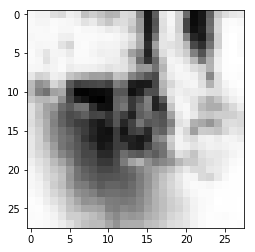

In [12]:
# test the neural network with our own images
item = 200
matplotlib.pyplot.imshow(test_dataset[item][1:].reshape(28,28), cmap='Greys', interpolation='None')
correct_label = test_dataset[item][0]
print(correct_label)
inputs = test_dataset[item][1:]
outputs = n.query(inputs)
print (outputs)
label = numpy.argmax(outputs)
print("network says ", label)
if (label == correct_label):
    print ("match!")
else:
    print ("no match!")
    pass

In [8]:
# test the neural network
scorecard = []
for record in test_dataset:
    # print(record)
    correct_label = int(record[0])
    inputs = test_dataset[item][1:]
    outputs = n.query(inputs)
    label = numpy.argmax(outputs)
    if (label == correct_label):
        scorecard.append(1)
    else:
        scorecard.append(0)
        pass
    pass
scorecard_array = numpy.asarray(scorecard)
print ("performance = ", scorecard_array.sum() / scorecard_array.size)

performance =  0.5384615384615384
